## **The dataset used below is obtained from the Yahoo Finance Website**

In [1]:
!pip install -q yfinance==0.2.31

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.6/65.6 kB 4.6 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# For reading stock data from yahoo
from pandas_datareader.data import DataReader
import yfinance as yf
from pandas_datareader import data as pdr

yf.pdr_override()

# For time stamps
from datetime import datetime


# The tech stocks we'll use for this analysis
tech_list = ['AAPL', 'MSFT', 'AMZN', 'GOOG', 'FB', 'TSLA', 'BRK-B', 'V', 'JPM', 'JNJ',
    'WMT', 'PG', 'DIS', 'MA', 'NVDA', 'HD', 'UNH', 'BAC', 'VZ', 'ADBE',
    'CMCSA', 'NFLX', 'INTC', 'T', 'PFE', 'KO', 'CSCO', 'PEP', 'ABT', 'CVX',
    'XOM', 'MRK', 'NKE', 'ORCL', 'TMO', 'ABBV', 'ACN', 'MDT', 'COST', 'HON',
    'DHR', 'MCD', 'TXN', 'NEE', 'AVGO', 'QCOM', 'PM', 'AMGN', 'UNP', 'IBM',
    'LOW', 'LIN', 'SBUX', 'USB', 'MS', 'CVS', 'BA', 'CAT', 'MMM', 'AXP',
    'AMD', 'BLK', 'GS', 'GE', 'RTN', 'BK', 'FDX', 'WBA', 'APD', 'COF',
    'BDX', 'GD', 'SPG', 'ICE', 'NSC', 'CI', 'NOW', 'FIS', 'GILD', 'COP',
    'ILMN', 'NEM', 'WM', 'EMR', 'EW', 'PLD', 'F', 'PSX', 'EOG', 'AGN',
    'AEP', 'KLAC', 'ROST', 'TEL', 'WLTW', 'MAR', 'PRU', 'CAH', 'FISV', 'LHX']

# Set up End and Start times for data grab

end = datetime.now()
start = datetime(end.year - 5, end.month, end.day)

for stock in tech_list:
    globals()[stock] = yf.download(stock, start, end)


# company_list = [AAPL, MSFT, AMZN, GOOG, FB, TSLA, BRK-B, V, JPM, JNJ,
#     WMT, PG, DIS, MA, NVDA, HD, UNH, BAC, VZ, ADBE,
#     CMCSA, NFLX, INTC, T, PFE, KO, CSCO, PEP, ABT, CVX,
#     XOM, MRK, NKE, ORCL, TMO, ABBV, ACN, MDT, COST, HON,
#     DHR, MCD, TXN, NEE, AVGO, QCOM, PM, AMGN, UNP, IBM,
#     LOW, LIN, SBUX, USB, MS, CVS, BA, CAT, MMM, AXP,
#     AMD, BLK, GS, GE, RTN, BK, FDX, WBA, APD, COF,
#     BDX, GD, SPG, ICE, NSC, CI, NOW, FIS, GILD, COP,
#     ILMN, NEM, WM, EMR, EW, PLD, F, PSX, EOG, AGN,
#     AEP, KLAC, ROST, TEL, WLTW, MAR, PRU, CAH, FISV, LHX]

company_names = [
    "APPLE", "MICROSOFT", "AMAZON", "GOOGLE", "FACEBOOK", "TESLA", "BERKSHIRE HATHAWAY", "VISA", "JPMORGAN CHASE", "JOHNSON & JOHNSON",
    "WALMART", "PROCTER & GAMBLE", "DISNEY", "MASTERCARD", "NVIDIA", "HOME DEPOT", "UNITEDHEALTH", "BANK OF AMERICA", "VERIZON", "ADOBE",
    "COMCAST", "NETFLIX", "INTEL", "AT&T", "PFIZER", "COCA-COLA", "CISCO", "PEPSICO", "ABBOTT", "CHEVRON",
    "EXXON MOBIL", "MERCK", "NIKE", "ORACLE", "THERMO FISHER", "ABBVIE", "ACCENTURE", "MEDTRONIC", "COSTCO", "HONEYWELL",
    "DANAHER", "MCDONALD'S", "TEXAS INSTRUMENTS", "NEXTERA ENERGY", "BROADCOM", "QUALCOMM", "PHILIP MORRIS", "AMGEN", "UNION PACIFIC", "IBM",
    "LOWE'S", "LINDE", "STARBUCKS", "US BANCORP", "MORGAN STANLEY", "CVS HEALTH", "BOEING", "CATERPILLAR", "3M", "AMERICAN EXPRESS",
    "ADVANCED MICRO DEVICES", "BLACKROCK", "GOLDMAN SACHS", "GENERAL ELECTRIC", "RAYTHEON TECHNOLOGIES", "BANK OF NEW YORK MELLON", "FEDEX", "WALGREENS BOOTS ALLIANCE", "AIR PRODUCTS & CHEMICALS", "CAPITAL ONE",
    "BECTON DICKINSON", "GENERAL DYNAMICS", "SIMON PROPERTY GROUP", "INTERCONTINENTAL EXCHANGE", "NORFOLK SOUTHERN", "CIGNA", "SERVICENOW", "FIDELITY NATIONAL INFORMATION SERVICES", "GILEAD SCIENCES", "CONOCOPHILLIPS",
    "ILLUMINA", "NEWMONT", "WASTE MANAGEMENT", "EMERSON ELECTRIC", "EDWARDS LIFESCIENCES", "PROLOGIS", "FORD", "PHILLIPS 66", "EOG RESOURCES", "ALLERGAN",
    "AMERICAN ELECTRIC POWER", "KLA CORPORATION", "ROSS STORES", "TE CONNECTIVITY", "WILLIS TOWERS WATSON", "MARRIOTT INTERNATIONAL", "PRUDENTIAL FINANCIAL", "CARDINAL HEALTH", "FISERV", "L3HARRIS TECHNOLOGIES"
]

company_list = []
for ticker in tech_list:
    data = yf.download(ticker, start=start, end=end)
    company_list.append(data)

# Add company names to the data
for company, com_name in zip(company_list, company_names):
    company["company_name"] = com_name

# Concatenate all data into a single DataFrame
df = pd.concat(company_list, axis=0)
df.tail(10)



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FB']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTN']: Exception('%ticker%: No timezone found, symbol may be delisted')


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGN']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['WLTW']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FB']: Exception('%ticker%: No timezone found, symbol may be delisted')


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTN']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGN']: Exception('%ticker%: No timezone found, symbol may be delisted')


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['WLTW']: Exception('%ticker%: No timezone found, symbol may be delisted')


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
<ipython-input-2-47e8de67bab7>:76: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  df = pd.concat(company_list, axis=0)


,Open,High,Low,Close,Adj Close,Volume,company_name
Date,,,,,,,
2024-11-12,265.000000,265.649994,261.000000,261.720001,260.490875,949500.0,L3HARRIS TECHNOLOGIES
2024-11-13,262.570007,265.609985,261.179993,261.649994,260.421204,610300.0,L3HARRIS TECHNOLOGIES
2024-11-14,261.200012,261.769989,247.270004,248.160004,246.994553,1299800.0,L3HARRIS TECHNOLOGIES
2024-11-15,247.520004,250.289993,245.500000,247.000000,245.839996,1910700.0,L3HARRIS TECHNOLOGIES
2024-11-18,246.470001,247.550003,243.839996,244.270004,244.270004,741600.0,L3HARRIS TECHNOLOGIES
2024-11-19,246.100006,246.589996,242.580002,243.580002,243.580002,784100.0,L3HARRIS TECHNOLOGIES
2024-11-20,242.539993,244.440002,241.100006,244.360001,244.360001,806600.0,L3HARRIS TECHNOLOGIES
2024-11-21,244.410004,248.470001,243.509995,246.600006,246.600006,858800.0,L3HARRIS TECHNOLOGIES
2024-11-22,247.160004,248.559998,246.449997,248.160004,248.160004,655800.0,L3HARRIS TECHNOLOGIES


In [3]:
start = datetime(end.year - 12, end.month-10, end.day-24)
start

datetime.datetime(2012, 1, 1, 0, 0)

In [4]:
df.head()

,Open,High,Low,Close,Adj Close,Volume,company_name
Date,,,,,,,
2019-11-25,65.677498,66.610001,65.629997,66.592499,64.560265,84020400.0,APPLE
2019-11-26,66.735001,66.790001,65.625000,66.072502,64.056152,105207600.0,APPLE
2019-11-27,66.394997,66.995003,66.327499,66.959999,64.916542,65235600.0,APPLE
2019-11-29,66.650002,67.000000,66.474998,66.812500,64.773560,46617600.0,APPLE
2019-12-02,66.817497,67.062500,65.862503,66.040001,64.024635,94487200.0,APPLE


In [ ]:
TSLA.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1.259000e+03
mean,206.061640,210.675043,201.151649,206.013705,206.013705,1.265622e+08
std,83.061673,84.770534,81.071135,82.895592,82.895592,8.226040e+07
min,21.959999,22.084000,21.806667,21.927999,21.927999,2.940180e+07
25%,168.805000,173.685005,166.334999,169.314995,169.314995,7.618320e+07
50%,218.286667,222.279999,212.686661,217.800003,217.800003,1.032214e+08
75%,255.910004,260.720001,250.533333,256.544998,256.544998,1.469826e+08
max,411.470001,414.496674,405.666656,409.970001,409.970001,9.140820e+08


In [ ]:
TSLA.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1259 entries, 2019-11-25 to 2024-11-25
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       1259 non-null   float64
 1   High       1259 non-null   float64
 2   Low        1259 non-null   float64
 3   Close      1259 non-null   float64
 4   Adj Close  1259 non-null   float64
 5   Volume     1259 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 68.9 KB


ValueError: num must be an integer with 1 <= num <= 12, not 13

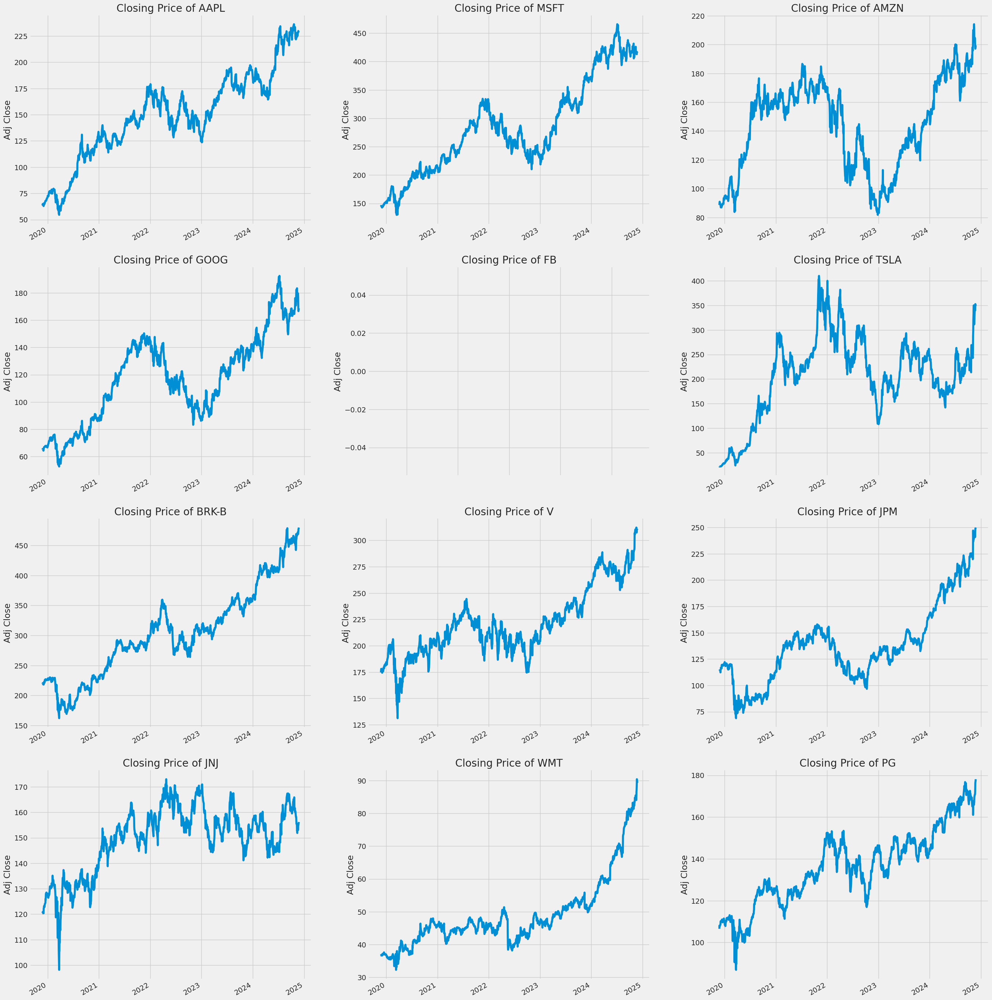

In [ ]:
num_companies = 10
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_companies / num_cols))  # Calculate the number of rows needed

plt.figure(figsize=(30, 25))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    # Create subplot using calculated rows and columns
    plt.subplot(num_rows, num_cols, i)
    company['Adj Close'].plot()
    plt.ylabel('Adj Close')
    plt.xlabel(None)
    plt.title(f"Closing Price of {tech_list[i - 1]}")

plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 12, not 13

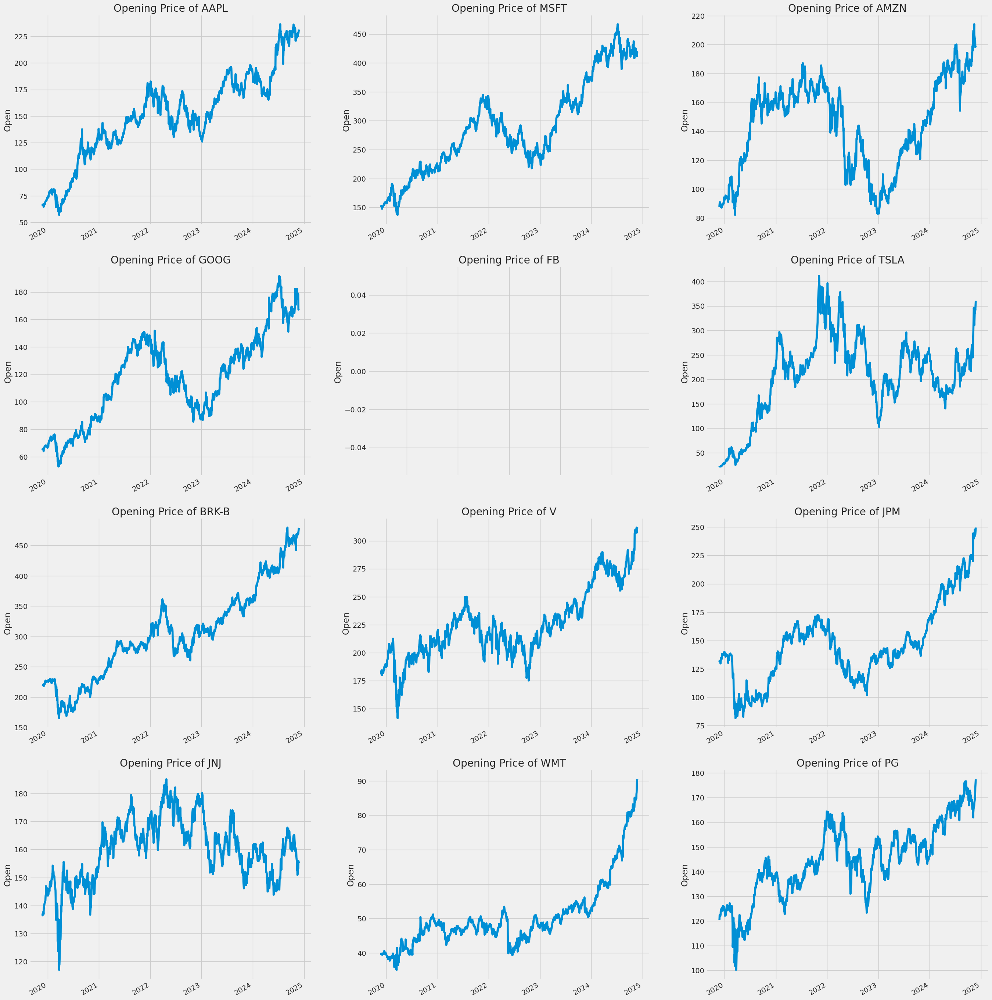

In [ ]:
num_companies = 10
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_companies / num_cols))  # Calculate the number of rows needed

plt.figure(figsize=(30, 25))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    # Create subplot using calculated rows and columns
    plt.subplot(num_rows, num_cols, i)
    company['Open'].plot()
    plt.ylabel('Open')
    plt.xlabel(None)
    plt.title(f"Opening Price of {tech_list[i - 1]}")

plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 12, not 13

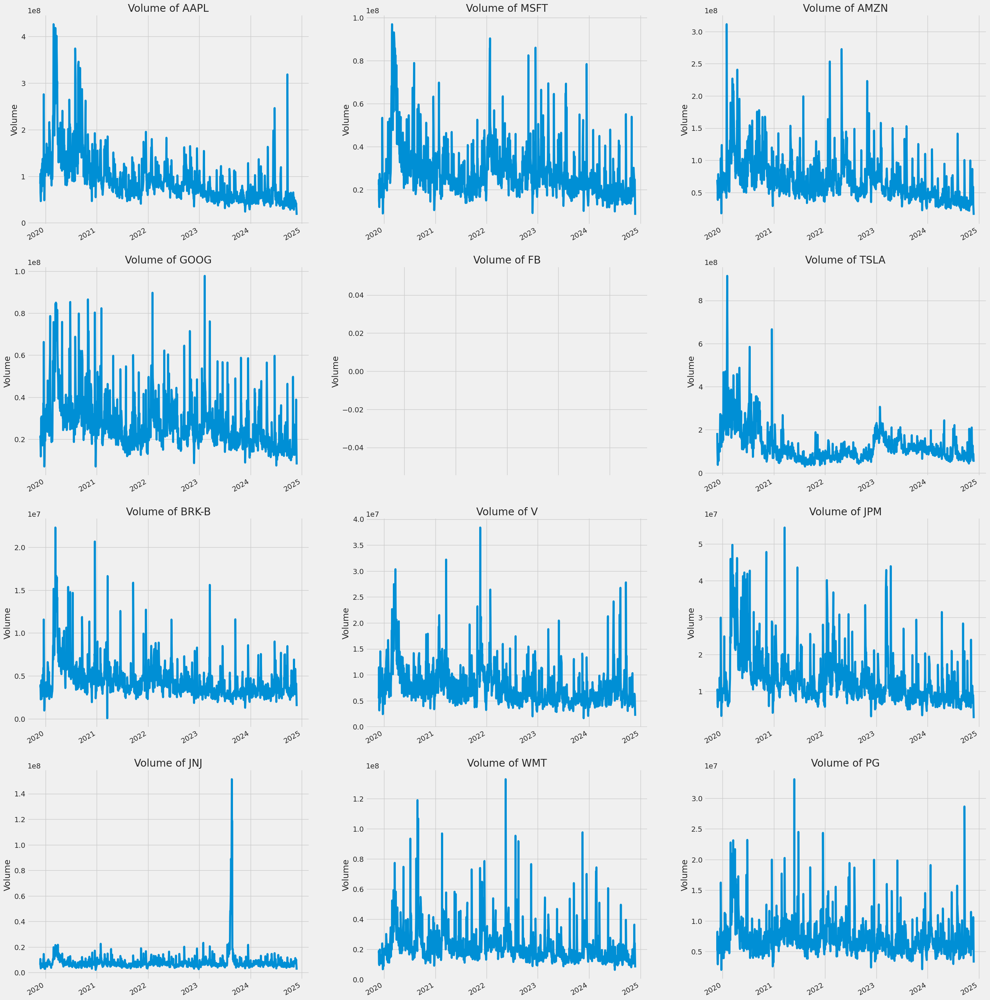

In [ ]:
num_companies = 10
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_companies / num_cols))  # Calculate the number of rows needed

plt.figure(figsize=(30, 25))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    # Create subplot using calculated rows and columns
    plt.subplot(num_rows, num_cols, i)
    company['Volume'].plot()
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Volume of {tech_list[i - 1]}")

plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 12, not 13

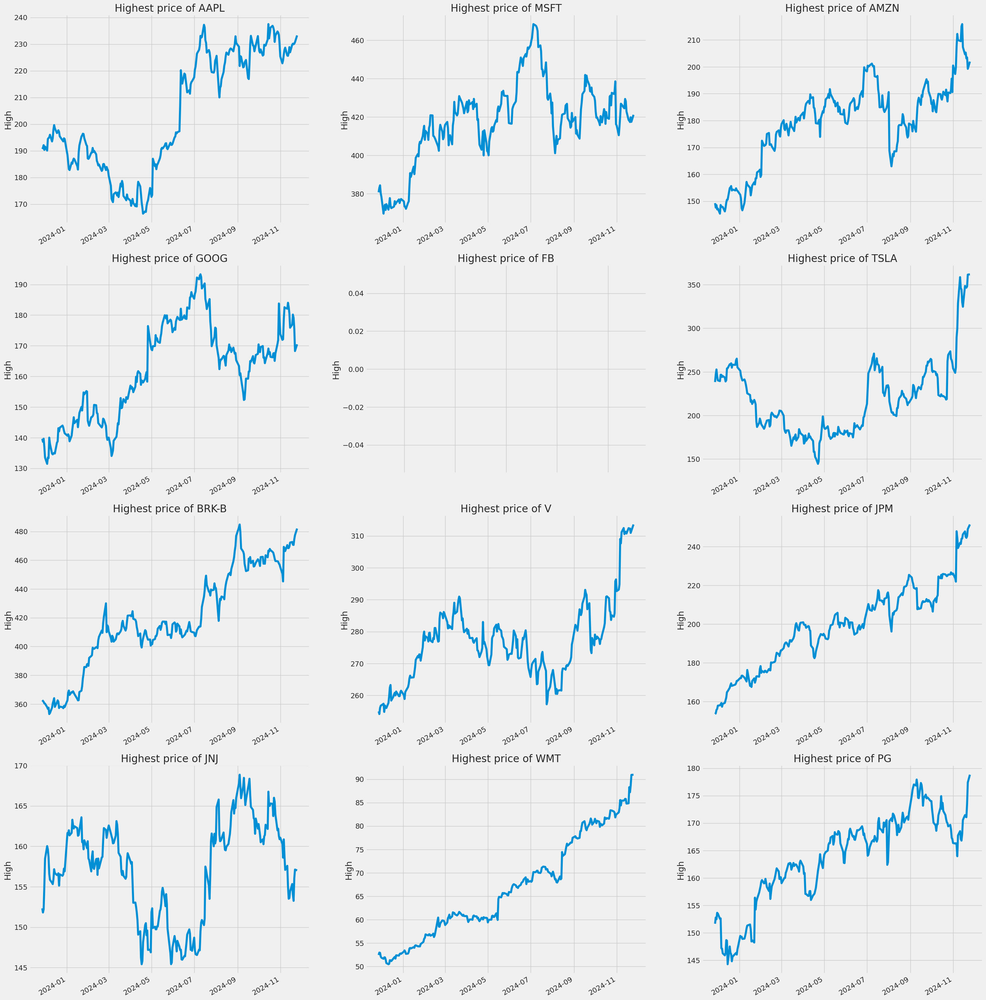

In [ ]:
num_companies = 10
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_companies / num_cols))  # Calculate the number of rows needed

plt.figure(figsize=(30, 25))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    # Create subplot using calculated rows and columns
    plt.subplot(num_rows, num_cols, i)
    company['High'].plot()
    plt.ylabel('High')
    plt.xlabel(None)
    plt.title(f"Highest price of {tech_list[i - 1]}")

plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 12, not 13

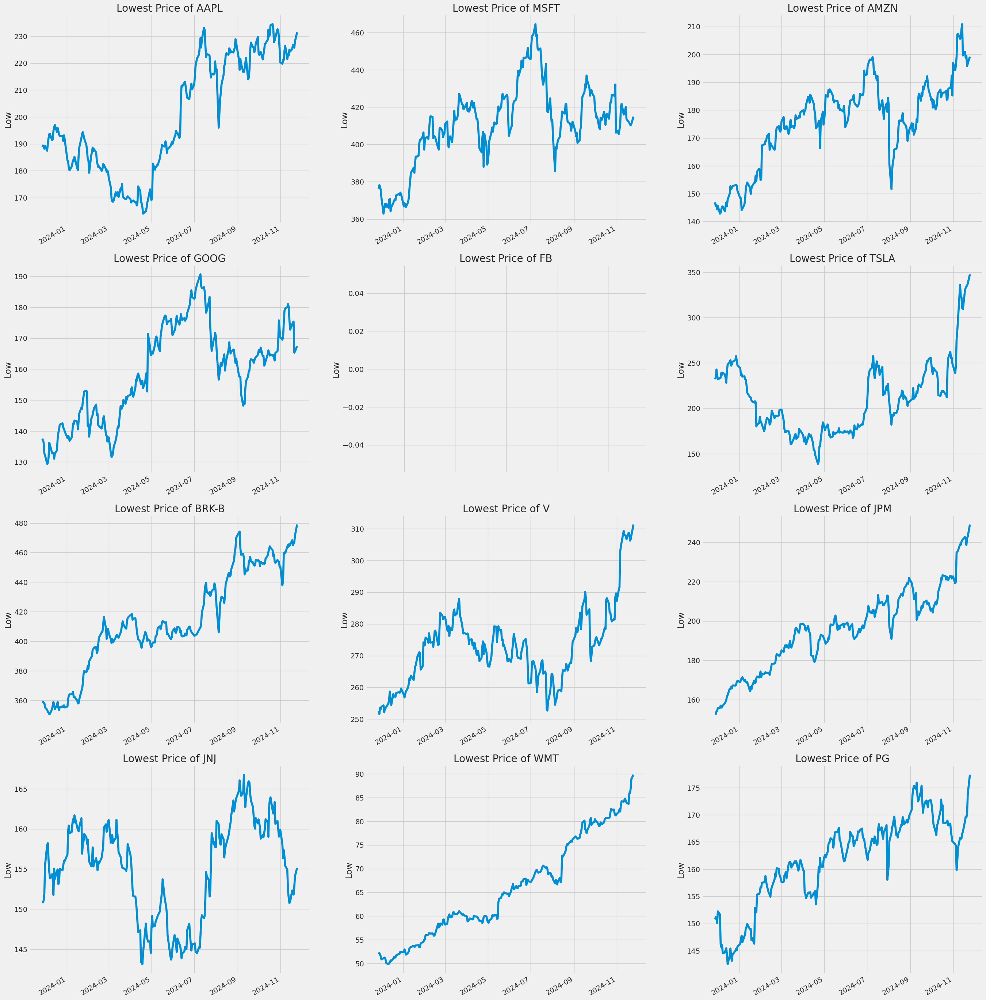

In [ ]:
num_companies = 10
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_companies / num_cols))  # Calculate the number of rows needed

plt.figure(figsize=(30, 25))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    # Create subplot using calculated rows and columns
    plt.subplot(num_rows, num_cols, i)
    company['Low'].plot()
    plt.ylabel('Low')
    plt.xlabel(None)
    plt.title(f"Lowest Price of {tech_list[i - 1]}")

plt.tight_layout()

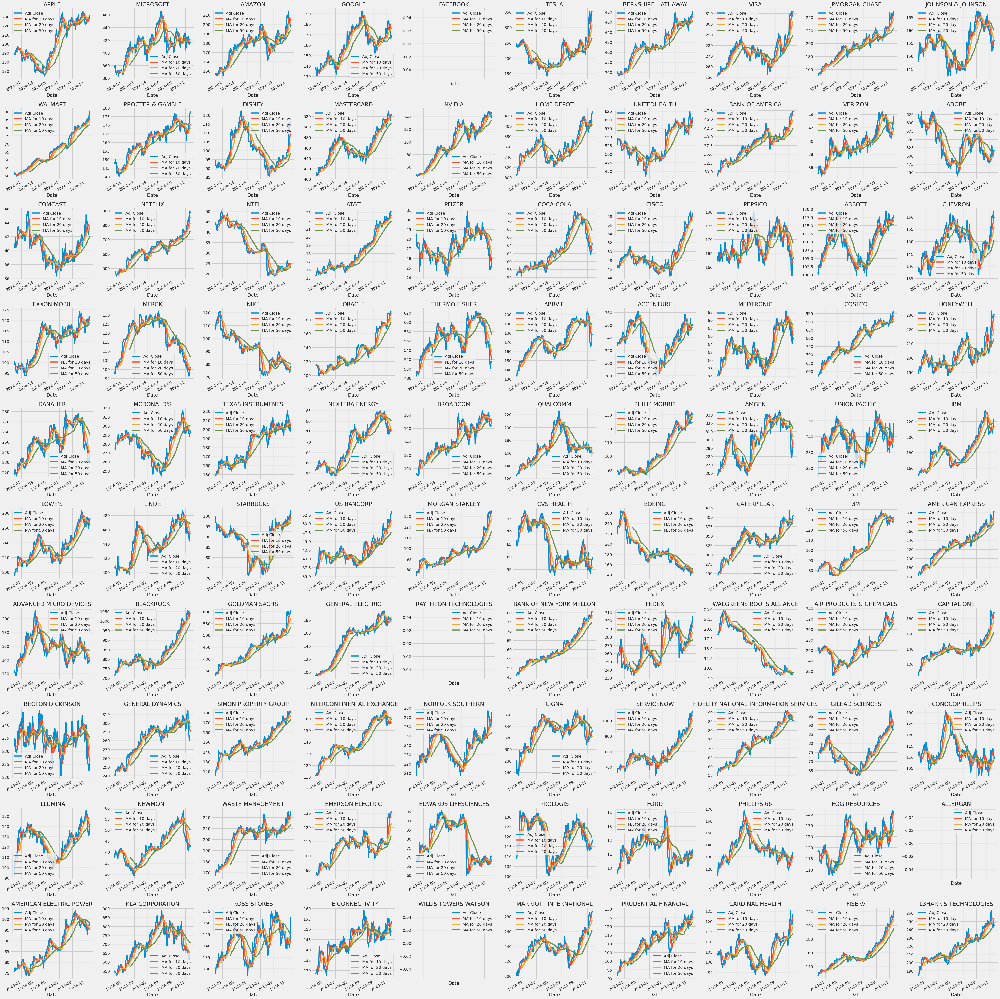

In [ ]:
ma_day = [10, 20, 50]

for ma in ma_day:
    for company in company_list:
        column_name = f"MA for {ma} days"
        company[column_name] = company['Adj Close'].rolling(ma).mean()

fig, axes = plt.subplots(nrows=10, ncols=10)
fig.set_figheight(50)
fig.set_figwidth(50)

for i, company in enumerate(company_list):
    row, col = divmod(i, 10)
    company[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[row, col])
    axes[row, col].set_title(company_names[i])

fig.tight_layout()

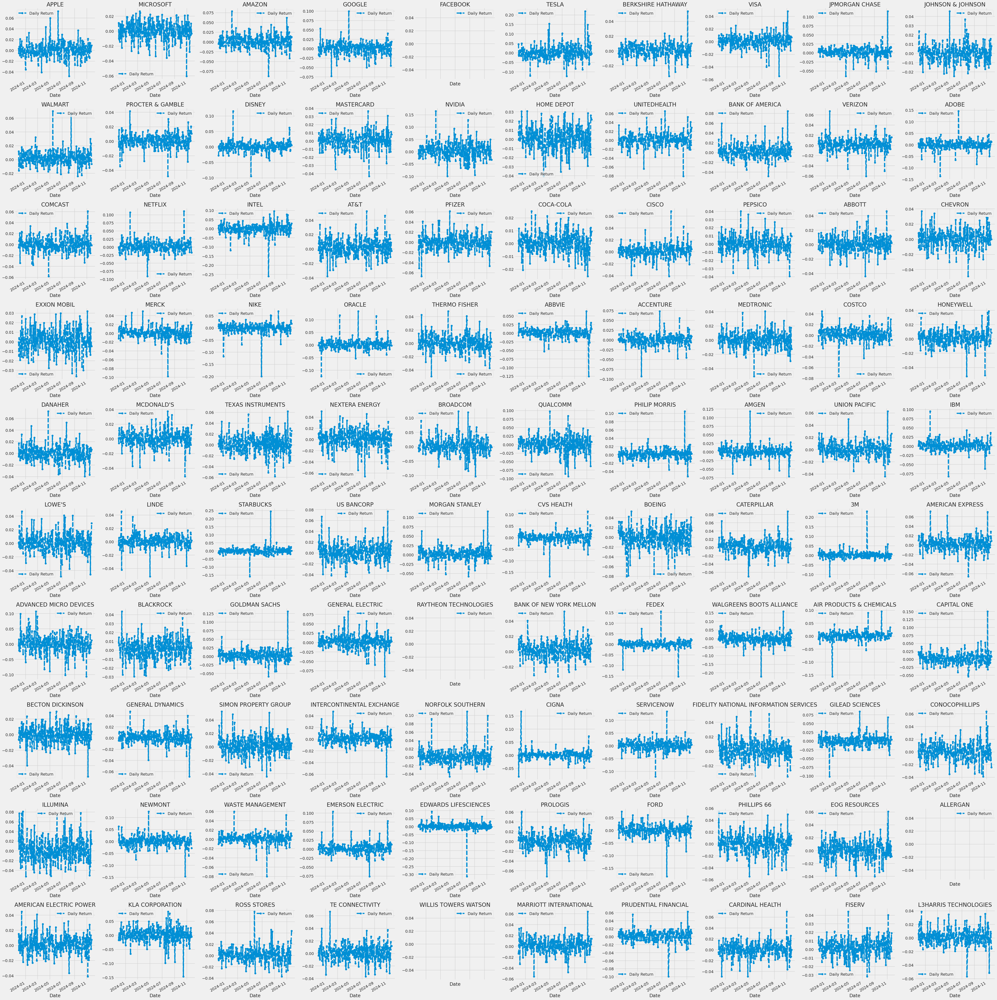

In [ ]:
# We'll use pct_change to find the percent change for each day
for company in company_list:
    company['Daily Return'] = company['Adj Close'].pct_change()

# Then we'll plot the daily return percentage
fig, axes = plt.subplots(nrows=10, ncols=10)
fig.set_figheight(50)
fig.set_figwidth(50)

for i, company in enumerate(company_list):
    row, col = divmod(i, 10)
    company['Daily Return'].plot(ax=axes[row, col], legend=True, linestyle='--', marker='o')
    axes[row, col].set_title(company_names[i])

fig.tight_layout()

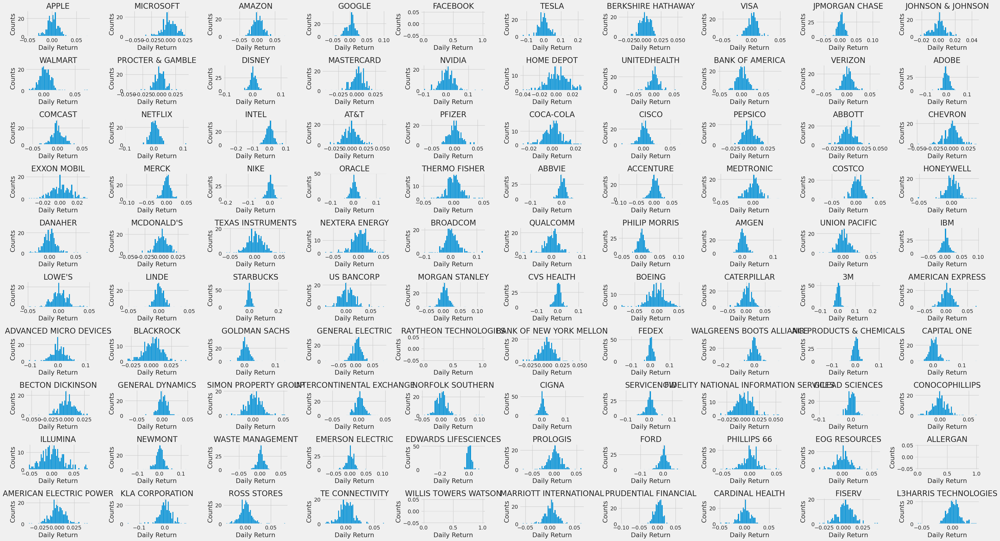

In [ ]:
plt.figure(figsize=(36, 20))

for i, company in enumerate(company_list, 1):
    plt.subplot(10, 10, i)
    company['Daily Return'].hist(bins=50)
    plt.xlabel('Daily Return')
    plt.ylabel('Counts')
    plt.title(f'{company_names[i - 1]}')

plt.tight_layout()

In [5]:
# Grab all the closing prices for the tech stock list into one DataFrame
closing_df = pdr.get_data_yahoo(tech_list, start=start, end=end)['Adj Close']

# Make a new tech returns DataFrame
tech_rets = closing_df.pct_change()
tech_rets.head()

[*                      2%%                      ]  2 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**                     4%%                      ]  4 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[***                    7%%                      ]  7 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*****                 11%%                      ]  11 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*******               14%%                      ]  14 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[********              17%%                      ]  17 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********            20%%                      ]  20 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[************          24%%                      ]  24 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timede

[*************         27%%                      ]  27 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timede

[**************        30%%                      ]  30 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[****************      33%%                      ]  33 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*****************     36%%                      ]  36 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*******************   40%%                      ]  40 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[********************  42%%                      ]  42 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************45%%                      ]  45 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************48%%                      ]  48 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************51%%                      ]  51 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************54%%                      ]  54 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timede

[**********************59%%**                    ]  59 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************62%%****                  ]  62 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timede

[**********************65%%*****                 ]  65 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************66%%******                ]  66 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************70%%********              ]  70 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************73%%*********             ]  73 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************75%%**********            ]  75 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************78%%***********           ]  78 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************82%%*************         ]  82 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************85%%***************       ]  85 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************88%%****************      ]  88 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************90%%*****************     ]  90 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************93%%*******************   ]  93 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************95%%********************  ]  95 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[**********************98%%********************* ]  98 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  100 of 100 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
ERROR:yfinance:
4 Failed downloads:
ERROR:yfinance:['AGN', 'FB', 'WLTW', 'RTN']: Exception('%ticker%: No timezone found, symbol may be delisted')


<ipython-input-5-c3b6f970bd4a>:5: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  tech_rets = closing_df.pct_change()


,AAPL,ABBV,ABT,ACN,ADBE,AEP,AGN,AMD,AMGN,AMZN,...,UNH,UNP,USB,V,VZ,WBA,WLTW,WM,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,,
2012-01-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-04 00:00:00,0.005374,NaN,-0.003879,-0.000378,-0.010150,0.003189,NaN,-0.003650,-0.005459,-0.008490,...,0.014566,0.007222,-0.000362,-0.017866,-0.013088,-0.006957,NaN,-0.014921,-0.010277,0.000233
2012-01-05 00:00:00,0.011102,NaN,-0.002301,-0.019082,0.007072,0.001223,NaN,0.000000,0.010194,0.000563,...,0.006700,-0.007262,0.014871,0.007514,-0.006886,-0.003350,NaN,0.008037,-0.004857,-0.003022
2012-01-06 00:00:00,0.010454,NaN,-0.009048,-0.001733,0.008427,-0.003907,NaN,-0.005495,0.005434,0.028152,...,0.003612,-0.004260,-0.008221,-0.011775,-0.002862,0.011002,NaN,0.011653,-0.007068,-0.007463
2012-01-09 00:00:00,-0.001586,NaN,-0.000179,-0.001736,-0.006616,0.004658,NaN,0.029466,-0.008647,-0.022178,...,-0.001136,0.018228,0.017658,-0.008043,0.001044,0.012697,NaN,-0.001515,0.003051,0.004464


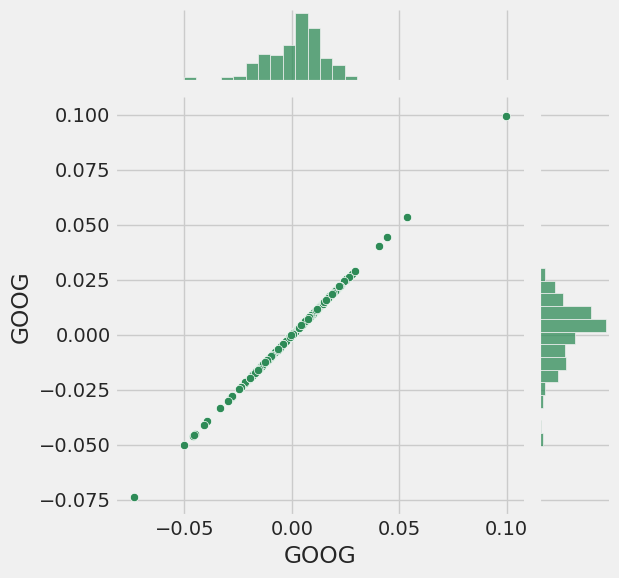

In [ ]:
sns.jointplot(x='GOOG', y='GOOG', data=tech_rets, kind='scatter', color='seagreen')


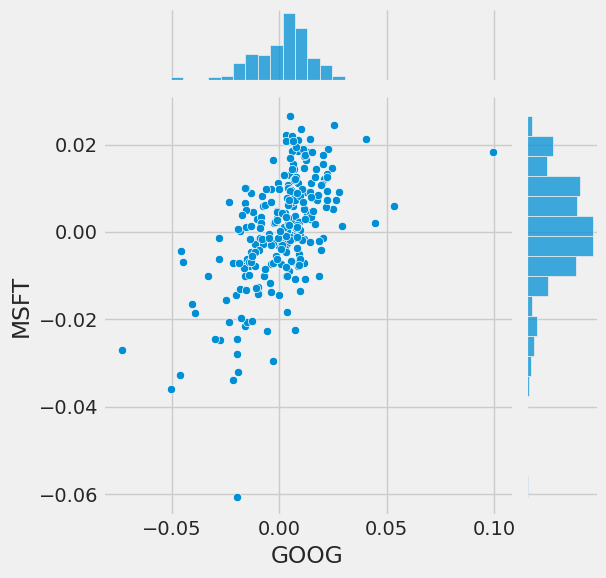

In [ ]:
sns.jointplot(x='GOOG', y='MSFT', data=tech_rets, kind='scatter')


In [ ]:
sns.pairplot(tech_rets[:3], kind='reg')

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7f7a65a4a4d0> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f7a65a491b0> (for post_execute):


KeyboardInterrupt: 

In [6]:
stock_data = {}
models = {}
scalers = {}
predictions = {}


In [ ]:
# Get the stock quote
df = pdr.get_data_yahoo('AAPL', start=start, end=datetime.now())
# Show teh data
df

[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-01-03,14.621429,14.732143,14.607143,14.686786,12.388995,302220800
2012-01-04,14.642857,14.810000,14.617143,14.765714,12.455576,260022000
2012-01-05,14.819643,14.948214,14.738214,14.929643,12.593859,271269600
2012-01-06,14.991786,15.098214,14.972143,15.085714,12.725512,318292800
2012-01-09,15.196429,15.276786,15.048214,15.061786,12.705331,394024400
...,...,...,...,...,...,...
2024-11-19,226.979996,230.160004,226.660004,228.279999,228.279999,36211800
2024-11-20,228.059998,229.929993,225.889999,229.000000,229.000000,35169600
2024-11-21,228.880005,230.160004,225.710007,228.520004,228.520004,42108300


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
from sklearn.metrics import mean_squared_error, mean_absolute_error


for ticker in tech_list:
    print(f"Processing {ticker}...")
    try:
        # Download historical data
        data = pdr.get_data_yahoo(ticker, start=start, end=end)
        # data
        if data.empty:
            print(f"No data for {ticker}")
            continue

        # Keep only required columns
        data = data.filter(['Close'])
        dataset = data.values
        training_data_len = int(np.ceil( len(dataset) * .95 ))
        print(training_data_len)

        # Scale the data
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaled_data = scaler.fit_transform(dataset)

        # Create the scaled training data set
        train_data = scaled_data[0:int(training_data_len), :]
        # Split the data into x_train and y_train data sets
        x_train = []
        y_train = []

        for i in range(60, len(train_data)):
            x_train.append(train_data[i-60:i, 0])
            y_train.append(train_data[i, 0])
            if i<= 61:
                print(x_train)
                print(y_train)
                print()

        # Convert the x_train and y_train to numpy arrays
        x_train, y_train = np.array(x_train), np.array(y_train)

        # Reshape the data
        x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

        # Build the LSTM model
        model = Sequential()
        model.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1],1)))
        model.add(LSTM(64, return_sequences=False))
        model.add(Dense(25))
        model.add(Dense(y_train.shape[1]))

        # Compile the model
        model.compile(optimizer='adam', loss='mean_squared_error')

        # Train the model
        model.fit(x_train, y_train, batch_size=1, epochs=10, verbose=0)

        # Save the model
        model.save(f'models_close/{ticker}_model.h5')
        print(f"Model for {ticker} saved.")

        test_data = scaled_data[training_data_len - 60: , :]
        # Create the data sets x_test and y_test
        x_test = []
        y_test = dataset[training_data_len:, :]
        for i in range(60, len(test_data)):
            x_test.append(test_data[i-60:i, 0])

        # Convert the data to a numpy array
        x_test = np.array(x_test)

        # Reshape the data
        x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

        # Get the models predicted price values
        predictions = model.predict(x_test)

        # Reshape predictions to 2D before inverse_transform
        predictions = predictions.reshape(-1, 1)  # Reshape to (num_samples, 1)

        predictions = scaler.inverse_transform(predictions)


        # Get the root mean squared error (RMSE)
        rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
        rmse

    except Exception as e:
        print(f"Error processing {ticker}: {e}")
        continue

Processing AAPL...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.00332215, 0.00367683, 0.00441348, 0.00511482, 0.00500729,
       0.00524963, 0.00513889, 0.00495273, 0.00469915, 0.00548395,
       0.00619171, 0.00597344, 0.00477779, 0.00591888, 0.00479545,
       0.00900831, 0.00868252, 0.00910782, 0.01002743, 0.01058432,
       0.01053778, 0.01036606, 0.0110979 , 0.0117864 , 0.01256638,
       0.01382623, 0.01647271, 0.01651284, 0.01798614, 0.0190871 ,
       0.01719492, 0.01792354, 0.0179091 , 0.01995214, 0.01966165,
       0.02019929, 0.02116544, 0.02170309, 0.02325182, 0.02438006,
       0.02470586, 0.02481981, 0.02289072, 0.02242529, 0.02249431,
       0.02430785, 0.02481821, 0.02591436, 0.02849824, 0.03194558,
       0.0313004 , 0.03130201, 0.03379442, 0.03457441, 0.03401911,
       0.03351196, 0.03298395, 0.0347381 , 0.03594178, 0.03644572])]
[0.03520031440172121]

[array([0.00332215, 0.00367683, 0.00441348, 0.00511482, 0.00500729,
       0.00524963, 0.00513889, 0.00495273, 0.00469915, 0.00548395,
       0.00619171, 0.00597344

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.00090664, 0.00233459, 0.00296924, 0.00394388, 0.00310524,
       0.0033319 , 0.0030599 , 0.00369455, 0.0042612 , 0.00428387,
       0.00421587, 0.00396655, 0.00757043, 0.00761576, 0.00673179,
       0.00723044, 0.00709445, 0.00648246, 0.00734377, 0.00716245,
       0.00797842, 0.00811442, 0.00877173, 0.00868107, 0.00902106,
       0.0097237 , 0.00997303, 0.00936104, 0.00954237, 0.0087944 ,
       0.00834107, 0.01115166, 0.01106099, 0.01149165, 0.01110633,
       0.01133299, 0.01158231, 0.01128765, 0.01246628, 0.01217162,
       0.01341826, 0.01294227, 0.01230762, 0.01176364, 0.01239828,
       0.0127836 , 0.01273827, 0.01285161, 0.01427956, 0.01450622,
       0.01468754, 0.0141209 , 0.01321426, 0.01273827, 0.01255695,
       0.01276094, 0.0127836 , 0.01409823, 0.01393957, 0.01319159])]
[0.013032929430421614]

[array([0.00090664, 0.00233459, 0.00296924, 0.00394388, 0.00310524,
       0.0033319 , 0.0030599 , 0.00369455, 0.0042612 , 0.00428387,
       0.00421587, 0.0039665

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.00075498, 0.00038479, 0.00040915, 0.00162686, 0.00064052,
       0.00083048, 0.00072332, 0.        , 0.00060642, 0.00139549,
       0.00329025, 0.00451039, 0.00365313, 0.00247438, 0.00269601,
       0.00289084, 0.00423519, 0.00473445, 0.00395025, 0.00450796,
       0.0008597 , 0.00141011, 0.00286162, 0.00175593, 0.00201166,
       0.00232582, 0.00220405, 0.00234044, 0.00381387, 0.00374324,
       0.00207985, 0.00097417, 0.00160007, 0.00154162, 0.00113247,
       0.00072088, 0.00077933, 0.00063321, 0.00191667, 0.00091572,
       0.00100096, 0.00082074, 0.00105453, 0.00125667, 0.00190937,
       0.00285187, 0.00204331, 0.00181682, 0.00210907, 0.00154162,
       0.00207011, 0.0022211 , 0.00233557, 0.00399409, 0.00384796,
       0.00401113, 0.00465408, 0.00656102, 0.00718692, 0.00614456])]
[0.006984780941707715]

[array([0.00075498, 0.00038479, 0.00040915, 0.00162686, 0.00064052,
       0.00083048, 0.00072332, 0.        , 0.00060642, 0.00139549,
       0.00329025, 0.0045103

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FB']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data for FB
Processing TSLA...


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.00086343, 0.00080303, 0.00070674, 0.00067246, 0.00072796,
       0.00078834, 0.00088791, 0.00089117, 0.        , 0.00062186,
       0.00065614, 0.00064798, 0.00062186, 0.00064961, 0.0007557 ,
       0.00084547, 0.00100379, 0.00106745, 0.00110662, 0.00102501,
       0.00110825, 0.00121761, 0.00136451, 0.0014706 , 0.00143796,
       0.00149182, 0.00159791, 0.00135634, 0.00142   , 0.00169421,
       0.00176439, 0.00185906, 0.001988  , 0.00191129, 0.00186559,
       0.00191618, 0.00178887, 0.00176766, 0.00179867, 0.00173338,
       0.0018966 , 0.00183621, 0.00179214, 0.00168441, 0.00168605,
       0.00167789, 0.00195046, 0.00215775, 0.00217081, 0.00204023,
       0.0019929 , 0.00204513, 0.00198963, 0.00198637, 0.00201738,
       0.00189497, 0.00184274, 0.00238462, 0.00247276, 0.00245807])]
[0.0023731972591546557]

[array([0.00086343, 0.00080303, 0.00070674, 0.00067246, 0.00072796,
       0.00078834, 0.00088791, 0.00089117, 0.        , 0.00062186,
       0.00065614, 0.000647

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.00344639, 0.00126451, 0.00158683, 0.00024794, 0.        ,
       0.00280174, 0.00423981, 0.00547952, 0.00366953, 0.00416543,
       0.00652087, 0.00818208, 0.00897551, 0.00709115, 0.00542994,
       0.00882673, 0.00835566, 0.00776058, 0.00595061, 0.0051572 ,
       0.00587623, 0.00604979, 0.00919865, 0.00882673, 0.00890111,
       0.00835566, 0.0072151 , 0.00619855, 0.00781018, 0.00652087,
       0.00441337, 0.00649609, 0.00776058, 0.00828126, 0.00654567,
       0.00763662, 0.00929783, 0.0098185 , 0.00781018, 0.00535554,
       0.00617375, 0.00495884, 0.00714073, 0.00540514, 0.00627293,
       0.00639691, 0.0077358 , 0.00805812, 0.01108301, 0.01095904,
       0.01252106, 0.01185163, 0.0128682 , 0.0127938 , 0.01219875,
       0.01150451, 0.01262024, 0.01500049, 0.01356244, 0.01361202])]
[0.012545863715801686]

[array([0.00344639, 0.00126451, 0.00158683, 0.00024794, 0.        ,
       0.00280174, 0.00423981, 0.00547952, 0.00366953, 0.00416543,
       0.00652087, 0.0081820

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.00337529, 0.00177464, 0.00243578, 0.00139187, 0.00068724,
       0.00060025, 0.        , 0.00193992, 0.00141797, 0.00297513,
       0.00406253, 0.00283594, 0.00127878, 0.00042626, 0.00165285,
       0.00126138, 0.00152236, 0.00168765, 0.00066984, 0.00133098,
       0.00295773, 0.00604595, 0.00688977, 0.00717685, 0.00684628,
       0.00803807, 0.01157864, 0.01286613, 0.01183092, 0.01403182,
       0.01391003, 0.01277914, 0.01383174, 0.0131271 , 0.01500613,
       0.01511053, 0.01603264, 0.01544109, 0.01725922, 0.01501483,
       0.01571947, 0.01483215, 0.01490174, 0.01368385, 0.01437979,
       0.01640671, 0.01571077, 0.01515402, 0.01579776, 0.0153454 ,
       0.01556288, 0.01528451, 0.01716353, 0.01514532, 0.0153454 ,
       0.01580646, 0.01711134, 0.01822484, 0.01800736, 0.01760719])]
[0.01730272297961022]

[array([0.00337529, 0.00177464, 0.00243578, 0.00139187, 0.00068724,
       0.00060025, 0.        , 0.00193992, 0.00141797, 0.00297513,
       0.00406253, 0.00283594

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.01818431, 0.01804725, 0.02138256, 0.0199205 , 0.01964636,
       0.02307305, 0.0258601 , 0.02672819, 0.02247909, 0.01786449,
       0.02531183, 0.02709371, 0.02905835, 0.03042902, 0.03042902,
       0.03015488, 0.02965231, 0.028373  , 0.02745922, 0.02878421,
       0.03015488, 0.02992644, 0.03326175, 0.0326221 , 0.03138849,
       0.03335313, 0.03134281, 0.03020058, 0.03335313, 0.03161693,
       0.02924111, 0.03198246, 0.03412986, 0.03408416, 0.03230228,
       0.03422124, 0.03326175, 0.03682552, 0.03751085, 0.03764793,
       0.0428108 , 0.04399873, 0.04294788, 0.03801343, 0.04089186,
       0.04313062, 0.04582629, 0.04358752, 0.05660894, 0.05747705,
       0.06259424, 0.06200027, 0.06396491, 0.06570111, 0.06451318,
       0.0623658 , 0.06469594, 0.06931054, 0.06803125, 0.06976745])]
[0.06702608167506327]

[array([0.01818431, 0.01804725, 0.02138256, 0.0199205 , 0.01964636,
       0.02307305, 0.0258601 , 0.02672819, 0.02247909, 0.01786449,
       0.02531183, 0.02709371

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.03300329, 0.0297835 , 0.02913952, 0.02455126, 0.02535621,
       0.02752957, 0.0269661 , 0.02777111, 0.02801259, 0.02688565,
       0.02817355, 0.02744912, 0.02809304, 0.02591968, 0.02591968,
       0.02769059, 0.03155436, 0.03042742, 0.03163487, 0.03324483,
       0.03147391, 0.0306689 , 0.03107141, 0.02744912, 0.02801259,
       0.02785156, 0.02503422, 0.02269983, 0.02334381, 0.02278034,
       0.02310233, 0.02527569, 0.02583916, 0.02624167, 0.02591968,
       0.02672462, 0.02157289, 0.02149238, 0.0273686 , 0.02656366,
       0.02455126, 0.02406824, 0.02519524, 0.02068743, 0.02028499,
       0.02471223, 0.02382677, 0.02672462, 0.02857605, 0.02656366,
       0.02648314, 0.02688565, 0.02761008, 0.02559769, 0.02398779,
       0.02157289, 0.02229739, 0.02728809, 0.02913952, 0.03091044])]
[0.030266459514954047]

[array([0.03300329, 0.0297835 , 0.02913952, 0.02455126, 0.02535621,
       0.02752957, 0.0269661 , 0.02777111, 0.02801259, 0.02688565,
       0.02817355, 0.0274491

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.01819451, 0.01530944, 0.01395998, 0.01200559, 0.01284318,
       0.01219171, 0.01386689, 0.01433222, 0.01451837, 0.01596091,
       0.01670542, 0.01949742, 0.02135875, 0.02089343, 0.02312702,
       0.02349929, 0.02117263, 0.01996278, 0.02270821, 0.02298742,
       0.02680316, 0.02568637, 0.02610515, 0.02540716, 0.02452303,
       0.0241973 , 0.02577943, 0.02550022, 0.02498835, 0.02698928,
       0.02484875, 0.02615169, 0.02819917, 0.01698462, 0.01014424,
       0.00986503, 0.01102837, 0.00949279, 0.01167984, 0.01237783,
       0.01116797, 0.01205211, 0.01386689, 0.01186599, 0.01600743,
       0.01558862, 0.01703117, 0.01982317, 0.02131221, 0.0216845 ,
       0.02238249, 0.02056771, 0.02010238, 0.01945091, 0.01926476,
       0.01968357, 0.0201489 , 0.02224289, 0.02173102, 0.02219637])]
[0.02047461933218586]

[array([0.01819451, 0.01530944, 0.01395998, 0.01200559, 0.01284318,
       0.01219171, 0.01386689, 0.01433222, 0.01451837, 0.01596091,
       0.01670542, 0.01949742

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.06373294, 0.06348004, 0.06111951, 0.0597707 , 0.06213117,
       0.0595178 , 0.0540381 , 0.05513402, 0.05513402, 0.05892768,
       0.05698869, 0.05741023, 0.05867478, 0.04830551, 0.04409037,
       0.04813693, 0.04661948, 0.04240434, 0.0332153 , 0.03178217,
       0.0332153 , 0.03414263, 0.02950599, 0.03574438, 0.03734615,
       0.03684032, 0.04021245, 0.0388636 , 0.04181422, 0.04392179,
       0.04451191, 0.04999154, 0.04754682, 0.04341593, 0.04358457,
       0.06027649, 0.06272128, 0.06263696, 0.06845388, 0.07039287,
       0.06229981, 0.06238406, 0.06474453, 0.0638172 , 0.06162537,
       0.06432306, 0.06457596, 0.07115157, 0.07275334, 0.0723318 ,
       0.07089867, 0.06727364, 0.06693642, 0.06693642, 0.0668521 ,
       0.06954979, 0.0687911 , 0.069044  , 0.06643063, 0.06676785])]
[0.06525039410016636]

[array([0.06373294, 0.06348004, 0.06111951, 0.0597707 , 0.06213117,
       0.0595178 , 0.0540381 , 0.05513402, 0.05513402, 0.05892768,
       0.05698869, 0.05741023

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



3084
[array([0.        , 0.00330072, 0.00727383, 0.00977994, 0.00880195,
       0.00806846, 0.00238386, 0.00256723, 0.00055012, 0.00103911,
       0.00433985, 0.00690707, 0.00611247, 0.00574571, 0.00574571,
       0.00764059, 0.00635695, 0.00574571, 0.00415648, 0.00360636,
       0.00623472, 0.00366747, 0.01033006, 0.0131418 , 0.01632028,
       0.0180929 , 0.01968214, 0.01919315, 0.02127139, 0.02011001,
       0.01797065, 0.01974327, 0.02102689, 0.01992664, 0.0180929 ,
       0.01937652, 0.01833741, 0.02035451, 0.02212713, 0.02249389,
       0.02493886, 0.0247555 , 0.02683374, 0.022555  , 0.02102689,
       0.02267726, 0.02402201, 0.02463324, 0.03484106, 0.03160146,
       0.03154034, 0.02982883, 0.03135695, 0.03013448, 0.03031784,
       0.03044009, 0.03264059, 0.03710269, 0.03569682, 0.03178482])]
[0.028728587301269398]

[array([0.        , 0.00330072, 0.00727383, 0.00977994, 0.00880195,
       0.00806846, 0.00238386, 0.00256723, 0.00055012, 0.00103911,
       0.00433985, 0.0069070

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


KeyboardInterrupt: 

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


In [ ]:
for ticker in tech_list:
    print(f"Processing {ticker}...")

    # Get the stock quote
    df = pdr.get_data_yahoo(ticker, start='2012-01-01', end=datetime.now())
    if df.empty:
        print(f"No data found for {ticker}. Skipping...")
        continue
    # Create a new dataframe with only the 'Close column
    data = df.filter(['Close'])
    # Convert the dataframe to a numpy array
    dataset = data.values
    # Get the number of rows to train the model on
    training_data_len = int(np.ceil( len(dataset) * .95 ))

    # Scale the data
    from sklearn.preprocessing import MinMaxScaler

    scaler = MinMaxScaler(feature_range=(0,1))
    scaled_data = scaler.fit_transform(dataset)

    scaled_data

    # Create the training data set
    # Create the scaled training data set
    train_data = scaled_data[0:int(training_data_len), :]
    # Split the data into x_train and y_train data sets
    x_train = []
    y_train = []

    for i in range(60, len(train_data)):
        x_train.append(train_data[i-60:i, 0])
        y_train.append(train_data[i, 0])
        if i<= 61:
            print(x_train)
            print(y_train)
            print()

    # Convert the x_train and y_train to numpy arrays
    x_train, y_train = np.array(x_train), np.array(y_train)

    # Reshape the data
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(x_train, y_train, batch_size=4, epochs=5)

    model.save(f'models_close_prices/{ticker}_model.h5')
    print(f"Model for {ticker} saved.")

    # Create the testing data set
    # Create a new array containing scaled values from index 1543 to 2002
    test_data = scaled_data[training_data_len - 60: , :]
    # Create the data sets x_test and y_test
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(60, len(test_data)):
        x_test.append(test_data[i-60:i, 0])

    # Convert the data to a numpy array
    x_test = np.array(x_test)

    # Reshape the data
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

    # Get the models predicted price values
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Get the root mean squared error (RMSE)
    rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
    print(rmse)


Processing AAPL...
[*********************100%%**********************]  1 of 1 completed
[array([0.00332215, 0.00367683, 0.00441348, 0.00511482, 0.00500729,
       0.00524963, 0.00513889, 0.00495273, 0.00469915, 0.00548395,
       0.00619171, 0.00597344, 0.00477779, 0.00591888, 0.00479545,
       0.00900831, 0.00868252, 0.00910782, 0.01002743, 0.01058432,
       0.01053778, 0.01036606, 0.0110979 , 0.0117864 , 0.01256638,
       0.01382623, 0.01647271, 0.01651284, 0.01798614, 0.0190871 ,
       0.01719492, 0.01792354, 0.0179091 , 0.01995214, 0.01966165,
       0.02019929, 0.02116544, 0.02170309, 0.02325182, 0.02438006,
       0.02470586, 0.02481981, 0.02289072, 0.02242529, 0.02249431,
       0.02430785, 0.02481821, 0.02591436, 0.02849824, 0.03194558,
       0.0313004 , 0.03130201, 0.03379442, 0.03457441, 0.03401911,
       0.03351196, 0.03298395, 0.0347381 , 0.03594178, 0.03644572])]
[0.03520031440172121]

[array([0.00332215, 0.00367683, 0.00441348, 0.00511482, 0.00500729,
       0.00524

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0038
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.4356e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.3191e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.3033e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.5624e-04


Model for AAPL saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
5.804700454298132
Processing MSFT...
[*********************100%%**********************]  1 of 1 completed
[array([0.00090664, 0.00233459, 0.00296924, 0.00394388, 0.00310524,
       0.0033319 , 0.0030599 , 0.00369455, 0.0042612 , 0.00428387,
       0.00421587, 0.00396655, 0.00757043, 0.00761576, 0.00673179,
       0.00723044, 0.00709445, 0.00648246, 0.00734377, 0.00716245,
       0.00797842, 0.00811442, 0.00877173, 0.00868107, 0.00902106,
       0.0097237 , 0.00997303, 0.00936104, 0.00954237, 0.0087944 ,
       0.00834107, 0.01115166, 0.01106099, 0.01149165, 0.01110633,
       0.01133299, 0.01158231, 0.01128765, 0.01246628, 0.01217162,
       0.01341826, 0.01294227, 0.01230762, 0.01176364, 0.01239828,
       0.0127836 , 0.01273827, 0.01285161, 0.01427956, 0.01450622,
       0.01468754, 0.0141209 , 0.01321426, 0.01273827, 0.01255695,
       0.01276094, 0.0127836 , 0.01409823, 0.01393957, 0.01319159])]
[0.013032929430421614]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0025
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.4094e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 1.9289e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.9471e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.3986e-04


Model for MSFT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
7.060937409543679
Processing AMZN...
[*********************100%%**********************]  1 of 1 completed
[array([0.00075498, 0.00038479, 0.00040915, 0.00162686, 0.00064052,
       0.00083048, 0.00072332, 0.        , 0.00060642, 0.00139549,
       0.00329025, 0.00451039, 0.00365313, 0.00247438, 0.00269601,
       0.00289084, 0.00423519, 0.00473445, 0.00395025, 0.00450796,
       0.0008597 , 0.00141011, 0.00286162, 0.00175593, 0.00201166,
       0.00232582, 0.00220405, 0.00234044, 0.00381387, 0.00374324,
       0.00207985, 0.00097417, 0.00160007, 0.00154162, 0.00113247,
       0.00072088, 0.00077933, 0.00063321, 0.00191667, 0.00091572,
       0.00100096, 0.00082074, 0.00105453, 0.00125667, 0.00190937,
       0.00285187, 0.00204331, 0.00181682, 0.00210907, 0.00154162,
       0.00207011, 0.0022211 , 0.00233557, 0.00399409, 0.00384796,
       0.00401113, 0.00465408, 0.00656102, 0.00718692, 0.00614456])]
[0.006984780941707715]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0047
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.8425e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.1893e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.3790e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.0857e-04


Model for AMZN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
10.648319975131065
Processing GOOG...
[*********************100%%**********************]  1 of 1 completed
[array([0.01482114, 0.01522107, 0.01392931, 0.01267657, 0.00883611,
       0.00893087, 0.00932383, 0.00983663, 0.00918866, 0.00968892,
       0.01029231, 0.01122037, 0.00375406, 0.00368856, 0.00304896,
       0.00145481, 0.0012611 , 0.00291657, 0.00259746, 0.00293469,
       0.00303502, 0.00363143, 0.00519493, 0.00697302, 0.00664973,
       0.00707892, 0.00730327, 0.00652989, 0.00740639, 0.00706638,
       0.00648111, 0.00661489, 0.00635291, 0.00765722, 0.00681276,
       0.00655776, 0.00708589, 0.00700367, 0.00826896, 0.00824945,
       0.00882775, 0.0086675 , 0.00769206, 0.0063975 , 0.0066539 ,
       0.00670129, 0.00574118, 0.00642398, 0.00818395, 0.00793453,
       0.00865078, 0.00919563, 0.01044141, 0.01037313, 0.0112775 ,
       0.01212335, 0.01164121, 0.01258041, 0.01225852, 0.01347643])]
[0.012452215025281807]

[a

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0017
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.7836e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.3038e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.7336e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.5261e-04


Model for GOOG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
4.800048567595363
Processing FB...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FB']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for FB. Skipping...
Processing TSLA...


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[array([0.00086343, 0.00080303, 0.00070674, 0.00067246, 0.00072796,
       0.00078834, 0.00088791, 0.00089117, 0.        , 0.00062186,
       0.00065614, 0.00064798, 0.00062186, 0.00064961, 0.0007557 ,
       0.00084547, 0.00100379, 0.00106745, 0.00110662, 0.00102501,
       0.00110825, 0.00121761, 0.00136451, 0.0014706 , 0.00143796,
       0.00149182, 0.00159791, 0.00135634, 0.00142   , 0.00169421,
       0.00176439, 0.00185906, 0.001988  , 0.00191129, 0.00186559,
       0.00191618, 0.00178887, 0.00176766, 0.00179867, 0.00173338,
       0.0018966 , 0.00183621, 0.00179214, 0.00168441, 0.00168605,
       0.00167789, 0.00195046, 0.00215775, 0.00217081, 0.00204023,
       0.0019929 , 0.00204513, 0.00198963, 0.00198637, 0.00201738,
       0.00189497, 0.00184274, 0.00238462, 0.00247276, 0.00245807])]
[0.0023731972591546557]

[array([0.00086343, 0.00080303, 0.00070674, 0.00067246, 0.00072796,
       0.00078834, 0.00088791, 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0039
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 5.3001e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.9080e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.2643e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 3.1732e-04


Model for TSLA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
10.029536585959177
Processing BRK-B...
[*********************100%%**********************]  1 of 1 completed
[array([0.0034487 , 0.00126536, 0.00158789, 0.0002481 , 0.        ,
       0.00280362, 0.00424265, 0.00548319, 0.00367199, 0.00416822,
       0.00652524, 0.00818756, 0.00898152, 0.0070959 , 0.00543358,
       0.00883265, 0.00836125, 0.00776578, 0.0059546 , 0.00516065,
       0.00588017, 0.00605385, 0.00920481, 0.00883265, 0.00890707,
       0.00836125, 0.00721994, 0.0062027 , 0.00781541, 0.00652524,
       0.00441632, 0.00650044, 0.00776578, 0.0082868 , 0.00655005,
       0.00764174, 0.00930406, 0.00982508, 0.00781541, 0.00535913,
       0.00617789, 0.00496216, 0.00714551, 0.00540876, 0.00627713,
       0.0064012 , 0.00774098, 0.00806352, 0.01109044, 0.01096638,
       0.01252945, 0.01185957, 0.01287682, 0.01280237, 0.01220692,
       0.01151222, 0.0126287 , 0.01501053, 0.01357152, 0.01362113])]
[0.012554267748573683]

[

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0022
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.3551e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.7009e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.4355e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.9322e-04


Model for BRK-B saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
5.7398909995709415
Processing V...
[*********************100%%**********************]  1 of 1 completed
[array([0.00337529, 0.00177464, 0.00243578, 0.00139187, 0.00068724,
       0.00060025, 0.        , 0.00193992, 0.00141797, 0.00297513,
       0.00406253, 0.00283594, 0.00127878, 0.00042626, 0.00165285,
       0.00126138, 0.00152236, 0.00168765, 0.00066984, 0.00133098,
       0.00295773, 0.00604595, 0.00688977, 0.00717685, 0.00684628,
       0.00803807, 0.01157864, 0.01286613, 0.01183092, 0.01403182,
       0.01391003, 0.01277914, 0.01383174, 0.0131271 , 0.01500613,
       0.01511053, 0.01603264, 0.01544109, 0.01725922, 0.01501483,
       0.01571947, 0.01483215, 0.01490174, 0.01368385, 0.01437979,
       0.01640671, 0.01571077, 0.01515402, 0.01579776, 0.0153454 ,
       0.01556288, 0.01528451, 0.01716353, 0.01514532, 0.0153454 ,
       0.01580646, 0.01711134, 0.01822484, 0.01800736, 0.01760719])]
[0.01730272297961022]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0052
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.0790e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.8196e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.4194e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.0085e-04


Model for V saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
4.008162631296174
Processing JPM...
[*********************100%%**********************]  1 of 1 completed
[array([0.01817683, 0.01803983, 0.02137377, 0.01991231, 0.01963829,
       0.02306357, 0.02584947, 0.0267172 , 0.02246985, 0.01785714,
       0.02530143, 0.02708257, 0.0290464 , 0.03041651, 0.03041651,
       0.03014248, 0.02964012, 0.02836134, 0.02744793, 0.02877237,
       0.03014248, 0.02991414, 0.03324808, 0.03260869, 0.03137559,
       0.03333942, 0.03132993, 0.03018816, 0.03333942, 0.03160394,
       0.02922909, 0.03196931, 0.03411582, 0.03407014, 0.032289  ,
       0.03420717, 0.03324808, 0.03681038, 0.03749543, 0.03763245,
       0.0427932 , 0.04398064, 0.04293022, 0.03799781, 0.04087505,
       0.04311289, 0.04580745, 0.0435696 , 0.05658567, 0.05745342,
       0.06256851, 0.06197479, 0.06393862, 0.0656741 , 0.06448666,
       0.06234016, 0.06466934, 0.06928205, 0.06800328, 0.06973877])]
[0.06699852812900117]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0027
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 3.7681e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.7012e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.8805e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.7568e-04


Model for JPM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
5.563891449935347
Processing JNJ...
[*********************100%%**********************]  1 of 1 completed
[array([0.03300329, 0.0297835 , 0.02913952, 0.02455126, 0.02535621,
       0.02752957, 0.0269661 , 0.02777111, 0.02801259, 0.02688565,
       0.02817355, 0.02744912, 0.02809304, 0.02591968, 0.02591968,
       0.02769059, 0.03155436, 0.03042742, 0.03163487, 0.03324483,
       0.03147391, 0.0306689 , 0.03107141, 0.02744912, 0.02801259,
       0.02785156, 0.02503422, 0.02269983, 0.02334381, 0.02278034,
       0.02310233, 0.02527569, 0.02583916, 0.02624167, 0.02591968,
       0.02672462, 0.02157289, 0.02149238, 0.0273686 , 0.02656366,
       0.02455126, 0.02406824, 0.02519524, 0.02068743, 0.02028499,
       0.02471223, 0.02382677, 0.02672462, 0.02857605, 0.02656366,
       0.02648314, 0.02688565, 0.02761008, 0.02559769, 0.02398779,
       0.02157289, 0.02229739, 0.02728809, 0.02913952, 0.03091044])]
[0.030266459514954047]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0070
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 7.0023e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.1138e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3444e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.3463e-04


Model for JNJ saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1.7039534839124826
Processing WMT...
[*********************100%%**********************]  1 of 1 completed
[array([0.01819451, 0.01530944, 0.01395998, 0.01200559, 0.01284318,
       0.01219171, 0.01386689, 0.01433222, 0.01451837, 0.01596091,
       0.01670542, 0.01949742, 0.02135875, 0.02089343, 0.02312702,
       0.02349929, 0.02117263, 0.01996278, 0.02270821, 0.02298742,
       0.02680316, 0.02568637, 0.02610515, 0.02540716, 0.02452303,
       0.0241973 , 0.02577943, 0.02550022, 0.02498835, 0.02698928,
       0.02484875, 0.02615169, 0.02819917, 0.01698462, 0.01014424,
       0.00986503, 0.01102837, 0.00949279, 0.01167984, 0.01237783,
       0.01116797, 0.01205211, 0.01386689, 0.01186599, 0.01600743,
       0.01558862, 0.01703117, 0.01982317, 0.02131221, 0.0216845 ,
       0.02238249, 0.02056771, 0.02010238, 0.01945091, 0.01926476,
       0.01968357, 0.0201489 , 0.02224289, 0.02173102, 0.02219637])]
[0.02047461933218586]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 8.9476e-04
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.7779e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.4834e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 9.3284e-05
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 8.4846e-05


Model for WMT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2.1475038944220772
Processing PG...
[*********************100%%**********************]  1 of 1 completed
[array([0.06364618, 0.06339363, 0.06103631, 0.05968933, 0.06204659,
       0.05943678, 0.05396454, 0.05505896, 0.05505896, 0.05884746,
       0.05691111, 0.05733208, 0.05859491, 0.04823975, 0.04403035,
       0.0480714 , 0.04655602, 0.04234661, 0.03317008, 0.0317389 ,
       0.03317008, 0.03409616, 0.02946582, 0.03569572, 0.03729531,
       0.03679017, 0.04015771, 0.0388107 , 0.0417573 , 0.043862  ,
       0.04445131, 0.04992349, 0.04748209, 0.04335683, 0.04352524,
       0.06019444, 0.0626359 , 0.0625517 , 0.06836069, 0.07029705,
       0.062215  , 0.06229914, 0.0646564 , 0.06373032, 0.06154148,
       0.0642355 , 0.06448805, 0.07105471, 0.0726543 , 0.07223333,
       0.07080215, 0.06718206, 0.0668453 , 0.0668453 , 0.0667611 ,
       0.06945511, 0.06869745, 0.06895001, 0.0663402 , 0.06667696])]
[0.06516156881311452]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0049
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.0662e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.0493e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.9229e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.6829e-04


Model for PG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1.7790768828931722
Processing DIS...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00330072, 0.00727383, 0.00977994, 0.00880195,
       0.00806846, 0.00238386, 0.00256723, 0.00055012, 0.00103911,
       0.00433985, 0.00690707, 0.00611247, 0.00574571, 0.00574571,
       0.00764059, 0.00635695, 0.00574571, 0.00415648, 0.00360636,
       0.00623472, 0.00366747, 0.01033006, 0.0131418 , 0.01632028,
       0.0180929 , 0.01968214, 0.01919315, 0.02127139, 0.02011001,
       0.01797065, 0.01974327, 0.02102689, 0.01992664, 0.0180929 ,
       0.01937652, 0.01833741, 0.02035451, 0.02212713, 0.02249389,
       0.02493886, 0.0247555 , 0.02683374, 0.022555  , 0.02102689,
       0.02267726, 0.02402201, 0.02463324, 0.03484106, 0.03160146,
       0.03154034, 0.02982883, 0.03135695, 0.03013448, 0.03031784,
       0.03044009, 0.03264059, 0.03710269, 0.03569682, 0.03178482])]
[0.028728587301269398]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0041
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.7498e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.4479e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.2852e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.2783e-04


Model for DIS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2.7115461709902147
Processing MA...
[*********************100%%**********************]  1 of 1 completed
[array([5.90673296e-03, 3.46423475e-03, 2.69037735e-03, 7.77893387e-04,
       1.36232050e-03, 1.96891099e-03, 4.85679829e-04, 8.54477310e-04,
       4.03599269e-06, 1.39254817e-03, 2.68432721e-03, 2.78912464e-03,
       3.22448909e-04, 0.00000000e+00, 7.29530664e-04, 1.95681838e-03,
       1.76738811e-03, 1.96085438e-03, 2.60170083e-03, 3.32719550e-03,
       3.74032740e-03, 8.56687496e-03, 1.03302271e-02, 1.05297358e-02,
       1.08521770e-02, 1.12552305e-02, 1.15555006e-02, 1.15031019e-02,
       1.16058852e-02, 1.13842054e-02, 1.08622555e-02, 1.09005397e-02,
       1.14748884e-02, 1.21903123e-02, 1.36574149e-02, 1.35103049e-02,
       1.54268171e-02, 1.65936495e-02, 1.71115712e-02, 1.63115144e-02,
       1.63981691e-02, 1.48564968e-02, 1.58318847e-02, 1.39617210e-02,
       1.46469096e-02, 1.57593368e-02, 1.62147813e-02,

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0044
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.7935e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.5810e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.7061e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.0371e-04


Model for MA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
11.51886228281479
Processing NVDA...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.00044752, 0.00047444, 0.00056025, 0.00053164, 0.00053164,
       0.00052155, 0.00047276, 0.00045762, 0.00039537, 0.00036004,
       0.00043743, 0.00049968, 0.00047781, 0.00054342, 0.00059894,
       0.0005838 , 0.00056025, 0.00059389, 0.00057539, 0.00057034,
       0.00059726, 0.00069147, 0.00074699, 0.00072681, 0.00073353,
       0.00082943, 0.00082775, 0.00076045, 0.00080251, 0.00081766,
       0.00080588, 0.00085299, 0.00075204, 0.0007655 , 0.00074699,
       0.00076214, 0.00074195, 0.00068811, 0.00066456, 0.00063427,
       0.0006511 , 0.00067297, 0.00058548, 0.00056193, 0.00057707,
       0.00058548, 0.00057875, 0.00054006, 0.00057371, 0.00050304,
       0.00053837, 0.00054174, 0.00054847, 0.00050809, 0.00051819,
       0.00051482, 0.00053333, 0.00056193, 0.00057875, 0.00063595])]
[0.0006477315561703798]

[array([0.00044752, 0.00047444, 0.00056025, 0.00053164, 0.00053164,
       0.00052155, 0.00047276, 0.00045762, 0.00039537, 0.00036004,
       0.00043743, 0.00049968, 0

Model for NVDA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
4.507131404698459
Processing HD...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00156145, 0.00247229, 0.00275855, 0.00283662,
       0.00361734, 0.00343517, 0.00325301, 0.00356529, 0.00416385,
       0.00713059, 0.00850986, 0.0061677 , 0.00713059, 0.00733878,
       0.0081195 , 0.00731276, 0.00710456, 0.00684433, 0.00585541,
       0.00606361, 0.00603758, 0.00788528, 0.00796336, 0.00863998,
       0.00788528, 0.00814553, 0.00830168, 0.00986312, 0.01020143,
       0.00929058, 0.00986312, 0.01189299, 0.01243949, 0.01152865,
       0.01251757, 0.01259564, 0.01246552, 0.01324624, 0.01413106,
       0.01384479, 0.01371467, 0.01366262, 0.01106022, 0.01366262,
       0.01478166, 0.01551033, 0.01678551, 0.01821683, 0.01907563,
       0.01837298, 0.01798262, 0.01741009, 0.01884141, 0.0199084 ,
       0.01962213, 0.0192578 , 0.02079322, 0.020559  , 0.02022069])]
[0.020220685392284415]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0044
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.1881e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.2950e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 2.1391e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 2.3651e-04


Model for HD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
16.458379305336138
Processing UNH...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.00198296, 0.00328753, 0.00389633, 0.00422682, 0.00412246,
       0.00394851, 0.00462689, 0.00438337, 0.00408767, 0.00560098,
       0.00624456, 0.00342669, 0.00333971, 0.00361802, 0.00170465,
       0.00212211, 0.        , 0.00116542, 0.00125239, 0.00250479,
       0.00506175, 0.00380936, 0.00166986, 0.00163507, 0.00292225,
       0.00311359, 0.00471387, 0.00516612, 0.00608802, 0.00714907,
       0.00742738, 0.00772309, 0.00753175, 0.00864498, 0.00840146,
       0.007984  , 0.009219  , 0.00935815, 0.00954949, 0.00939294,
       0.00981041, 0.00954949, 0.00815794, 0.00714907, 0.00702731,
       0.00914942, 0.00944512, 0.00812316, 0.00866238, 0.00944512,
       0.00932336, 0.00911463, 0.01005393, 0.00770569, 0.00629675,
       0.0061402 , 0.00575753, 0.00826231, 0.00883632, 0.00885371])]
[0.013498003332117148]

[array([0.00198296, 0.00328753, 0.00389633, 0.00422682, 0.00412246,
       0.00394851, 0.00462689, 0.00438337, 0.00408767, 0.00560098,
       0.00624456, 0.00342669, 0.

Model for UNH saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
12.237324859293706
Processing BAC...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00022946, 0.01170261, 0.00871959, 0.01078476,
       0.01904543, 0.02455254, 0.02271684, 0.01858651, 0.01560348,
       0.02294631, 0.02661771, 0.02914181, 0.03327214, 0.03418999,
       0.03556677, 0.03441946, 0.03418999, 0.02914181, 0.03051858,
       0.03579623, 0.03786139, 0.04681046, 0.04979347, 0.04703992,
       0.05346489, 0.05461221, 0.0520881 , 0.05621844, 0.05002294,
       0.04543368, 0.05254704, 0.0509408 , 0.05300595, 0.04933455,
       0.0509408 , 0.04772831, 0.05139972, 0.05323542, 0.04979347,
       0.05323542, 0.05346489, 0.04979347, 0.04382744, 0.0509408 ,
       0.05185865, 0.05162919, 0.0502524 , 0.06172555, 0.06975677,
       0.07893528, 0.09178522, 0.08558971, 0.09201469, 0.09224414,
       0.08719596, 0.09293254, 0.09476824, 0.08719596, 0.0906379 ])]
[0.0855897078279394]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0060
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.7310e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.5171e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.3404e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.4772e-04


Model for BAC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
0.9566563883879713
Processing VZ...
[*********************100%%**********************]  1 of 1 completed
[array([0.28853502, 0.27197449, 0.26337575, 0.2439491 , 0.2452229 ,
       0.25159235, 0.26210196, 0.2627388 , 0.2627388 , 0.26592358,
       0.26560504, 0.26528662, 0.26433125, 0.24617839, 0.22675162,
       0.22356684, 0.21242039, 0.20828023, 0.22101913, 0.22261146,
       0.22707004, 0.2194268 , 0.22834395, 0.23789807, 0.23089166,
       0.23089166, 0.23089166, 0.22356684, 0.23757965, 0.23471341,
       0.22802554, 0.23503182, 0.24808914, 0.24904464, 0.24012736,
       0.23757965, 0.23789807, 0.23757965, 0.23821661, 0.2369427 ,
       0.24713377, 0.25477701, 0.26528662, 0.25541397, 0.26114646,
       0.27229303, 0.26847129, 0.2754777 , 0.28057323, 0.28025482,
       0.28248411, 0.28343948, 0.28598731, 0.28535035, 0.29012735,
       0.28630573, 0.27866236, 0.27579624, 0.25445859, 0.24171969])]
[0.23566878052327322]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0074
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0011
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 7.1585e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.2328e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.4349e-04


Model for VZ saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
0.5839542029516216
Processing ADBE...
[*********************100%%**********************]  1 of 1 completed
[array([0.00043933, 0.        , 0.00030299, 0.00066657, 0.00037874,
       0.00139375, 0.00157554, 0.0014392 , 0.00104531, 0.00162099,
       0.00243906, 0.00296929, 0.00336318, 0.00295414, 0.0040449 ,
       0.00463573, 0.00439334, 0.0041964 , 0.00412065, 0.0040449 ,
       0.00448424, 0.00455998, 0.00540835, 0.0054235 , 0.00605978,
       0.00578709, 0.00662031, 0.00595373, 0.00616582, 0.00630217,
       0.00633247, 0.00693845, 0.0067718 , 0.00645367, 0.00613553,
       0.00710509, 0.00777167, 0.00755957, 0.00755957, 0.00698389,
       0.00730203, 0.00825645, 0.00748383, 0.00562044, 0.00625672,
       0.00722629, 0.0081201 , 0.00799891, 0.00899877, 0.00831705,
       0.00892302, 0.00839279, 0.0094381 , 0.00739293, 0.00799891,
       0.00822615, 0.00837765, 0.00927146, 0.0096199 , 0.00936236])]
[0.00939265692239366]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0019
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.4620e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.9354e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.6227e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.8650e-04


Model for ADBE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
12.56362152686869
Processing CMCSA...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.        , 0.00232323, 0.00454546, 0.0019192 , 0.00717171,
       0.00909091, 0.00929293, 0.01010101, 0.00888888, 0.01050506,
       0.01232323, 0.01383839, 0.01585858, 0.01444445, 0.01373738,
       0.01636364, 0.01828282, 0.01848485, 0.01878788, 0.0210101 ,
       0.02373738, 0.02212122, 0.02676767, 0.02616162, 0.02616162,
       0.02777778, 0.02989898, 0.02707071, 0.02939394, 0.02777778,
       0.04060607, 0.04191919, 0.04717172, 0.04616161, 0.04828284,
       0.05363636, 0.04737374, 0.04737374, 0.04919193, 0.04959596,
       0.05000001, 0.04787879, 0.04646465, 0.04464647, 0.04787879,
       0.05171718, 0.0539394 , 0.05161617, 0.05595961, 0.05343435,
       0.05353535, 0.05050505, 0.05414142, 0.05323233, 0.05262625,
       0.05444444, 0.05545454, 0.05909091, 0.05727273, 0.05474748])]
[0.053838383067737944]

[array([0.        , 0.00232323, 0.00454546, 0.0019192 , 0.00717171,
       0.00909091, 0.00929293, 0.01010101, 0.00888888, 0.01050506,
       0.01232323, 0.01383839, 0.

Model for CMCSA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
0.6132436922196004
Processing NFLX...
[*********************100%%**********************]  1 of 1 completed
[array([0.00295953, 0.00427719, 0.00409262, 0.00521448, 0.00712276,
       0.0067456 , 0.00615498, 0.00615498, 0.00651288, 0.00656745,
       0.00718054, 0.00797017, 0.00745338, 0.00644547, 0.00623843,
       0.00661881, 0.00998438, 0.01123303, 0.01149625, 0.01065686,
       0.01110143, 0.01126674, 0.01165674, 0.01210934, 0.01188946,
       0.01126674, 0.01140155, 0.0112555 , 0.01035192, 0.01111748,
       0.01095538, 0.0109313 , 0.01092167, 0.01020747, 0.009405  ,
       0.00949969, 0.00928784, 0.00892512, 0.00955265, 0.00913697,
       0.00946117, 0.00983834, 0.00914981, 0.00855919, 0.00824783,
       0.00871006, 0.00888018, 0.00840993, 0.008434  , 0.00825746,
       0.00904709, 0.00901339, 0.00971475, 0.0098255 , 0.01064081,
       0.01042093, 0.01065525, 0.01094414, 0.01073229, 0.01043377])]
[0.00983031011648422]

[a

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0032
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.4724e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.3363e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 1.6481e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.4802e-04


Model for NFLX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
45.28955352635569
Processing INTC...
[*********************100%%**********************]  1 of 1 completed
[array([0.11395727, 0.12545383, 0.13130294, 0.12827754, 0.1327148 ,
       0.13513515, 0.13937071, 0.13836225, 0.12605889, 0.12404198,
       0.13110125, 0.1359419 , 0.15106897, 0.15772488, 0.16155708,
       0.16155708, 0.15853167, 0.15812827, 0.15832997, 0.15187576,
       0.15449777, 0.15328762, 0.15832997, 0.15792658, 0.15631302,
       0.16054862, 0.16075032, 0.15752322, 0.15752322, 0.15913677,
       0.15510287, 0.16014522, 0.17103673, 0.16680113, 0.15812827,
       0.15671642, 0.15752322, 0.16135538, 0.16841468, 0.16115368,
       0.16075032, 0.16196048, 0.15429611, 0.15570797, 0.16175878,
       0.16034692, 0.16498588, 0.16337233, 0.17345704, 0.17285194,
       0.17870109, 0.1782977 , 0.1784994 , 0.17870109, 0.17930619,
       0.1817265 , 0.1813231 , 0.18757565, 0.18757565, 0.17970955])]
[0.1869705549699548]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0076
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 8.8451e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 7.0656e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.9763e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.5033e-04


Model for INTC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1.7213970433460493
Processing T...
[*********************100%%**********************]  1 of 1 completed
[array([0.48991128, 0.49185963, 0.49069066, 0.46263376, 0.46185448,
       0.46575118, 0.47471376, 0.47977963, 0.47783118, 0.48484541,
       0.48796283, 0.49146994, 0.49497706, 0.49069066, 0.47861056,
       0.48328675, 0.45367118, 0.44237056, 0.44938479, 0.45211252,
       0.45951634, 0.46692025, 0.4731551 , 0.47393448, 0.47666221,
       0.47588283, 0.47471376, 0.46886861, 0.47666221, 0.47783118,
       0.47003768, 0.47588283, 0.47549314, 0.48835252, 0.48601448,
       0.4930287 , 0.48835252, 0.4891319 , 0.49575644, 0.49809458,
       0.49965324, 0.50900551, 0.51368159, 0.50355004, 0.5093952 ,
       0.51407128, 0.52108551, 0.53121716, 0.53862107, 0.53160685,
       0.53901076, 0.53706231, 0.53940045, 0.54485592, 0.54680427,
       0.54173849, 0.53433458, 0.54485592, 0.53901076, 0.52809973])]
[0.5222545777641145]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0080
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 9.7394e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.3632e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.3949e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.6056e-04


Model for T saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
0.2558686729012426
Processing PFE...
[*********************100%%**********************]  1 of 1 completed
[array([0.0233905 , 0.01880415, 0.01490571, 0.01421775, 0.01995072,
       0.02270253, 0.02178526, 0.02384915, 0.02040938, 0.02270253,
       0.0233905 , 0.02040938, 0.02178526, 0.01742822, 0.01628164,
       0.01765752, 0.01559368, 0.01215391, 0.01444706, 0.01031932,
       0.00825547, 0.00366913, 0.00573297, 0.        , 0.0022932 ,
       0.00137593, 0.00435709, 0.0022932 , 0.00802617, 0.00871413,
       0.00366913, 0.00871413, 0.00550366, 0.00619163, 0.0094021 ,
       0.00183459, 0.00527436, 0.0071089 , 0.00619163, 0.00412774,
       0.01238321, 0.01054867, 0.01261252, 0.0073382 , 0.0096314 ,
       0.01169525, 0.01215391, 0.01352983, 0.02430776, 0.02247323,
       0.02201457, 0.02270253, 0.0213266 , 0.01949206, 0.01880415,
       0.01788683, 0.01995072, 0.02774754, 0.03554435, 0.03348051])]
[0.033709814874421595]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0044
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 5.8298e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.7154e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.5408e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.8833e-04


Model for PFE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
0.5102113529193527
Processing KO...
[*********************100%%**********************]  1 of 1 completed
[array([0.0398583 , 0.03429076, 0.03011521, 0.02454767, 0.02454767,
       0.02973552, 0.01353916, 0.00733901, 0.        , 0.00455524,
       0.00759203, 0.00582056, 0.01391874, 0.01948628, 0.01151466,
       0.01822096, 0.01290654, 0.0056941 , 0.00594712, 0.00683286,
       0.01088195, 0.01062892, 0.01379228, 0.01315957, 0.0197394 ,
       0.01695564, 0.0124004 , 0.01202081, 0.01834752, 0.02416808,
       0.01784137, 0.02366193, 0.02606611, 0.02315578, 0.02859676,
       0.02771102, 0.0254334 , 0.02328235, 0.02353537, 0.03631536,
       0.03302544, 0.02771102, 0.02834373, 0.02239661, 0.0227762 ,
       0.02884979, 0.03188668, 0.03998486, 0.04125018, 0.04087059,
       0.04226248, 0.04011142, 0.04314821, 0.0455523 , 0.05225869,
       0.05605466, 0.0569404 , 0.06212835, 0.06174876, 0.07174497])]
[0.0862963323013749]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0038
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.7845e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.6768e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.3561e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.6653e-04


Model for KO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
0.56943417102489
Processing CSCO...
[*********************100%%**********************]  1 of 1 completed
[array([0.07186731, 0.07923833, 0.07780508, 0.07637184, 0.07882882,
       0.07596233, 0.08087633, 0.08251433, 0.08067157, 0.08579033,
       0.09049961, 0.09561837, 0.0982801 , 0.09643735, 0.09623259,
       0.09643735, 0.09643735, 0.09090908, 0.09090908, 0.09275184,
       0.09582308, 0.09582308, 0.10176086, 0.10380837, 0.10401312,
       0.10872237, 0.0999181 , 0.09787059, 0.10053237, 0.10135135,
       0.09807535, 0.10380837, 0.10585588, 0.10728912, 0.10237512,
       0.10462735, 0.10278459, 0.10339886, 0.10401312, 0.09746108,
       0.09746108, 0.0950041 , 0.0917281 , 0.08927108, 0.08783784,
       0.0933661 , 0.09582308, 0.09643735, 0.10442259, 0.10401312,
       0.09807535, 0.10053237, 0.10278459, 0.11158886, 0.11015561,
       0.10769859, 0.11076988, 0.11711712, 0.11855037, 0.12203112])]
[0.12100738939442673]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0080
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 6.5425e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.8606e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.5838e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.9199e-04


Model for CSCO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
0.895239101584921
Processing PEP...
[*********************100%%**********************]  1 of 1 completed
[array([0.03078305, 0.03332337, 0.02943815, 0.02323671, 0.02577708,
       0.02525407, 0.02039752, 0.01748359, 0.01583983, 0.01770773,
       0.01920203, 0.02712197, 0.02988643, 0.02854154, 0.02928869,
       0.03302449, 0.0316796 , 0.02637477, 0.02338617, 0.02532875,
       0.03063358, 0.03078305, 0.03272568, 0.0316796 , 0.03347283,
       0.03332337, 0.01486848, 0.0124776 , 0.01053497, 0.00926481,
       0.00590258, 0.00336223, 0.00298865, 0.00642559, 0.00612672,
       0.00635088, 0.00769578, 0.00777048, 0.00777048, 0.00493126,
       0.00201734, 0.0017932 , 0.00381054, 0.        , 0.00254035,
       0.00500599, 0.00650032, 0.01240287, 0.01539149, 0.01329945,
       0.01412133, 0.01636284, 0.01830547, 0.02241482, 0.02301257,
       0.02323671, 0.02256429, 0.02615063, 0.02786912, 0.02727138])]
[0.02794379831218452]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0090
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 8.2568e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 4.1669e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.8133e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.1793e-04


Model for PEP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2.159558535321453
Processing ABT...
[*********************100%%**********************]  1 of 1 completed
[array([0.01067802, 0.00976395, 0.00922381, 0.00710483, 0.00706327,
       0.00814354, 0.00527668, 0.00419642, 0.00531823, 0.0064816 ,
       0.00502739, 0.00531823, 0.00668935, 0.00652314, 0.00760341,
       0.00448725, 0.0029915 , 0.00361473, 0.00132956, 0.        ,
       0.00045704, 0.00124646, 0.00353164, 0.00515204, 0.0064816 ,
       0.00589991, 0.00461191, 0.00398867, 0.00419642, 0.00386402,
       0.00544289, 0.00706327, 0.00918227, 0.00835129, 0.00864214,
       0.00889143, 0.01059493, 0.01017943, 0.01200758, 0.01022098,
       0.01317095, 0.01346179, 0.01300475, 0.00914072, 0.00876677,
       0.01387727, 0.01578852, 0.01695187, 0.01986029, 0.02010958,
       0.02060816, 0.02189618, 0.02522008, 0.02596795, 0.02592641,
       0.02476305, 0.02596795, 0.02841934, 0.02983199, 0.02895947])]
[0.028377778682168037]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0047
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.5451e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.6065e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.1935e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.7198e-04


Model for ABT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
3.667398358600714
Processing CVX...
[*********************100%%**********************]  1 of 1 completed
[array([0.41956214, 0.41814241, 0.41007245, 0.40416944, 0.41298659,
       0.40977356, 0.40013446, 0.37921243, 0.38758122, 0.39228872,
       0.39311066, 0.39385787, 0.39355897, 0.39445565, 0.39228872,
       0.39983562, 0.3913173 , 0.37166552, 0.36755587, 0.36538893,
       0.3629231 , 0.36964807, 0.38317267, 0.39191509, 0.39311066,
       0.39258761, 0.38967347, 0.38152878, 0.38974815, 0.3905701 ,
       0.37943658, 0.39079425, 0.39184041, 0.4049167 , 0.398117  ,
       0.40446833, 0.40992304, 0.41403269, 0.41388327, 0.41022193,
       0.41500411, 0.41388327, 0.41171634, 0.40820441, 0.41276244,
       0.41702157, 0.41358438, 0.41679741, 0.42568931, 0.42195323,
       0.41702157, 0.41888961, 0.42202791, 0.40992304, 0.40118062,
       0.38205183, 0.38959873, 0.40065751, 0.39467981, 0.38608681])]
[0.3932600802012796]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0055
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 7.2619e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.5772e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.7055e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.2872e-04


Model for CVX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2.2678000052698755
Processing XOM...
[*********************100%%**********************]  1 of 1 completed
[array([0.58081344, 0.58102635, 0.57825809, 0.57144379, 0.57548976,
       0.57783219, 0.57101789, 0.56739774, 0.56888837, 0.57751278,
       0.58560472, 0.5917802 , 0.59667798, 0.59646507, 0.59337733,
       0.59380323, 0.58901187, 0.57900341, 0.57538326, 0.55675038,
       0.55919931, 0.55451445, 0.56931427, 0.5781516 , 0.5844335 ,
       0.57357323, 0.56888837, 0.55738928, 0.56399059, 0.56665243,
       0.56079643, 0.57453153, 0.57676747, 0.58688243, 0.59060899,
       0.59167371, 0.59508086, 0.59390973, 0.59295142, 0.58613712,
       0.58965077, 0.58432709, 0.59156729, 0.57932281, 0.57900341,
       0.56835605, 0.56271296, 0.57602216, 0.58997017, 0.58102635,
       0.58177166, 0.5854983 , 0.5913543 , 0.58720184, 0.58091993,
       0.57367973, 0.57602216, 0.5917802 , 0.58741483, 0.57932281])]
[0.581665246106253]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0071
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.1251e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 6.0033e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.5664e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3404e-04


Model for XOM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2.302622860837385
Processing MRK...
[*********************100%%**********************]  1 of 1 completed
[array([0.01096298, 0.01135449, 0.01526984, 0.01262698, 0.01184391,
       0.01311641, 0.01203969, 0.01399735, 0.01115871, 0.01605291,
       0.01654233, 0.02035977, 0.01977248, 0.01556349, 0.01566139,
       0.01468255, 0.01566139, 0.01311641, 0.01673811, 0.01066933,
       0.01419312, 0.01233334, 0.01164814, 0.01194178, 0.01419312,
       0.01213756, 0.00949471, 0.0071455 , 0.00910319, 0.010082  ,
       0.00822221, 0.00939684, 0.01350792, 0.00929893, 0.01017991,
       0.0130185 , 0.00998413, 0.00949471, 0.01174601, 0.00969048,
       0.00597087, 0.00734127, 0.01243121, 0.00254495, 0.00127249,
       0.00215343, 0.00411113, 0.00900528, 0.0107672 , 0.01017991,
       0.00861377, 0.00832012, 0.00694972, 0.00567723, 0.00508993,
       0.00411113, 0.00812434, 0.01448677, 0.01585713, 0.01106084])]
[0.008124342901006443]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0027
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.0716e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.3656e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.3909e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.2119e-04


Model for MRK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1.9697566789304322
Processing NKE...
[*********************100%%**********************]  1 of 1 completed
[array([0.01451162, 0.01677756, 0.01668114, 0.01640793, 0.01698647,
       0.01717932, 0.01664899, 0.01819175, 0.01690612, 0.01841674,
       0.02102016, 0.02217723, 0.0224665 , 0.02214508, 0.02318966,
       0.02479671, 0.02333431, 0.02302896, 0.02508598, 0.0260502 ,
       0.02566452, 0.02416996, 0.02526275, 0.02519847, 0.0264359 ,
       0.02916788, 0.02889468, 0.02833222, 0.02802687, 0.0302928 ,
       0.03024459, 0.0295375 , 0.03037316, 0.02759297, 0.02884647,
       0.02950535, 0.02974641, 0.03116061, 0.03157844, 0.03236589,
       0.03336226, 0.03368367, 0.03448719, 0.0314338 , 0.0318195 ,
       0.03233376, 0.03567641, 0.03482467, 0.03692991, 0.03619067,
       0.0368817 , 0.03766915, 0.03913155, 0.0385048 , 0.03641565,
       0.03729952, 0.03156237, 0.03337834, 0.03230161, 0.03125704])]
[0.03225339948597891]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0026
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.5093e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.1237e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.7912e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.4684e-04


Model for NKE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2.1046624167991013
Processing ORCL...
[*********************100%%**********************]  1 of 1 completed
[array([0.00149862, 0.00239779, 0.00587459, 0.00791272, 0.00851217,
       0.00815249, 0.00767293, 0.00935139, 0.01037046, 0.01228869,
       0.01636494, 0.01768372, 0.0185829 , 0.01666466, 0.01738401,
       0.01738401, 0.01606522, 0.0168445 , 0.01792351, 0.01558565,
       0.01960196, 0.01918235, 0.0209807 , 0.0203213 , 0.02002158,
       0.01870279, 0.0196619 , 0.01732406, 0.01690445, 0.01576549,
       0.01420692, 0.02002158, 0.01906247, 0.01876273, 0.01762378,
       0.01918235, 0.02181992, 0.02187987, 0.02265915, 0.02181992,
       0.02529672, 0.026076  , 0.02775446, 0.02595612, 0.02763457,
       0.0267354 , 0.02709507, 0.02457738, 0.02709507, 0.02535667,
       0.02667545, 0.02475722, 0.02487711, 0.02691524, 0.02277904,
       0.01810334, 0.01762378, 0.02128042, 0.02241937, 0.02247932])]
[0.022119642741990436]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0018
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.2730e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.9254e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.0160e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.0638e-04


Model for ORCL saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
4.117958830836733
Processing TMO...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.00152908, 0.        , 0.00062773, 0.00268795, 0.00276843,
       0.00502181, 0.00647041, 0.00616459, 0.00547248, 0.00629336,
       0.00843406, 0.00948027, 0.00835358, 0.00946418, 0.01051039,
       0.01221652, 0.01023677, 0.0104782 , 0.0104621 , 0.0111864 ,
       0.01409969, 0.01424455, 0.01664279, 0.01575754, 0.01514591,
       0.01617602, 0.01628869, 0.01540343, 0.01569315, 0.01593458,
       0.01595068, 0.01717394, 0.01678765, 0.01604725, 0.01591849,
       0.01636916, 0.01723833, 0.01686813, 0.01817187, 0.01717394,
       0.01807529, 0.01818796, 0.01707737, 0.01525857, 0.01496885,
       0.01632088, 0.0166106 , 0.01519419, 0.01791434, 0.01900883,
       0.01939513, 0.01925027, 0.01928246, 0.01818796, 0.01775338,
       0.01690032, 0.01738319, 0.01963656, 0.0187996 , 0.01704518])]
[0.016272595376842752]

[array([0.00152908, 0.        , 0.00062773, 0.00268795, 0.00276843,
       0.00502181, 0.00647041, 0.00616459, 0.00547248, 0.00629336,
       0.00843406, 0.00948027, 0.

Model for TMO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
8.532768881100536
Processing ABBV...
[*********************100%%**********************]  1 of 1 completed
[array([0.00828632, 0.00658206, 0.00399624, 0.00440762, 0.        ,
       0.00111661, 0.00170428, 0.00082275, 0.0022332 , 0.00523037,
       0.01075459, 0.01592618, 0.02121533, 0.01592618, 0.0240362 ,
       0.02203808, 0.02286083, 0.0186883 , 0.02115657, 0.01892337,
       0.01751293, 0.02039258, 0.02098025, 0.02051012, 0.0201575 ,
       0.01592618, 0.01492713, 0.0125764 , 0.01004936, 0.00916785,
       0.01680771, 0.02274332, 0.02632816, 0.02879644, 0.02979549,
       0.0279149 , 0.02150917, 0.01986366, 0.017748  , 0.01886459,
       0.02409498, 0.02662202, 0.02233192, 0.02368361, 0.0222144 ,
       0.02133287, 0.02327221, 0.0203338 , 0.0203338 , 0.02262578,
       0.02814998, 0.02615186, 0.02732723, 0.03144101, 0.02809122,
       0.0309121 , 0.03296897, 0.03819934, 0.03784675, 0.04154913])]
[0.04354724976596419]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


697/697 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0043
Epoch 2/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 5.9220e-04
Epoch 3/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 3.3475e-04
Epoch 4/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 2.5353e-04
Epoch 5/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 2.8633e-04


Model for ABBV saved.
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
4.14205425158651
Processing ACN...
[*********************100%%**********************]  1 of 1 completed
[array([0.0033271 , 0.0032721 , 0.00049493, 0.00024747, 0.        ,
       0.0024472 , 0.00530685, 0.00604927, 0.004152  , 0.00481192,
       0.00882644, 0.00841398, 0.01119116, 0.01303343, 0.01344588,
       0.01498569, 0.01424328, 0.01286845, 0.01462824, 0.01539815,
       0.01836779, 0.01658051, 0.01806533, 0.01627804, 0.01710294,
       0.01465574, 0.01559062, 0.01435327, 0.01559062, 0.0157281 ,
       0.01688297, 0.01845028, 0.01839529, 0.01759788, 0.01867025,
       0.02108996, 0.02174989, 0.02177738, 0.02205234, 0.02144742,
       0.02183238, 0.0216124 , 0.02513198, 0.02122744, 0.0216399 ,
       0.02345468, 0.02507699, 0.02587439, 0.02933897, 0.02988891,
       0.03269357, 0.03266607, 0.03208864, 0.03118126, 0.03302353,
       0.03239111, 0.03613065, 0.03890782, 0.03772546, 0.03508578])]
[0.0350857839565028]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0053
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.0412e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 3.6121e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.5860e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.3761e-04


Model for ACN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
7.408459234507846
Processing MDT...
[*********************100%%**********************]  1 of 1 completed
[array([0.02820305, 0.02437552, 0.02618858, 0.03162771, 0.0343473 ,
       0.03233279, 0.03323932, 0.02981466, 0.02780018, 0.03162771,
       0.03253424, 0.0327357 , 0.04079371, 0.03676472, 0.0346495 ,
       0.04099516, 0.03565674, 0.03414584, 0.02981466, 0.02699436,
       0.0375705 , 0.03938356, 0.04341258, 0.0470387 , 0.04794523,
       0.04633363, 0.040693  , 0.03867849, 0.04623288, 0.03666397,
       0.03424659, 0.03716763, 0.04079371, 0.03122484, 0.02336825,
       0.02004434, 0.02246172, 0.0247784 , 0.02729653, 0.02246172,
       0.02125303, 0.0203465 , 0.01883561, 0.01631748, 0.01641822,
       0.02256247, 0.01792908, 0.017224  , 0.02790089, 0.02749798,
       0.03505237, 0.03817487, 0.03616036, 0.03656327, 0.03072119,
       0.0299154 , 0.0283038 , 0.04139807, 0.03706689, 0.03575745])]
[0.033440770906984996]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0054
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.6096e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.8321e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.5983e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.4527e-04


Model for MDT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1.2477455066827046
Processing COST...
[*********************100%%**********************]  1 of 1 completed
[array([0.00631638, 0.00571751, 0.00480226, 0.00239547, 0.        ,
       0.00015819, 0.00110734, 0.00106214, 0.00180791, 0.00272316,
       0.00310734, 0.00248587, 0.00271187, 0.00297175, 0.00307345,
       0.00419209, 0.00344632, 0.00294915, 0.00274576, 0.00368361,
       0.00475706, 0.00734463, 0.00717514, 0.00681356, 0.00627118,
       0.0059548 , 0.00623728, 0.0058644 , 0.00549153, 0.00575141,
       0.00477966, 0.00569492, 0.00616949, 0.0059322 , 0.0059887 ,
       0.00650847, 0.00609039, 0.00687005, 0.00707344, 0.0079661 ,
       0.0080791 , 0.00815819, 0.00974011, 0.00968362, 0.0100339 ,
       0.01049718, 0.01167231, 0.01177401, 0.01239548, 0.01343503,
       0.01406779, 0.01291525, 0.01244067, 0.01271186, 0.01314124,
       0.01298305, 0.01272316, 0.01413559, 0.0138644 , 0.01311864])]
[0.012237281478301817]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 8.9585e-04
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.5584e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 1.3442e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 1.2712e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.1414e-04


Model for COST saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
18.7683460261557
Processing HON...
[*********************100%%**********************]  1 of 1 completed
[array([0.01380283, 0.01354337, 0.01385471, 0.01172721, 0.01411416,
       0.01899186, 0.01836918, 0.02215719, 0.01961456, 0.02200151,
       0.02734622, 0.02895482, 0.02314309, 0.02438846, 0.02444035,
       0.02693109, 0.02547817, 0.02776133, 0.02729431, 0.02656787,
       0.031238  , 0.03170501, 0.04057826, 0.03834696, 0.03756861,
       0.03606379, 0.03616758, 0.03326172, 0.03746484, 0.03590813,
       0.03154933, 0.03398817, 0.03725727, 0.03616758, 0.03419574,
       0.03154933, 0.03295037, 0.03518166, 0.03544111, 0.0345071 ,
       0.03736104, 0.03544111, 0.03206824, 0.02516681, 0.02501116,
       0.03409197, 0.03559679, 0.03289848, 0.0386583 , 0.03943668,
       0.04114905, 0.0386583 , 0.03912532, 0.03404008, 0.03398817,
       0.03544111, 0.03756861, 0.04597486, 0.04348411, 0.04063014])]
[0.04037069202427712]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0070
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 6.1265e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.9024e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.3988e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3528e-04


Model for HON saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
4.873044999363615
Processing DHR...
[*********************100%%**********************]  1 of 1 completed
[array([3.07577333e-04, 7.68979702e-05, 6.66419980e-04, 0.00000000e+00,
       6.40787323e-04, 3.61404458e-03, 4.94688454e-03, 6.33097526e-03,
       5.53640655e-03, 6.40787323e-03, 8.33023521e-03, 8.17643926e-03,
       7.71508054e-03, 9.15045113e-03, 1.14572739e-02, 1.20467959e-02,
       1.10471804e-02, 1.00731686e-02, 1.05089092e-02, 1.07139559e-02,
       1.18673818e-02, 1.10727985e-02, 1.16367024e-02, 1.15085392e-02,
       1.05345419e-02, 9.50927923e-03, 1.02013319e-02, 8.20208647e-03,
       9.17606924e-03, 8.71471051e-03, 7.40750321e-03, 1.04063931e-02,
       1.05089092e-02, 1.25338018e-02, 1.22518571e-02, 1.32002218e-02,
       1.27901138e-02, 1.24569038e-02, 1.29182625e-02, 1.15341718e-02,
       1.16623351e-02, 1.28670118e-02, 1.23543732e-02, 9.91938719e-03,
       1.07139559e-02, 1.19955451e-02, 1.28670118e-02,

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0054
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 5.8183e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.4965e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.0029e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.8043e-04


Model for DHR saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
5.2156581291411905
Processing MCD...
[*********************100%%**********************]  1 of 1 completed
[array([0.06361014, 0.06597564, 0.06786805, 0.07117972, 0.06705087,
       0.06730891, 0.06829813, 0.07105069, 0.07010449, 0.07096469,
       0.07530857, 0.07401832, 0.07608273, 0.07268502, 0.06322308,
       0.06528752, 0.06507246, 0.06296503, 0.06296503, 0.06451336,
       0.06171777, 0.06266397, 0.06864221, 0.06640573, 0.07251301,
       0.06881425, 0.06855617, 0.06631972, 0.06709388, 0.0666638 ,
       0.06262095, 0.06541654, 0.06855617, 0.07070662, 0.07143779,
       0.0720829 , 0.06997547, 0.07014751, 0.06765299, 0.06550254,
       0.06537352, 0.06644874, 0.06834115, 0.06812609, 0.06937335,
       0.05552448, 0.05500836, 0.05423423, 0.05475032, 0.05694378,
       0.06016945, 0.05853512, 0.05883618, 0.0584921 , 0.05449227,
       0.05053546, 0.04946024, 0.0555675 , 0.0571588 , 0.0560406 ])]
[0.05844908459404341]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0040
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.8361e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3416e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.5254e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3901e-04


Model for MCD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
7.519806382697715
Processing TXN...
[*********************100%%**********************]  1 of 1 completed
[array([0.01717734, 0.01619725, 0.01728051, 0.01728051, 0.01924069,
       0.02187145, 0.02218095, 0.02548231, 0.0233158 , 0.0239348 ,
       0.03760446, 0.03812029, 0.03719178, 0.03487052, 0.03141442,
       0.03285876, 0.03058909, 0.03187868, 0.02966058, 0.03069226,
       0.03316827, 0.03419994, 0.03868771, 0.03703704, 0.03610853,
       0.03827504, 0.03801712, 0.03574745, 0.0352316 , 0.03502528,
       0.03600536, 0.03858454, 0.03693387, 0.03533477, 0.0336841 ,
       0.03554111, 0.03554111, 0.03445786, 0.03760446, 0.03569585,
       0.03476735, 0.03296193, 0.02971216, 0.02935107, 0.03208502,
       0.03182708, 0.03012483, 0.02826782, 0.030228  , 0.02878365,
       0.03275559, 0.03399361, 0.03822346, 0.0368823 , 0.03703704,
       0.03610853, 0.03569585, 0.03899722, 0.03837821, 0.0355927 ])]
[0.034870517725631184]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0063
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.7208e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.5224e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.7824e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.0536e-04


Model for TXN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
6.3336932844909635
Processing NEE...
[*********************100%%**********************]  1 of 1 completed
[array([5.08501022e-04, 3.17760098e-05, 2.41537682e-03, 4.13148746e-04,
       6.35629309e-04, 1.46193892e-03, 1.33481064e-03, 1.90687580e-03,
       1.04877805e-03, 1.14413033e-03, 2.25647253e-03, 0.00000000e+00,
       1.65263135e-03, 1.81153565e-03, 1.27124649e-03, 4.00444403e-03,
       2.79674956e-03, 3.59128317e-03, 3.62307130e-03, 3.36881473e-03,
       3.68663544e-03, 4.19513646e-03, 4.51294506e-03, 3.75019959e-03,
       4.41760490e-03, 4.95788194e-03, 4.76720163e-03, 4.98967007e-03,
       3.97266802e-03, 5.05323421e-03, 3.75019959e-03, 5.21213851e-03,
       4.54473319e-03, 5.14857437e-03, 4.41760490e-03, 4.51294506e-03,
       6.29270470e-03, 6.45160899e-03, 5.37104280e-03, 2.28824854e-03,
       3.24169856e-03, 3.20991043e-03, 3.33703872e-03, 2.35181268e-03,
       3.05100613e-03, 3.08278214e-03, 3.87731575e-03

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0105
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.6408e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.3966e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 4.7209e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.7326e-04


Model for NEE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1.3733331277815288
Processing AVGO...
[*********************100%%**********************]  1 of 1 completed
[array([3.49498918e-04, 7.64526849e-05, 9.82961232e-05, 0.00000000e+00,
       1.04303752e-03, 1.27785741e-03, 1.57820762e-03, 1.84033278e-03,
       1.78026300e-03, 1.82394988e-03, 3.07450332e-03, 2.89975321e-03,
       3.00351117e-03, 2.92159665e-03, 3.03627698e-03, 3.07996385e-03,
       3.15095600e-03, 3.09634676e-03, 2.95982299e-03, 3.07450332e-03,
       3.44584568e-03, 3.65336159e-03, 3.72435375e-03, 3.27109687e-03,
       3.42400224e-03, 3.58782998e-03, 3.72435375e-03, 3.37485353e-03,
       3.54960364e-03, 3.38577590e-03, 3.64243922e-03, 4.12300138e-03,
       3.78442353e-03, 3.91002492e-03, 4.14484481e-03, 4.84930579e-03,
       4.37420417e-03, 4.73462546e-03, 4.75100836e-03, 5.07866384e-03,
       4.92029794e-03, 4.52711084e-03, 3.89910386e-03, 3.82264987e-03,
       4.06293160e-03, 4.42881342e-03, 4.61994643e-0

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0014
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.1563e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.4484e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 1.2287e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 8.7865e-05


Model for AVGO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
9.814482153263338
Processing QCOM...
[*********************100%%**********************]  1 of 1 completed
[array([0.06685495, 0.06989628, 0.0711454 , 0.07168849, 0.07033075,
       0.0694618 , 0.06875577, 0.07261176, 0.07375225, 0.07701081,
       0.07945474, 0.08168143, 0.08021507, 0.08249608, 0.08537447,
       0.08705807, 0.08064955, 0.08054093, 0.08510293, 0.0861348 ,
       0.09015371, 0.09650791, 0.09830013, 0.09835443, 0.10096128,
       0.10052681, 0.10307935, 0.10193885, 0.10199317, 0.10183023,
       0.10112422, 0.10487157, 0.1062293 , 0.10764134, 0.10639223,
       0.11160593, 0.11122576, 0.11051976, 0.10709825, 0.10438278,
       0.10671809, 0.10574052, 0.10400262, 0.1010156 , 0.1073155 ,
       0.11057406, 0.11388694, 0.11345245, 0.1188834 , 0.12029545,
       0.12083854, 0.12192475, 0.1292022 , 0.1292022 , 0.1274643 ,
       0.12670397, 0.12882204, 0.13919512, 0.13865203, 0.13664261])]
[0.13561071847699502]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0042
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.7554e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.6169e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.5149e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.3867e-04


Model for QCOM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
5.404036401774672
Processing PM...
[*********************100%%**********************]  1 of 1 completed
[array([0.2555616 , 0.25363906, 0.25034329, 0.23482562, 0.23180445,
       0.23812139, 0.22823398, 0.22617408, 0.23812139, 0.21862127,
       0.18236751, 0.18950836, 0.19967037, 0.20433947, 0.19458942,
       0.23111779, 0.22521281, 0.21257895, 0.20488878, 0.20310349,
       0.21656138, 0.21779725, 0.22850868, 0.2316671 , 0.24196647,
       0.24581155, 0.27574838, 0.28096679, 0.29703378, 0.29758309,
       0.29620987, 0.30156553, 0.29881897, 0.30609717, 0.30637188,
       0.30472394, 0.31639654, 0.31749516, 0.32793189, 0.32326278,
       0.33301294, 0.33740734, 0.34935454, 0.33067834, 0.3308157 ,
       0.33836861, 0.33823125, 0.33726998, 0.35333697, 0.3497665 ,
       0.35594618, 0.3547102 , 0.3619884 , 0.36473496, 0.35896734,
       0.36885465, 0.3687174 , 0.38684428, 0.37819275, 0.37063994])]
[0.36624554652974417]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0062
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 7.2128e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.1061e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.8241e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.8572e-04


Model for PM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step
1.8026682784257784
Processing AMGN...
[*********************100%%**********************]  1 of 1 completed
[array([0.00127915, 0.        , 0.00237558, 0.00365472, 0.00160806,
       0.00698048, 0.00964843, 0.01381479, 0.01403406, 0.01575178,
       0.01995469, 0.01966231, 0.02123383, 0.01469191, 0.01619035,
       0.01991814, 0.01578833, 0.01673853, 0.01670201, 0.01524012,
       0.02222059, 0.02141658, 0.02017397, 0.01958923, 0.01977195,
       0.01571522, 0.01125648, 0.01315694, 0.01622688, 0.01491118,
       0.01513048, 0.01874863, 0.01469191, 0.0107083 , 0.01107376,
       0.01308383, 0.01450919, 0.01344932, 0.01604416, 0.0155325 ,
       0.01399751, 0.01450919, 0.01268184, 0.01016009, 0.0116585 ,
       0.01476502, 0.0155325 , 0.01560559, 0.01882174, 0.01644618,
       0.01644618, 0.01323002, 0.0156787 , 0.01396098, 0.01202399,
       0.01045247, 0.01059866, 0.01374168, 0.01480155, 0.01432645])]
[0.01301074953557435]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0065
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 6.0326e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.7245e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.5337e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.1820e-04


Model for AMGN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
5.168550899458764
Processing UNP...
[*********************100%%**********************]  1 of 1 completed
[array([0.00673505, 0.00847457, 0.00671274, 0.00568688, 0.01005797,
       0.01422836, 0.01561106, 0.01353702, 0.01059322, 0.01008028,
       0.01079393, 0.01605709, 0.01752898, 0.01391614, 0.01389384,
       0.0192908 , 0.01940231, 0.0221231 , 0.02154326, 0.0208073 ,
       0.02198928, 0.02174398, 0.02482158, 0.02245763, 0.02163246,
       0.02089651, 0.01743979, 0.01483049, 0.01828724, 0.01826493,
       0.00987957, 0.00869758, 0.0134032 , 0.01516502, 0.01583407,
       0.01554414, 0.01703836, 0.01730596, 0.01614629, 0.01175289,
       0.01460748, 0.01318019, 0.01019179, 0.00405888, 0.00637822,
       0.00956734, 0.00593219, 0.00706958, 0.01206511, 0.0060883 ,
       0.01806422, 0.01822033, 0.01790811, 0.01529882, 0.016347  ,
       0.01128456, 0.00871988, 0.01416146, 0.01233274, 0.00653434])]
[0.005396962891860396]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0043
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.9147e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 3.7085e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.2732e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.7258e-04


Model for UNP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
4.05788923726237
Processing IBM...
[*********************100%%**********************]  1 of 1 completed
[array([0.60490922, 0.59988648, 0.59407073, 0.58005987, 0.57378147,
       0.571931  , 0.57860601, 0.56690826, 0.55772193, 0.56327345,
       0.57034486, 0.56671006, 0.61958093, 0.6292299 , 0.64211716,
       0.64079537, 0.63583877, 0.63240216, 0.64588424, 0.64654509,
       0.64667726, 0.63947357, 0.6534183 , 0.64799905, 0.65150169,
       0.6488582 , 0.65004773, 0.64535546, 0.64667726, 0.64403367,
       0.64423197, 0.64932085, 0.65196433, 0.65176613, 0.65493829,
       0.67965548, 0.6806468 , 0.6791268 , 0.68210076, 0.67383973,
       0.6791268 , 0.68758615, 0.69981257, 0.67734236, 0.68071294,
       0.69419502, 0.69954813, 0.70205955, 0.7204322 , 0.72664446,
       0.7351038 , 0.73516994, 0.73325333, 0.72353833, 0.72644626,
       0.73173333, 0.7316672 , 0.74680155, 0.7429023 , 0.74362928])]
[0.7501059830783603]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0076
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.2633e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.0873e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.6627e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.1994e-04


Model for IBM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
3.003520740789975
Processing LOW...
[*********************100%%**********************]  1 of 1 completed
[array([0.00258488, 0.00625   , 0.0058642 , 0.00574846, 0.00482253,
       0.00609568, 0.00648148, 0.00594135, 0.00567129, 0.00752314,
       0.01006944, 0.0095679 , 0.00648148, 0.00570988, 0.00783179,
       0.00794753, 0.00810185, 0.00794753, 0.00760031, 0.00763889,
       0.00783179, 0.00760031, 0.00906636, 0.00833333, 0.00814043,
       0.00783179, 0.00794753, 0.00864197, 0.00979938, 0.00902778,
       0.0099537 , 0.00949074, 0.01091821, 0.01122685, 0.00810185,
       0.00852623, 0.00891204, 0.00960648, 0.01103395, 0.01361882,
       0.01361882, 0.01265432, 0.0130787 , 0.01153549, 0.01550926,
       0.01739969, 0.01898148, 0.01925154, 0.02075617, 0.02175926,
       0.02253087, 0.02145062, 0.02191358, 0.02214506, 0.02318673,
       0.02353395, 0.02272376, 0.0244213 , 0.0244213 , 0.02457561])]
[0.024537033224874216]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0064
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.2055e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.6593e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 2.5368e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.4989e-04


Model for LOW saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
4.358350540703184
Processing LIN...
[*********************100%%**********************]  1 of 1 completed
[array([0.03002665, 0.03294733, 0.03018038, 0.03030847, 0.02764399,
       0.02933492, 0.02969359, 0.03433081, 0.03179443, 0.03509942,
       0.03830192, 0.03725149, 0.03379279, 0.03453577, 0.03322915,
       0.02546629, 0.02643984, 0.02474893, 0.02628613, 0.02579934,
       0.02710597, 0.02449274, 0.03046218, 0.03125642, 0.03166633,
       0.03125642, 0.03100022, 0.02825888, 0.02831011, 0.02854068,
       0.02953988, 0.03289609, 0.03553495, 0.03553495, 0.03468949,
       0.03566306, 0.03525313, 0.03530438, 0.03471511, 0.03297295,
       0.03502256, 0.03476634, 0.03148699, 0.02902747, 0.03082088,
       0.03540684, 0.03471511, 0.03556058, 0.03843   , 0.03671347,
       0.03676472, 0.03737959, 0.03855811, 0.03753331, 0.0399416 ,
       0.03773827, 0.04109449, 0.04575733, 0.04721767, 0.04511683])]
[0.04675650568974507]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0039
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.2669e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.1545e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 1.9995e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.8379e-04


Model for LIN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
14.305438318375652
Processing SBUX...
[*********************100%%**********************]  1 of 1 completed
[array([0.01019334, 0.01440466, 0.01531394, 0.01703676, 0.01641463,
       0.01751531, 0.01895099, 0.02124808, 0.02009954, 0.0217745 ,
       0.02335376, 0.02325804, 0.02388018, 0.02000383, 0.02148737,
       0.02206164, 0.02478944, 0.02244448, 0.02545942, 0.02277947,
       0.02431088, 0.02153522, 0.02469372, 0.02455016, 0.02512443,
       0.02660797, 0.02890506, 0.02708652, 0.02914434, 0.0285222 ,
       0.02545942, 0.02565085, 0.02531585, 0.02440658, 0.02474159,
       0.0253637 , 0.02459801, 0.02426302, 0.02751723, 0.02584227,
       0.0265601 , 0.02742151, 0.02813936, 0.02474159, 0.03029289,
       0.03450421, 0.04153905, 0.03804556, 0.04393186, 0.04555896,
       0.04742534, 0.04809533, 0.04972243, 0.05058384, 0.0509667 ,
       0.05766654, 0.05833652, 0.06101646, 0.06269142, 0.06159073])]
[0.06015505350005329]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0042
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.4495e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.6451e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.6963e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.6368e-04


Model for SBUX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2.4022673589006804
Processing USB...
[*********************100%%**********************]  1 of 1 completed
[array([0.00028028, 0.        , 0.01149103, 0.00504485, 0.01877803,
       0.01933858, 0.0235426 , 0.03279148, 0.04091931, 0.03363231,
       0.04232063, 0.02774663, 0.03279148, 0.02578476, 0.02466371,
       0.02886773, 0.00616595, 0.00812783, 0.01233185, 0.01821748,
       0.02774663, 0.02802691, 0.04568389, 0.04456278, 0.05269061,
       0.05773541, 0.04960764, 0.04035876, 0.04512334, 0.04007848,
       0.0297085 , 0.04232063, 0.04988791, 0.04344174, 0.03475336,
       0.03979821, 0.03251121, 0.04848653, 0.04484306, 0.05128924,
       0.05997756, 0.04764576, 0.03727578, 0.02242156, 0.02998878,
       0.04456278, 0.06025784, 0.05913679, 0.09641257, 0.1095852 ,
       0.1151906 , 0.11434977, 0.11995518, 0.11575115, 0.11126685,
       0.10650227, 0.11575115, 0.12724218, 0.11547087, 0.11911435])]
[0.11154707141801745]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0104
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0012
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 9.2562e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 6.5190e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 7.2367e-04


Model for USB saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
0.7446088154141053
Processing MS...
[*********************100%%**********************]  1 of 1 completed
[array([0.03033516, 0.02919351, 0.03196608, 0.02886732, 0.03131372,
       0.03694039, 0.03865286, 0.03922368, 0.03482019, 0.03172144,
       0.04069152, 0.04827531, 0.0491723 , 0.04770447, 0.04713365,
       0.0470521 , 0.04762294, 0.05055859, 0.04762294, 0.0512925 ,
       0.05732691, 0.05838702, 0.06482916, 0.06646008, 0.06442143,
       0.06588926, 0.0650738 , 0.05952866, 0.05855012, 0.05455434,
       0.05382043, 0.055696  , 0.05545136, 0.05626682, 0.05194487,
       0.05390198, 0.04998777, 0.05210797, 0.05178178, 0.05039551,
       0.055696  , 0.05308653, 0.04835685, 0.04044687, 0.04501345,
       0.04745984, 0.04900922, 0.04762294, 0.0535758 , 0.05088478,
       0.05830547, 0.05846857, 0.0627905 , 0.06564462, 0.0627905 ,
       0.05895784, 0.06499225, 0.07184213, 0.06817255, 0.06425834])]
[0.06018103044275566]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0047
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.1116e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.0569e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.0472e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.9202e-04


Model for MS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2.1376986962042857
Processing CVS...
[*********************100%%**********************]  1 of 1 completed
[array([0.00083347, 0.00472288, 0.00402835, 0.        , 0.004584  ,
       0.00680652, 0.0080567 , 0.0095847 , 0.0095847 , 0.01500211,
       0.02278093, 0.01972499, 0.01819699, 0.0216697 , 0.013613  ,
       0.01000141, 0.01000141, 0.01111264, 0.00638976, 0.00402835,
       0.01653011, 0.01666899, 0.02847617, 0.0251424 , 0.02250316,
       0.02930964, 0.02139187, 0.02389222, 0.01903046, 0.0266704 ,
       0.02875399, 0.04292263, 0.03903322, 0.03542158, 0.03097652,
       0.03583834, 0.03625504, 0.04264481, 0.04792333, 0.05056257,
       0.05209057, 0.04959022, 0.05153492, 0.04625645, 0.04514516,
       0.05209057, 0.05806363, 0.05417421, 0.05236839, 0.05056257,
       0.04750663, 0.05306292, 0.05097933, 0.04472845, 0.04792333,
       0.04570081, 0.05111822, 0.05820256, 0.05389639, 0.04361716])]
[0.03931104202017133]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0069
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 9.8236e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 6.2142e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.4806e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 4.3088e-04


Model for CVS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1.6398109330689854
Processing BA...
[*********************100%%**********************]  1 of 1 completed
[array([0.0186941 , 0.01898871, 0.01684611, 0.01805133, 0.01952435,
       0.02078312, 0.02008678, 0.02214903, 0.01971182, 0.02142589,
       0.02094381, 0.02228293, 0.0221758 , 0.02214903, 0.02174729,
       0.02297928, 0.02161337, 0.01957792, 0.01853341, 0.01858697,
       0.02177408, 0.02137234, 0.02437195, 0.02201511, 0.02131876,
       0.02201511, 0.02319354, 0.0206492 , 0.02038138, 0.02228293,
       0.02134555, 0.02150624, 0.0217205 , 0.02271146, 0.02362205,
       0.02305962, 0.02362205, 0.02134555, 0.02121165, 0.0206492 ,
       0.02099739, 0.0205153 , 0.01845305, 0.01424822, 0.01681932,
       0.01856018, 0.01620334, 0.01703359, 0.01893513, 0.02139913,
       0.02193476, 0.02131876, 0.02185442, 0.02115807, 0.02080991,
       0.01789062, 0.01802454, 0.02126521, 0.02027425, 0.01898871])]
[0.018319149439177812]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0055
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 7.1094e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.1788e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.4971e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.1840e-04


Model for BA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
3.787162972977142
Processing CAT...
[*********************100%%**********************]  1 of 1 completed
[array([0.10048194, 0.10290553, 0.10477198, 0.10544057, 0.10917346,
       0.1171407 , 0.11624927, 0.12265649, 0.1241608 , 0.12664012,
       0.12911943, 0.13327019, 0.13296375, 0.13499736, 0.13477449,
       0.14246317, 0.14875894, 0.14867537, 0.14625178, 0.14265817,
       0.1465582 , 0.14602892, 0.15608547, 0.15563974, 0.15572331,
       0.15636404, 0.15299329, 0.14998468, 0.15541688, 0.15750619,
       0.15215756, 0.15614118, 0.15611331, 0.15903836, 0.16129481,
       0.16238125, 0.16182411, 0.16079337, 0.16115553, 0.15683761,
       0.1545533 , 0.15204612, 0.14536032, 0.13377162, 0.14031813,
       0.14588962, 0.14572249, 0.14215673, 0.15430259, 0.15143326,
       0.15472044, 0.1550826 , 0.15550047, 0.14722679, 0.14232387,
       0.1351645 , 0.13906455, 0.14162743, 0.13970526, 0.12911943])]
[0.13402233089338442]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0033
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.1153e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.5119e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 2.1054e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 1.3868e-04


Model for CAT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
6.722436547803047
Processing MMM...
[*********************100%%**********************]  1 of 1 completed
[array([0.00556438, 0.00948214, 0.00732452, 0.00488303, 0.007722  ,
       0.01016349, 0.00715422, 0.01004993, 0.00618895, 0.00976606,
       0.01453552, 0.01868041, 0.01782871, 0.01760163, 0.01941855,
       0.02254144, 0.02878718, 0.02810582, 0.02742447, 0.02384736,
       0.02748126, 0.02793547, 0.02963888, 0.02867361, 0.03054736,
       0.03100158, 0.0312855 , 0.0262889 , 0.03134223, 0.03111515,
       0.02555077, 0.02918461, 0.02867361, 0.02890074, 0.02980923,
       0.0306041 , 0.0323075 , 0.03156937, 0.02986601, 0.02890074,
       0.02827617, 0.02844653, 0.02583463, 0.01385417, 0.01680671,
       0.02384736, 0.02435836, 0.02856004, 0.03543039, 0.03611175,
       0.04252783, 0.0400295 , 0.04105156, 0.03883715, 0.03633883,
       0.03440834, 0.03378377, 0.03753123, 0.0376448 , 0.03372699])]
[0.03554390892486309]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0039
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.2321e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.7032e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.1035e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.6574e-04


Model for MMM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2.5327967850407975
Processing AXP...
[*********************100%%**********************]  1 of 1 completed
[array([0.00058482, 0.        , 0.00218335, 0.00011696, 0.00058482,
       0.0016765 , 0.00276819, 0.0054974 , 0.00592626, 0.00771975,
       0.00904536, 0.01056592, 0.00701795, 0.00467862, 0.00385987,
       0.00752479, 0.00678401, 0.00627716, 0.00343099, 0.00740783,
       0.00927928, 0.01138467, 0.01563444, 0.01391894, 0.01516658,
       0.01325613, 0.01586837, 0.01391894, 0.01493264, 0.01450376,
       0.01278827, 0.01805173, 0.01801274, 0.01797375, 0.01773983,
       0.01727195, 0.01984522, 0.02315924, 0.02152171, 0.01812971,
       0.02078093, 0.0185196 , 0.01844162, 0.01364602, 0.01571241,
       0.01836364, 0.01933836, 0.01766185, 0.02343216, 0.03084001,
       0.03306236, 0.03239955, 0.03520673, 0.03380314, 0.03434898,
       0.03528471, 0.03512875, 0.04062615, 0.03891066, 0.0421857 ])]
[0.03762402302159387]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0013
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 2.6567e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.6472e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 1.3386e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.4996e-04


Model for AXP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
7.596361678753811
Processing AMD...
[*********************100%%**********************]  1 of 1 completed
[array([0.01840198, 0.01830664, 0.01830664, 0.01816361, 0.01892639,
       0.01949847, 0.01997521, 0.02002288, 0.01926011, 0.01959382,
       0.02073798, 0.02192982, 0.0228833 , 0.02336003, 0.0234077 ,
       0.02436117, 0.02455187, 0.02479024, 0.02440885, 0.02426583,
       0.02517162, 0.02531464, 0.02602975, 0.02526697, 0.02626812,
       0.0268402 , 0.02679252, 0.02588673, 0.02703089, 0.02717391,
       0.02707857, 0.0284611 , 0.02765065, 0.02698322, 0.02631579,
       0.02703089, 0.02784134, 0.02788901, 0.02812738, 0.02731693,
       0.02807971, 0.02784134, 0.02598207, 0.02517162, 0.02645881,
       0.02788901, 0.02841342, 0.02803204, 0.02927155, 0.02927155,
       0.03160755, 0.03136918, 0.03127384, 0.03070176, 0.03060641,
       0.03055873, 0.03084477, 0.03155988, 0.03132151, 0.0307971 ])]
[0.030987794286951195]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0020
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 5.3955e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.6880e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.3692e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.2172e-04


Model for AMD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
5.049516058693604
Processing BLK...
[*********************100%%**********************]  1 of 1 completed
[array([0.02010175, 0.01863062, 0.01792313, 0.01769853, 0.01783329,
       0.02214561, 0.02302155, 0.02660393, 0.02605367, 0.02705314,
       0.02743496, 0.02714297, 0.02184241, 0.02491943, 0.02880502,
       0.02792908, 0.02750234, 0.02708683, 0.02229161, 0.02092154,
       0.02204454, 0.02290926, 0.02837828, 0.03010769, 0.02931037,
       0.03018631, 0.03011894, 0.02990556, 0.03265691, 0.03161253,
       0.02977081, 0.03340932, 0.03685695, 0.03499276, 0.03384729,
       0.03791258, 0.03664358, 0.03856392, 0.03926017, 0.04001258,
       0.03945108, 0.03917033, 0.0357901 , 0.03346548, 0.03745214,
       0.03613823, 0.03766551, 0.03538582, 0.04450459, 0.041888  ,
       0.04684044, 0.04742441, 0.04685167, 0.0448415 , 0.04264041,
       0.03947355, 0.04238212, 0.04696397, 0.04515594, 0.04420138])]
[0.0406751517876604]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0044
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 4.9513e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.6888e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.5582e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.1114e-04


Model for BLK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
13.665093428673545
Processing GS...
[*********************100%%**********************]  1 of 1 completed
[array([0.00850948, 0.00729941, 0.00698714, 0.00472315, 0.00720183,
       0.01430607, 0.01709702, 0.019927  , 0.01553565, 0.01303745,
       0.02597732, 0.0325546 , 0.03462341, 0.03354998, 0.03487715,
       0.0337061 , 0.0342721 , 0.04053711, 0.03655562, 0.0399516 ,
       0.04381599, 0.04369889, 0.05177899, 0.05150575, 0.04875384,
       0.04908563, 0.04855865, 0.04512365, 0.04592384, 0.042684  ,
       0.04326951, 0.0463337 , 0.04861722, 0.05002244, 0.04559205,
       0.04840253, 0.04853915, 0.04924177, 0.05095927, 0.04711439,
       0.05880516, 0.05652165, 0.05392587, 0.04424537, 0.04957355,
       0.05107637, 0.05131058, 0.05072506, 0.06546051, 0.05732186,
       0.06257197, 0.06231825, 0.0649921 , 0.06834904, 0.06829049,
       0.06585085, 0.06866132, 0.07235007, 0.06895408, 0.06901263])]
[0.06393817446069947]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0035
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.7762e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.0343e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 1.6141e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.5379e-04


Model for GS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
13.365074347463537
Processing GE...
[*********************100%%**********************]  1 of 1 completed
[array([0.36332059, 0.36906461, 0.36877739, 0.37164942, 0.37768062,
       0.37365984, 0.37825502, 0.37969104, 0.37710622, 0.37423424,
       0.38227585, 0.38600946, 0.38600946, 0.37997821, 0.37710622,
       0.38543506, 0.38371187, 0.38256303, 0.37882942, 0.37337262,
       0.37509581, 0.37452141, 0.38227585, 0.38313742, 0.38687103,
       0.38859427, 0.38543506, 0.37825502, 0.38371187, 0.37997821,
       0.37480863, 0.38198863, 0.38974307, 0.39347667, 0.39290228,
       0.39060469, 0.38859427, 0.38371187, 0.38629663, 0.38313742,
       0.38514784, 0.38083983, 0.37739345, 0.36504378, 0.37509581,
       0.38256303, 0.38285025, 0.38543506, 0.3986463 , 0.40439032,
       0.41501675, 0.41616555, 0.41645272, 0.41243194, 0.41243194,
       0.40611352, 0.4041031 , 0.41185754, 0.41157032, 0.41070874])]
[0.40898550467537725]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0028
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.5424e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.6679e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.7115e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 1.4938e-04


Model for GE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
3.7733874381201424
Processing RTN...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTN']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for RTN. Skipping...
Processing BK...
[*********************100%%**********************]  1 of 1 completed
[array([0.01618909, 0.01732232, 0.02007447, 0.01521775, 0.02217903,
       0.02897845, 0.03221628, 0.03642545, 0.03140684, 0.0284928 ,
       0.01278936, 0.02266472, 0.02865469, 0.03448275, 0.02800712,
       0.01716043, 0.00793265, 0.01165613, 0.00825644, 0.01003722,
       0.01667477, 0.02881659, 0.03933949, 0.03950139, 0.03529222,
       0.0390157 , 0.03674924, 0.03092116, 0.02994982, 0.02428363,
       0.02784522, 0.03998704, 0.04047272, 0.04290108, 0.03772058,
       0.04079651, 0.03496843, 0.04063462, 0.04581512, 0.04209164,
       0.04808158, 0.04516754, 0.04290108, 0.03448275, 0.03772058,
       0.04581512, 0.04711025, 0.05034808, 0.06103287, 0.05973775,
       0.07722196, 0.07495547, 0.08094544, 0.07851709, 0.07333658,
       0.06783229, 0.07187956, 0.08224057, 0.0709082 , 0.07268901])]
[0.06896552256521321]

[array([0.01618909, 0.01732232, 0.02007447, 0.01

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0042
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 5.2214e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.7367e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 2.6680e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.3484e-04


Model for BK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1.7387746715937793
Processing FDX...
[*********************100%%**********************]  1 of 1 completed
[array([0.00466523, 0.00375811, 0.        , 0.00604752, 0.0076026 ,
       0.0190929 , 0.02449247, 0.03066957, 0.02712746, 0.02544279,
       0.03045358, 0.03866093, 0.03231103, 0.030108  , 0.0289417 ,
       0.03671706, 0.03736502, 0.03827214, 0.03485964, 0.03196545,
       0.03719223, 0.03758101, 0.04514041, 0.04820736, 0.04591795,
       0.04488124, 0.04626353, 0.04829374, 0.05568038, 0.04950327,
       0.04345575, 0.04712745, 0.03844493, 0.02989203, 0.02876891,
       0.0340389 , 0.02656588, 0.03140391, 0.02976245, 0.02548597,
       0.0303672 , 0.0288985 , 0.02738663, 0.02012961, 0.02449247,
       0.02980562, 0.03326136, 0.03127432, 0.03796977, 0.0350324 ,
       0.04544278, 0.04427646, 0.04665228, 0.04557237, 0.05066956,
       0.03632831, 0.03580994, 0.0374946 , 0.03373652, 0.03196545])]
[0.03304536296275984]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0071
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 8.5311e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 5.6254e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.3325e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 3.6940e-04


Model for FDX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
6.8435173644093465
Processing WBA...
[*********************100%%**********************]  1 of 1 completed
[array([0.28064226, 0.27804163, 0.27679784, 0.28086841, 0.28561737,
       0.29579378, 0.29138397, 0.28301674, 0.2757802 , 0.28222525,
       0.28844414, 0.28561737, 0.28539122, 0.28968793, 0.29432384,
       0.2990728 , 0.29488919, 0.29387155, 0.2870873 , 0.28403438,
       0.28245139, 0.28595657, 0.28731345, 0.29443689, 0.28516507,
       0.28143375, 0.2936454 , 0.29737676, 0.30020354, 0.2983944 ,
       0.28923564, 0.29398464, 0.29929895, 0.2933062 , 0.29454999,
       0.29093172, 0.28968793, 0.28606966, 0.28459973, 0.28177295,
       0.27736319, 0.2764586 , 0.28335594, 0.27849388, 0.27758934,
       0.27747624, 0.28539122, 0.2870873 , 0.28279059, 0.28414743,
       0.28867029, 0.2936454 , 0.29194936, 0.28912259, 0.28606966,
       0.28426053, 0.28629581, 0.29545453, 0.30031659, 0.29975124])]
[0.2904794253609777]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0092
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 8.2709e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 4.2805e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.4795e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 4.0982e-04


Model for WBA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
0.7288407620035104
Processing APD...
[*********************100%%**********************]  1 of 1 completed
[array([0.03306929, 0.03565338, 0.0335931 , 0.03296454, 0.03296454,
       0.03642162, 0.03862158, 0.04626908, 0.04550084, 0.04735161,
       0.05126263, 0.05224041, 0.04808491, 0.04553574, 0.03736447,
       0.03792319, 0.03938982, 0.0394946 , 0.03998347, 0.03893588,
       0.04358023, 0.04075171, 0.04721193, 0.04557068, 0.04595478,
       0.0483992 , 0.04948173, 0.04721193, 0.04763096, 0.04853888,
       0.04836427, 0.052415  , 0.05300865, 0.05192612, 0.04878333,
       0.05248484, 0.05258961, 0.05283404, 0.05014519, 0.04665321,
       0.05234516, 0.05238009, 0.04895792, 0.04075171, 0.04193899,
       0.04585004, 0.04385959, 0.04347549, 0.0483992 , 0.04979599,
       0.05147218, 0.05178644, 0.05283404, 0.04990077, 0.04902776,
       0.04441831, 0.04651353, 0.05045949, 0.05178644, 0.04976109])]
[0.05157692140320719]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0081
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 6.8413e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.0697e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 4.4490e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 3.2182e-04


Model for APD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4.558401471212041
Processing COF...
[*********************100%%**********************]  1 of 1 completed
[array([0.00988974, 0.01490143, 0.01944537, 0.01931172, 0.02659539,
       0.03615102, 0.03635148, 0.04096225, 0.04423655, 0.04363514,
       0.04577346, 0.04343468, 0.02512528, 0.02552623, 0.01850986,
       0.02231875, 0.02231875, 0.02525893, 0.01690611, 0.02325426,
       0.0292683 , 0.03154027, 0.04697627, 0.03762112, 0.03354494,
       0.0408286 , 0.04563981, 0.04016036, 0.04156366, 0.03815569,
       0.04617441, 0.04690946, 0.04383563, 0.04269963, 0.0399599 ,
       0.04697627, 0.04690946, 0.04991648, 0.05412629, 0.0556632 ,
       0.05325761, 0.0509188 , 0.04751086, 0.04009355, 0.04223187,
       0.04784497, 0.05045105, 0.04483795, 0.05800201, 0.06722353,
       0.07591046, 0.08172402, 0.08573337, 0.08593385, 0.08760442,
       0.08118943, 0.09001003, 0.09943202, 0.0976278 , 0.09829602])]
[0.09462078225180015]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0030
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 5.3566e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.7795e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 3.5568e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 3.6840e-04


Model for COF saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
3.406477954775923
Processing BDX...
[*********************100%%**********************]  1 of 1 completed
[array([0.01038904, 0.00457666, 0.00233412, 0.00389017, 0.0053547 ,
       0.00933642, 0.01171629, 0.01148744, 0.01249429, 0.01405037,
       0.01967966, 0.02622431, 0.0273227 , 0.02475978, 0.02796342,
       0.03235701, 0.03290621, 0.03162475, 0.0311671 , 0.02851262,
       0.03350119, 0.03295199, 0.03537763, 0.03821517, 0.02439364,
       0.02118996, 0.02137303, 0.01940507, 0.0214188 , 0.02068654,
       0.02324947, 0.02485129, 0.02389018, 0.02256298, 0.02128151,
       0.01954236, 0.02334098, 0.02260872, 0.0230664 , 0.01848974,
       0.01922201, 0.02054925, 0.01752863, 0.01491993, 0.0149657 ,
       0.02022885, 0.02123574, 0.02073231, 0.02572085, 0.02480551,
       0.02704809, 0.02713964, 0.02594969, 0.02247143, 0.02128151,
       0.02151032, 0.01931352, 0.02512591, 0.02553782, 0.02453093])]
[0.022517202693907]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0141
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 9.1898e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 5.4685e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.1990e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.9712e-04


Model for BDX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
4.006480505960795
Processing GD...
[*********************100%%**********************]  1 of 1 completed
[array([0.0239616 , 0.02443767, 0.02158132, 0.02245409, 0.02542946,
       0.03161821, 0.03225293, 0.03562504, 0.03427619, 0.03764826,
       0.0383227 , 0.04066331, 0.04169478, 0.03879874, 0.03721187,
       0.03812433, 0.03788631, 0.0332844 , 0.02860316, 0.02856351,
       0.03074543, 0.03086444, 0.03391916, 0.03645814, 0.03705322,
       0.03820366, 0.03526798, 0.03308606, 0.03237197, 0.03253066,
       0.03209428, 0.0335621 , 0.03538699, 0.03637878, 0.03348277,
       0.03427619, 0.04141708, 0.04177411, 0.04276589, 0.04470982,
       0.04351966, 0.04240886, 0.04181379, 0.03526798, 0.03685485,
       0.03986989, 0.03895743, 0.03879874, 0.04411474, 0.04419407,
       0.04514618, 0.04340065, 0.04371803, 0.04117903, 0.04094101,
       0.040822  , 0.04292458, 0.04740748, 0.04597931, 0.04427343])]
[0.042408864419996056]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0086
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 4.6126e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 3.0481e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.8367e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.9194e-04


Model for GD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
7.292164621480668
Processing SPG...
[*********************100%%**********************]  1 of 1 completed
[array([0.42323729, 0.41175929, 0.41519245, 0.41011958, 0.40960719,
       0.41350151, 0.416371  , 0.41109317, 0.41063198, 0.41719087,
       0.41862562, 0.43266563, 0.43492025, 0.43476653, 0.44557838,
       0.45613403, 0.45987463, 0.46069446, 0.45464804, 0.45644146,
       0.45972087, 0.46458882, 0.47114763, 0.46494745, 0.4647425 ,
       0.46556233, 0.46689464, 0.46105318, 0.46166805, 0.45603155,
       0.45751753, 0.46704831, 0.46617728, 0.45618527, 0.45152231,
       0.45598031, 0.46054078, 0.46136061, 0.45869608, 0.45449428,
       0.45920847, 0.46356395, 0.46950789, 0.4609507 , 0.46853438,
       0.46863686, 0.45946471, 0.47329977, 0.48252311, 0.48339422,
       0.48380414, 0.48739106, 0.49599953, 0.49558962, 0.49927894,
       0.49184902, 0.49620449, 0.50091868, 0.5013286 , 0.49958638])]
[0.501892273859721]

[array([0

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0057
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 6.3437e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 5.7169e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 3.8055e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.8134e-04


Model for SPG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2.477934588570755
Processing ICE...
[*********************100%%**********************]  1 of 1 completed
[array([0.00888766, 0.00674188, 0.00672804, 0.0039593 , 0.00059528,
       0.00243649, 0.0006368 , 0.0038624 , 0.00598048, 0.        ,
       0.00359937, 0.0081401 , 0.00728179, 0.00883228, 0.00938603,
       0.00744791, 0.00733716, 0.0059528 , 0.00454074, 0.00322558,
       0.0035163 , 0.01038278, 0.01407905, 0.01468817, 0.01470202,
       0.02482177, 0.02738284, 0.03139752, 0.02988855, 0.0298055 ,
       0.02867031, 0.03001316, 0.03089914, 0.02937634, 0.02907177,
       0.03753028, 0.03819478, 0.0380425 , 0.03836091, 0.03573059,
       0.03827784, 0.03762718, 0.03599363, 0.0351907 , 0.03775179,
       0.03813941, 0.04107427, 0.03665813, 0.04183568, 0.03955146,
       0.04111581, 0.03717034, 0.03894234, 0.03837476, 0.0376964 ,
       0.03807019, 0.03783484, 0.03740569, 0.03460926, 0.03318337])]
[0.031895895383447725]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0040
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.1811e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 2.4256e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.0362e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.7549e-04


Model for ICE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
6.216236579456241
Processing NSC...
[*********************100%%**********************]  1 of 1 completed
[array([0.07229565, 0.07751586, 0.0804574 , 0.07859302, 0.08327465,
       0.08857771, 0.08973775, 0.09073206, 0.08352322, 0.08273604,
       0.08281892, 0.08948918, 0.08667193, 0.08124455, 0.07929736,
       0.078013  , 0.07677012, 0.07291711, 0.06976841, 0.06570824,
       0.0676969 , 0.06645398, 0.07154991, 0.06545967, 0.06628826,
       0.06715832, 0.06624685, 0.06293242, 0.06094379, 0.05825083,
       0.04764468, 0.05013052, 0.05166341, 0.05129056, 0.05017192,
       0.05373492, 0.0567179 , 0.05903798, 0.05481211, 0.0520363 ,
       0.05232631, 0.04872187, 0.04698181, 0.03981438, 0.03699713,
       0.04321165, 0.04201021, 0.0403944 , 0.04437173, 0.03567136,
       0.05050337, 0.05236775, 0.0495505 , 0.0439574 , 0.04499315,
       0.03463561, 0.03359986, 0.04056013, 0.04126446, 0.03960725])]
[0.04072584981800098]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0055
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 6.9473e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.7086e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.4580e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.1857e-04


Model for NSC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
5.957634227554179
Processing CI...
[*********************100%%**********************]  1 of 1 completed
[array([0.01091109, 0.01084996, 0.01084996, 0.0120725 , 0.01259207,
       0.01836853, 0.0186436 , 0.0174822 , 0.01818515, 0.02142485,
       0.02225006, 0.02023289, 0.019805  , 0.01901036, 0.01751276,
       0.01867417, 0.01357009, 0.01687093, 0.01479263, 0.01580122,
       0.0183991 , 0.01366179, 0.01188911, 0.00996362, 0.01094166,
       0.01127785, 0.01185856, 0.01185856, 0.01075828, 0.01323391,
       0.01366179, 0.0154039 , 0.01610685, 0.01745163, 0.01674868,
       0.01580122, 0.01659586, 0.01522051, 0.01430362, 0.01360066,
       0.01491488, 0.01387573, 0.01463981, 0.0110639 , 0.01198081,
       0.01363122, 0.01687093, 0.0156484 , 0.01949938, 0.02151655,
       0.02185275, 0.02188331, 0.0228002 , 0.02084416, 0.01974388,
       0.01803234, 0.01888811, 0.02234176, 0.02292246, 0.02264739])]
[0.028454418519139435]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0062
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.9717e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 4.5997e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 2.7334e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.7559e-04


Model for CI saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
9.160526921295512
Processing NOW...
[*********************100%%**********************]  1 of 1 completed
[array([0.00082943, 0.00099338, 0.00151419, 0.00214108, 0.00202535,
       0.00147561, 0.00126343, 0.        , 0.00032791, 0.00042436,
       0.00061725, 0.00051116, 0.00047258, 0.00025076, 0.00143703,
       0.00058832, 0.0010609 , 0.0011477 , 0.00065583, 0.00153348,
       0.00159134, 0.00314411, 0.00382887, 0.00515017, 0.00475474,
       0.00412785, 0.00410856, 0.00369384, 0.00556488, 0.0076288 ,
       0.00838107, 0.00823641, 0.00572884, 0.00579635, 0.00565168,
       0.00593137, 0.00628822, 0.00589279, 0.00510194, 0.00574813,
       0.00533341, 0.00538163, 0.00554559, 0.00582528, 0.00709836,
       0.00957699, 0.01007851, 0.01188203, 0.01235461, 0.0102714 ,
       0.00894045, 0.01090793, 0.01328048, 0.01477538, 0.01393631,
       0.01259572, 0.01437996, 0.01375306, 0.01532512, 0.01603881])]
[0.01567232055088106]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


727/727 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0032
Epoch 2/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.1695e-04
Epoch 3/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.4923e-04
Epoch 4/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - loss: 1.9258e-04
Epoch 5/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 1.7268e-04


Model for NOW saved.
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
60.95281032378757
Processing FIS...
[*********************100%%**********************]  1 of 1 completed
[array([0.00198458, 0.00206091, 0.00358751, 0.        , 0.00427448,
       0.00564842, 0.0061064 , 0.00511411, 0.00389283, 0.00457981,
       0.00732768, 0.00893062, 0.01076254, 0.01167849, 0.01236546,
       0.01450271, 0.01511335, 0.01618196, 0.01625829, 0.01625829,
       0.01732692, 0.01770857, 0.02267002, 0.0216014 , 0.01885352,
       0.01824288, 0.01786123, 0.01694527, 0.01961682, 0.03518816,
       0.03824136, 0.03610411, 0.03259293, 0.03312724, 0.03282192,
       0.03572247, 0.03541714, 0.03656209, 0.03854667, 0.04045492,
       0.04198153, 0.03633311, 0.03824136, 0.03549347, 0.03808869,
       0.04022594, 0.04007328, 0.04083658, 0.04305014, 0.04419511,
       0.04885124, 0.05014884, 0.04923289, 0.04923289, 0.04923289,
       0.04969085, 0.04984351, 0.05282038, 0.0512938 , 0.05053048])]
[0.050530484878558934]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0079
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 8.3357e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 6.4451e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.2864e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.7598e-04


Model for FIS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1.8420917562244408
Processing GILD...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00078989, 0.00325829, 0.00454186, 0.00429502,
       0.01179897, 0.0125395 , 0.0150079 , 0.01495852, 0.02172195,
       0.02789296, 0.02641192, 0.02754738, 0.02720181, 0.02868285,
       0.03174368, 0.03322472, 0.03386651, 0.03352094, 0.03455766,
       0.03598934, 0.03677923, 0.06338863, 0.06995457, 0.06526462,
       0.0612658 , 0.05859992, 0.05869865, 0.06437599, 0.06269748,
       0.06398104, 0.06393168, 0.02537519, 0.01397116, 0.01318127,
       0.01624211, 0.01678514, 0.01643956, 0.02043839, 0.01816746,
       0.02344984, 0.02532583, 0.02157385, 0.01984597, 0.01787124,
       0.02305489, 0.0208827 , 0.02122827, 0.02443721, 0.02369668,
       0.02616508, 0.02404225, 0.02572077, 0.02498024, 0.02191942,
       0.02354858, 0.02463467, 0.0264613 , 0.02730055, 0.02725119])]
[0.029176539882720648]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0069
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 7.2076e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 4.7770e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 3.7498e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.2266e-04


Model for GILD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1.9463039034809548
Processing COP...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.30169251, 0.299316  , 0.29530991, 0.29143955, 0.29334078,
       0.29564938, 0.28702606, 0.27853852, 0.27568669, 0.27881011,
       0.28356314, 0.28200141, 0.28152613, 0.27718049, 0.27752   ,
       0.27324229, 0.27018676, 0.26930408, 0.26468686, 0.26122394,
       0.26876088, 0.27276701, 0.27650151, 0.28234092, 0.28641494,
       0.28865564, 0.28390265, 0.28865564, 0.29245807, 0.2978222 ,
       0.29680367, 0.29225438, 0.29619258, 0.29938389, 0.3014209 ,
       0.30603812, 0.31377875, 0.31703798, 0.32274161, 0.31785277,
       0.32919214, 0.32532182, 0.3247107 , 0.31717379, 0.32104408,
       0.3224021 , 0.32199471, 0.3230132 , 0.32606873, 0.32437119,
       0.31839598, 0.32213048, 0.32817362, 0.32477862, 0.32287742,
       0.31337136, 0.31758119, 0.3233527 , 0.31982189, 0.31398245])]
[0.3127602674161508]

[array([0.30169251, 0.299316  , 0.29530991, 0.29143955, 0.29334078,
       0.29564938, 0.28702606, 0.27853852, 0.27568669, 0.27881011,
       0.28356314, 0.28200141, 0.28

Model for COP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
5.915148528388543
Processing ILMN...
[*********************100%%**********************]  1 of 1 completed
[array([0.00060801, 0.        , 0.00014187, 0.00068908, 0.00079041,
       0.0032022 , 0.00522891, 0.00972822, 0.00867433, 0.00926207,
       0.00987008, 0.01078211, 0.00987008, 0.00989035, 0.01268722,
       0.04807361, 0.04300683, 0.04106118, 0.03958168, 0.04140573,
       0.04162866, 0.041426  , 0.04136519, 0.04162866, 0.04128413,
       0.04199347, 0.04406072, 0.04551995, 0.04584422, 0.04643197,
       0.04691838, 0.04562129, 0.04132466, 0.04057477, 0.03988569,
       0.0402505 , 0.04010863, 0.04047344, 0.04057477, 0.04016944,
       0.03986543, 0.04037211, 0.03941955, 0.03834539, 0.03856833,
       0.03873047, 0.03787925, 0.03800085, 0.03832513, 0.03800085,
       0.03757524, 0.03749417, 0.03688616, 0.03854806, 0.03785898,
       0.03808192, 0.03856833, 0.03903447, 0.03804138, 0.03739284])]
[0.042500152050761936]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0063
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.7937e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.8118e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 3.3755e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.4454e-04


Model for ILMN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
4.322281585960427
Processing NEM...
[*********************100%%**********************]  1 of 1 completed
[array([0.66595109, 0.66323172, 0.66623729, 0.66437673, 0.65736369,
       0.6741091 , 0.68398456, 0.69400318, 0.68470017, 0.64963503,
       0.64119078, 0.63045656, 0.62573353, 0.62559037, 0.60011451,
       0.63975957, 0.64262204, 0.65779304, 0.65364251, 0.65736369,
       0.65221125, 0.66895666, 0.65063689, 0.64891943, 0.64849008,
       0.64620011, 0.64534136, 0.63074281, 0.62773724, 0.61857738,
       0.63045656, 0.64233579, 0.62830974, 0.65822244, 0.67596966,
       0.6905682 , 0.67210533, 0.65793619, 0.66480608, 0.62802349,
       0.63145841, 0.6212967 , 0.6061257 , 0.59567768, 0.58866468,
       0.59252901, 0.59152715, 0.57535424, 0.56261631, 0.55460141,
       0.54801776, 0.54672965, 0.54358093, 0.5457278 , 0.5384285 ,
       0.52755118, 0.54057536, 0.54243598, 0.52869619, 0.51452699])]
[0.5122370258693072]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0050
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 6.0334e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 4.2049e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.9060e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.6642e-04


Model for NEM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1.558191448718281
Processing WM...
[*********************100%%**********************]  1 of 1 completed
[array([0.00960728, 0.00710325, 0.00843193, 0.01037383, 0.0101183 ,
       0.01257122, 0.01211132, 0.01466644, 0.01246903, 0.01298005,
       0.0138999 , 0.01476863, 0.01527967, 0.01711936, 0.01722157,
       0.01865243, 0.01926566, 0.01967449, 0.01941896, 0.01941896,
       0.02059434, 0.02059434, 0.02253622, 0.02253622, 0.02233182,
       0.02222961, 0.02156528, 0.02171858, 0.02366048, 0.02289393,
       0.02074764, 0.01768147, 0.01865243, 0.02115645, 0.02079873,
       0.02304725, 0.02391599, 0.02258733, 0.02166748, 0.02054322,
       0.02141198, 0.0200833 , 0.02115645, 0.01921456, 0.01783479,
       0.01972558, 0.02013441, 0.02013441, 0.02074764, 0.01972558,
       0.01885685, 0.01982779, 0.01957228, 0.01967449, 0.02095205,
       0.02033881, 0.02038992, 0.02274063, 0.02228071, 0.02059434])]
[0.020185505573842077]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0042
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.2319e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.2158e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.5426e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.4943e-04


Model for WM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
3.860978189788035
Processing EMR...
[*********************100%%**********************]  1 of 1 completed
[array([0.10161273, 0.10488034, 0.10161273, 0.09560451, 0.10340464,
       0.11194265, 0.10277222, 0.11774005, 0.11025614, 0.1156319 ,
       0.12364288, 0.12353745, 0.11858333, 0.12290503, 0.13239167,
       0.14778115, 0.14746494, 0.14324862, 0.14377569, 0.14019184,
       0.14546221, 0.14092969, 0.15157582, 0.16116789, 0.14588381,
       0.14735955, 0.15452725, 0.14883524, 0.15515967, 0.1427216 ,
       0.13587014, 0.14019184, 0.14145672, 0.14546221, 0.14630545,
       0.1369242 , 0.13492147, 0.13671338, 0.1324971 , 0.12891325,
       0.12754294, 0.12806997, 0.1210077 , 0.11299671, 0.11605354,
       0.12216714, 0.12554022, 0.13028352, 0.14430272, 0.14377569,
       0.14672709, 0.15062715, 0.14472436, 0.14177293, 0.14620006,
       0.14672709, 0.13839989, 0.13987559, 0.14019184, 0.1440919 ])]
[0.14535678096953708]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0039
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 5.1544e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 3.9495e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.5604e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.3224e-04


Model for EMR saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1.965125776672154
Processing EW...
[*********************100%%**********************]  1 of 1 completed
[array([0.01461309, 0.01300787, 0.0145439 , 0.01583084, 0.01548489,
       0.0179204 , 0.01778203, 0.01758828, 0.01628751, 0.01495904,
       0.02247316, 0.02276376, 0.02169822, 0.02472877, 0.02366324,
       0.0242998 , 0.02328961, 0.02454888, 0.02328961, 0.02937839,
       0.02802225, 0.02661076, 0.01397653, 0.01533268, 0.01686871,
       0.01738072, 0.01642589, 0.01720083, 0.01756061, 0.01728385,
       0.01994078, 0.02050814, 0.01960867, 0.01826636, 0.01789273,
       0.01695174, 0.01774051, 0.01678568, 0.01645357, 0.01617679,
       0.01502823, 0.01353371, 0.01295251, 0.01019872, 0.00967287,
       0.00981125, 0.01035094, 0.01079376, 0.01087679, 0.01141647,
       0.01185929, 0.01381047, 0.01250969, 0.01343684, 0.01335382,
       0.01392118, 0.01361674, 0.01947028, 0.01747759, 0.01601074])]
[0.015830844138172054]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0045
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 6.8063e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.2850e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.2820e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 3.0119e-04


Model for EW saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
3.0639916187338057
Processing PLD...
[*********************100%%**********************]  1 of 1 completed
[array([0.00512075, 0.        , 0.00512075, 0.00200679, 0.0002076 ,
       0.00560514, 0.00775033, 0.00844232, 0.00740433, 0.01411668,
       0.01543146, 0.01937582, 0.0226974 , 0.02290499, 0.02546537,
       0.02678015, 0.02802574, 0.02781815, 0.02145181, 0.02221299,
       0.02795655, 0.02982494, 0.0322469 , 0.03100131, 0.0331465 ,
       0.03930524, 0.03889004, 0.03162411, 0.03632967, 0.03383849,
       0.03293889, 0.03709086, 0.03805965, 0.03570687, 0.03051692,
       0.03570687, 0.03722927, 0.03729845, 0.03522248, 0.03570687,
       0.03667566, 0.03626048, 0.04131203, 0.03591446, 0.03951283,
       0.03529167, 0.03902844, 0.03799046, 0.04442598, 0.04380321,
       0.04497959, 0.04677876, 0.04830115, 0.04691716, 0.04788595,
       0.04518718, 0.04636358, 0.04989274, 0.04809356, 0.04532558])]
[0.04712477774655838]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


244/756 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0051

In [8]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
from sklearn.metrics import mean_squared_error, mean_absolute_error
for ticker in tech_list:
    print(f"Processing {ticker}...")

    # Get the stock quote
    df = pdr.get_data_yahoo(ticker, start='2012-01-01', end=datetime.now())
    if df.empty:
        print(f"No data found for {ticker}. Skipping...")
        continue
    # Create a new dataframe with only the 'Close column
    data = df.filter(['High'])
    # Convert the dataframe to a numpy array
    dataset = data.values
    # Get the number of rows to train the model on
    training_data_len = int(np.ceil( len(dataset) * .95 ))

    # Scale the data
    from sklearn.preprocessing import MinMaxScaler

    scaler = MinMaxScaler(feature_range=(0,1))
    scaled_data = scaler.fit_transform(dataset)

    scaled_data

    # Create the training data set
    # Create the scaled training data set
    train_data = scaled_data[0:int(training_data_len), :]
    # Split the data into x_train and y_train data sets
    x_train = []
    y_train = []

    for i in range(60, len(train_data)):
        x_train.append(train_data[i-60:i, 0])
        y_train.append(train_data[i, 0])
        if i<= 61:
            print(x_train)
            print(y_train)
            print()

    # Convert the x_train and y_train to numpy arrays
    x_train, y_train = np.array(x_train), np.array(y_train)

    # Reshape the data
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(x_train, y_train, batch_size=4, epochs=5)

    model.save(f'models_high_prices/{ticker}_model.h5')
    print(f"Model for {ticker} saved.")

    # Create the testing data set
    # Create a new array containing scaled values from index 1543 to 2002
    test_data = scaled_data[training_data_len - 60: , :]
    # Create the data sets x_test and y_test
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(60, len(test_data)):
        x_test.append(test_data[i-60:i, 0])

    # Convert the data to a numpy array
    x_test = np.array(x_test)

    # Reshape the data
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

    # Get the models predicted price values
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Get the root mean squared error (RMSE)
    rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
    print(rmse)


Processing AAPL...
[*********************100%%**********************]  1 of 1 completed
[array([0.00206396, 0.00241275, 0.00303194, 0.00370393, 0.00450391,
       0.00422392, 0.00371993, 0.00372792, 0.00333593, 0.00422232,
       0.0047791 , 0.0050831 , 0.00446391, 0.00461591, 0.00407992,
       0.00877582, 0.00787024, 0.00782065, 0.00868783, 0.00938221,
       0.00950221, 0.00921102, 0.00966381, 0.01046059, 0.01122379,
       0.01235016, 0.0155437 , 0.01568289, 0.01667648, 0.01759325,
       0.02027   , 0.01684608, 0.01730687, 0.01843965, 0.01854204,
       0.01891644, 0.01972762, 0.0206236 , 0.02172918, 0.02368115,
       0.02377715, 0.02355154, 0.02366034, 0.02145398, 0.02210837,
       0.02294196, 0.02370194, 0.02438353, 0.02697228, 0.0312186 ,
       0.03206498, 0.03033541, 0.03234657, 0.03316736, 0.03360735,
       0.03278337, 0.03235138, 0.03320736, 0.03466813, 0.03549532])]
[0.034712932587219913]

[array([0.00206396, 0.00241275, 0.00303194, 0.00370393, 0.00450391,
       0.0042

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0021
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.1901e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 2.1724e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.4874e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 1.6360e-04


Model for AAPL saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
5.581329998997536
Processing MSFT...
[*********************100%%**********************]  1 of 1 completed
[array([0.00074708, 0.00190166, 0.00249027, 0.00353165, 0.0033279 ,
       0.00344109, 0.00305624, 0.00314679, 0.00366748, 0.00457303,
       0.00400706, 0.00409762, 0.00704066, 0.00751608, 0.0066558 ,
       0.00683691, 0.00695011, 0.00656525, 0.006769  , 0.00695011,
       0.00774246, 0.00801413, 0.00853482, 0.00812732, 0.00873857,
       0.00914607, 0.00944037, 0.00944037, 0.00937246, 0.00867065,
       0.00851218, 0.01113828, 0.01061759, 0.01127411, 0.01143258,
       0.01122883, 0.01102509, 0.01102509, 0.01199855, 0.01215702,
       0.01303994, 0.01315313, 0.01227022, 0.01211175, 0.01197591,
       0.01263244, 0.01251924, 0.0126098 , 0.0137191 , 0.01414924,
       0.01428507, 0.01430771, 0.01353799, 0.01249661, 0.01249661,
       0.01236077, 0.01240605, 0.01353799, 0.01374174, 0.01374174])]
[0.012587157879545646]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0080
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.6005e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.2431e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.7029e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.0892e-04


Model for MSFT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
6.669633062562779
Processing AMZN...
[*********************100%%**********************]  1 of 1 completed
[array([0.00029712, 0.00054351, 0.        , 0.00154599, 0.00147835,
       0.00100247, 0.00060873, 0.00029953, 0.00013285, 0.00121988,
       0.00289872, 0.0042732 , 0.00353886, 0.00325623, 0.00245425,
       0.00239628, 0.0040099 , 0.00440848, 0.00404614, 0.00419832,
       0.00041065, 0.00089136, 0.00233106, 0.00200737, 0.00161604,
       0.00199046, 0.00179721, 0.00226584, 0.00344224, 0.00370071,
       0.00321034, 0.00082855, 0.00124645, 0.00157014, 0.00114499,
       0.0006039 , 0.00060148, 0.00022707, 0.00145903, 0.00138897,
       0.00054109, 0.0008672 , 0.00086237, 0.00126819, 0.00175131,
       0.002447  , 0.00216196, 0.00172716, 0.00159913, 0.00146627,
       0.00149284, 0.00179479, 0.00203635, 0.00390362, 0.00387221,
       0.00381907, 0.00433601, 0.00597138, 0.00763331, 0.00694486])]
[0.0065366253014541645]

[a

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0054
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.1429e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.0434e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.3027e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.4436e-04


Model for AMZN saved.


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
3.4511530689693384
Processing GOOG...
[*********************100%%**********************]  1 of 1 completed
[array([0.01439933, 0.01469112, 0.01381852, 0.01326689, 0.01146055,
       0.00962642, 0.00901365, 0.00949997, 0.00867461, 0.00937353,
       0.0096542 , 0.01062546, 0.00367937, 0.00335424, 0.00321807,
       0.00197169, 0.00138393, 0.0021954 , 0.00215093, 0.00270673,
       0.00291516, 0.0030416 , 0.0045228 , 0.00643475, 0.00623466,
       0.006507  , 0.00694469, 0.00605958, 0.00685298, 0.00659731,
       0.00672654, 0.00615407, 0.00599011, 0.00741434, 0.0072615 ,
       0.00603318, 0.00654869, 0.00664734, 0.00767696, 0.00848703,
       0.00850093, 0.00826471, 0.0080549 , 0.00615407, 0.00648477,
       0.00652785, 0.00658342, 0.00590257, 0.00741017, 0.00809519,
       0.00819523, 0.0085301 , 0.01010857, 0.00994044, 0.01151473,
       0.01171065, 0.01166897, 0.01180653, 0.01236372, 0.01307097])]
[0.012793068999445045]

[array([0.01439933, 0.01

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0033
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 4.7180e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.0636e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.1590e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.6510e-04


Model for GOOG saved.


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
5.665096384782239
Processing FB...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FB']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for FB. Skipping...
Processing TSLA...
[*********************100%%**********************]  1 of 1 completed
[array([4.28069390e-04, 2.93993315e-04, 1.74458111e-04, 1.51843952e-04,
       1.03383429e-04, 1.46997957e-04, 2.47148894e-04, 2.85917428e-04,
       2.66533161e-04, 7.91531684e-05, 4.84628330e-06, 1.43765754e-04,
       2.42302611e-05, 5.81528000e-05, 1.34073476e-04, 1.87380282e-04,
       4.40991272e-04, 4.63605431e-04, 4.45837267e-04, 5.08836061e-04,
       4.60375539e-04, 6.50987735e-04, 7.23678518e-04, 8.15753857e-04,
       7.99599194e-04, 8.33522022e-04, 9.77287198e-04, 8.75520448e-04,
       8.41597620e-04, 1.12105526e-03, 1.22120620e-03, 1.23736086e-03,
       1.31166515e-03, 1.29551337e-03, 1.27128311e-03, 1.31166515e-03,
       1.23897436e-03, 1.15497751e-03, 1.22605248e-03, 1.17436207e-03,
       1.23574447e-03, 1.23574447e-03, 1.21959039e-03, 1.03867249e-03,
       1.04351820e-03, 1.07259474e-03, 1.36658834e-03, 1.52489179e-03,
       1.57335231e-03, 1

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0027
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.2066e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.0028e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.5962e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.3217e-04


Model for TSLA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
9.930465817060702
Processing BRK-B...
[*********************100%%**********************]  1 of 1 completed
[array([0.00372504, 0.00191155, 0.00085775, 0.00083324, 0.        ,
       0.001789  , 0.00313689, 0.00423968, 0.0028918 , 0.00453377,
       0.00526897, 0.00691092, 0.00771965, 0.00720501, 0.00492587,
       0.00781768, 0.00811176, 0.00725403, 0.0049749 , 0.00610221,
       0.00705797, 0.00556305, 0.00803825, 0.00774416, 0.0079157 ,
       0.00764613, 0.00737655, 0.00615121, 0.00695994, 0.00620024,
       0.00629825, 0.00541602, 0.00705797, 0.00762162, 0.00691092,
       0.00646981, 0.00816077, 0.00909204, 0.00911653, 0.00710698,
       0.00526897, 0.00485235, 0.00620024, 0.00556305, 0.00507291,
       0.00583263, 0.00669036, 0.00708248, 0.00999878, 0.01009681,
       0.01127314, 0.01156721, 0.01188581, 0.01183679, 0.0114937 ,
       0.01058694, 0.01183679, 0.01365029, 0.01396889, 0.01254749])]
[0.011983842399318018]

[a

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0028
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.3000e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.3090e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 1.7258e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.2052e-04


Model for BRK-B saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
9.621981472045894
Processing V...
[*********************100%%**********************]  1 of 1 completed
[array([0.00337753, 0.00256346, 0.00234695, 0.00235561, 0.00145494,
       0.00125575, 0.        , 0.00188795, 0.00198322, 0.00297916,
       0.00379323, 0.00407036, 0.00261542, 0.00120379, 0.00153288,
       0.00127307, 0.00229499, 0.00175805, 0.00088335, 0.00110852,
       0.00277131, 0.00659918, 0.0072054 , 0.00759511, 0.00697158,
       0.00791555, 0.01333692, 0.01255749, 0.01357075, 0.01364003,
       0.0152855 , 0.01405573, 0.01364003, 0.01428956, 0.01493908,
       0.01498239, 0.01582244, 0.01541541, 0.01686168, 0.01719943,
       0.01601296, 0.01512961, 0.01500837, 0.01385654, 0.01437616,
       0.01617751, 0.01635938, 0.01563191, 0.01551067, 0.01592636,
       0.01556263, 0.01558861, 0.01751121, 0.01654125, 0.01571852,
       0.01558861, 0.01688766, 0.01835992, 0.01799618, 0.01801351])]
[0.017043547434279424]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0067
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.6879e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.0033e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.8235e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.8625e-04


Model for V saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
4.433943062999741
Processing JPM...
[*********************100%%**********************]  1 of 1 completed
[array([0.01394902, 0.0137667 , 0.01727673, 0.01659297, 0.0161827 ,
       0.01923689, 0.02101473, 0.02242785, 0.01727673, 0.0161827 ,
       0.02074121, 0.02288371, 0.02402334, 0.02648492, 0.026257  ,
       0.02593791, 0.02721428, 0.02520855, 0.02297487, 0.02466153,
       0.02689519, 0.0274878 , 0.02903769, 0.02821716, 0.02730546,
       0.02835391, 0.02985823, 0.02570999, 0.02830833, 0.02794364,
       0.02858185, 0.02730546, 0.02967588, 0.0311802 , 0.02853626,
       0.02912887, 0.02985823, 0.0323654 , 0.03382412, 0.03560194,
       0.03792679, 0.03988695, 0.03911199, 0.03528285, 0.03614897,
       0.03929434, 0.0424397 , 0.04034279, 0.05287869, 0.05410949,
       0.05830331, 0.05830331, 0.06026347, 0.0614031 , 0.06172219,
       0.05912384, 0.05980763, 0.06400145, 0.06546018, 0.06463965])]
[0.06331767998030277]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0029
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.0532e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.7379e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.7440e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.3844e-04


Model for JPM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
3.658886002706055
Processing JNJ...
[*********************100%%**********************]  1 of 1 completed
[array([0.02966714, 0.02870233, 0.02645117, 0.0253256 , 0.02235082,
       0.02484322, 0.0259688 , 0.02492364, 0.02387842, 0.0271748 ,
       0.02460204, 0.02363723, 0.02604922, 0.02428043, 0.02524518,
       0.02403925, 0.02870233, 0.02862198, 0.02733557, 0.02926512,
       0.0322399 , 0.02942595, 0.02982791, 0.0262904 , 0.02476281,
       0.0244412 , 0.0244412 , 0.01977806, 0.02122524, 0.02050168,
       0.02122524, 0.02291367, 0.02387842, 0.02355681, 0.02436079,
       0.03006916, 0.01993889, 0.0187329 , 0.02500399, 0.02371765,
       0.02371765, 0.0205821 , 0.02130566, 0.01945652, 0.01728572,
       0.02227046, 0.02162726, 0.02283325, 0.02516483, 0.02468239,
       0.02468239, 0.0253256 , 0.023798  , 0.02267242, 0.02219005,
       0.01913492, 0.01929569, 0.02371765, 0.0256472 , 0.02661201])]
[0.025968801370788275]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0101
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.5383e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.0432e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.1877e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.8439e-04


Model for JNJ saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1.991414373731672
Processing WMT...
[*********************100%%**********************]  1 of 1 completed
[array([0.01853652, 0.0152463 , 0.01186337, 0.01107559, 0.011539  ,
       0.01228046, 0.01144629, 0.01362435, 0.01181705, 0.01413411,
       0.01376338, 0.01700728, 0.01941704, 0.01816582, 0.02289264,
       0.02108531, 0.02215115, 0.01881458, 0.01974142, 0.02089993,
       0.02581213, 0.02507067, 0.02488529, 0.02279994, 0.02242921,
       0.02298529, 0.02363407, 0.02247556, 0.02326334, 0.02400483,
       0.02493164, 0.0237731 , 0.02553408, 0.01594144, 0.01316094,
       0.0085268 , 0.0087585 , 0.00797069, 0.00945364, 0.01051948,
       0.01093656, 0.01028778, 0.01172435, 0.01000972, 0.01297557,
       0.01339265, 0.01455119, 0.01779506, 0.01862923, 0.01895361,
       0.01946336, 0.02043653, 0.01770239, 0.01760971, 0.01696093,
       0.01719263, 0.01756336, 0.01974142, 0.02057555, 0.02048288])]
[0.018026792190524665]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0017
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.6751e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.1481e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 9.7948e-05
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.1098e-05


Model for WMT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1.3167424680980764
Processing PG...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.06222742, 0.06122103, 0.05929218, 0.05912441, 0.06013081,
       0.06113721, 0.05644075, 0.05384098, 0.05241529, 0.05811808,
       0.05493119, 0.05593759, 0.05593759, 0.05333781, 0.04335792,
       0.04671251, 0.04864135, 0.04520294, 0.03539079, 0.03329417,
       0.03455215, 0.0339651 , 0.03589398, 0.03379737, 0.0363133 ,
       0.03522305, 0.03790671, 0.03690035, 0.04025491, 0.0410936 ,
       0.04495136, 0.04880912, 0.04998322, 0.04604158, 0.04302245,
       0.05862125, 0.06180807, 0.06256289, 0.06633676, 0.06868496,
       0.06801409, 0.06122103, 0.06197584, 0.06298217, 0.06281447,
       0.06273059, 0.06273059, 0.06876884, 0.06977524, 0.07019452,
       0.06885272, 0.06935589, 0.06625295, 0.0660013 , 0.06524655,
       0.06860114, 0.06675611, 0.06918819, 0.06834956, 0.0648272 ])]
[0.06348540209735398]

[array([0.06222742, 0.06122103, 0.05929218, 0.05912441, 0.06013081,
       0.06113721, 0.05644075, 0.05384098, 0.05241529, 0.05811808,
       0.05493119, 0.05593759, 0.0

Model for PG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1.6024253869856437
Processing DIS...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00322073, 0.00680604, 0.01026982, 0.0108775 ,
       0.00881138, 0.00650219, 0.00243073, 0.00078999, 0.00315994,
       0.00388916, 0.00613759, 0.00595527, 0.00631989, 0.00492223,
       0.00741372, 0.00783909, 0.00631989, 0.00394994, 0.0051653 ,
       0.00735294, 0.00480069, 0.00935829, 0.01294361, 0.01634664,
       0.020965  , 0.01932426, 0.01816967, 0.02102576, 0.01920272,
       0.01999271, 0.01987117, 0.02066117, 0.02090424, 0.01974963,
       0.01950656, 0.01895967, 0.02120808, 0.02132962, 0.02376033,
       0.0247934 , 0.02473262, 0.02619106, 0.02345649, 0.02193729,
       0.02345649, 0.0249757 , 0.0266772 , 0.03415169, 0.0318425 ,
       0.03062713, 0.03074867, 0.03111329, 0.02947255, 0.03287554,
       0.03001946, 0.03190326, 0.03615703, 0.03670394, 0.03457707])]
[0.029229467802922238]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0077
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.9257e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 4.0399e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.4221e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.1243e-04


Model for DIS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1.9751285543399568
Processing MA...
[*********************100%%**********************]  1 of 1 completed
[array([0.006953  , 0.00457129, 0.00234769, 0.00202146, 0.00078457,
       0.00147706, 0.00033224, 0.00019014, 0.0004143 , 0.00062045,
       0.00212353, 0.00242174, 0.00122088, 0.        , 0.0001401 ,
       0.00119686, 0.00220959, 0.00156112, 0.00169522, 0.00295213,
       0.0034685 , 0.00807581, 0.00948683, 0.00982707, 0.01012329,
       0.01025939, 0.01158634, 0.01062365, 0.01122808, 0.01053759,
       0.01117405, 0.01040149, 0.01062565, 0.0113862 , 0.01293732,
       0.01278321, 0.01498279, 0.01564727, 0.01643183, 0.0169462 ,
       0.01588744, 0.01512489, 0.01509087, 0.01365584, 0.01422825,
       0.01501682, 0.01544512, 0.01595749, 0.01589945, 0.01645785,
       0.0158294 , 0.01550517, 0.01685214, 0.01601553, 0.0158254 ,
       0.01549716, 0.01650389, 0.0187455 , 0.01841326, 0.01818109])]
[0.016896166915090757]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0091
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.1002e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.7513e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.8000e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.5604e-04


Model for MA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
13.222577304607634
Processing NVDA...
[*********************100%%**********************]  1 of 1 completed
[array([0.0004538 , 0.00043087, 0.00051606, 0.00050459, 0.00052261,
       0.00051442, 0.00046691, 0.00042595, 0.00039319, 0.00037844,
       0.00040302, 0.00044889, 0.00047019, 0.00048985, 0.0005521 ,
       0.00053408, 0.00059142, 0.00055046, 0.0005308 , 0.00052753,
       0.00056848, 0.0006422 , 0.00070774, 0.00067661, 0.00068808,
       0.0008175 , 0.00081422, 0.00074869, 0.00077491, 0.00077818,
       0.00086337, 0.00081095, 0.00080931, 0.00076835, 0.00075525,
       0.00071593, 0.00071265, 0.00066023, 0.00065859, 0.00065695,
       0.00062255, 0.0006504 , 0.00060125, 0.00052097, 0.0005308 ,
       0.00055374, 0.00055374, 0.00054882, 0.0005308 , 0.00052261,
       0.0004964 , 0.0004964 , 0.00051114, 0.00048002, 0.00048493,
       0.00048002, 0.00048493, 0.0005177 , 0.0005521 , 0.00061108])]
[0.0006094393984562481]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 8.5849e-04
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.2657e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.5021e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 8.4487e-05
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.2705e-05


Model for NVDA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4.2339640322646455
Processing HD...
[*********************100%%**********************]  1 of 1 completed
[array([0.00000000e+00, 5.16242239e-05, 7.74491386e-04, 1.03265190e-03,
       1.03265190e-03, 1.80714328e-03, 1.80714328e-03, 1.96204550e-03,
       1.62642896e-03, 2.73653689e-03, 5.39563744e-03, 6.50573552e-03,
       6.71227181e-03, 5.39563744e-03, 5.75706609e-03, 6.47992341e-03,
       6.32502119e-03, 5.42144955e-03, 4.87930656e-03, 6.06686068e-03,
       5.18910115e-03, 4.44042187e-03, 6.11849475e-03, 6.14430686e-03,
       6.91880810e-03, 6.63482562e-03, 6.37665526e-03, 6.27339697e-03,
       8.28707654e-03, 8.54523705e-03, 8.44196891e-03, 8.59687112e-03,
       9.86188127e-03, 1.33470974e-02, 1.12043376e-02, 1.11010695e-02,
       1.09461672e-02, 1.15399443e-02, 1.14366860e-02, 1.26500522e-02,
       1.28824006e-02, 1.22111774e-02, 1.23402576e-02, 9.86188127e-03,
       1.18755608e-02, 1.31405710e-02, 1.36310799e-02

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0044
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 4.4236e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.4101e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.7362e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.7322e-04


Model for HD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
8.000397515210599
Processing UNH...
[*********************100%%**********************]  1 of 1 completed
[array([0.00091449, 0.00186349, 0.0026917 , 0.00388226, 0.00310581,
       0.00322659, 0.00336462, 0.00357168, 0.00279523, 0.00426186,
       0.0051936 , 0.00319208, 0.0023121 , 0.00324384, 0.00232936,
       0.00082822, 0.000949  , 0.00012079, 0.        , 0.00295052,
       0.00421009, 0.00358893, 0.00276072, 0.00039686, 0.00165643,
       0.00207054, 0.00407206, 0.00402029, 0.00529713, 0.00572849,
       0.00633239, 0.00641866, 0.00634965, 0.00752295, 0.00771275,
       0.00722963, 0.0078853 , 0.00860998, 0.00824764, 0.00850645,
       0.00850645, 0.00842018, 0.00847195, 0.0073159 , 0.00614259,
       0.00838567, 0.00852371, 0.00812686, 0.00726414, 0.0081096 ,
       0.00876527, 0.00802333, 0.00892056, 0.00838567, 0.00659121,
       0.00524536, 0.00486577, 0.00678101, 0.00759197, 0.00826489])]
[0.012336948278427254]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0049
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.9081e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.4385e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.7578e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.0673e-04


Model for UNH saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
9.84586308615343
Processing BAC...
[*********************100%%**********************]  1 of 1 completed
[array([0.00022609, 0.        , 0.01062627, 0.00949582, 0.01107845,
       0.01763508, 0.02306127, 0.02577436, 0.01831336, 0.02125254,
       0.02080036, 0.03187881, 0.0271309 , 0.03368754, 0.03323536,
       0.03368754, 0.03662672, 0.03323536, 0.02871354, 0.0296179 ,
       0.03527018, 0.03640062, 0.04544426, 0.04725299, 0.04770517,
       0.05132262, 0.05584445, 0.05064435, 0.05494009, 0.05177481,
       0.05064435, 0.05087045, 0.04973999, 0.05245308, 0.05087045,
       0.04906172, 0.04996609, 0.04906172, 0.05132262, 0.05335744,
       0.05177481, 0.05267917, 0.05087045, 0.04318336, 0.04838346,
       0.05064435, 0.05222698, 0.04928782, 0.05923581, 0.06827944,
       0.07619263, 0.08862763, 0.09541036, 0.09247118, 0.09382771,
       0.08794936, 0.08975809, 0.09405381, 0.09088852, 0.08817544])]
[0.08591454099319304]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0053
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.2662e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.0359e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.4572e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.8103e-04


Model for BAC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
0.8211243756482008
Processing VZ...
[*********************100%%**********************]  1 of 1 completed
[array([0.30365148, 0.2876361 , 0.26553493, 0.24183212, 0.2411915 ,
       0.25048044, 0.25624599, 0.25688662, 0.25496473, 0.27033947,
       0.2578475 , 0.26008964, 0.25912876, 0.25624599, 0.22869952,
       0.22261372, 0.22069184, 0.2123639 , 0.21204352, 0.21941058,
       0.23286355, 0.22677776, 0.22037158, 0.23030104, 0.23382444,
       0.23222292, 0.22389498, 0.21620755, 0.23190267, 0.22869952,
       0.22773864, 0.22869952, 0.24183212, 0.24887893, 0.2421525 ,
       0.22966041, 0.23414481, 0.23030104, 0.23542595, 0.23190267,
       0.24023061, 0.25016019, 0.26521456, 0.25592573, 0.25720687,
       0.27065985, 0.2674567 , 0.27130048, 0.27258161, 0.28315182,
       0.27386287, 0.27738628, 0.28155031, 0.27898779, 0.28507371,
       0.28315182, 0.27834716, 0.27354262, 0.26649582, 0.2411915 ])]
[0.22869952307732921]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0098
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 9.6136e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 7.6926e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.8481e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.2557e-04


Model for VZ saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
0.6508515125758415
Processing ADBE...
[*********************100%%**********************]  1 of 1 completed
[array([6.25978225e-04, 0.00000000e+00, 4.47137456e-05, 2.98085952e-04,
       3.57701437e-04, 1.13272264e-03, 1.19233812e-03, 1.31157193e-03,
       8.79350432e-04, 1.32647652e-03, 1.93755016e-03, 2.51881748e-03,
       2.92122982e-03, 3.26402952e-03, 3.59192179e-03, 4.18809085e-03,
       4.73954901e-03, 3.90490948e-03, 3.78567567e-03, 3.96452781e-03,
       4.33713383e-03, 4.60541062e-03, 5.33571523e-03, 5.60399202e-03,
       5.67851777e-03, 5.66361035e-03, 6.11073643e-03, 5.76793958e-03,
       6.05112379e-03, 5.73813041e-03, 6.05112379e-03, 6.43863155e-03,
       6.64729001e-03, 6.66219743e-03, 6.40882238e-03, 6.58767168e-03,
       7.31798198e-03, 7.31798198e-03, 7.22855449e-03, 7.22855449e-03,
       7.00499429e-03, 7.80982465e-03, 7.48192954e-03, 6.72181008e-03,
       5.91698540e-03, 6.79633583e-03, 7.54154787e-03

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0067
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.7461e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.2565e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.0176e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.6991e-04


Model for ADBE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
10.254329475898658
Processing CMCSA...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00050555, 0.0033367 , 0.0033367 , 0.00677452,
       0.01011122, 0.0091001 , 0.00940342, 0.00798786, 0.0116279 ,
       0.01142567, 0.01253792, 0.01425682, 0.01638017, 0.01213346,
       0.01536905, 0.02133467, 0.01911021, 0.01880686, 0.01911021,
       0.02497472, 0.02305358, 0.02507583, 0.02507583, 0.02477249,
       0.02618807, 0.02831142, 0.02679474, 0.02851365, 0.02689585,
       0.04398381, 0.041456  , 0.04620829, 0.04519716, 0.04641052,
       0.05187057, 0.05278058, 0.04742163, 0.04742163, 0.04903942,
       0.04994943, 0.04964611, 0.04570272, 0.04509605, 0.04671384,
       0.05106167, 0.05217391, 0.0520728 , 0.05409503, 0.05358948,
       0.05247724, 0.05187057, 0.05338725, 0.05298281, 0.05257835,
       0.05257835, 0.05358948, 0.05753285, 0.05773508, 0.05561173])]
[0.05217391270807603]

[a

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0066
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.1735e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.5493e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.0871e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.6386e-04


Model for CMCSA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
0.7716244936565664
Processing NFLX...


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed
[array([0.00273628, 0.0040457 , 0.00418696, 0.00505038, 0.00701053,
       0.00704069, 0.00636773, 0.00601379, 0.00651851, 0.00672484,
       0.00689467, 0.00779618, 0.00782316, 0.00700577, 0.0062233 ,
       0.00635186, 0.01014043, 0.01087371, 0.01174506, 0.01111178,
       0.01083561, 0.01115305, 0.01142921, 0.01192283, 0.01237199,
       0.01141334, 0.01134827, 0.01123241, 0.01103084, 0.01091497,
       0.0110848 , 0.01089593, 0.01069594, 0.01121654, 0.00944684,
       0.00931193, 0.00928019, 0.00871515, 0.00942621, 0.00927066,
       0.00923575, 0.0098976 , 0.00968809, 0.00858659, 0.00888181,
       0.00840566, 0.00869452, 0.00877229, 0.00854215, 0.00801045,
       0.00875642, 0.00892466, 0.00944684, 0.00972459, 0.01038168,
       0.01079276, 0.01042771, 0.01058801, 0.01079117, 0.01039914])]
[0.010016634474082478]

[array([0.00273628, 0.0040457 , 0.00418696, 0.00505038, 0.00701053,
       0.00704069, 0.00636773, 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0035
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.0239e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.4041e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.7645e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 1.8566e-04


Model for NFLX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
17.50777396211301
Processing INTC...
[*********************100%%**********************]  1 of 1 completed
[array([0.11518531, 0.11996809, 0.12634516, 0.12534872, 0.12853724,
       0.13571143, 0.13511357, 0.13531285, 0.13172576, 0.12534872,
       0.12694298, 0.13092865, 0.14667195, 0.15504182, 0.15683537,
       0.15623755, 0.15723394, 0.15404543, 0.15324828, 0.15324828,
       0.15404543, 0.15205259, 0.15623755, 0.15185331, 0.15205259,
       0.15703466, 0.15723394, 0.15304903, 0.15404543, 0.15284974,
       0.15484254, 0.15623755, 0.16719807, 0.16460742, 0.16420884,
       0.154444  , 0.15324828, 0.16121961, 0.16321241, 0.16321241,
       0.16002389, 0.15783181, 0.1554404 , 0.14986047, 0.15723394,
       0.15803109, 0.16062175, 0.1588282 , 0.16719807, 0.17516937,
       0.17417297, 0.17636505, 0.17516937, 0.17516937, 0.17497008,
       0.17616581, 0.17696292, 0.18234355, 0.18274213, 0.18214427])]
[0.18074929533008982]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0092
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0011
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 7.1836e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.1070e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.8384e-04


Model for INTC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1.2957886191768948
Processing T...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.47373068, 0.47924958, 0.47215389, 0.45599122, 0.44653021,
       0.44928966, 0.45362599, 0.46229856, 0.45638544, 0.47097123,
       0.46624068, 0.47018279, 0.47294224, 0.47451912, 0.46032756,
       0.46190434, 0.45165499, 0.43391553, 0.42800241, 0.43430975,
       0.44968388, 0.44889544, 0.45520278, 0.45165499, 0.45835645,
       0.45835645, 0.45480856, 0.45126077, 0.45717389, 0.45835645,
       0.45520278, 0.45953911, 0.45835645, 0.46821178, 0.46702912,
       0.47136545, 0.47175967, 0.46939435, 0.47570179, 0.47767279,
       0.47846124, 0.49186426, 0.49659481, 0.4906817 , 0.4906817 ,
       0.49777738, 0.49896004, 0.51236317, 0.51709372, 0.52340106,
       0.51748794, 0.51985317, 0.52103583, 0.52458363, 0.53010262,
       0.52576629, 0.52024739, 0.52458363, 0.52931418, 0.51433427])]
[0.5001427060958251]

[array([0.47373068, 0.47924958, 0.47215389, 0.45599122, 0.44653021,
       0.44928966, 0.45362599, 0.46229856, 0.45638544, 0.47097123,
       0.46624068, 0.47018279, 0.47

Model for T saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
0.2655252756788479
Processing PFE...
[*********************100%%**********************]  1 of 1 completed
[array([0.0213722 , 0.02023535, 0.01500599, 0.01637019, 0.01773439,
       0.0213722 , 0.0206901 , 0.0213722 , 0.02023535, 0.02523741,
       0.0213722 , 0.0193259 , 0.022509  , 0.02114485, 0.01386918,
       0.01568809, 0.01682489, 0.01227763, 0.01182288, 0.01659754,
       0.01068608, 0.00568407, 0.00431986, 0.00272836, 0.00090941,
       0.0004547 , 0.00431986, 0.        , 0.00841242, 0.00818507,
       0.00682092, 0.00727562, 0.00954927, 0.00591142, 0.00841242,
       0.00727562, 0.00636617, 0.00704827, 0.00500197, 0.00659352,
       0.01341443, 0.01000398, 0.01182288, 0.01114083, 0.01205028,
       0.01159553, 0.01546074, 0.01318708, 0.02228165, 0.02364585,
       0.0213722 , 0.02364585, 0.02046275, 0.0213722 , 0.02091745,
       0.01818909, 0.0206901 , 0.02728366, 0.03956134, 0.03478668])]
[0.031603574366944]

[array([0

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0039
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 4.8313e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 3.5824e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.7121e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.3784e-04


Model for PFE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
0.5011930463965915
Processing KO...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.04119049, 0.03315333, 0.03064175, 0.02762774, 0.02185104,
       0.02624634, 0.01682778, 0.01343714, 0.        , 0.0056511 ,
       0.00489764, 0.00389297, 0.00866511, 0.01494415, 0.01343714,
       0.01343714, 0.01494415, 0.00891623, 0.00175812, 0.00690698,
       0.0114278 , 0.01017202, 0.01331154, 0.0100465 , 0.02536728,
       0.01783245, 0.01205575, 0.00640465, 0.01469293, 0.01883712,
       0.0228557 , 0.01959058, 0.02185104, 0.02034413, 0.02398589,
       0.02348365, 0.02599522, 0.01971618, 0.02097197, 0.03202315,
       0.03177193, 0.02725101, 0.02398589, 0.02084637, 0.01896273,
       0.02599522, 0.02900914, 0.03654397, 0.03591612, 0.04006031,
       0.03654397, 0.03805097, 0.03893003, 0.04194395, 0.0498556 ,
       0.05211606, 0.05236718, 0.05613464, 0.05713931, 0.06768805])]
[0.08740423614888304]

[array([0.04119049, 0.03315333, 0.03064175, 0.02762774, 0.02185104,
       0.02624634, 0.01682778, 0.01343714, 0.        , 0.0056511 ,
       0.00489764, 0.00389297, 0.0

Model for KO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
0.8207559353332603
Processing CSCO...
[*********************100%%**********************]  1 of 1 completed
[array([0.06772009, 0.07059305, 0.07059305, 0.07059305, 0.07264519,
       0.07572336, 0.07346602, 0.07469732, 0.07408167, 0.07715984,
       0.08352142, 0.09008825, 0.08967781, 0.09255077, 0.08824133,
       0.08844655, 0.09090908, 0.08475272, 0.08352142, 0.08557355,
       0.09008825, 0.09070386, 0.09521856, 0.09521856, 0.0978863 ,
       0.10034887, 0.1011697 , 0.09234556, 0.09234556, 0.09255077,
       0.09542374, 0.09665504, 0.09829674, 0.1011697 , 0.10055405,
       0.0962446 , 0.0978863 , 0.09644982, 0.09562895, 0.09521856,
       0.09029343, 0.08885694, 0.08598398, 0.08146933, 0.08146933,
       0.08659964, 0.08885694, 0.08865173, 0.09562895, 0.09891235,
       0.09521856, 0.09214034, 0.09686025, 0.10424787, 0.10445309,
       0.10281139, 0.10322183, 0.10876257, 0.11266158, 0.11389288])]
[0.11656062576847548]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0079
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.4911e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.5760e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.9357e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.1211e-04


Model for CSCO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
0.6759743380067267
Processing PEP...
[*********************100%%**********************]  1 of 1 completed
[array([0.03360657, 0.03099848, 0.02973173, 0.02675109, 0.02347244,
       0.02511179, 0.01855438, 0.01862891, 0.0152012 , 0.01795824,
       0.01788377, 0.02511179, 0.02779436, 0.02585694, 0.02712369,
       0.03070047, 0.03189269, 0.02786884, 0.02175855, 0.02242923,
       0.02846497, 0.02995526, 0.03144561, 0.0304024 , 0.03204175,
       0.03159462, 0.01654248, 0.01125188, 0.01125188, 0.00968703,
       0.00685543, 0.00461996, 0.00059611, 0.0052906 , 0.00454546,
       0.00417289, 0.00625932, 0.00797317, 0.00752607, 0.00335321,
       0.00275707, 0.        , 0.00223546, 0.00104321, 0.0004471 ,
       0.00327868, 0.004769  , 0.01020866, 0.01408345, 0.01453053,
       0.01236957, 0.01356185, 0.01639342, 0.02146049, 0.02160955,
       0.02146049, 0.02295083, 0.0232489 , 0.02615501, 0.02496273])]
[0.024888198390175087]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0059
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 5.4929e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.2479e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.7134e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.6719e-04


Model for PEP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
3.085213612521545
Processing ABT...
[*********************100%%**********************]  1 of 1 completed
[array([0.00964125, 0.00964125, 0.00861121, 0.0082816 , 0.00634511,
       0.00729275, 0.00477942, 0.00568587, 0.00428501, 0.00716913,
       0.00527386, 0.00383178, 0.00535626, 0.00564466, 0.00613909,
       0.00391419, 0.00391419, 0.00300774, 0.00074164, 0.00103006,
       0.        , 0.00024722, 0.00263694, 0.00391419, 0.00560347,
       0.00543866, 0.00453221, 0.00267813, 0.00329616, 0.00288414,
       0.00506784, 0.00589188, 0.00815798, 0.00782837, 0.00778716,
       0.00782837, 0.00922924, 0.00927043, 0.01083611, 0.01112451,
       0.01203096, 0.01244299, 0.01231938, 0.01124813, 0.00803437,
       0.01334942, 0.01437948, 0.01610995, 0.01845845, 0.01849966,
       0.02010654, 0.0215074 , 0.02496837, 0.02492716, 0.02480356,
       0.02402073, 0.02488596, 0.02674005, 0.02880013, 0.02875894])]
[0.02694604839832032]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0050
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.5614e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.8749e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.9961e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.0892e-04


Model for ABT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1.627119265171894
Processing CVX...
[*********************100%%**********************]  1 of 1 completed
[array([0.40018294, 0.39545701, 0.38913029, 0.38966386, 0.3901212 ,
       0.39766755, 0.38234624, 0.36245143, 0.36328991, 0.37723916,
       0.36931172, 0.37358032, 0.37129353, 0.37358032, 0.37045505,
       0.37739158, 0.38173642, 0.35200853, 0.34309019, 0.35284702,
       0.3501029 , 0.34659654, 0.35909749, 0.36793966, 0.37022638,
       0.37358032, 0.37289432, 0.35848768, 0.36618645, 0.36618645,
       0.36397591, 0.36649136, 0.37159844, 0.38120285, 0.38166018,
       0.38120285, 0.38806314, 0.39431361, 0.39568567, 0.39964936,
       0.3937038 , 0.39164574, 0.38844423, 0.38524278, 0.3922555 ,
       0.39698149, 0.39576191, 0.39263665, 0.40262215, 0.41001601,
       0.39972561, 0.39896336, 0.40071651, 0.39210307, 0.38516654,
       0.36969281, 0.36900681, 0.37716292, 0.37739158, 0.36946414])]
[0.3699214749210026]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0071
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 6.2536e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 4.8439e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.9942e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.7368e-04


Model for CVX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2.102655190570836
Processing XOM...
[*********************100%%**********************]  1 of 1 completed
[array([0.57779906, 0.57226483, 0.57013621, 0.57066839, 0.56683696,
       0.57290337, 0.56428271, 0.55917411, 0.55917411, 0.57205193,
       0.5759898 , 0.58386547, 0.58652618, 0.5913155 , 0.58365265,
       0.58535546, 0.58886761, 0.5759898 , 0.56534697, 0.56364408,
       0.55534269, 0.55300125, 0.56002556, 0.56907195, 0.57535126,
       0.57300982, 0.56736914, 0.550447  , 0.55576841, 0.55693913,
       0.55917411, 0.56662414, 0.57194556, 0.57896978, 0.58397192,
       0.58312048, 0.58631336, 0.59014478, 0.58599408, 0.58652618,
       0.58322693, 0.57865051, 0.58226903, 0.57577698, 0.57194556,
       0.5650277 , 0.5614091 , 0.56800768, 0.58056622, 0.57950195,
       0.57279692, 0.5801405 , 0.58322693, 0.58237548, 0.57694762,
       0.57002984, 0.57045557, 0.58397192, 0.58397192, 0.57577698])]
[0.5720519251940914]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0117
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 6.7513e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.3867e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.3767e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3985e-04


Model for XOM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
2.4772441933168907
Processing MRK...
[*********************100%%**********************]  1 of 1 completed
[array([0.01090078, 0.00877851, 0.01514535, 0.01273365, 0.01003259,
       0.01321599, 0.01051493, 0.0120584 , 0.01032198, 0.01408422,
       0.01466301, 0.01929343, 0.01900404, 0.01610999, 0.01717117,
       0.01311954, 0.01466301, 0.01321599, 0.01418067, 0.01504886,
       0.0152418 , 0.01485595, 0.01119017, 0.0093573 , 0.01302308,
       0.01128666, 0.01051493, 0.00559511, 0.00781383, 0.00781383,
       0.00819971, 0.00694564, 0.01398773, 0.01157606, 0.00771737,
       0.01051493, 0.01032198, 0.00800677, 0.01022553, 0.01022553,
       0.00704209, 0.00636684, 0.01051493, 0.00916436, 0.        ,
       0.00366574, 0.00453397, 0.00655979, 0.00839266, 0.0093573 ,
       0.00791032, 0.00868206, 0.0058845 , 0.00472688, 0.00434103,
       0.00482337, 0.00598096, 0.01225135, 0.01514535, 0.01447007])]
[0.00839265856415039]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0044
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 4.7558e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.5509e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.7220e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.6248e-04


Model for MRK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2.343144120538875
Processing NKE...
[*********************100%%**********************]  1 of 1 completed
[array([0.01355856, 0.01477086, 0.01449969, 0.01437208, 0.01505799,
       0.01505799, 0.01453159, 0.01539296, 0.01505799, 0.0158715 ,
       0.01855131, 0.01990717, 0.01995502, 0.02150229, 0.02056116,
       0.02201273, 0.02190107, 0.02095994, 0.02338454, 0.02464469,
       0.02446923, 0.02344835, 0.02314527, 0.02292195, 0.02426185,
       0.02738831, 0.02662264, 0.02568151, 0.02622386, 0.0273564 ,
       0.02893557, 0.02861655, 0.02869631, 0.02821777, 0.02671835,
       0.0274521 , 0.02729259, 0.02906318, 0.02893557, 0.0299724 ,
       0.031089  , 0.0312166 , 0.03218963, 0.03147183, 0.02976504,
       0.03032333, 0.03295529, 0.03258841, 0.03405592, 0.03467803,
       0.03442281, 0.03555534, 0.03673573, 0.03745355, 0.03702286,
       0.03531607, 0.03510871, 0.03080188, 0.03139207, 0.02941411])]
[0.02950981674643205]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0047
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.2689e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.2236e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.6821e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.3562e-04


Model for NKE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2.2506928600852216
Processing ORCL...
[*********************100%%**********************]  1 of 1 completed
[array([0.00253224, 0.        , 0.00394559, 0.00541782, 0.00524116,
       0.00806785, 0.00512338, 0.00606561, 0.00671339, 0.00971674,
       0.01307344, 0.01513456, 0.01601791, 0.01578235, 0.01478123,
       0.01419233, 0.01537012, 0.01413344, 0.01448679, 0.01478123,
       0.01595902, 0.01778459, 0.01760791, 0.01672458, 0.01631235,
       0.01625346, 0.01572346, 0.01419233, 0.014369  , 0.01307344,
       0.01248455, 0.01631235, 0.01648902, 0.01619457, 0.01678347,
       0.01560568, 0.01949238, 0.01855014, 0.01860903, 0.01890349,
       0.02202462, 0.02367352, 0.02467464, 0.02455686, 0.02385019,
       0.02479242, 0.02390908, 0.02173017, 0.02355574, 0.02314352,
       0.02296684, 0.02314352, 0.0215535 , 0.02302573, 0.02897356,
       0.0182557 , 0.01566457, 0.01743125, 0.0193746 , 0.01955126])]
[0.01972793419050542]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0013
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.6981e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.6502e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.3536e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 8.9298e-05


Model for ORCL saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
3.913809537423703
Processing TMO...
[*********************100%%**********************]  1 of 1 completed
[array([0.00084705, 0.00111875, 0.        , 0.00175803, 0.00201375,
       0.00439508, 0.00535401, 0.00535401, 0.00522615, 0.00568963,
       0.00751159, 0.00856641, 0.00807096, 0.00842257, 0.01075595,
       0.01190667, 0.01112354, 0.0100048 , 0.01003676, 0.01078792,
       0.01387246, 0.01400032, 0.01558255, 0.01555058, 0.01511906,
       0.01515103, 0.01566246, 0.01438389, 0.01531085, 0.01475148,
       0.01539076, 0.01614192, 0.01668532, 0.01618987, 0.01494327,
       0.01591817, 0.01604603, 0.01604603, 0.01708487, 0.01746844,
       0.01714879, 0.01730862, 0.01681317, 0.01494327, 0.01444782,
       0.01527889, 0.01617388, 0.01563049, 0.01754834, 0.01791593,
       0.0183954 , 0.01849129, 0.01842736, 0.01770817, 0.01706888,
       0.01607799, 0.0162538 , 0.01844334, 0.018747  , 0.01737254])]
[0.015358798447354272]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0063
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 4.3825e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.9483e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.8330e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.4484e-04


Model for TMO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step
9.268127033089504
Processing ABBV...
[*********************100%%**********************]  1 of 1 completed
[array([0.00864952, 0.00634297, 0.00570867, 0.00893783, 0.00426708,
       0.00028831, 0.00057663, 0.        , 0.00201821, 0.0047284 ,
       0.00945681, 0.01614577, 0.0197209 , 0.01931726, 0.0227194 ,
       0.02664052, 0.0227194 , 0.02289238, 0.02052818, 0.02093183,
       0.01747203, 0.01902894, 0.01960557, 0.0220851 , 0.01949024,
       0.02116248, 0.01453118, 0.01314727, 0.01153269, 0.00962979,
       0.01631875, 0.02254642, 0.02554492, 0.03015799, 0.02958135,
       0.0285434 , 0.02715949, 0.02133547, 0.01776034, 0.01868295,
       0.02404566, 0.0250836 , 0.02692883, 0.02283473, 0.02369967,
       0.0216238 , 0.02450698, 0.02537192, 0.02127781, 0.02127781,
       0.02675585, 0.02646754, 0.02594856, 0.03050396, 0.02923538,
       0.02923538, 0.03240687, 0.03817321, 0.03684696, 0.03978778])]
[0.04174834287682189]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


697/697 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0030
Epoch 2/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - loss: 3.6327e-04
Epoch 3/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.2780e-04
Epoch 4/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 2.1223e-04
Epoch 5/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.6849e-04


Model for ABBV saved.
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
3.379969024711311
Processing ACN...
[*********************100%%**********************]  1 of 1 completed
[array([0.00599228, 0.00336553, 0.00292774, 0.00068405, 0.        ,
       0.00380332, 0.00536295, 0.0059102 , 0.00580075, 0.00560921,
       0.00933045, 0.00976824, 0.01288751, 0.01264125, 0.01335266,
       0.01474813, 0.01507647, 0.01461132, 0.01420089, 0.01614359,
       0.01811366, 0.01830519, 0.01833255, 0.01737488, 0.01674556,
       0.01641722, 0.01556899, 0.01411881, 0.01600678, 0.01597942,
       0.01868826, 0.01814102, 0.01939968, 0.01898924, 0.018442  ,
       0.02093194, 0.02216324, 0.02191698, 0.02169809, 0.02169809,
       0.02191698, 0.02134238, 0.02489944, 0.0237776 , 0.02188962,
       0.02353134, 0.02522778, 0.02552877, 0.02883957, 0.0296878 ,
       0.0322051 , 0.03308069, 0.0322051 , 0.03102854, 0.03384681,
       0.03204093, 0.03557064, 0.03827947, 0.03721235, 0.03677455])]
[0.0347771343950217]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0031
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 3.3786e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 4.0612e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.6077e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.7604e-04


Model for ACN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
6.303466773129121
Processing MDT...
[*********************100%%**********************]  1 of 1 completed
[array([0.03010235, 0.02317882, 0.0235802 , 0.02980134, 0.03100542,
       0.03702587, 0.03000202, 0.03040336, 0.02548666, 0.03351395,
       0.02970097, 0.03371464, 0.03762794, 0.03602248, 0.03532009,
       0.03883202, 0.03943408, 0.03361431, 0.03000202, 0.03120611,
       0.03521977, 0.03712624, 0.04033715, 0.04384908, 0.04565522,
       0.04374875, 0.04394944, 0.0356211 , 0.04314669, 0.04063816,
       0.03521977, 0.03491872, 0.03782862, 0.03230987, 0.02448323,
       0.01976722, 0.01976722, 0.02187438, 0.02578768, 0.02337951,
       0.01996791, 0.01966686, 0.01866346, 0.01454948, 0.01625526,
       0.02067029, 0.01725869, 0.01715833, 0.02548666, 0.02669075,
       0.0322095 , 0.03532009, 0.03461771, 0.03501908, 0.03351395,
       0.02759382, 0.02859725, 0.03782862, 0.04154123, 0.03451735])]
[0.032109178886603695]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0048
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 6.2222e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.7799e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3334e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.2533e-04


Model for MDT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1.1214150827128213
Processing COST...
[*********************100%%**********************]  1 of 1 completed
[array([0.00597827, 0.00583327, 0.00437217, 0.00384795, 0.00142765,
       0.        , 0.00049076, 0.00083651, 0.00119342, 0.00226416,
       0.00227531, 0.00226416, 0.00218608, 0.002543  , 0.00240915,
       0.00343528, 0.00374757, 0.00303375, 0.00217493, 0.0028776 ,
       0.00470678, 0.0068817 , 0.00720516, 0.00611211, 0.00588904,
       0.00543175, 0.0054429 , 0.00511945, 0.00545406, 0.00488523,
       0.00535367, 0.00482947, 0.00534252, 0.00554329, 0.00559905,
       0.00584443, 0.00587789, 0.00616788, 0.00684824, 0.00834281,
       0.00788552, 0.007339  , 0.00886702, 0.00917932, 0.00915702,
       0.00979277, 0.01093042, 0.01115349, 0.01146579, 0.01253653,
       0.01325035, 0.01313882, 0.01231346, 0.01201231, 0.01252537,
       0.01268152, 0.01216846, 0.01317227, 0.01345111, 0.01312766])]
[0.012268844012517321]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0012
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.3511e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.2310e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.6837e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 8.6589e-05


Model for COST saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
11.358009925112116
Processing HON...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.01218092, 0.01058993, 0.01128599, 0.01098768, 0.01113684,
       0.0173516 , 0.01566118, 0.01899228, 0.01650638, 0.02083186,
       0.02356635, 0.02510761, 0.02446126, 0.02431212, 0.02073241,
       0.02391437, 0.02684774, 0.02585338, 0.02371549, 0.02515732,
       0.02898562, 0.02843873, 0.03619474, 0.03485236, 0.03380826,
       0.03355967, 0.03271447, 0.02943309, 0.03365912, 0.03271447,
       0.0328139 , 0.03012914, 0.03355967, 0.03520038, 0.03137208,
       0.02853816, 0.03062632, 0.03176983, 0.03291335, 0.03326137,
       0.03321165, 0.03336082, 0.03186926, 0.02495844, 0.02212452,
       0.030328  , 0.03311221, 0.03186926, 0.03450432, 0.0371891 ,
       0.03679134, 0.03639361, 0.03624445, 0.03271447, 0.03132236,
       0.03137208, 0.03341053, 0.04146484, 0.04221061, 0.03873035])]
[0.036393612370623385]

[array([0.01218092, 0.01058993, 0.01128599, 0.01098768, 0.01113684,
       0.0173516 , 0.01566118, 0.01899228, 0.01650638, 0.02083186,
       0.02356635, 0.02510761, 0.

Model for HON saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
2.953284453905621
Processing DHR...
[*********************100%%**********************]  1 of 1 completed
[array([0.00117332, 0.        , 0.00048464, 0.00063767, 0.00051014,
       0.00364747, 0.00499932, 0.00627467, 0.00543294, 0.00765202,
       0.00816217, 0.00854476, 0.00844274, 0.00902939, 0.0113505 ,
       0.01214121, 0.01211571, 0.01063632, 0.01017719, 0.01214121,
       0.01316149, 0.01254933, 0.01257482, 0.01158007, 0.01104442,
       0.01033024, 0.01027922, 0.00902939, 0.00938649, 0.00895287,
       0.00879982, 0.01025371, 0.01089138, 0.01229425, 0.01239628,
       0.01318699, 0.01290642, 0.01308496, 0.01308496, 0.01344206,
       0.01234526, 0.01305945, 0.01219223, 0.01117196, 0.01045776,
       0.01224324, 0.01326352, 0.01364611, 0.01622229, 0.01647735,
       0.01665591, 0.01716604, 0.01706401, 0.01583969, 0.01640085,
       0.01581418, 0.01578867, 0.01680894, 0.01788023, 0.01759966])]
[0.017089515218484258]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0064
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.9701e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.4665e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 2.8005e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.7488e-04


Model for DHR saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
14.662218284551958
Processing MCD...
[*********************100%%**********************]  1 of 1 completed
[array([0.0736585 , 0.06813414, 0.06856238, 0.07014688, 0.07083209,
       0.06877649, 0.06732046, 0.069633  , 0.06869085, 0.07198834,
       0.07485762, 0.07455785, 0.07635648, 0.07494326, 0.0712175 ,
       0.06475099, 0.06560747, 0.06230998, 0.06175324, 0.06368037,
       0.06466532, 0.06179607, 0.06800564, 0.06684939, 0.07190271,
       0.07237378, 0.06881932, 0.06539336, 0.06650678, 0.0653077 ,
       0.06577877, 0.06445122, 0.06792001, 0.07006124, 0.07006124,
       0.07130316, 0.07010408, 0.07006124, 0.06727763, 0.06633548,
       0.065479  , 0.0653077 , 0.06834825, 0.06770587, 0.06873369,
       0.05678559, 0.05657145, 0.05605757, 0.05524389, 0.05588627,
       0.05909813, 0.06063982, 0.05871269, 0.05764207, 0.0575136 ,
       0.0517751 , 0.04946256, 0.05413044, 0.05755643, 0.05759923])]
[0.05699969111259645]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0058
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.0218e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.2692e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.8728e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 1.8006e-04


Model for MCD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
5.867152587489339
Processing TXN...
[*********************100%%**********************]  1 of 1 completed
[array([0.01682928, 0.01584843, 0.01662278, 0.01600331, 0.01853286,
       0.02070105, 0.02116566, 0.02457282, 0.02415983, 0.02426307,
       0.03691085, 0.03830467, 0.03644624, 0.03675597, 0.03510402,
       0.03210986, 0.03381343, 0.0317485 , 0.02896082, 0.02989005,
       0.03360693, 0.03365856, 0.03825306, 0.03665272, 0.03582674,
       0.03809819, 0.03773683, 0.03525888, 0.03660111, 0.03386506,
       0.03541377, 0.03887254, 0.03856281, 0.03587838, 0.03474265,
       0.03520727, 0.03572349, 0.03469104, 0.03696247, 0.03639461,
       0.03551702, 0.03443291, 0.03149036, 0.02839296, 0.03138711,
       0.03252284, 0.0299933 , 0.02973516, 0.02901244, 0.03076764,
       0.03169686, 0.03417479, 0.03742708, 0.03629136, 0.03654947,
       0.03525888, 0.03551702, 0.03778845, 0.03902742, 0.03691085])]
[0.03443290589267245]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0038
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.5294e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 4.1670e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 2.9059e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.2257e-04


Model for TXN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
3.2828587481103013
Processing NEE...
[*********************100%%**********************]  1 of 1 completed
[array([0.00661707, 0.        , 0.00189963, 0.00142473, 0.00056989,
       0.00132975, 0.00091816, 0.00151971, 0.00104481, 0.00253285,
       0.00167801, 0.0019313 , 0.00075986, 0.00215292, 0.00094982,
       0.00335603, 0.0037043 , 0.00307108, 0.00411588, 0.00307108,
       0.00408422, 0.00449581, 0.00484407, 0.00392592, 0.00436917,
       0.00427418, 0.00427418, 0.00436917, 0.00452747, 0.00414754,
       0.00478076, 0.00535064, 0.005224  , 0.00471743, 0.00516068,
       0.00414754, 0.00576223, 0.0061105 , 0.00601552, 0.0032927 ,
       0.0031344 , 0.00281779, 0.00291278, 0.00196295, 0.00234289,
       0.00297609, 0.00389425, 0.0057939 , 0.00601552, 0.00620547,
       0.00405255, 0.00383093, 0.00500238, 0.00455912, 0.00487573,
       0.0040209 , 0.00474909, 0.00614215, 0.00677537, 0.00630046])]
[0.004939057481283482]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0093
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.0343e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.6284e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.8742e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.8257e-04


Model for NEE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1.5403137192509124
Processing AVGO...
[*********************100%%**********************]  1 of 1 completed
[array([0.00088252, 0.00029417, 0.00010895, 0.        , 0.00100237,
       0.0014055 , 0.00168877, 0.00184131, 0.00187944, 0.00202108,
       0.00351374, 0.00315964, 0.00299077, 0.0029145 , 0.00309972,
       0.0032686 , 0.00320323, 0.00323046, 0.00297442, 0.00301256,
       0.00345927, 0.0036118 , 0.00377523, 0.00354098, 0.00331763,
       0.00351374, 0.00368262, 0.00373165, 0.00360635, 0.00348106,
       0.00377523, 0.00403127, 0.00394411, 0.00399314, 0.00423283,
       0.00474491, 0.00482118, 0.00470678, 0.00483208, 0.00498461,
       0.00503909, 0.0047667 , 0.00435813, 0.00377523, 0.00404216,
       0.00450522, 0.00450522, 0.00452701, 0.00496827, 0.0053496 ,
       0.00502274, 0.00558385, 0.0052352 , 0.00522976, 0.0054749 ,
       0.00533326, 0.00524065, 0.00561109, 0.0057037 , 0.00562199])]
[0.005349603050758269]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0011
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.5170e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 1.3010e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 9.6750e-05
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 8.0957e-05


Model for AVGO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
5.318893711464881
Processing QCOM...
[*********************100%%**********************]  1 of 1 completed
[array([0.06773779, 0.06891214, 0.06891214, 0.06997972, 0.0697662 ,
       0.07104728, 0.06800468, 0.07056687, 0.07174121, 0.07713249,
       0.07803992, 0.07980143, 0.07905411, 0.08236362, 0.0821501 ,
       0.08652716, 0.08572647, 0.07932102, 0.08193658, 0.08572647,
       0.08786164, 0.09960499, 0.09629551, 0.09517454, 0.09784348,
       0.09811037, 0.09981851, 0.0988043 , 0.09981851, 0.09832389,
       0.09981851, 0.10200705, 0.10366178, 0.10483612, 0.10488949,
       0.10873278, 0.10953347, 0.10846589, 0.10761183, 0.10504964,
       0.1046226 , 0.10382193, 0.10158001, 0.10227394, 0.10494288,
       0.10862602, 0.11204226, 0.11156187, 0.11529838, 0.11887475,
       0.1185011 , 0.11919505, 0.12656132, 0.1256005 , 0.12602754,
       0.12341199, 0.12517346, 0.13568911, 0.13654319, 0.13552898])]
[0.13184582270295833]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0040
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 6.0400e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.7724e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.4758e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.8588e-04


Model for QCOM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
4.255555298344408
Processing PM...
[*********************100%%**********************]  1 of 1 completed
[array([0.26342258, 0.24357755, 0.24588825, 0.23419869, 0.22672288,
       0.23542207, 0.2347424 , 0.22481994, 0.22862582, 0.22957729,
       0.20701369, 0.18947936, 0.19083869, 0.19736303, 0.19872226,
       0.22223733, 0.22522769, 0.21951887, 0.19913012, 0.19885821,
       0.21068373, 0.2098681 , 0.22047034, 0.22563545, 0.23650949,
       0.23555802, 0.27742284, 0.27049074, 0.28965611, 0.28639394,
       0.29183096, 0.29536493, 0.30012239, 0.30039419, 0.30161747,
       0.2960446 , 0.30583121, 0.3096371 , 0.31765662, 0.32241408,
       0.32282184, 0.32825886, 0.33777356, 0.33763761, 0.32363735,
       0.33410364, 0.33519096, 0.33954055, 0.34225911, 0.34225911,
       0.34416206, 0.34783198, 0.35367676, 0.35449238, 0.35503599,
       0.36101672, 0.36115268, 0.37963848, 0.37841511, 0.36713331])]
[0.3591137830414417]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0035
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.2318e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.6571e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.7871e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.7487e-04


Model for PM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1.8257940385837297
Processing AMGN...
[*********************100%%**********************]  1 of 1 completed
[array([0.00374931, 0.        , 0.00279429, 0.00261745, 0.00180391,
       0.0055532 , 0.008206  , 0.0129103 , 0.01252123, 0.01535089,
       0.01860499, 0.01895869, 0.01945388, 0.01722553, 0.01577532,
       0.01860499, 0.01789758, 0.01786221, 0.01506792, 0.01619978,
       0.02058574, 0.0207626 , 0.02030279, 0.0177561 , 0.01807442,
       0.01726091, 0.01390068, 0.01146012, 0.0152094 , 0.01375919,
       0.01411292, 0.01793294, 0.01602294, 0.0129103 , 0.01100028,
       0.01209679, 0.01411292, 0.01266271, 0.0151033 , 0.01573997,
       0.01443125, 0.01326401, 0.01262733, 0.01107104, 0.0108588 ,
       0.01428976, 0.01457273, 0.01499719, 0.01697794, 0.01680107,
       0.0147496 , 0.01542162, 0.0147496 , 0.01566921, 0.01266271,
       0.00962083, 0.0102575 , 0.01269809, 0.01489105, 0.01358236])]
[0.012627332990489126]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0060
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.8453e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.4835e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.5166e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.2867e-04


Model for AMGN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
10.782262469329769
Processing UNP...
[*********************100%%**********************]  1 of 1 completed
[array([0.00562794, 0.00582736, 0.00480813, 0.00452008, 0.00678012,
       0.01320571, 0.01291767, 0.01313924, 0.00810955, 0.01023665,
       0.01054684, 0.01830187, 0.01551006, 0.01524418, 0.01169901,
       0.01624125, 0.02049544, 0.01921033, 0.01867854, 0.0202074 ,
       0.02401844, 0.02018524, 0.02248959, 0.02116016, 0.01883364,
       0.02029603, 0.01812461, 0.01205354, 0.01497829, 0.01586458,
       0.01670655, 0.00762209, 0.01061331, 0.01245237, 0.01351592,
       0.01231943, 0.01582026, 0.01637419, 0.01446867, 0.01382612,
       0.01205354, 0.01231943, 0.01063548, 0.00146239, 0.00465303,
       0.00671364, 0.00713463, 0.00485244, 0.00881858, 0.00870779,
       0.01719401, 0.01841267, 0.01579811, 0.01311709, 0.0136267 ,
       0.01063548, 0.00884075, 0.01092351, 0.01138881, 0.00879642])]
[0.0025037775070333446]

[a

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0066
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.1493e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.4612e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3313e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.7453e-04


Model for UNP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
6.795714802830773
Processing IBM...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.60425502, 0.58844625, 0.5798112 , 0.57615787, 0.56147828,
       0.57110967, 0.56506514, 0.55908707, 0.54380966, 0.5596848 ,
       0.55702791, 0.56207611, 0.60598203, 0.61627772, 0.62810112,
       0.6277026 , 0.63135583, 0.62458062, 0.63095731, 0.63341499,
       0.64477339, 0.63494269, 0.64025656, 0.63779888, 0.64032303,
       0.63660333, 0.64244855, 0.62896462, 0.637334  , 0.63009381,
       0.63567335, 0.63441133, 0.63846318, 0.64098722, 0.6443084 ,
       0.67413257, 0.6696822 , 0.67067855, 0.67233919, 0.67373405,
       0.66908437, 0.6718742 , 0.68715162, 0.67685603, 0.66974867,
       0.67918076, 0.68655379, 0.68967577, 0.70515239, 0.71345539,
       0.72029696, 0.72919769, 0.7226218 , 0.71245905, 0.71757361,
       0.71903494, 0.71883563, 0.73185468, 0.73677003, 0.73696924])]
[0.7357072144077393]

[array([0.60425502, 0.58844625, 0.5798112 , 0.57615787, 0.56147828,
       0.57110967, 0.56506514, 0.55908707, 0.54380966, 0.5596848 ,
       0.55702791, 0.56207611, 0.60

Model for IBM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
2.9513562437751957
Processing LOW...
[*********************100%%**********************]  1 of 1 completed
[array([0.00195021, 0.00386219, 0.00359451, 0.00367098, 0.00336507,
       0.00397691, 0.00420634, 0.00451226, 0.00355627, 0.00531528,
       0.00791557, 0.00764789, 0.00699782, 0.00367098, 0.00543   ,
       0.00642423, 0.00577416, 0.00619479, 0.00512409, 0.00730374,
       0.00718901, 0.00565944, 0.00684487, 0.0068831 , 0.00657718,
       0.00588888, 0.00577416, 0.00619479, 0.00749493, 0.00764789,
       0.00776261, 0.00795381, 0.00894803, 0.01131887, 0.00829796,
       0.00665366, 0.00638599, 0.0097893 , 0.0085274 , 0.01154832,
       0.01185423, 0.01212191, 0.01082177, 0.00990402, 0.01338381,
       0.01506635, 0.01697832, 0.01747543, 0.01846966, 0.01950212,
       0.02026691, 0.01973156, 0.01954036, 0.02003747, 0.0210317 ,
       0.0210317 , 0.02030515, 0.02175825, 0.02290543, 0.02202593])]
[0.022140647391342902]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0042
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 3.8438e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.9718e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 2.4164e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.1060e-04


Model for LOW saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
4.448614154899247
Processing LIN...
[*********************100%%**********************]  1 of 1 completed
[array([0.0279961 , 0.02840704, 0.0263266 , 0.0265064 , 0.02578723,
       0.02653209, 0.02517079, 0.02984537, 0.02758514, 0.03043612,
       0.03323572, 0.03354394, 0.03228541, 0.03148919, 0.02879231,
       0.02134381, 0.02422048, 0.02275646, 0.02131812, 0.02267941,
       0.0256588 , 0.0228592 , 0.02594133, 0.02622386, 0.02766219,
       0.02707146, 0.02712282, 0.02370678, 0.0246828 , 0.02342424,
       0.02529922, 0.02820156, 0.03077001, 0.0314635 , 0.03136076,
       0.03082139, 0.03097549, 0.03118097, 0.0314635 , 0.03066727,
       0.03043612, 0.03043612, 0.02773924, 0.02437458, 0.02658345,
       0.03051317, 0.03172034, 0.03105254, 0.03351825, 0.03359532,
       0.03205424, 0.0339549 , 0.0351107 , 0.03272204, 0.03552166,
       0.03372373, 0.03701134, 0.04070992, 0.04299583, 0.04160887])]
[0.04186571093411956]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0038
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.4739e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.0705e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.0209e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.7184e-04


Model for LIN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
11.515852045688511
Processing SBUX...
[*********************100%%**********************]  1 of 1 completed
[array([0.01371966, 0.01175286, 0.01064953, 0.01309604, 0.01256835,
       0.01487095, 0.01453516, 0.01654994, 0.01640602, 0.01827689,
       0.01904443, 0.01856471, 0.02019572, 0.01928428, 0.01736544,
       0.0187566 , 0.02067544, 0.01798906, 0.02062745, 0.02129904,
       0.0203876 , 0.02067544, 0.0202437 , 0.0207234 , 0.0212031 ,
       0.0222105 , 0.02484889, 0.02264224, 0.02441716, 0.02369759,
       0.02408136, 0.02211456, 0.02321788, 0.02249831, 0.02043557,
       0.02096325, 0.02168282, 0.02101123, 0.02273817, 0.0225463 ,
       0.02355368, 0.02369759, 0.02504078, 0.02331383, 0.02561643,
       0.03151684, 0.03976783, 0.03760913, 0.03919216, 0.04187854,
       0.04283796, 0.04408519, 0.04504461, 0.04629186, 0.04691547,
       0.05310371, 0.05430298, 0.05626979, 0.05890818, 0.05933992])]
[0.05607789829247736]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0066
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.9204e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.9840e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.5062e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.7646e-04


Model for SBUX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
2.4119460617091595
Processing USB...
[*********************100%%**********************]  1 of 1 completed
[array([0.00585613, 0.        , 0.01673174, 0.01031793, 0.01701061,
       0.02342443, 0.02035698, 0.0298383 , 0.04350255, 0.04768547,
       0.0443391 , 0.03959844, 0.03179033, 0.0320692 , 0.02342443,
       0.02788622, 0.0320692 , 0.00976019, 0.0114334 , 0.01896264,
       0.03374236, 0.03290575, 0.04322368, 0.0421082 , 0.05214726,
       0.05660905, 0.05465703, 0.04015618, 0.04294481, 0.04266594,
       0.04015618, 0.04071391, 0.0474066 , 0.05075297, 0.03987731,
       0.04015618, 0.04043505, 0.0474066 , 0.04629118, 0.05326274,
       0.05772453, 0.0580034 , 0.03959844, 0.02844396, 0.02955944,
       0.04350255, 0.06051311, 0.05605132, 0.09369773, 0.10513108,
       0.11377584, 0.11656442, 0.12465145, 0.115449  , 0.11712216,
       0.10624655, 0.11182376, 0.12604574, 0.12018966, 0.11712216])]
[0.1076408406205468]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0096
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0011
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 6.5762e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 5.6273e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.6330e-04


Model for USB saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
0.7690614196461952
Processing MS...
[*********************100%%**********************]  1 of 1 completed
[array([0.02905942, 0.02735956, 0.02994981, 0.02873563, 0.03035455,
       0.03448275, 0.03593977, 0.03739679, 0.03359236, 0.03472559,
       0.03804435, 0.04775781, 0.04630079, 0.04832443, 0.04500567,
       0.04492472, 0.05002428, 0.04824348, 0.04937671, 0.04840538,
       0.05981868, 0.05698559, 0.06313744, 0.06354217, 0.06297555,
       0.06265178, 0.06475636, 0.05900922, 0.05981868, 0.05326211,
       0.05382872, 0.05310021, 0.05536669, 0.05528574, 0.05310021,
       0.05083373, 0.05123847, 0.04961956, 0.05123847, 0.05188603,
       0.05358588, 0.05439534, 0.04921483, 0.04144406, 0.04265824,
       0.04565323, 0.04735308, 0.0461389 , 0.05188603, 0.05342399,
       0.05536669, 0.05706654, 0.06313744, 0.06475636, 0.06297555,
       0.05844261, 0.06273272, 0.06872268, 0.06856079, 0.06629431])]
[0.0603043505463923]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0031
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.7547e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.9509e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.7137e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.4587e-04


Model for MS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
3.6306548692299163
Processing CVS...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00180727, 0.00083411, 0.00069511, 0.00194633,
       0.00653409, 0.00500487, 0.00945364, 0.00667315, 0.0134853 ,
       0.01932433, 0.02015844, 0.01946334, 0.01988044, 0.01557068,
       0.00987069, 0.01139997, 0.00917559, 0.00444877, 0.00375366,
       0.01835117, 0.01723895, 0.03141941, 0.02975114, 0.02474626,
       0.03294869, 0.02780481, 0.0202975 , 0.0239121 , 0.02307799,
       0.03128041, 0.03948283, 0.04559987, 0.03864867, 0.03447796,
       0.03336574, 0.03475601, 0.04240232, 0.04518282, 0.05060475,
       0.0510218 , 0.05018769, 0.05032669, 0.04824131, 0.04601693,
       0.05060475, 0.05547057, 0.05630473, 0.04935353, 0.04879742,
       0.04838036, 0.05241207, 0.05116085, 0.04518282, 0.04726815,
       0.04420965, 0.04893647, 0.05560962, 0.057834  , 0.05157791])]
[0.03864866908803333]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0075
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 8.8167e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.2737e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.8401e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.5516e-04


Model for CVS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step
1.6262419939381623
Processing BA...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.01929635, 0.01823901, 0.01638869, 0.01736671, 0.01895273,
       0.02019508, 0.01916418, 0.02112026, 0.01982501, 0.02193969,
       0.02048584, 0.02172821, 0.02167536, 0.02291773, 0.02093523,
       0.02379001, 0.02289129, 0.01990433, 0.01757818, 0.01982501,
       0.02164892, 0.02016866, 0.02389575, 0.02075019, 0.02022151,
       0.02101452, 0.02254766, 0.02077661, 0.02064446, 0.02080305,
       0.02193969, 0.02053872, 0.02075019, 0.02180751, 0.02273269,
       0.02238905, 0.02363142, 0.02135815, 0.02038013, 0.02119956,
       0.02096165, 0.02003648, 0.01924349, 0.01464408, 0.01586001,
       0.01850334, 0.01747244, 0.01673231, 0.01757818, 0.02030081,
       0.02096165, 0.02143745, 0.02112026, 0.02053872, 0.02045943,
       0.01839763, 0.01755174, 0.01990433, 0.01995719, 0.02006292])]
[0.017049521183966798]

[array([0.01929635, 0.01823901, 0.01638869, 0.01736671, 0.01895273,
       0.02019508, 0.01916418, 0.02112026, 0.01982501, 0.02193969,
       0.02048584, 0.02172821, 0.

Model for BA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
3.418080565557446
Processing CAT...
[*********************100%%**********************]  1 of 1 completed
[array([0.09956843, 0.10068218, 0.10249201, 0.10260336, 0.10597245,
       0.11312823, 0.11443686, 0.11886399, 0.12070165, 0.12654881,
       0.12571349, 0.12922178, 0.12966727, 0.13334261, 0.13211751,
       0.13902269, 0.15216484, 0.14654046, 0.14311569, 0.14659613,
       0.14489768, 0.14386746, 0.15397467, 0.15286093, 0.15244327,
       0.15308368, 0.15394682, 0.14598357, 0.15177503, 0.15350134,
       0.15411388, 0.15230406, 0.15355701, 0.15895866, 0.15898649,
       0.15898649, 0.16037867, 0.15912572, 0.1583461 , 0.15884729,
       0.15600724, 0.15199778, 0.1463177 , 0.13311988, 0.13718503,
       0.14258666, 0.14406236, 0.14367256, 0.15043853, 0.15063344,
       0.15071698, 0.15286093, 0.15241542, 0.14659613, 0.1447863 ,
       0.13529167, 0.13715718, 0.14019212, 0.13983016, 0.1353752 ])]
[0.13064178746930744]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0025
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.6843e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.9785e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.6122e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.5923e-04


Model for CAT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
8.634357729996358
Processing MMM...
[*********************100%%**********************]  1 of 1 completed
[array([0.00893108, 0.00791364, 0.00570912, 0.00780058, 0.00678309,
       0.01317052, 0.00582218, 0.01006163, 0.00712227, 0.01413148,
       0.01277487, 0.01904924, 0.01605335, 0.01808828, 0.01740997,
       0.02147982, 0.02899781, 0.02792379, 0.02673676, 0.02837603,
       0.02894128, 0.02775425, 0.03069355, 0.02871516, 0.03029789,
       0.03069355, 0.03007177, 0.02656717, 0.02956306, 0.02905434,
       0.0274716 , 0.02769772, 0.02990218, 0.02933693, 0.02956306,
       0.03007177, 0.03165451, 0.03086314, 0.03018483, 0.03086314,
       0.03029789, 0.0266237 , 0.02594539, 0.01695778, 0.01588376,
       0.02300603, 0.0249279 , 0.02764119, 0.03340679, 0.03612008,
       0.04035952, 0.04035952, 0.03979422, 0.03883331, 0.0383246 ,
       0.03346332, 0.03284154, 0.03668533, 0.03708099, 0.03815501])]
[0.03368944004551294]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0045
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.7010e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.4829e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.7608e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 2.6653e-04


Model for MMM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2.6835069599210355
Processing AXP...
[*********************100%%**********************]  1 of 1 completed
[array([0.00225312, 0.        , 0.00337969, 0.00229197, 0.0012431 ,
       0.00287467, 0.00271929, 0.00508895, 0.00551627, 0.00804133,
       0.01006138, 0.01017792, 0.006604  , 0.00877942, 0.00473933,
       0.00823556, 0.00893481, 0.00738093, 0.00419547, 0.0070313 ,
       0.00994483, 0.01184834, 0.01581074, 0.01452878, 0.01643229,
       0.01441224, 0.01639343, 0.01483956, 0.01522803, 0.01472301,
       0.01569419, 0.01806386, 0.01915158, 0.01790848, 0.01829694,
       0.01806386, 0.01957889, 0.02358014, 0.02171549, 0.02121047,
       0.02136586, 0.02020045, 0.01798616, 0.01616036, 0.01565535,
       0.01829694, 0.01977314, 0.01887966, 0.0228032 , 0.03068914,
       0.03255379, 0.03496232, 0.03542848, 0.03441846, 0.03542848,
       0.03562271, 0.03554502, 0.04028436, 0.04195478, 0.04226555])]
[0.03908009508735816]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0020
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.9731e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 1.7989e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 1.2429e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.2275e-04


Model for AXP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
6.015131803145789
Processing AMD...
[*********************100%%**********************]  1 of 1 completed
[array([0.01728647, 0.01684322, 0.01719782, 0.0169762 , 0.01733079,
       0.01799566, 0.01839457, 0.0184389 , 0.01817295, 0.01839457,
       0.01923674, 0.02016754, 0.02127565, 0.02176322, 0.02269403,
       0.02256106, 0.02331457, 0.02287133, 0.02256106, 0.022827  ,
       0.0231816 , 0.02353619, 0.02406808, 0.02375781, 0.02437835,
       0.02526484, 0.02499889, 0.02406808, 0.02517619, 0.02544213,
       0.0257524 , 0.02619565, 0.02655024, 0.02553078, 0.02473295,
       0.02486592, 0.02606267, 0.02615132, 0.02623997, 0.02597403,
       0.02663889, 0.02632862, 0.02548646, 0.02331457, 0.02455565,
       0.0257524 , 0.02641727, 0.02619565, 0.02703781, 0.02792429,
       0.0292097 , 0.02943132, 0.02898807, 0.02836754, 0.02876646,
       0.02814591, 0.02850051, 0.02907672, 0.02951997, 0.02916538])]
[0.02850050859001279]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0019
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.4581e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 3.3441e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.8446e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.2868e-04


Model for AMD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
4.382645623444398
Processing BLK...
[*********************100%%**********************]  1 of 1 completed
[array([0.02189263, 0.01625042, 0.01519736, 0.0163391 , 0.01513085,
       0.0192766 , 0.01983085, 0.02323389, 0.02295677, 0.0268143 ,
       0.02498531, 0.02393225, 0.02259097, 0.02161551, 0.02553955,
       0.02505181, 0.02823317, 0.02531786, 0.02193696, 0.02069546,
       0.02136055, 0.02018555, 0.0249188 , 0.02659261, 0.02635984,
       0.02709143, 0.02743507, 0.0268254 , 0.02937493, 0.02948576,
       0.02964095, 0.02992917, 0.03390864, 0.03389754, 0.03146997,
       0.03533858, 0.03645816, 0.03568221, 0.03734494, 0.03977253,
       0.03745579, 0.03773292, 0.03393081, 0.03185793, 0.03381995,
       0.03631405, 0.03469565, 0.03410816, 0.04079234, 0.04457228,
       0.04309799, 0.04379634, 0.04468314, 0.042577  , 0.04218904,
       0.03758881, 0.03905202, 0.04321993, 0.04708855, 0.04249942])]
[0.03991663744601015]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0030
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 4.3106e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.6737e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.5104e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.9520e-04


Model for BLK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
10.130530631137916
Processing GS...
[*********************100%%**********************]  1 of 1 completed
[array([0.0088591 , 0.00635543, 0.00764579, 0.00410214, 0.00631692,
       0.01473307, 0.01692859, 0.01852707, 0.01463677, 0.01927817,
       0.02696248, 0.03171944, 0.03389569, 0.03672675, 0.03326014,
       0.03297126, 0.03557122, 0.0392304 , 0.03580232, 0.03980818,
       0.04780063, 0.04541253, 0.04957245, 0.04963022, 0.04843618,
       0.04855173, 0.04922579, 0.045894  , 0.04668361, 0.04240813,
       0.04510438, 0.0445844 , 0.04780063, 0.05022726, 0.04874431,
       0.04620214, 0.04841692, 0.04780063, 0.05167168, 0.05065094,
       0.05664047, 0.05845081, 0.05415606, 0.04701101, 0.04795471,
       0.05171019, 0.05134426, 0.05015022, 0.06359294, 0.06363146,
       0.06108929, 0.06099299, 0.06580771, 0.06938987, 0.06871582,
       0.06497958, 0.06734843, 0.07006395, 0.07104614, 0.06819582])]
[0.0669632468130851]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0017
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.0269e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 1.9953e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.4635e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 1.3602e-04


Model for GS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
14.403372185485228
Processing GE...
[*********************100%%**********************]  1 of 1 completed
[array([0.36286671, 0.36574348, 0.36574348, 0.37120936, 0.37379848,
       0.37868901, 0.37581224, 0.37725064, 0.37264777, 0.38012741,
       0.37868901, 0.38271653, 0.38300423, 0.38415494, 0.37322312,
       0.38185348, 0.38501794, 0.38099047, 0.37523688, 0.3775383 ,
       0.37897671, 0.37523688, 0.38012741, 0.38156582, 0.38300423,
       0.3861687 , 0.38731941, 0.3775383 , 0.37955206, 0.37983976,
       0.377826  , 0.37811365, 0.38645635, 0.39163458, 0.39077153,
       0.38789476, 0.38789476, 0.38185348, 0.38271653, 0.38444259,
       0.38271653, 0.38127812, 0.37667529, 0.36603118, 0.37293547,
       0.37983976, 0.38242883, 0.38271653, 0.39623746, 0.40285405,
       0.4117721 , 0.41464887, 0.41637498, 0.41205976, 0.41522423,
       0.40486781, 0.40342941, 0.40918299, 0.41004604, 0.4347864 ])]
[0.405155466846837]

[array([0

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0055
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.3502e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.3678e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.0530e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 1.9640e-04


Model for GE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
3.503999458277271
Processing RTN...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTN']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for RTN. Skipping...
Processing BK...


/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.01584734, 0.0148771 , 0.01908147, 0.01697929, 0.01859637,
       0.02619662, 0.02813712, 0.03266492, 0.03072444, 0.03719274,
       0.01552392, 0.01827295, 0.0258732 , 0.03217981, 0.02943078,
       0.02635833, 0.01374512, 0.00857048, 0.00533635, 0.00792367,
       0.01520049, 0.02490296, 0.03816298, 0.03589908, 0.03298834,
       0.03525224, 0.03719274, 0.0300776 , 0.03153297, 0.02522638,
       0.0258732 , 0.03573737, 0.0384864 , 0.04155886, 0.03816298,
       0.03719274, 0.03783959, 0.03783959, 0.04204396, 0.04414617,
       0.04932081, 0.04543983, 0.04058862, 0.03444371, 0.03412029,
       0.04155886, 0.04624836, 0.04657178, 0.05724448, 0.06128717,
       0.07357696, 0.0764877 , 0.07956015, 0.07681112, 0.07519404,
       0.0663001 , 0.06872574, 0.07778136, 0.07939844, 0.06872574])]
[0.06549157668421823]

[array([0.01584734, 0.0148771 , 0.01908147, 0.01697929, 0.01859637,
       0.02619662, 0.02813712, 0.03266492, 0.03072444, 0.03719274,
       0.01552392, 0.01827295, 0.0

Model for BK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
0.773814536932317
Processing FDX...
[*********************100%%**********************]  1 of 1 completed
[array([0.00603205, 0.00288858, 0.        , 0.00666921, 0.00632941,
       0.02085724, 0.02353341, 0.02935306, 0.02552994, 0.02705919,
       0.02960792, 0.0383586 , 0.03445054, 0.0341107 , 0.02850346,
       0.03457797, 0.03827366, 0.03818872, 0.03334607, 0.03330362,
       0.03716919, 0.0380188 , 0.04269149, 0.04719426, 0.04502782,
       0.04604734, 0.04574999, 0.04613228, 0.05394845, 0.05305639,
       0.048766  , 0.04604734, 0.04821375, 0.0367869 , 0.03122212,
       0.03317618, 0.03283634, 0.0337284 , 0.0315195 , 0.03126461,
       0.03088231, 0.03054247, 0.02650697, 0.02072981, 0.02417061,
       0.02977784, 0.03270891, 0.03160445, 0.03602227, 0.03602227,
       0.04481544, 0.04498536, 0.04880849, 0.04574999, 0.05267407,
       0.04103481, 0.0341107 , 0.0373816 , 0.03691433, 0.03287883])]
[0.03134958161159351]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0048
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 8.3972e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.6800e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 4.2654e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.5163e-04


Model for FDX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
5.83651084674329
Processing WBA...
[*********************100%%**********************]  1 of 1 completed
[array([0.2851523 , 0.27818367, 0.27897045, 0.27953243, 0.28312914,
       0.29515566, 0.29290771, 0.29054737, 0.2798696 , 0.2809936 ,
       0.28582666, 0.28728783, 0.28459032, 0.28762501, 0.29178375,
       0.29740362, 0.29976396, 0.29290771, 0.29009777, 0.28683823,
       0.28436552, 0.28751263, 0.28818703, 0.30369785, 0.28863659,
       0.2840283 , 0.29110935, 0.29830278, 0.29953916, 0.29953916,
       0.29481848, 0.29313251, 0.297516  , 0.2981904 , 0.29459368,
       0.29571764, 0.29021019, 0.28740026, 0.28391592, 0.28459032,
       0.2809936 , 0.27942   , 0.28526468, 0.27863323, 0.27942   ,
       0.27683487, 0.28346632, 0.2856019 , 0.28582666, 0.28234236,
       0.28593908, 0.29346968, 0.29009777, 0.28841183, 0.28807461,
       0.28346632, 0.28593908, 0.29279533, 0.30527145, 0.30133751])]
[0.2934696839947687]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0085
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.0451e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.4611e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.1605e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.3933e-04


Model for WBA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step
0.6444099048008408
Processing APD...
[*********************100%%**********************]  1 of 1 completed
[array([0.03392218, 0.03517987, 0.03332829, 0.03290907, 0.03290907,
       0.03517987, 0.03675196, 0.04457746, 0.04387875, 0.04681333,
       0.04992257, 0.05170425, 0.04974788, 0.0490841 , 0.03780002,
       0.03766028, 0.04164288, 0.03902273, 0.03828911, 0.04007081,
       0.04373901, 0.04286562, 0.04566046, 0.04398357, 0.04485694,
       0.04660372, 0.04835048, 0.04566046, 0.048071  , 0.04663864,
       0.0483854 , 0.0505514 , 0.05138985, 0.0524379 , 0.05030684,
       0.05090075, 0.05233311, 0.05215842, 0.05163441, 0.04967801,
       0.05048153, 0.05257764, 0.04915397, 0.04227174, 0.04150314,
       0.04447267, 0.04520629, 0.04373901, 0.04677838, 0.04817579,
       0.0498527 , 0.05198373, 0.05229816, 0.04862996, 0.04964309,
       0.04590499, 0.04527616, 0.04869983, 0.05208855, 0.0498527 ])]
[0.0497828304075289]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0034
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.9602e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 3.4769e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 2.7836e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.0070e-04


Model for APD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
4.509655452936842
Processing COF...
[*********************100%%**********************]  1 of 1 completed
[array([0.00161907, 0.00556959, 0.01508971, 0.01301731, 0.01586685,
       0.02661745, 0.0277184 , 0.02972605, 0.03289943, 0.03697946,
       0.03594326, 0.03717377, 0.0156078 , 0.01496018, 0.01185158,
       0.01204586, 0.0158021 , 0.01502493, 0.0097144 , 0.01392398,
       0.02040024, 0.02383265, 0.03911664, 0.03264038, 0.0266822 ,
       0.02985558, 0.03471278, 0.03082703, 0.03302896, 0.0277184 ,
       0.03969951, 0.03665566, 0.03691471, 0.03315847, 0.03251085,
       0.03633185, 0.03633185, 0.0393757 , 0.04358526, 0.04811865,
       0.04507479, 0.04235477, 0.03905187, 0.03309371, 0.03205751,
       0.03633185, 0.04203097, 0.03840425, 0.04662911, 0.05899877,
       0.06677029, 0.0719513 , 0.07965805, 0.07421798, 0.07913996,
       0.07350562, 0.07752089, 0.08613431, 0.08807721, 0.0868467 ])]
[0.08315523507586509]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0040
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.7092e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.8063e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.6139e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.3311e-04


Model for COF saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
6.451021423155728
Processing BDX...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.01624347, 0.00931415, 0.0044096 , 0.00467956, 0.0055345 ,
       0.0098991 , 0.01268882, 0.01228385, 0.01268882, 0.01912324,
       0.01966319, 0.02668252, 0.02753743, 0.02704249, 0.0289773 ,
       0.03365685, 0.03595166, 0.03347687, 0.03086714, 0.03325188,
       0.03460177, 0.03401682, 0.0352317 , 0.03734652, 0.03307194,
       0.02335282, 0.02195796, 0.02020313, 0.02150799, 0.02105805,
       0.02366778, 0.0245677 , 0.02578261, 0.02407275, 0.02303786,
       0.02092307, 0.02317284, 0.02254291, 0.02380279, 0.0224529 ,
       0.01880824, 0.0205631 , 0.02002315, 0.0161985 , 0.01493862,
       0.01984317, 0.02375779, 0.02276787, 0.02528766, 0.02537764,
       0.02668252, 0.02690747, 0.02582761, 0.02366778, 0.0224079 ,
       0.02168797, 0.02137301, 0.02434274, 0.02582761, 0.02582761])]
[0.022677892163058433]

[array([0.01624347, 0.00931415, 0.0044096 , 0.00467956, 0.0055345 ,
       0.0098991 , 0.01268882, 0.01228385, 0.01268882, 0.01912324,
       0.01966319, 0.02668252, 0.

Model for BDX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
6.617333374729426
Processing GD...
[*********************100%%**********************]  1 of 1 completed
[array([0.02508637, 0.02673523, 0.02210269, 0.02190641, 0.02473305,
       0.03242777, 0.0314463 , 0.03497957, 0.03450848, 0.03788474,
       0.03733512, 0.04027953, 0.04114323, 0.04204617, 0.03792398,
       0.03760993, 0.03804178, 0.03564699, 0.02999372, 0.03007222,
       0.03034706, 0.03070038, 0.03435145, 0.03541142, 0.03643216,
       0.03749216, 0.03784548, 0.03293813, 0.03372329, 0.03160334,
       0.03187815, 0.03234924, 0.03478329, 0.03780621, 0.03533292,
       0.03376256, 0.04267432, 0.04251728, 0.0430669 , 0.04510835,
       0.04389133, 0.04247801, 0.04094692, 0.03843436, 0.03588254,
       0.03969064, 0.03969064, 0.03823806, 0.04294913, 0.04361652,
       0.04491207, 0.04495131, 0.04338098, 0.04122173, 0.04078989,
       0.03996545, 0.04204617, 0.04699278, 0.0466002 , 0.04463726])]
[0.04247801494602982]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0055
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.9200e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.6616e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.3753e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 1.7906e-04


Model for GD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
4.988681229043825
Processing SPG...
[*********************100%%**********************]  1 of 1 completed
[array([0.42493498, 0.40844449, 0.40854788, 0.4039471 , 0.40038017,
       0.40560131, 0.40420556, 0.40627331, 0.39722683, 0.40792756,
       0.40921992, 0.4210062 , 0.42291892, 0.42664092, 0.43243067,
       0.44338987, 0.45078214, 0.44938639, 0.4441653 , 0.44535428,
       0.45129906, 0.45300505, 0.46287866, 0.45714055, 0.45388379,
       0.45517615, 0.45600331, 0.45166096, 0.45166096, 0.44675002,
       0.44943813, 0.4554863 , 0.45693378, 0.45600331, 0.44545766,
       0.44302802, 0.45104064, 0.4506271 , 0.45238465, 0.45316009,
       0.44695679, 0.45202285, 0.4568304 , 0.45543465, 0.45615835,
       0.45605496, 0.45052372, 0.46458456, 0.47326919, 0.47456155,
       0.47456155, 0.47580226, 0.48546909, 0.48552074, 0.49006987,
       0.4816954 , 0.48738176, 0.49115546, 0.49591136, 0.4913105 ])]
[0.49017325596305306]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0084
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.4434e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 5.1421e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.5344e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.2437e-04


Model for SPG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2.5856341107397762
Processing ICE...
[*********************100%%**********************]  1 of 1 completed
[array([0.01331039, 0.00792841, 0.00518926, 0.0042808 , 0.00308328,
       0.0008534 , 0.        , 0.00232622, 0.00516173, 0.00487268,
       0.00180316, 0.0074329 , 0.00673089, 0.00751548, 0.00803854,
       0.00746042, 0.0076669 , 0.00601513, 0.00415692, 0.00360633,
       0.00324845, 0.00857536, 0.01263592, 0.01314522, 0.01508602,
       0.02479008, 0.02667584, 0.02964899, 0.02966276, 0.02861665,
       0.02867172, 0.02828629, 0.02966276, 0.02882312, 0.02846524,
       0.03717824, 0.03668272, 0.03651755, 0.03669648, 0.03723331,
       0.03669648, 0.03916035, 0.03622849, 0.03496215, 0.0377013 ,
       0.03701308, 0.03984858, 0.03998623, 0.0398073 , 0.03997246,
       0.04033034, 0.03895389, 0.03792154, 0.03767377, 0.03690295,
       0.03690295, 0.03778389, 0.03825188, 0.03545766, 0.03339297])]
[0.031176865964814032]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0020
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.6282e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.4825e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.3346e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.3173e-04


Model for ICE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1.6064541759637951
Processing NSC...
[*********************100%%**********************]  1 of 1 completed
[array([0.07286546, 0.07460034, 0.07947456, 0.07918542, 0.08067247,
       0.08629022, 0.08748812, 0.08835556, 0.08418355, 0.08310959,
       0.0808377 , 0.08666196, 0.08719897, 0.08500971, 0.0772027 ,
       0.07555042, 0.07724398, 0.07331984, 0.06861085, 0.06894131,
       0.06753686, 0.06497581, 0.06976744, 0.06629767, 0.06414969,
       0.06448015, 0.06600849, 0.06216697, 0.06311701, 0.05828411,
       0.0571688 , 0.04865958, 0.0505597 , 0.04890741, 0.05072493,
       0.05080756, 0.05473171, 0.05882109, 0.05737535, 0.05258373,
       0.05051838, 0.05064233, 0.04808129, 0.04002644, 0.03841548,
       0.04130695, 0.04188524, 0.0399025 , 0.04122432, 0.0411004 ,
       0.04907265, 0.05072493, 0.04927919, 0.04506587, 0.04291792,
       0.03903506, 0.03366517, 0.03775455, 0.03858068, 0.03849808])]
[0.03771323398764784]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0061
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.1932e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.7856e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 4.1077e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.7798e-04


Model for NSC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
5.1030510341913935
Processing CI...
[*********************100%%**********************]  1 of 1 completed
[array([0.00989051, 0.00973928, 0.00961829, 0.01249169, 0.0111911 ,
       0.01660517, 0.01736133, 0.01705886, 0.0163632 , 0.02204949,
       0.02080939, 0.02014397, 0.01914585, 0.01984151, 0.0172101 ,
       0.01724034, 0.01790576, 0.01621197, 0.01433671, 0.01684714,
       0.01760329, 0.01285464, 0.01167504, 0.00919485, 0.00949731,
       0.01064667, 0.01116086, 0.01061642, 0.01067692, 0.01146331,
       0.01385277, 0.01361079, 0.01545581, 0.01760329, 0.0163027 ,
       0.01497187, 0.01563729, 0.01545581, 0.01358055, 0.01303612,
       0.0134898 , 0.01345956, 0.01418548, 0.01200775, 0.01070716,
       0.01240095, 0.01530458, 0.01500212, 0.01781501, 0.02008348,
       0.0206884 , 0.0212026 , 0.02189826, 0.02050694, 0.01890388,
       0.01708911, 0.01742182, 0.02050694, 0.02141432, 0.02295687])]
[0.027524053696706255]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0045
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.8193e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 3.2674e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.4756e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.8048e-04


Model for CI saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
5.844850196230796
Processing NOW...
[*********************100%%**********************]  1 of 1 completed
[array([2.68094604e-04, 6.98960605e-04, 8.13856988e-04, 1.71388718e-03,
       1.57984079e-03, 1.75218536e-03, 1.16812479e-03, 8.42581997e-04,
       0.00000000e+00, 4.30866001e-04, 8.61732003e-05, 9.57500295e-06,
       2.10646412e-04, 1.91496406e-04, 7.27683788e-04, 5.17039202e-04,
       1.42664257e-03, 9.57478380e-04, 8.42581997e-04, 9.28755197e-04,
       9.38330200e-04, 2.95860834e-03, 3.36074933e-03, 4.62462050e-03,
       6.66405047e-03, 4.49057411e-03, 4.09800812e-03, 3.29372614e-03,
       5.31400610e-03, 7.20981286e-03, 7.73642524e-03, 9.08646961e-03,
       7.31513606e-03, 5.84061848e-03, 5.33315611e-03, 5.24698291e-03,
       5.87891849e-03, 5.79274529e-03, 5.93636669e-03, 5.23740791e-03,
       6.54915226e-03, 5.00761331e-03, 5.09378651e-03, 6.25233448e-03,
       6.73107367e-03, 8.97157322e-03, 9.44073924e-03, 

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


727/727 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0025
Epoch 2/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.6885e-04
Epoch 3/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.1750e-04
Epoch 4/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.6958e-04
Epoch 5/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.3721e-04


Model for NOW saved.
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
25.96965845918255
Processing FIS...
[*********************100%%**********************]  1 of 1 completed
[array([0.00251084, 0.        , 0.00319562, 0.00152171, 0.0021304 ,
       0.00585862, 0.00418473, 0.00502168, 0.00190215, 0.00388039,
       0.00502168, 0.00753252, 0.00836946, 0.0092825 , 0.01019554,
       0.01232594, 0.01301072, 0.01399985, 0.0136955 , 0.01438027,
       0.01521723, 0.01559765, 0.01993456, 0.01932587, 0.01734763,
       0.01704329, 0.01666285, 0.01445636, 0.0174998 , 0.03439092,
       0.03948869, 0.03598873, 0.03439092, 0.03127139, 0.03180399,
       0.03347789, 0.03378223, 0.03522787, 0.03690176, 0.03811915,
       0.03956478, 0.03872784, 0.03591265, 0.03560829, 0.03606482,
       0.03827131, 0.03895609, 0.03918435, 0.04024955, 0.04192346,
       0.04732557, 0.04778209, 0.04709732, 0.04709732, 0.04755381,
       0.04762992, 0.04762992, 0.05006467, 0.05059727, 0.04877119])]
[0.04915164494843968]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0067
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 6.2895e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.6224e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.0935e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.5492e-04


Model for FIS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1.1808653371043623
Processing GILD...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00034188, 0.00478632, 0.00542123, 0.004884  ,
       0.01489621, 0.01274724, 0.01455433, 0.01465201, 0.02202685,
       0.02715505, 0.02681318, 0.02671549, 0.02661781, 0.0286691 ,
       0.03169718, 0.03316238, 0.03418803, 0.03369962, 0.03365079,
       0.03619047, 0.03731379, 0.0630525 , 0.0708669 , 0.06783882,
       0.0630525 , 0.06056165, 0.05846152, 0.06339438, 0.0630525 ,
       0.06310133, 0.0647619 , 0.02876679, 0.02324785, 0.01479853,
       0.01626373, 0.01714285, 0.01621489, 0.02158729, 0.02065934,
       0.02280829, 0.02583637, 0.02515261, 0.02041512, 0.01919412,
       0.02432234, 0.0225641 , 0.02227105, 0.02363858, 0.02402929,
       0.02544566, 0.02627593, 0.02559217, 0.0247619 , 0.02466422,
       0.02310134, 0.02446886, 0.02573869, 0.02793649, 0.02818069])]
[0.029206346426485758]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0051
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 6.1410e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 4.1689e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.7353e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.7408e-04


Model for GILD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1.4966485876157356
Processing COP...
[*********************100%%**********************]  1 of 1 completed
[array([0.27853792, 0.2735409 , 0.26935419, 0.26955677, 0.26645051,
       0.27171766, 0.26638299, 0.25740185, 0.25193216, 0.25443065,
       0.25760443, 0.25800962, 0.25402549, 0.25294505, 0.25220225,
       0.25686163, 0.24923105, 0.24430154, 0.23957462, 0.24031742,
       0.24355875, 0.24639488, 0.25037901, 0.25510593, 0.26030553,
       0.26233135, 0.26280403, 0.26260148, 0.26557268, 0.27232539,
       0.27293316, 0.26584277, 0.26969184, 0.27381099, 0.276242  ,
       0.27968588, 0.2881268 , 0.29211093, 0.29609505, 0.29805333,
       0.30156475, 0.30122714, 0.29805333, 0.29123306, 0.29656773,
       0.29758065, 0.29994412, 0.29859355, 0.29866106, 0.30068688,
       0.2979183 , 0.29650021, 0.30190239, 0.29987657, 0.29866106,
       0.29319137, 0.29238102, 0.29616257, 0.29656773, 0.29177329])]
[0.28542572994435]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0049
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 5.4543e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 3.8321e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.7745e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 2.9453e-04


Model for COP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2.0423907347250463
Processing ILMN...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.00164166, 0.00112626, 0.00019089, 0.00101172,
       0.00368419, 0.00620395, 0.00910549, 0.0092582 , 0.00929638,
       0.00872371, 0.01044173, 0.01005994, 0.01007903, 0.01133891,
       0.04482114, 0.04337036, 0.04002978, 0.03827358, 0.03825449,
       0.03882716, 0.03838811, 0.03936166, 0.03873172, 0.03882716,
       0.04064063, 0.04140419, 0.04207231, 0.04254954, 0.04359943,
       0.0434849 , 0.04369488, 0.04281678, 0.03833085, 0.03766273,
       0.03730004, 0.03764365, 0.03743367, 0.0382354 , 0.03787271,
       0.03819723, 0.03773909, 0.03701371, 0.03588745, 0.03623105,
       0.0361547 , 0.03640285, 0.03548658, 0.03525751, 0.03529569,
       0.03539113, 0.03466575, 0.0359829 , 0.03571565, 0.03560112,
       0.03558203, 0.03558203, 0.0359638 , 0.03586836, 0.03523842])]
[0.03959073032808308]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0050
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.0352e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.1121e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.9849e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.7377e-04


Model for ILMN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
3.7521265031013096
Processing NEM...
[*********************100%%**********************]  1 of 1 completed
[array([0.65886522, 0.66297871, 0.66070921, 0.6632624 , 0.65914891,
       0.66992903, 0.67418439, 0.69148937, 0.68156023, 0.67631202,
       0.63687941, 0.63007091, 0.6280851 , 0.62567373, 0.60921983,
       0.63503543, 0.64851062, 0.65134751, 0.65134751, 0.65858152,
       0.6541844 , 0.66141841, 0.65432622, 0.64212763, 0.6480851 ,
       0.64652481, 0.64567373, 0.62468083, 0.6258156 , 0.61957443,
       0.63148933, 0.63531912, 0.63929074, 0.6503546 , 0.6726241 ,
       0.6887943 , 0.68553185, 0.66283683, 0.6564539 , 0.66042551,
       0.6351773 , 0.61843971, 0.61219854, 0.58723403, 0.58737585,
       0.58680851, 0.59531913, 0.58198582, 0.56567374, 0.54765955,
       0.55475175, 0.54212764, 0.54581556, 0.54085104, 0.54255316,
       0.52453897, 0.53957445, 0.54297872, 0.53517726, 0.52099287])]
[0.5031205507459485]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0046
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.0656e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.1453e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.1303e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 2.7073e-04


Model for NEM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1.2198041774042463
Processing WM...
[*********************100%%**********************]  1 of 1 completed
[array([0.01134303, 0.00843063, 0.00751093, 0.00975909, 0.009708  ,
       0.01241601, 0.0107299 , 0.01333572, 0.01302915, 0.01410215,
       0.01287587, 0.01343791, 0.01415323, 0.01604373, 0.01619703,
       0.01767876, 0.0192627 , 0.01875177, 0.01818972, 0.01916051,
       0.0202335 , 0.02054007, 0.02181744, 0.02197072, 0.0211532 ,
       0.0213065 , 0.02151086, 0.02048899, 0.02253276, 0.02222621,
       0.02227729, 0.01778095, 0.018343  , 0.02074446, 0.02054007,
       0.02197072, 0.02314589, 0.02171525, 0.02120431, 0.02018241,
       0.0213065 , 0.02064226, 0.02002913, 0.01931379, 0.01701455,
       0.01895613, 0.01977364, 0.02018241, 0.01962037, 0.01946709,
       0.01875177, 0.01900724, 0.01910943, 0.0183941 , 0.01997803,
       0.01931379, 0.0192627 , 0.02135759, 0.02171525, 0.02135759])]
[0.01890504363907075]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0034
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.5816e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.3685e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 2.0900e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 1.2885e-04


Model for WM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
3.978978075168915
Processing EMR...
[*********************100%%**********************]  1 of 1 completed
[array([0.06315555, 0.05675168, 0.05531632, 0.05785578, 0.05918076,
       0.06514296, 0.05995364, 0.07243014, 0.06867614, 0.07706746,
       0.0755217 , 0.07761951, 0.07463839, 0.07861322, 0.08501709,
       0.10433916, 0.10809317, 0.10235179, 0.09661037, 0.10268301,
       0.10511208, 0.10191013, 0.10985975, 0.11935518, 0.10522248,
       0.10191013, 0.11030141, 0.1027934 , 0.10853482, 0.10952853,
       0.09616871, 0.09462295, 0.09716242, 0.10246218, 0.10102681,
       0.0979353 , 0.09020646, 0.09186265, 0.08877109, 0.0870045 ,
       0.08380259, 0.08258806, 0.0794965 , 0.0691178 , 0.06978028,
       0.07530088, 0.08026942, 0.08336094, 0.09771447, 0.10191013,
       0.10025393, 0.10665784, 0.10467042, 0.09649993, 0.10610579,
       0.10732029, 0.10191013, 0.09937066, 0.09848735, 0.09738324])]
[0.0992602258071853]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0022
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.7778e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.9139e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.2125e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.5010e-04


Model for EMR saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
3.2679819977321376
Processing EW...
[*********************100%%**********************]  1 of 1 completed
[array([0.01523909, 0.01423688, 0.01392111, 0.01507434, 0.01499197,
       0.01702384, 0.01733962, 0.01727097, 0.01690028, 0.01698266,
       0.02210354, 0.02335288, 0.02331169, 0.02387457, 0.02472576,
       0.02366864, 0.02347644, 0.02403932, 0.02324304, 0.03016241,
       0.02935241, 0.02657917, 0.01786131, 0.0151018 , 0.01644723,
       0.01681791, 0.01663944, 0.01651588, 0.01713368, 0.01772401,
       0.01928911, 0.01964607, 0.02000302, 0.01927539, 0.01835555,
       0.01743571, 0.01765538, 0.01618639, 0.01613147, 0.01613147,
       0.01576078, 0.01518417, 0.01328958, 0.01190296, 0.01025549,
       0.01028295, 0.00993972, 0.01136754, 0.01080465, 0.01179313,
       0.01144991, 0.01322094, 0.01252077, 0.01290517, 0.01287772,
       0.01393483, 0.01324839, 0.01883606, 0.01873996, 0.01707876])]
[0.015664677649637138]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0040
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 7.2730e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.9422e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 3.9772e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 2.1845e-04


Model for EW saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2.3731002303825544
Processing PLD...
[*********************100%%**********************]  1 of 1 completed
[array([0.00659115, 0.00171644, 0.00336423, 0.00075524, 0.        ,
       0.00432545, 0.00542397, 0.00817028, 0.00631651, 0.01400619,
       0.01551665, 0.01709578, 0.0198421 , 0.02039136, 0.0225884 ,
       0.02547202, 0.02808102, 0.02547202, 0.02279437, 0.02100928,
       0.02512873, 0.02711981, 0.03110195, 0.02993478, 0.03034674,
       0.04009612, 0.03673191, 0.03480947, 0.03398559, 0.03412291,
       0.03426023, 0.03426023, 0.03577068, 0.03508411, 0.03357363,
       0.03274975, 0.03542739, 0.03474083, 0.03508411, 0.03412291,
       0.03419155, 0.03659459, 0.03831103, 0.03714384, 0.03666324,
       0.03625128, 0.03659459, 0.03659459, 0.04167525, 0.04249916,
       0.04366633, 0.0442156 , 0.04565741, 0.04428425, 0.04572606,
       0.04277377, 0.04394097, 0.04689325, 0.04703057, 0.04462753])]
[0.04455888740427505]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0056
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.9470e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.2921e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 2.5273e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.0781e-04


Model for PLD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
2.472302474485729
Processing F...
[*********************100%%**********************]  1 of 1 completed
[array([0.3184149 , 0.3314685 , 0.33613053, 0.34405594, 0.35104893,
       0.35571095, 0.36177156, 0.36177156, 0.35710954, 0.36550116,
       0.37062935, 0.38694638, 0.38321678, 0.39254078, 0.39347316,
       0.39906756, 0.40233099, 0.37808855, 0.37389274, 0.37715617,
       0.38834497, 0.37342657, 0.39254078, 0.39999998, 0.39860139,
       0.39813518, 0.39533796, 0.38414916, 0.38787876, 0.38041956,
       0.37995335, 0.38927739, 0.39440558, 0.38881118, 0.37715617,
       0.37389274, 0.37482516, 0.37016314, 0.36969697, 0.37902097,
       0.38927739, 0.39720276, 0.38508158, 0.36503495, 0.36736596,
       0.37902097, 0.38741255, 0.38088577, 0.38694638, 0.39533796,
       0.40186478, 0.39533796, 0.38508158, 0.38181815, 0.38461537,
       0.37855476, 0.37062935, 0.37668996, 0.38181815, 0.37016314])]
[0.37762238197513814]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0047
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.4090e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.3666e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 2.5765e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.8828e-04


Model for F saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
0.26807375272934203
Processing PSX...
[*********************100%%**********************]  1 of 1 completed
[array([0.02854562, 0.05104876, 0.04792332, 0.04618697, 0.04403388,
       0.04945132, 0.04792332, 0.04264482, 0.04097791, 0.03750521,
       0.03396306, 0.03576885, 0.03333797, 0.02778162, 0.01784969,
       0.01305736, 0.00687595, 0.00312543, 0.00215307, 0.01937768,
       0.02257257, 0.0142381 , 0.0102792 , 0.0154188 , 0.01590498,
       0.01319627, 0.0110432 , 0.01555771, 0.01507154, 0.00965411,
       0.00930685, 0.00909848, 0.01125156, 0.00507015, 0.00173635,
       0.00048618, 0.00062509, 0.        , 0.01319627, 0.01840533,
       0.01562716, 0.02048895, 0.0252813 , 0.02354495, 0.02458674,
       0.03340741, 0.0305598 , 0.03076815, 0.03299068, 0.03236559,
       0.03201833, 0.02493401, 0.02694818, 0.02291986, 0.01597445,
       0.02278095, 0.02930962, 0.03146271, 0.028754  , 0.02486456])]
[0.025420182686586773]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


740/740 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0045
Epoch 2/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 5.4313e-04
Epoch 3/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 3.7351e-04
Epoch 4/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.5473e-04
Epoch 5/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 1.8799e-04


Model for PSX saved.
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
2.825964814821561
Processing EOG...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.17323779, 0.17265798, 0.17481157, 0.1800298 , 0.17708936,
       0.19452495, 0.18715314, 0.18388137, 0.17870453, 0.18557939,
       0.18851983, 0.19146027, 0.18499959, 0.19187441, 0.18466826,
       0.19423505, 0.19547751, 0.18620062, 0.18690466, 0.19038348,
       0.19332395, 0.19808662, 0.20632818, 0.20810901, 0.2120434 ,
       0.21283029, 0.22098899, 0.21341009, 0.22094757, 0.22165161,
       0.23026588, 0.24231755, 0.24712167, 0.23478007, 0.23693366,
       0.2331649 , 0.23929429, 0.23813469, 0.23564978, 0.23564978,
       0.23486292, 0.23391037, 0.22082333, 0.21746872, 0.22103038,
       0.22786382, 0.22964465, 0.22753249, 0.23457302, 0.23461441,
       0.23179821, 0.23842459, 0.23883873, 0.23125983, 0.22695269,
       0.21883541, 0.2168061 , 0.21908389, 0.21630911, 0.20976557])]
[0.20276650693419068]

[array([0.17323779, 0.17265798, 0.17481157, 0.1800298 , 0.17708936,
       0.19452495, 0.18715314, 0.18388137, 0.17870453, 0.18557939,
       0.18851983, 0.19146027, 0.1

Model for EOG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1.975927974871847
Processing AGN...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGN']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for AGN. Skipping...
Processing AEP...
[*********************100%%**********************]  1 of 1 completed
[array([0.06674489, 0.05310252, 0.05368931, 0.05222241, 0.05280913,
       0.05941029, 0.05632977, 0.05897023, 0.05779667, 0.06381104,
       0.06175736, 0.06146397, 0.05574299, 0.05603638, 0.0485551 ,
       0.05882351, 0.06014374, 0.05251574, 0.03681969, 0.03300572,
       0.03725981, 0.03315239, 0.03667302, 0.03271233, 0.03799326,
       0.03183216, 0.0299252 , 0.03168549, 0.03549946, 0.03549946,
       0.03681969, 0.04063372, 0.0387267 , 0.03931349, 0.03916676,
       0.03681969, 0.00924162, 0.01320231, 0.01217541, 0.00630776,
       0.00718788, 0.00865484, 0.01246881, 0.01217541, 0.01525599,
       0.01466921, 0.01378904, 0.0200968 , 0.0262579 , 0.02449755,
       0.01716295, 0.01951002, 0.01980341, 0.0164295 , 0.01672289,
       0.01393576, 0.01613611, 0.01892329, 0.01877657, 0.01789645])]
[0.012615529315700202]

[array([0.06674489, 0.05310252, 0.05368931, 0.

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0095
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 9.5908e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 5.0026e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 4.2462e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 4.1218e-04


Model for AEP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step
3.320105319608971
Processing KLAC...
[*********************100%%**********************]  1 of 1 completed
[array([0.00578666, 0.00384994, 0.00376778, 0.00450725, 0.00507066,
       0.00576318, 0.00632659, 0.00606836, 0.00518803, 0.00544626,
       0.00694868, 0.00832199, 0.00896756, 0.00838067, 0.00818114,
       0.00838067, 0.00909667, 0.01020001, 0.00890887, 0.00870933,
       0.00914362, 0.00895582, 0.00930795, 0.00860369, 0.00801681,
       0.0086389 , 0.00838067, 0.00703084, 0.0067374 , 0.00618574,
       0.00706606, 0.00760599, 0.00794638, 0.00577492, 0.00484765,
       0.00515282, 0.00542279, 0.00515282, 0.00579839, 0.00579839,
       0.00529367, 0.00458942, 0.00392037, 0.00366214, 0.00404949,
       0.00430771, 0.00609183, 0.00657308, 0.00737124, 0.00829851,
       0.00906146, 0.00902624, 0.00962487, 0.00991831, 0.01005916,
       0.00983614, 0.01004742, 0.0114442 , 0.01252406, 0.01266491])]
[0.01153809796104531]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0019
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 2.9381e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 1.5308e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 1.4761e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 1.4151e-04


Model for KLAC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
23.849776875654996
Processing ROST...
[*********************100%%**********************]  1 of 1 completed
[array([0.00053797, 0.        , 0.00796212, 0.00910981, 0.00882289,
       0.00867943, 0.00864357, 0.01029337, 0.01115415, 0.01319848,
       0.01251703, 0.01205079, 0.01165627, 0.01215838, 0.01334193,
       0.01466896, 0.01552972, 0.01226597, 0.00939674, 0.00939674,
       0.01169212, 0.01488415, 0.01413098, 0.01176386, 0.01327021,
       0.01373645, 0.01269635, 0.01287569, 0.01384406, 0.01291155,
       0.01298328, 0.01298328, 0.01309087, 0.01370059, 0.01879348,
       0.01768166, 0.01649809, 0.01760993, 0.01911627, 0.0183631 ,
       0.02112474, 0.02108886, 0.02392224, 0.02367118, 0.02417329,
       0.02593071, 0.0281185 , 0.02976831, 0.0311312 , 0.03163331,
       0.0298759 , 0.03041388, 0.02775984, 0.03134638, 0.03303206,
       0.03213542, 0.03163331, 0.03730004, 0.03826841, 0.03934437])]
[0.03923677709509296]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0026
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.7370e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 2.7627e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 2.3818e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.3372e-04


Model for ROST saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2.704649095536314
Processing TEL...
[*********************100%%**********************]  1 of 1 completed
[array([0.00744562, 0.00744562, 0.00869885, 0.0115739 , 0.01607077,
       0.02513822, 0.02676002, 0.02978253, 0.02897162, 0.03236269,
       0.04312568, 0.04555842, 0.04312568, 0.0412827 , 0.04106155,
       0.02992995, 0.03059342, 0.02882418, 0.02388498, 0.02550681,
       0.03029857, 0.02867674, 0.03427938, 0.03236269, 0.0335422 ,
       0.03398452, 0.03523773, 0.03309987, 0.0347217 , 0.03214154,
       0.03302617, 0.03509029, 0.03921857, 0.04025064, 0.03892369,
       0.03715445, 0.04025064, 0.04047179, 0.04025064, 0.04600072,
       0.05086618, 0.0490232 , 0.04312568, 0.03457426, 0.03265758,
       0.03538518, 0.0401032 , 0.03988205, 0.04091411, 0.0412827 ,
       0.04482122, 0.0490232 , 0.04946553, 0.0462956 , 0.04452636,
       0.04290453, 0.04327312, 0.04651675, 0.04850717, 0.04563213])]
[0.04017693108466139]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0045
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 4.3787e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 4.4253e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.4236e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.4258e-04


Model for TEL saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2.177401323880718
Processing WLTW...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['WLTW']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for WLTW. Skipping...
Processing MAR...
[*********************100%%**********************]  1 of 1 completed
[array([0.        , 0.0011182 , 0.00508974, 0.00659353, 0.00856002,
       0.0115676 , 0.01141337, 0.01415103, 0.01303283, 0.01461373,
       0.01472941, 0.0180069 , 0.01769843, 0.01785266, 0.01823824,
       0.01951069, 0.02012763, 0.01796834, 0.01727428, 0.01712005,
       0.0193179 , 0.01947214, 0.02340511, 0.02294241, 0.02355935,
       0.02348223, 0.023328  , 0.02155429, 0.02263395, 0.02109159,
       0.01947214, 0.02128438, 0.01951069, 0.01873951, 0.01700437,
       0.01638743, 0.01827681, 0.01866239, 0.0202433 , 0.02124583,
       0.02155429, 0.02263395, 0.02263395, 0.02170853, 0.02224835,
       0.02652837, 0.02907324, 0.02911181, 0.03115541, 0.0321965 ,
       0.03211938, 0.0318109 , 0.03084693, 0.02980585, 0.03030711,
       0.02965162, 0.02903469, 0.0321965 , 0.03296767, 0.03177235])]
[0.029651624494082304]

[array([0.        , 0.0011182 , 0.00508974, 0

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0031
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.9989e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 2.2564e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 1.9053e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 1.3112e-04


Model for MAR saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
4.5570136851695375
Processing PRU...
[*********************100%%**********************]  1 of 1 completed
[array([0.11506443, 0.11061695, 0.12498573, 0.13011745, 0.12578399,
       0.13456493, 0.14231953, 0.15018814, 0.15406543, 0.15919716,
       0.16318852, 0.17459232, 0.18200477, 0.19067169, 0.18668033,
       0.18394344, 0.18645225, 0.17687305, 0.1778994 , 0.18474171,
       0.19226822, 0.18918919, 0.20492645, 0.20526855, 0.21302315,
       0.21416351, 0.21929523, 0.19614552, 0.21108448, 0.20686508,
       0.2123389 , 0.21576004, 0.22237427, 0.2251112 , 0.22340061,
       0.22032158, 0.22317253, 0.21461967, 0.22146194, 0.22841827,
       0.23594478, 0.22944462, 0.22978676, 0.21085644, 0.21598812,
       0.22773407, 0.23491844, 0.22670773, 0.24073441, 0.23480442,
       0.24575207, 0.25749802, 0.25658569, 0.25955071, 0.26422622,
       0.24586613, 0.24267303, 0.25270844, 0.25647163, 0.24894516])]
[0.23799747235529994]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0075
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 8.8788e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 5.2810e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.3075e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.9818e-04


Model for PRU saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1.8364007185124012
Processing CAH...
[*********************100%%**********************]  1 of 1 completed
[array([0.04200251, 0.03882395, 0.03530481, 0.04177546, 0.03882395,
       0.04438642, 0.04041323, 0.04325124, 0.04086732, 0.04472701,
       0.05131116, 0.05392213, 0.05744127, 0.05346803, 0.04688388,
       0.04654333, 0.04699738, 0.05119766, 0.05301399, 0.07310708,
       0.06391192, 0.06777161, 0.05414917, 0.04733797, 0.05017598,
       0.05233285, 0.05187876, 0.04472701, 0.04938134, 0.05085707,
       0.05063003, 0.04291069, 0.04461347, 0.04200251, 0.03882395,
       0.04007268, 0.04631629, 0.04620274, 0.04631629, 0.04677034,
       0.04302419, 0.04143491, 0.03848336, 0.03802931, 0.03825632,
       0.0425701 , 0.05051653, 0.04790556, 0.04484051, 0.04472701,
       0.041889  , 0.04427292, 0.04109432, 0.03553185, 0.039278  ,
       0.04007268, 0.05153821, 0.06027928, 0.06061982, 0.05971168])]
[0.05766831447673065]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0038
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 5.5722e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 3.4185e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.6380e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.8434e-04


Model for CAH saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1.7477191847205955
Processing FISV...
[*********************100%%**********************]  1 of 1 completed
[array([0.02565948, 0.01782656, 0.0202575 , 0.03034118, 0.029801  ,
       0.04582692, 0.04519669, 0.04780767, 0.05645086, 0.06113256,
       0.07229674, 0.09462496, 0.08967317, 0.08895289, 0.08382099,
       0.08598177, 0.08616188, 0.08931303, 0.0966507 , 0.10308812,
       0.11551269, 0.11857386, 0.14018186, 0.13667057, 0.13468983,
       0.13297917, 0.13365439, 0.1450436 , 0.15017557, 0.15350676,
       0.16088955, 0.15944899, 0.16359044, 0.16674166, 0.16575129,
       0.16728184, 0.17349416, 0.1726839 , 0.17790584, 0.15674796,
       0.15386697, 0.12739619, 0.14009181, 0.14630413, 0.14324296,
       0.13122353, 0.13248399, 0.13684704, 0.13063829, 0.13811107,
       0.14378314, 0.13680562, 0.13793103, 0.1221752 , 0.11254164,
       0.10182765, 0.08841271, 0.08517151, 0.07850899, 0.09039339])]
[0.09291437582767115]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0146
Epoch 2/5
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.4400e-04
Epoch 3/5
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 4/5
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.0803e-04
Epoch 5/5
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012


Model for FISV saved.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
7.466898168377306
Processing LHX...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.0023451 , 0.        , 0.00057599, 0.00271538, 0.00473133,
       0.00719987, 0.00658273, 0.00847526, 0.00814614, 0.00917469,
       0.01032666, 0.01201349, 0.01258947, 0.01279518, 0.00905125,
       0.00962725, 0.01069694, 0.01394717, 0.01370031, 0.01925451,
       0.02094133, 0.02036533, 0.02275158, 0.02164074, 0.02283387,
       0.02526125, 0.02550809, 0.02299844, 0.02435612, 0.02398584,
       0.02612523, 0.02542582, 0.02670122, 0.0265778 , 0.02612523,
       0.0262898 , 0.02772977, 0.02834691, 0.0286349 , 0.03028058,
       0.03069201, 0.03184398, 0.0289229 , 0.02686579, 0.02575495,
       0.02785319, 0.02982803, 0.02982803, 0.03007487, 0.03023944,
       0.03155599, 0.03246112, 0.03476507, 0.03073314, 0.03015716,
       0.0296223 , 0.03102114, 0.03455936, 0.03521763, 0.03353081])]
[0.033613093505538066]

[array([0.0023451 , 0.        , 0.00057599, 0.00271538, 0.00473133,
       0.00719987, 0.00658273, 0.00847526, 0.00814614, 0.00917469,
       0.01032666, 0.01201349, 0.

Model for LHX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
3.198429847272559


In [9]:
!zip -r /content/file3.zip /content/models_high_prices/

  adding: content/models_high_prices/ (stored 0%)
  adding: content/models_high_prices/WM_model.h5 (deflated 8%)
  adding: content/models_high_prices/JPM_model.h5 (deflated 8%)
  adding: content/models_high_prices/TXN_model.h5 (deflated 8%)
  adding: content/models_high_prices/TEL_model.h5 (deflated 8%)
  adding: content/models_high_prices/COF_model.h5 (deflated 8%)
  adding: content/models_high_prices/PG_model.h5 (deflated 8%)
  adding: content/models_high_prices/BA_model.h5 (deflated 8%)
  adding: content/models_high_prices/NFLX_model.h5 (deflated 8%)
  adding: content/models_high_prices/AMD_model.h5 (deflated 8%)
  adding: content/models_high_prices/JNJ_model.h5 (deflated 8%)
  adding: content/models_high_prices/KLAC_model.h5 (deflated 8%)
  adding: content/models_high_prices/MMM_model.h5 (deflated 8%)
  adding: content/models_high_prices/SPG_model.h5 (deflated 8%)
  adding: content/models_high_prices/CVX_model.h5 (deflated 8%)
  adding: content/models_high_prices/NEE_model.h5 (defl

In [10]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
from sklearn.metrics import mean_squared_error, mean_absolute_error
for ticker in tech_list:
    print(f"Processing {ticker}...")

    # Get the stock quote
    df = pdr.get_data_yahoo(ticker, start='2012-01-01', end=datetime.now())
    if df.empty:
        print(f"No data found for {ticker}. Skipping...")
        continue
    # Create a new dataframe with only the 'Close column
    data = df.filter(['Volume'])
    # Convert the dataframe to a numpy array
    dataset = data.values
    # Get the number of rows to train the model on
    training_data_len = int(np.ceil( len(dataset) * .95 ))

    # Scale the data
    from sklearn.preprocessing import MinMaxScaler

    scaler = MinMaxScaler(feature_range=(0,1))
    scaled_data = scaler.fit_transform(dataset)

    scaled_data

    # Create the training data set
    # Create the scaled training data set
    train_data = scaled_data[0:int(training_data_len), :]
    # Split the data into x_train and y_train data sets
    x_train = []
    y_train = []

    for i in range(60, len(train_data)):
        x_train.append(train_data[i-60:i, 0])
        y_train.append(train_data[i, 0])
        if i<= 61:
            print(x_train)
            print(y_train)
            print()

    # Convert the x_train and y_train to numpy arrays
    x_train, y_train = np.array(x_train), np.array(y_train)

    # Reshape the data
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(x_train, y_train, batch_size=4, epochs=5)

    model.save(f'models_volume_prices/{ticker}_model.h5')
    print(f"Model for {ticker} saved.")

    # Create the testing data set
    # Create a new array containing scaled values from index 1543 to 2002
    test_data = scaled_data[training_data_len - 60: , :]
    # Create the data sets x_test and y_test
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(60, len(test_data)):
        x_test.append(test_data[i-60:i, 0])

    # Convert the data to a numpy array
    x_test = np.array(x_test)

    # Reshape the data
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

    # Get the models predicted price values
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Get the root mean squared error (RMSE)
    rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
    print(rmse)


Processing AAPL...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.18769166, 0.15921882, 0.16680792, 0.19853594, 0.24963441,
       0.15798703, 0.12889828, 0.12721308, 0.13627768, 0.14766418,
       0.17053352, 0.16037692, 0.2630953 , 0.19028371, 0.3532823 ,
       0.63037821, 0.20237678, 0.18599701, 0.2397272 , 0.248055  ,
       0.16598232, 0.10981122, 0.17715155, 0.15206046, 0.19713979,
       0.25898997, 0.58038117, 0.40973301, 0.33275563, 0.29441902,
       1.        , 0.62109256, 0.34529834, 0.39238783, 0.30987306,
       0.3670398 , 0.26383589, 0.35324452, 0.38887383, 0.62612551,
       0.44479744, 0.27506368, 0.52971533, 0.53046725, 0.52256075,
       0.33224364, 0.26643171, 0.25858   , 0.44991541, 0.94111216,
       0.76627177, 0.54075609, 0.5918659 , 0.53480118, 0.41832909,
       0.40471895, 0.27423808, 0.38573957, 0.39342314, 0.42603344])]
[0.3941712806472184]

[array([0.18769166, 0.15921882, 0.16680792, 0.19853594, 0.24963441,
       0.15798703, 0.12889828, 0.12721308, 0.13627768, 0.14766418,
       0.17053352, 0.16037692, 0.26

Model for AAPL saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
34139020.97154065
Processing MSFT...
[*********************100%%**********************]  1 of 1 completed
[array([0.23778096, 0.30327643, 0.20188886, 0.38186221, 0.21693183,
       0.21820816, 0.24131162, 0.17404438, 0.2189621 , 0.26958057,
       0.23831663, 0.27646099, 0.65757424, 0.28486172, 0.18372269,
       0.21496048, 0.17293236, 0.152538  , 0.18128081, 0.17903021,
       0.24889452, 0.18588034, 0.1427904 , 0.08553466, 0.13201833,
       0.17524063, 0.17865345, 0.15427076, 0.10744352, 0.21667125,
       0.14890153, 0.36215124, 0.25979314, 0.18009866, 0.17355642,
       0.1145592 , 0.11680274, 0.11262437, 0.15686533, 0.21534181,
       0.29011477, 0.16551087, 0.15690434, 0.18467537, 0.11167832,
       0.12166576, 0.11287333, 0.11057128, 0.1723054 , 0.14340616,
       0.17278921, 0.24149419, 0.15503382, 0.14166303, 0.12656694,
       0.10092783, 0.11820024, 0.12171098, 0.1197052 , 0.14074187])]
[0.12287362517214523]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0044
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0027
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0033
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0033
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0035


Model for MSFT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
7744148.400353946
Processing AMZN...
[*********************100%%**********************]  1 of 1 completed
[array([0.18409301, 0.14467591, 0.12743528, 0.26668785, 0.18174696,
       0.13512631, 0.09668855, 0.19606264, 0.16854118, 0.20732281,
       0.28693177, 0.27050072, 0.20583422, 0.16122012, 0.16507217,
       0.14908073, 0.2172946 , 0.16442798, 0.19772969, 0.51756272,
       0.89033637, 0.34189634, 0.31509306, 0.19276338, 0.18379268,
       0.2000148 , 0.27455734, 0.21396487, 0.22590403, 0.37631666,
       0.30089925, 0.50849191, 0.28452043, 0.25572366, 0.21345561,
       0.18596462, 0.12132423, 0.12295646, 0.21254592, 0.19234117,
       0.17648467, 0.1208498 , 0.16545955, 0.20591692, 0.17715932,
       0.14538538, 0.15796873, 0.07426833, 0.15340721, 0.12267354,
       0.14271289, 0.17639762, 0.13153977, 0.36057332, 0.14507634,
       0.12441022, 0.22209987, 0.29303411, 0.37952452, 0.23346014])]
[0.21022598673329038]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0067
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0046
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0047
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0055
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0047


Model for AMZN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
23812163.464465857
Processing GOOG...
[*********************100%%**********************]  1 of 1 completed
[array([0.29525807, 0.22993645, 0.26361427, 0.21618072, 0.46779559,
       0.35307073, 0.19263278, 0.15044104, 0.18518008, 0.15318254,
       0.22171195, 0.50660267, 0.84997332, 0.27406573, 0.24535637,
       0.4006731 , 0.25905583, 0.29051472, 0.18704527, 0.17192281,
       0.18625739, 0.1938146 , 0.25441698, 0.2955073 , 0.1678789 ,
       0.14732168, 0.18175522, 0.18661917, 0.14570573, 0.14469274,
       0.19471503, 0.20315659, 0.19658021, 0.19912876, 0.15782138,
       0.16489621, 0.15529695, 0.14551277, 0.22861796, 0.25187648,
       0.17958453, 0.12616954, 0.12777745, 0.25489132, 0.1013433 ,
       0.10785536, 0.21438789, 0.13386342, 0.18023574, 0.23579731,
       0.19545467, 0.24493027, 0.17436684, 0.12353255, 0.19822833,
       0.19345282, 0.15566677, 0.14593887, 0.16105329, 0.20379976])]
[0.15438847547453818]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0021
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0022
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0016
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0017
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0017


Model for GOOG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
17162085.645640872
Processing FB...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FB']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for FB. Skipping...
Processing TSLA...
[*********************100%%**********************]  1 of 1 completed
[array([0.00929773, 0.00437812, 0.01057551, 0.01025854, 0.00878431,
       0.00506654, 0.00507479, 0.00601579, 0.08478074, 0.0707681 ,
       0.01478029, 0.01455082, 0.00490971, 0.00379206, 0.00814047,
       0.00406611, 0.01496024, 0.00633111, 0.00601084, 0.00976493,
       0.00261334, 0.00727706, 0.0065969 , 0.00474132, 0.0108413 ,
       0.00427247, 0.01505929, 0.02491667, 0.01309145, 0.02387002,
       0.03956985, 0.03062045, 0.01670356, 0.0127266 , 0.02129135,
       0.00751974, 0.00982271, 0.00398026, 0.00408262, 0.0028197 ,
       0.00558987, 0.00305577, 0.00168554, 0.00344868, 0.        ,
       0.00443095, 0.01962066, 0.0263876 , 0.01051113, 0.00803316,
       0.00341236, 0.00601579, 0.01074225, 0.00333642, 0.00400007,
       0.00260013, 0.01330111, 0.04582172, 0.035895  , 0.00974182])]
[0.007123530101248227]

[array([0.00929773, 0.00437812, 0.01057551, 0.

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0046
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0029
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0028
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0030
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0035


Model for TSLA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
34829156.08420635
Processing BRK-B...
[*********************100%%**********************]  1 of 1 completed
[array([0.23738673, 0.1888368 , 0.18753206, 0.16575635, 0.1309692 ,
       0.21360892, 0.16882924, 0.16566186, 0.2116878 , 0.19244059,
       0.19478463, 0.20434974, 0.23809759, 0.14386366, 0.12088219,
       0.20275706, 0.23003068, 0.15852627, 0.16069034, 0.18876031,
       0.21713173, 0.13245391, 0.31231497, 0.14133966, 0.09861607,
       0.14573079, 0.16329533, 0.21245265, 0.14017439, 0.18661874,
       0.21842747, 0.19626484, 0.24907093, 0.14645965, 0.14524489,
       0.16002897, 0.24680338, 0.28544627, 0.20634735, 0.32357626,
       0.17214509, 0.16468556, 0.21338846, 0.2451612 , 0.17965861,
       0.16926565, 0.16009646, 0.13212997, 0.31588277, 0.19916676,
       0.21955225, 0.31621121, 0.16534243, 0.12583571, 0.15705506,
       0.14526738, 0.14834928, 0.1832264 , 0.14360271, 0.17620329])]
[0.15890419587341295]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0057
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0045
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0045
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0047
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0044


Model for BRK-B saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1251576.8033856694
Processing V...
[*********************100%%**********************]  1 of 1 completed
[array([0.17174982, 0.16827599, 0.11823115, 0.12945777, 0.1850164 ,
       0.19303606, 0.19647823, 0.17038833, 0.16942036, 0.17389382,
       0.11434119, 0.14617557, 0.20797624, 0.16425485, 0.11873323,
       0.15206479, 0.1390696 , 0.10993558, 0.12252368, 0.13116754,
       0.15532603, 0.36298225, 0.16840264, 0.13240238, 0.12896474,
       0.23861196, 0.42925637, 0.22896395, 0.23110795, 0.18454599,
       0.22684256, 0.16205205, 0.15686392, 0.10379305, 0.14406775,
       0.10459819, 0.10689598, 0.16025633, 0.11643091, 0.15352579,
       0.10780062, 0.11955645, 0.0962619 , 0.13186412, 0.10237276,
       0.08910166, 0.07708348, 0.06862054, 0.12602465, 0.15101993,
       0.13176461, 0.16244557, 0.16145046, 0.10117411, 0.07673971,
       0.08737831, 0.09623476, 0.1664848 , 0.10201091, 0.08312649])]
[0.07972503383929247]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0030
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0022
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0018
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0023
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0023


Model for V saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
3660650.9472008147
Processing JPM...
[*********************100%%**********************]  1 of 1 completed
[array([0.19097302, 0.15579074, 0.16424671, 0.13985884, 0.09240416,
       0.15299544, 0.12440762, 0.16910158, 0.27257435, 0.24241465,
       0.24422243, 0.15779566, 0.1471269 , 0.11341281, 0.10362459,
       0.12444406, 0.14043808, 0.11423215, 0.0990458 , 0.12345748,
       0.1809531 , 0.11007284, 0.17682649, 0.09289184, 0.08348246,
       0.09360421, 0.1185942 , 0.09061505, 0.10093486, 0.11122992,
       0.10890829, 0.08837657, 0.11579563, 0.09148111, 0.09434321,
       0.13145426, 0.06710726, 0.14392193, 0.16200215, 0.17735574,
       0.19225248, 0.14797427, 0.12886403, 0.14344125, 0.09181231,
       0.08796877, 0.14141718, 0.1286627 , 0.34594208, 0.3027378 ,
       0.25176937, 0.21312286, 0.17885803, 0.1474992 , 0.11233234,
       0.11321662, 0.12808112, 0.14158161, 0.13923196, 0.12395404])]
[0.13566262460078002]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0011
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0016
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 8.5296e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 9.8985e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 9.0053e-04


Model for JPM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
5241319.42336809
Processing JNJ...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.0938396 , 0.04777467, 0.06549396, 0.08877072, 0.03900483,
       0.04263743, 0.03129729, 0.03544127, 0.04600327, 0.04185528,
       0.04008388, 0.06423998, 0.08445182, 0.05368534, 0.06871772,
       0.05640912, 0.06991205, 0.05597281, 0.03597208, 0.07672686,
       0.06810112, 0.04133586, 0.04638798, 0.04973573, 0.04780818,
       0.03199968, 0.05912217, 0.07934943, 0.05058557, 0.04600126,
       0.04630219, 0.04074673, 0.04653074, 0.03999072, 0.04045251,
       0.04608839, 0.05605256, 0.04294841, 0.06344644, 0.06282782,
       0.04489741, 0.02646701, 0.03676897, 0.04957086, 0.04340952,
       0.06163483, 0.04219508, 0.03464907, 0.05207078, 0.05024845,
       0.06204903, 0.10450147, 0.03489772, 0.03783731, 0.03836812,
       0.05701165, 0.03986204, 0.04281973, 0.05769862, 0.05489509])]
[0.049853690837950035]

[array([0.0938396 , 0.04777467, 0.06549396, 0.08877072, 0.03900483,
       0.04263743, 0.03129729, 0.03544127, 0.04600327, 0.04185528,
       0.04008388, 0.06423998, 0.

Model for JNJ saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2053010.1085938173
Processing WMT...
[*********************100%%**********************]  1 of 1 completed
[array([0.1341811 , 0.0951535 , 0.13544247, 0.07581545, 0.0581753 ,
       0.06106859, 0.0541945 , 0.06524481, 0.07149963, 0.08127969,
       0.04843077, 0.09060165, 0.10512137, 0.06394664, 0.06684881,
       0.04848661, 0.06778024, 0.05320089, 0.07032709, 0.09728793,
       0.12735143, 0.05223646, 0.07147299, 0.04296399, 0.05062612,
       0.06554429, 0.05530486, 0.04322286, 0.02639614, 0.03906187,
       0.04744477, 0.06549861, 0.07736869, 0.27663724, 0.33672871,
       0.16224468, 0.09937414, 0.12897826, 0.10998284, 0.11915125,
       0.18005614, 0.09838687, 0.0958857 , 0.0883492 , 0.16270913,
       0.07234097, 0.05327195, 0.06956443, 0.08425673, 0.05431378,
       0.05913592, 0.12667252, 0.07813134, 0.07381172, 0.06608742,
       0.04588519, 0.06170815, 0.05228087, 0.06670668, 0.06381847])]
[0.05833265654186632]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0032
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0024
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0024
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0035
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0021


Model for WMT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
6507590.997520593
Processing PG...
[*********************100%%**********************]  1 of 1 completed
[array([0.07841194, 0.07043831, 0.06624732, 0.05257506, 0.04776787,
       0.06816658, 0.10397113, 0.22787922, 0.25894395, 0.27693454,
       0.06872445, 0.06017816, 0.08354038, 0.10521421, 0.06343005,
       0.07304853, 0.08142065, 0.07359736, 0.08602079, 0.07670877,
       0.08937703, 0.08701575, 0.12667771, 0.06432395, 0.05652203,
       0.05055064, 0.05857932, 0.05154231, 0.04007194, 0.04087957,
       0.07911688, 0.07231074, 0.06786012, 0.06585624, 0.04114084,
       0.14904826, 0.12944322, 0.13047926, 0.09404044, 0.10451092,
       0.08170739, 0.04108087, 0.04035128, 0.06412513, 0.04476657,
       0.03113374, 0.03030146, 0.05589679, 0.05779634, 0.04957622,
       0.05413857, 0.11248866, 0.04121807, 0.03382449, 0.03367167,
       0.04353581, 0.03273504, 0.04762574, 0.04859605, 0.04529075])]
[0.04021982752954476]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0027
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0015
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0012
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0012
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0012


Model for PG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
2847941.8296294897
Processing DIS...
[*********************100%%**********************]  1 of 1 completed
[array([0.08843334, 0.09061177, 0.14266409, 0.14353804, 0.11706845,
       0.13965863, 0.16531058, 0.09276439, 0.09046865, 0.08184762,
       0.08714646, 0.06528594, 0.06703267, 0.05817233, 0.08494692,
       0.09253681, 0.0586181 , 0.0870749 , 0.0764561 , 0.1390627 ,
       0.07901109, 0.08107338, 0.11073494, 0.10992786, 0.210471  ,
       0.22903983, 0.13391167, 0.09326764, 0.08094434, 0.07090856,
       0.06716523, 0.06215966, 0.06561089, 0.0411684 , 0.04704675,
       0.04815884, 0.04674644, 0.08172444, 0.05548126, 0.14890023,
       0.06839345, 0.0340759 , 0.08356033, 0.09700041, 0.06601912,
       0.04690128, 0.05549534, 0.05476919, 0.15116664, 0.10353217,
       0.0464297 , 0.07961053, 0.04946683, 0.05499677, 0.08699982,
       0.0750132 , 0.07452988, 0.10187694, 0.08419731, 0.08538448])]
[0.09662502199542494]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0047
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0041
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0045
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0048
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0043


Model for DIS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
5569524.51149993
Processing MA...
[*********************100%%**********************]  1 of 1 completed
[array([0.35658535, 0.5627508 , 0.35782747, 0.51321837, 0.27491007,
       0.2436291 , 0.34758637, 0.31993034, 0.30175493, 0.26558155,
       0.29909326, 0.2082162 , 0.46416757, 0.24593588, 0.15688397,
       0.21173974, 0.21772217, 0.16735321, 0.19262641, 0.25328716,
       0.35334065, 0.8716314 , 0.54984803, 0.26907975, 0.30233796,
       0.23952252, 0.23724109, 0.17346238, 0.13196566, 0.17792385,
       0.16892486, 0.16684622, 0.17863362, 0.2774957 , 0.23944647,
       0.19201803, 0.30996809, 0.20565592, 0.22940817, 0.2623622 ,
       0.20494615, 0.22841955, 0.19460365, 0.22096687, 0.19653019,
       0.16360152, 0.17016698, 0.14758079, 0.17457774, 0.14028021,
       0.13300498, 0.17660568, 0.18682143, 0.13483012, 0.13571735,
       0.14360096, 0.15216901, 0.24890174, 0.16877277, 0.15706141])]
[0.11282697362917597]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0038
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0020
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0020
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0027
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0020


Model for MA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
791073.7371423576
Processing NVDA...
[*********************100%%**********************]  1 of 1 completed
[array([0.1158122 , 0.08272676, 0.14199717, 0.13369071, 0.1268341 ,
       0.13727585, 0.12026154, 0.16634844, 0.12575275, 0.15944248,
       0.16095045, 0.15427041, 0.13726049, 0.14178989, 0.18788666,
       0.33682817, 0.20673685, 0.11086386, 0.09690279, 0.08561329,
       0.10483856, 0.17837712, 0.12326652, 0.06394457, 0.09997905,
       0.21988088, 0.14155739, 0.10819667, 0.15491637, 0.11189477,
       0.29205623, 0.50529216, 0.26724434, 0.12955723, 0.12249882,
       0.07630993, 0.08801728, 0.19182054, 0.17937731, 0.17644691,
       0.11084961, 0.17504313, 0.12864477, 0.11673234, 0.10866716,
       0.10561503, 0.08833751, 0.06972421, 0.13918412, 0.18919942,
       0.09232514, 0.1049263 , 0.09863668, 0.11075968, 0.11575627,
       0.10411254, 0.07397614, 0.06661285, 0.10263089, 0.23217386])]
[0.08967110869348259]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0032
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0024
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0023
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0021
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0026


Model for NVDA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
99067228.2437819
Processing HD...
[*********************100%%**********************]  1 of 1 completed
[array([0.26535462, 0.36029308, 0.32999311, 0.22325991, 0.22546308,
       0.23090431, 0.25703231, 0.26524644, 0.25177137, 0.23853429,
       0.4346169 , 0.52750003, 0.41450346, 0.45741309, 0.35550451,
       0.31861665, 0.36348787, 0.24631212, 0.20303468, 0.33352685,
       0.35382419, 0.2837661 , 0.33638268, 0.25231946, 0.31123908,
       0.23383587, 0.15371024, 0.1417893 , 0.291717  , 0.23882276,
       0.23051849, 0.22932855, 0.37724419, 0.69887894, 0.38025868,
       0.29345141, 0.31143019, 0.31409491, 0.24713786, 0.36976926,
       0.24689266, 0.17390301, 0.28669044, 0.28821932, 0.34453912,
       0.33675408, 0.27784168, 0.30162588, 0.35190227, 0.32389562,
       0.28036578, 0.43895113, 0.28609908, 0.23565682, 0.3336819 ,
       0.22002185, 0.27266728, 0.38388617, 0.24129638, 0.2483999 ])]
[0.15856732305184854]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0061
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0051
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0059
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0059
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0052


Model for HD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
957234.3868868542
Processing UNH...
[*********************100%%**********************]  1 of 1 completed
[array([0.19915639, 0.17609223, 0.21075602, 0.17291368, 0.16381711,
       0.23826715, 0.13388173, 0.14396526, 0.16067984, 0.21697051,
       0.28805062, 0.67333398, 0.30621374, 0.25600621, 0.36340506,
       0.46561766, 0.48268124, 0.23691992, 0.15530221, 0.3050579 ,
       0.25393097, 0.17281986, 0.33635176, 0.29507944, 0.16997155,
       0.19919392, 0.33397255, 0.21993515, 0.18724904, 0.19769283,
       0.23624444, 0.23243168, 0.21290632, 0.25474155, 0.22689268,
       0.24324324, 0.16101008, 0.17419711, 0.14351119, 0.1827045 ,
       0.1330036 , 0.13865893, 0.15108041, 0.14003993, 0.14113572,
       0.15647305, 0.15120425, 0.14459197, 0.21703431, 0.22403687,
       0.14578158, 0.29256513, 0.17388939, 0.17503021, 0.20784392,
       0.25656912, 0.2160511 , 0.16453388, 0.25300405, 0.17717676])]
[0.6208673266435]

[array([0.1

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0050
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0052
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0049
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0053
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0045


Model for UNH saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2261003.6080196863
Processing BAC...
[*********************100%%**********************]  1 of 1 completed
[array([0.35457807, 0.35064014, 0.81438976, 0.43592545, 0.34591707,
       0.51929227, 0.51890717, 0.53119986, 0.49299309, 0.42763765,
       0.4402982 , 0.72780427, 0.33984134, 0.49740656, 0.32791408,
       0.35922504, 0.3845405 , 0.33112253, 0.33161988, 0.30339887,
       0.46517838, 0.33342764, 0.53439672, 0.33936138, 0.36586568,
       0.64457944, 0.71133055, 0.36697386, 0.44943764, 0.56564256,
       0.5477962 , 0.49312029, 0.52105153, 0.48744049, 0.32800178,
       0.19891943, 0.22773922, 0.43485815, 0.27397405, 0.38573271,
       0.28069522, 0.19839433, 0.27837425, 0.37986196, 0.47969915,
       0.22339835, 0.27677758, 0.23104986, 0.56762723, 0.72333391,
       0.72564603, 0.86702884, 1.        , 0.66711226, 0.47701779,
       0.38237738, 0.41073048, 0.34742895, 0.36033764, 0.33586193])]
[0.3657613648235519]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0033
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0025
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0023
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0024
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0019


Model for BAC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
20490308.409909055
Processing VZ...
[*********************100%%**********************]  1 of 1 completed
[array([0.03031219, 0.04059992, 0.02700764, 0.03090412, 0.01727058,
       0.01821621, 0.01460427, 0.00946767, 0.00916355, 0.01360451,
       0.01319081, 0.01079242, 0.01864051, 0.02570946, 0.04275811,
       0.0252726 , 0.02172231, 0.02239545, 0.02009262, 0.01814234,
       0.01623935, 0.01470097, 0.01310797, 0.01886163, 0.0148373 ,
       0.0099885 , 0.00879126, 0.01480762, 0.01516571, 0.01106735,
       0.01182708, 0.01012091, 0.01424324, 0.01410545, 0.01009417,
       0.01776663, 0.01030192, 0.0182118 , 0.01495405, 0.0191801 ,
       0.01343427, 0.01403012, 0.01696255, 0.01288457, 0.01185089,
       0.0143538 , 0.01366582, 0.01008145, 0.01152052, 0.01309656,
       0.01097017, 0.03108887, 0.01120237, 0.01012352, 0.01056201,
       0.06091072, 0.0603214 , 0.06949897, 0.02984435, 0.02718163])]
[0.025231673273867168]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 2.1020e-04
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 3.4122e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 3.1903e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 6.6859e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 2.3107e-04


Model for VZ saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
7577324.344130413
Processing ADBE...
[*********************100%%**********************]  1 of 1 completed
[array([0.14333052, 0.11974606, 0.08844813, 0.19054347, 0.10735386,
       0.14140765, 0.09970643, 0.1143114 , 0.08494   , 0.08492532,
       0.1454809 , 0.13628491, 0.12850905, 0.17573667, 0.15142931,
       0.17873106, 0.13572346, 0.13584089, 0.168625  , 0.11612051,
       0.14917618, 0.11796631, 0.14674691, 0.14484239, 0.10329896,
       0.11076658, 0.15128619, 0.08185388, 0.09803677, 0.16014091,
       0.09989725, 0.09161132, 0.11365454, 0.11251697, 0.10276687,
       0.09284063, 0.10612455, 0.09596712, 0.13058603, 0.12894573,
       0.08475652, 0.16110968, 0.09976148, 0.26001982, 0.10044402,
       0.09575795, 0.08518953, 0.06965249, 0.10408792, 0.11074089,
       0.11363253, 0.16528201, 0.22861913, 0.57997505, 0.18681516,
       0.16632417, 0.09775788, 0.14968992, 0.13896004, 0.13334923])]
[0.06861399581666727]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0038
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0037
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0034
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0025
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0031


Model for ADBE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1293051.025653241
Processing CMCSA...
[*********************100%%**********************]  1 of 1 completed
[array([0.23219539, 0.18942386, 0.25089525, 0.09438273, 0.21853412,
       0.21522793, 0.12085934, 0.11217889, 0.09988117, 0.12352126,
       0.15726807, 0.09958239, 0.16421735, 0.14274982, 0.09941763,
       0.19861088, 0.20425441, 0.15281964, 0.20061009, 0.17403634,
       0.17393429, 0.18930706, 0.14383058, 0.1352743 , 0.12598646,
       0.13255459, 0.14770727, 0.10779931, 0.07488859, 0.18183523,
       0.40978199, 0.22157228, 0.26546144, 0.15347621, 0.23533068,
       0.22230754, 0.17470398, 0.12557088, 0.14457075, 0.1858152 ,
       0.13718007, 0.11308259, 0.14025143, 0.15401843, 0.1342956 ,
       0.10142422, 0.08847239, 0.08407438, 0.11744249, 0.11345759,
       0.11650313, 0.23304991, 0.09674465, 0.10474394, 0.11191454,
       0.12544424, 0.07928415, 0.14224449, 0.12172984, 0.14331172])]
[0.12672540932460288]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0037
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0037
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0033
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0034
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0043


Model for CMCSA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
6824058.153438394
Processing NFLX...
[*********************100%%**********************]  1 of 1 completed
[array([0.13182686, 0.46656754, 0.40111389, 0.5845452 , 1.        ,
       0.68187422, 0.40391153, 0.28224861, 0.41185079, 0.27092655,
       0.30501767, 0.36465578, 0.24757889, 0.28151551, 0.19154386,
       0.36072725, 0.74109153, 0.47473363, 0.49162797, 0.39040987,
       0.24028069, 0.18777312, 0.21436223, 0.3779339 , 0.37707915,
       0.23420215, 0.18489987, 0.1538398 , 0.24142474, 0.24075409,
       0.16898849, 0.18518588, 0.11642503, 0.37264435, 0.43229231,
       0.18136583, 0.12184937, 0.20633093, 0.19279968, 0.17106617,
       0.16781157, 0.18555079, 0.12427223, 0.14595314, 0.35529634,
       0.20950005, 0.16917916, 0.15693331, 0.13899355, 0.16467532,
       0.18661593, 0.1693271 , 0.16884055, 0.14259991, 0.21686729,
       0.19541979, 0.17184202, 0.14692295, 0.10913669, 0.10205547])]
[0.14788288882741832]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0026
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0027
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0019
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0017
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0016


Model for NFLX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1895837.196396898
Processing INTC...
[*********************100%%**********************]  1 of 1 completed
[array([0.13203906, 0.14105052, 0.14778471, 0.10321859, 0.14096442,
       0.11920966, 0.17381639, 0.13059805, 0.19464133, 0.18489631,
       0.19251795, 0.20017654, 0.32331533, 0.21616694, 0.17059743,
       0.16563984, 0.18909831, 0.15150265, 0.18576241, 0.13366515,
       0.13707292, 0.09791964, 0.12304251, 0.10467315, 0.09222816,
       0.1056884 , 0.10122097, 0.09397289, 0.06382734, 0.06615377,
       0.10148707, 0.12392081, 0.23172818, 0.0983654 , 0.15620228,
       0.09459695, 0.11327275, 0.13602818, 0.0912763 , 0.12190557,
       0.1136236 , 0.08047061, 0.08962106, 0.10611077, 0.09093867,
       0.10633077, 0.07967028, 0.0613999 , 0.09458577, 0.13878511,
       0.09592508, 0.16534899, 0.07133305, 0.05691858, 0.05531859,
       0.05932602, 0.06442564, 0.09120579, 0.06261413, 0.09917963])]
[0.11431172862837248]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0025
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0020
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0021
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0022
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0017


Model for INTC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step
34867391.27857695
Processing T...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.10884258, 0.12636454, 0.11488655, 0.16119905, 0.0829664 ,
       0.09243432, 0.07010367, 0.08180482, 0.06342645, 0.06926933,
       0.06308589, 0.07769516, 0.08153004, 0.05130896, 0.0727703 ,
       0.08857321, 0.20459136, 0.1228032 , 0.09397144, 0.09371248,
       0.09889421, 0.07842   , 0.08090262, 0.06954869, 0.07210208,
       0.05517632, 0.04667763, 0.07551438, 0.06736459, 0.06147591,
       0.06731296, 0.06946292, 0.10182605, 0.07713227, 0.03692702,
       0.06497564, 0.04750947, 0.09896124, 0.05593738, 0.08188226,
       0.06128315, 0.06944502, 0.13493817, 0.07737749, 0.04030184,
       0.04947416, 0.05137433, 0.05707315, 0.07037012, 0.07345685,
       0.05471002, 0.09077772, 0.0536392 , 0.04693243, 0.0592152 ,
       0.30557101, 0.29521087, 0.28604563, 0.08760731, 0.10210583])]
[0.09098255421909819]

[array([0.10884258, 0.12636454, 0.11488655, 0.16119905, 0.0829664 ,
       0.09243432, 0.07010367, 0.08180482, 0.06342645, 0.06926933,
       0.06308589, 0.07769516, 0.0

Model for T saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
13303085.339698633
Processing PFE...
[*********************100%%**********************]  1 of 1 completed
[array([0.16269475, 0.09070272, 0.16147456, 0.08968822, 0.1242131 ,
       0.08158973, 0.0852893 , 0.08026008, 0.0863732 , 0.10954218,
       0.10571383, 0.10724167, 0.12478617, 0.1030395 , 0.07329987,
       0.10679272, 0.46771446, 0.45770932, 0.24104781, 0.18102517,
       0.14227165, 0.18812132, 0.12959682, 0.09720468, 0.1160953 ,
       0.10488499, 0.08591996, 0.07865676, 0.08807489, 0.07276436,
       0.08833745, 0.06891312, 0.10629835, 0.06573475, 0.08493587,
       0.12157811, 0.10009508, 0.11050696, 0.08434098, 0.11205125,
       0.15251003, 0.07080726, 0.07779716, 0.11297238, 0.09984289,
       0.11440613, 0.12326477, 0.1111809 , 0.14226915, 0.11371823,
       0.09295386, 0.21750001, 0.06215752, 0.06883156, 0.07778428,
       0.05787093, 0.06560418, 0.10165046, 0.20152805, 0.10033833])]
[0.10170912538942978]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0024
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0020
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0019
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0024
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0023


Model for PFE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
15484480.876958024
Processing KO...
[*********************100%%**********************]  1 of 1 completed
[array([0.13174056, 0.11714869, 0.117653  , 0.11097392, 0.07842249,
       0.10386553, 0.21290241, 0.12754556, 0.17708959, 0.13108828,
       0.10717694, 0.10991318, 0.16840781, 0.11260566, 0.12248362,
       0.11961609, 0.12216894, 0.14409219, 0.07914145, 0.10989859,
       0.12419038, 0.10579945, 0.14128718, 0.12076644, 0.22166337,
       0.1399597 , 0.13874058, 0.08334063, 0.0843451 , 0.10002688,
       0.12275037, 0.09123258, 0.12342765, 0.10866281, 0.11222221,
       0.08464727, 0.09887445, 0.09471487, 0.06306788, 0.21327336,
       0.12814157, 0.09377292, 0.07650524, 0.10591615, 0.0827071 ,
       0.32049719, 0.35162945, 0.15783172, 0.15704399, 0.10338206,
       0.15624583, 0.20737992, 0.07977497, 0.07485683, 0.17582879,
       0.1172904 , 0.13764859, 0.08898607, 0.08788157, 0.24240918])]
[0.3966533710113034]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0038
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0035
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0030
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0030
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0036


Model for KO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
4822727.179107417
Processing CSCO...
[*********************100%%**********************]  1 of 1 completed
[array([0.1495195 , 0.19873795, 0.13532664, 0.09293961, 0.13510015,
       0.16741877, 0.11266429, 0.10685251, 0.11123923, 0.14600928,
       0.21408644, 0.19686202, 0.15292995, 0.18646776, 0.10570236,
       0.13254684, 0.13091971, 0.15921492, 0.10804433, 0.14696409,
       0.21619686, 0.12917975, 0.2053193 , 0.13228119, 0.23449986,
       0.36048892, 0.52807693, 0.24162639, 0.18820855, 0.11001962,
       0.16486083, 0.15508458, 0.20430345, 0.14946183, 0.12839671,
       0.10224813, 0.09051302, 0.13240033, 0.12052376, 0.17054041,
       0.15757179, 0.0914775 , 0.11051344, 0.13059891, 0.12221741,
       0.13023349, 0.08653002, 0.086706  , 0.11621661, 0.149325  ,
       0.20754719, 0.21320025, 0.10337849, 0.23549845, 0.1406728 ,
       0.11152551, 0.09230728, 0.09842048, 0.16315876, 0.143637  ])]
[0.1296546318035792]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0028
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0022
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0027
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0031
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0034


Model for CSCO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
8256213.381583913
Processing PEP...
[*********************100%%**********************]  1 of 1 completed
[array([0.16739515, 0.19339566, 0.15091242, 0.21178645, 0.18654316,
       0.15416998, 0.35937758, 0.18227347, 0.21721822, 0.2464463 ,
       0.16831357, 0.2741187 , 0.17451755, 0.17497488, 0.12240782,
       0.15924188, 0.16728644, 0.18552728, 0.18102143, 0.18559476,
       0.20497144, 0.15897198, 0.20287595, 0.1512348 , 0.17672924,
       0.19262719, 0.92627941, 0.36808565, 0.31535739, 0.44008562,
       0.30797634, 0.39608418, 0.51592419, 0.21361578, 0.17329925,
       0.68030544, 0.56996821, 0.92218215, 0.20708192, 0.22980987,
       0.25404477, 0.19224858, 0.17855858, 0.23795939, 0.24837309,
       0.13176441, 0.12043604, 0.27045628, 0.24619139, 0.22667601,
       0.14436731, 0.29941072, 0.21264488, 0.2546483 , 0.21262989,
       0.15990538, 0.16766505, 0.16225953, 0.16462116, 0.18555727])]
[0.203828102742499]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0057
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0043
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0040
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0042
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0052


Model for PEP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step
1724650.405369936
Processing ABT...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.23795984, 0.17608427, 0.1724956 , 0.15627645, 0.13914747,
       0.15922078, 0.18318406, 0.20698029, 0.18675782, 0.2078961 ,
       0.19660206, 0.17455991, 0.23793597, 0.15858836, 0.2104198 ,
       0.34905664, 0.20201938, 0.17539517, 0.27220887, 0.35505267,
       0.4031642 , 0.25884157, 0.22193161, 0.2262422 , 0.16149092,
       0.14189491, 0.15216573, 0.14899767, 0.10011949, 0.15286676,
       0.20060837, 0.1635433 , 0.21704529, 0.18637299, 0.16966463,
       0.18665938, 0.1272389 , 0.12608146, 0.1604707 , 0.2263287 ,
       0.1799623 , 0.14713025, 0.15498476, 0.23875633, 0.20738599,
       0.2952116 , 0.22022229, 0.18662358, 0.2338879 , 0.20110357,
       0.22193161, 0.34894029, 0.30913672, 0.18656094, 0.18033519,
       0.1861075 , 0.17897489, 0.20437903, 0.17721785, 0.19632763])]
[0.1434312000528548]

[array([0.23795984, 0.17608427, 0.1724956 , 0.15627645, 0.13914747,
       0.15922078, 0.18318406, 0.20698029, 0.18675782, 0.2078961 ,
       0.19660206, 0.17455991, 0.23

Model for ABT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2021095.5696769564
Processing CVX...
[*********************100%%**********************]  1 of 1 completed
[array([0.17847464, 0.11558106, 0.10058911, 0.11909991, 0.09940118,
       0.10880036, 0.1116884 , 0.18527691, 0.12003443, 0.09592367,
       0.08974322, 0.07329377, 0.10238088, 0.08840074, 0.06206688,
       0.11560981, 0.09727334, 0.16163161, 0.1083313 , 0.12099053,
       0.11208378, 0.07744702, 0.0940061 , 0.08726673, 0.07991812,
       0.06821858, 0.05685511, 0.08175303, 0.05585049, 0.07884162,
       0.0892472 , 0.07451225, 0.07330096, 0.09994393, 0.0999619 ,
       0.07039494, 0.07629863, 0.11026684, 0.13559069, 0.16147526,
       0.07893687, 0.06809997, 0.07824316, 0.10590692, 0.0948921 ,
       0.07040573, 0.07397849, 0.06715825, 0.10321477, 0.12996377,
       0.1314015 , 0.17081512, 0.07381315, 0.08213942, 0.10714876,
       0.1203076 , 0.09008289, 0.06691384, 0.04924052, 0.09396656])]
[0.07559054835092159]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0046
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0028
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0029
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0027
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0030


Model for CVX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2670611.240095782
Processing XOM...
[*********************100%%**********************]  1 of 1 completed
[array([0.21083112, 0.15179396, 0.16813459, 0.14946011, 0.09657896,
       0.11409023, 0.13573022, 0.16695283, 0.14463296, 0.14557614,
       0.15949887, 0.15491647, 0.1899835 , 0.14212111, 0.10522705,
       0.17739952, 0.14595069, 0.14988782, 0.17325471, 0.28894328,
       0.22763408, 0.1751522 , 0.1519732 , 0.13782549, 0.147931  ,
       0.13487975, 0.16344465, 0.14188006, 0.0942241 , 0.11262045,
       0.12436014, 0.13496628, 0.15755811, 0.14376395, 0.10052227,
       0.1057314 , 0.08548948, 0.11709036, 0.1293789 , 0.17852317,
       0.10862275, 0.0926134 , 0.11065745, 0.15645423, 0.1349428 ,
       0.18765583, 0.16306268, 0.18743333, 0.16072389, 0.15249115,
       0.13192536, 0.33549041, 0.08553028, 0.12067889, 0.12807847,
       0.12402391, 0.10762394, 0.16670066, 0.10702441, 0.15209558])]
[0.11556000568627814]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0062
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0048
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0046
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0050
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0053


Model for XOM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
5507601.368851066
Processing MRK...
[*********************100%%**********************]  1 of 1 completed
[array([0.15732963, 0.1201295 , 0.1962155 , 0.15164043, 0.12212392,
       0.09553835, 0.1016032 , 0.08052268, 0.07786694, 0.14983018,
       0.13053374, 0.1497475 , 0.13705587, 0.11786512, 0.11414835,
       0.12807054, 0.1062387 , 0.10343229, 0.10964469, 0.14902341,
       0.12913681, 0.19405052, 0.13366872, 0.09204445, 0.10685189,
       0.09519304, 0.07703298, 0.08669532, 0.09821082, 0.09346754,
       0.10410407, 0.08577136, 0.16458005, 0.09015991, 0.07949513,
       0.08467684, 0.06543691, 0.14937813, 0.07561198, 0.13607331,
       0.16551343, 0.1131616 , 0.17189221, 0.17118276, 0.15312943,
       0.40480662, 0.44246611, 0.09038174, 0.13358919, 0.09963809,
       0.10474446, 0.1707663 , 0.07859942, 0.12153899, 0.09690702,
       0.11254528, 0.08926316, 0.10217768, 0.10938519, 0.14700597])]
[0.16064459362947353]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0033
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0029
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0029
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0028
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0029


Model for MRK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
5457185.873662732
Processing NKE...
[*********************100%%**********************]  1 of 1 completed
[array([0.07118883, 0.05945526, 0.05128015, 0.04634512, 0.06417491,
       0.0623551 , 0.04042995, 0.04443791, 0.0367716 , 0.05010024,
       0.08160203, 0.05724838, 0.0556221 , 0.05078384, 0.03700883,
       0.0746162 , 0.04452843, 0.03989306, 0.07858357, 0.17893544,
       0.06382218, 0.05892461, 0.08872832, 0.03440241, 0.026605  ,
       0.07273708, 0.03141517, 0.03424321, 0.03163055, 0.06012013,
       0.06331338, 0.03773925, 0.0400741 , 0.04281787, 0.03445547,
       0.03151506, 0.02226617, 0.03320689, 0.02517225, 0.04109794,
       0.04095748, 0.0404955 , 0.04175969, 0.0473315 , 0.04179403,
       0.02140464, 0.06236446, 0.05763857, 0.06016071, 0.04393847,
       0.04272735, 0.0985422 , 0.0669374 , 0.06913491, 0.10369261,
       0.14539534, 0.19265114, 0.08342808, 0.06483978, 0.05788204])]
[0.04737832347861916]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0013
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 9.0647e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0014
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0011
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 8.9091e-04


Model for NKE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
10094284.108350996
Processing ORCL...
[*********************100%%**********************]  1 of 1 completed
[array([0.22985277, 0.27812535, 0.31320363, 0.3441451 , 0.23351371,
       0.30100414, 0.18435114, 0.19039397, 0.18850916, 0.21607586,
       0.21333899, 0.2198294 , 0.22407938, 0.16250253, 0.13846817,
       0.23861575, 0.20885429, 0.14400234, 0.13585734, 0.19662072,
       0.23196844, 0.16183375, 0.15503532, 0.09269323, 0.11654497,
       0.17796298, 0.19052001, 0.18046705, 0.11476691, 0.18069791,
       0.20868838, 0.22000624, 0.20508982, 0.11860597, 0.14815715,
       0.14887416, 0.14651606, 0.18167215, 0.17826393, 0.19930035,
       0.19768563, 0.16725346, 0.20332526, 0.17236193, 0.13840515,
       0.18493825, 0.1793372 , 0.24928669, 0.19395331, 0.18536974,
       0.21452672, 0.23460756, 0.19517641, 0.28267757, 0.59489346,
       0.37037037, 0.22203638, 0.17926003, 0.18997148, 0.17515088])]
[0.2049251960528981]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0030
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0025
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0020
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0027
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0025


Model for ORCL saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
4583817.959167317
Processing TMO...
[*********************100%%**********************]  1 of 1 completed
[array([0.18912804, 0.1770239 , 0.19929948, 0.23881109, 0.14902276,
       0.27121853, 0.16685246, 0.19827706, 0.15265071, 0.3201628 ,
       0.26341515, 0.17420729, 0.14726816, 0.1593657 , 0.20212927,
       0.19278897, 0.19046708, 0.18767686, 0.19410822, 0.25602733,
       0.26112625, 0.1609686 , 0.20307254, 0.09508512, 0.16493955,
       0.10952434, 0.0825984 , 0.07946518, 0.06746657, 0.05271733,
       0.10971564, 0.13160863, 0.09983443, 0.08053377, 0.08463005,
       0.23572404, 0.06878583, 0.10319193, 0.16210975, 0.25554581,
       0.10587661, 0.09693208, 0.09869988, 0.16602793, 0.15544752,
       0.27994538, 0.07846914, 0.09875265, 0.21063845, 0.1290163 ,
       0.10118007, 0.17961623, 0.04877277, 0.08705088, 0.05026352,
       0.06821195, 0.08090316, 0.08573822, 0.06612094, 0.12493981])]
[0.15764407886491513]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0026
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0022
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0030
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0023
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0022


Model for TMO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
636472.5720941931
Processing ABBV...
[*********************100%%**********************]  1 of 1 completed
[array([0.10208583, 0.12656969, 0.16474321, 0.13610977, 0.13583127,
       0.14355282, 0.11766078, 0.08085671, 0.08409827, 0.0960897 ,
       0.12470254, 0.10749858, 0.13565741, 0.11890994, 0.07912717,
       0.08197403, 0.06226022, 0.04747383, 0.06146837, 0.07797524,
       0.0769774 , 0.06714562, 0.04094705, 0.04866284, 0.03592817,
       0.06998837, 0.10283401, 0.03834409, 0.05022346, 0.02868453,
       0.05101696, 0.09819992, 0.05697107, 0.05535359, 0.0484692 ,
       0.02564073, 0.02708435, 0.02541496, 0.089483  , 0.07368393,
       0.06221737, 0.03330708, 0.04343878, 0.03387315, 0.02524604,
       0.02254337, 0.02666247, 0.04239644, 0.0192153 , 0.0698829 ,
       0.08923498, 0.03131221, 0.03073295, 0.04692011, 0.02766526,
       0.01602484, 0.03861518, 0.04837527, 0.02386422, 0.0484898 ])]
[0.03593723220524449]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


697/697 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0015
Epoch 2/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0012
Epoch 3/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 9.8215e-04
Epoch 4/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0011
Epoch 5/5
697/697 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 8.5431e-04


Model for ABBV saved.
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
3203945.6219789884
Processing ACN...
[*********************100%%**********************]  1 of 1 completed
[array([0.17226782, 0.13344766, 0.18420389, 0.18224757, 0.15991382,
       0.16057674, 0.20684388, 0.16458665, 0.17834934, 0.15980934,
       0.19937167, 0.18824623, 0.19897897, 0.15399442, 0.12990971,
       0.088056  , 0.10031272, 0.10597632, 0.10779574, 0.14463435,
       0.13108783, 0.07884365, 0.05776007, 0.07931922, 0.08417579,
       0.14097751, 0.10777772, 0.07316564, 0.06549167, 0.08555926,
       0.10804793, 0.05688459, 0.04541328, 0.06412982, 0.08103775,
       0.1136755 , 0.08052255, 0.05975242, 0.05815638, 0.0623068 ,
       0.07361238, 0.0673327 , 0.17671727, 0.12615199, 0.07375289,
       0.04605818, 0.06045856, 0.07430412, 0.11852847, 0.07449867,
       0.0995093 , 0.21754779, 0.0888306 , 0.09769349, 0.10328143,
       0.15408089, 0.22075788, 0.1324677 , 0.17751349, 0.10830373])]
[0.06874500111686759]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0013
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0011
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0013
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 9.8410e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0017


Model for ACN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1548425.875261906
Processing MDT...
[*********************100%%**********************]  1 of 1 completed
[array([0.09952711, 0.04070632, 0.06586289, 0.10785778, 0.07069735,
       0.0970928 , 0.04428792, 0.06921938, 0.04590717, 0.05159394,
       0.06161062, 0.07815086, 0.07109944, 0.04799527, 0.06182797,
       0.09836274, 0.07066785, 0.06250951, 0.08241866, 0.14254664,
       0.09260455, 0.05640822, 0.06833756, 0.06975964, 0.06870084,
       0.04443385, 0.07695234, 0.06490811, 0.06715146, 0.08212058,
       0.06539404, 0.04919845, 0.08206469, 0.11984146, 0.14234637,
       0.0724439 , 0.06271444, 0.07929349, 0.05252544, 0.09501247,
       0.06117592, 0.03979035, 0.03494658, 0.07515921, 0.06944759,
       0.05479363, 0.08720188, 0.04898576, 0.08891273, 0.06618891,
       0.08229912, 0.12109432, 0.04163005, 0.06126596, 0.06116505,
       0.04268109, 0.0609741 , 0.07341266, 0.07933541, 0.05158308])]
[0.04350856819938956]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0016
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0013
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0026
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0021
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0016


Model for MDT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2208079.344000088
Processing COST...
[*********************100%%**********************]  1 of 1 completed
[array([0.0778578 , 0.07451773, 0.13054924, 0.12241597, 0.18142111,
       0.13295005, 0.08105888, 0.08474012, 0.09128127, 0.09505518,
       0.08116839, 0.06330975, 0.07637941, 0.06005391, 0.0485174 ,
       0.08707354, 0.06155758, 0.07670373, 0.06243366, 0.05702552,
       0.10720664, 0.17719232, 0.07821161, 0.03740207, 0.04565327,
       0.04934715, 0.0348033 , 0.05047174, 0.04486564, 0.02927302,
       0.04545952, 0.0539508 , 0.06213883, 0.07812316, 0.06167551,
       0.06342768, 0.0324741 , 0.0780684 , 0.12798838, 0.20445203,
       0.10783001, 0.06171763, 0.10738354, 0.11331396, 0.07088282,
       0.04730857, 0.05193749, 0.03637857, 0.05241344, 0.06637183,
       0.05657906, 0.12912139, 0.04706006, 0.04251537, 0.05066549,
       0.04246904, 0.04676944, 0.05870609, 0.03452531, 0.04708955])]
[0.07390278830764047]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0029
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0016
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0018
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0021
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0018


Model for COST saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
671260.3993255618
Processing HON...
[*********************100%%**********************]  1 of 1 completed
[array([0.15250185, 0.11641317, 0.08655076, 0.12284076, 0.07577355,
       0.18674427, 0.11046426, 0.0912423 , 0.07083132, 0.09485115,
       0.12829586, 0.12917339, 0.21961154, 0.10560558, 0.07793507,
       0.1169716 , 0.1510203 , 0.20936617, 0.11855572, 0.10828373,
       0.10883078, 0.10016569, 0.19208539, 0.1252834 , 0.08693444,
       0.10087985, 0.09839546, 0.11626125, 0.08120964, 0.06101519,
       0.09535641, 0.06279303, 0.09774964, 0.06217383, 0.07342588,
       0.11596492, 0.0753253 , 0.11102649, 0.09312271, 0.1498237 ,
       0.12933673, 0.08112985, 0.1077177 , 0.16664858, 0.19865734,
       0.13410422, 0.10101284, 0.11828978, 0.14626802, 0.10115716,
       0.07950778, 0.17099444, 0.0637959 , 0.0995503 , 0.12103254,
       0.17930623, 0.1331887 , 0.16607498, 0.08858313, 0.08128942])]
[0.08096651407379507]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0026
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0020
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0019
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0021
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0024


Model for HON saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1278994.258082359
Processing DHR...
[*********************100%%**********************]  1 of 1 completed
[array([0.03348832, 0.02716871, 0.04336723, 0.02340175, 0.0243334 ,
       0.04403207, 0.03702454, 0.03346381, 0.03004009, 0.02920218,
       0.03348832, 0.02318109, 0.03684859, 0.0449219 , 0.05599925,
       0.03523913, 0.04177219, 0.03626452, 0.04194814, 0.05598484,
       0.06503017, 0.03337583, 0.03850854, 0.01478042, 0.01956555,
       0.04737071, 0.06378701, 0.05421384, 0.04791297, 0.03494349,
       0.03847681, 0.03914022, 0.02794748, 0.03572658, 0.02631927,
       0.03519587, 0.02355894, 0.03161783, 0.030092  , 0.06152711,
       0.03286531, 0.03261293, 0.02641878, 0.03881861, 0.03023189,
       0.01875361, 0.02223791, 0.02238502, 0.03358495, 0.02191198,
       0.01930885, 0.05254525, 0.01754507, 0.02351135, 0.01335266,
       0.03724952, 0.02713842, 0.02739369, 0.02561837, 0.03009777])]
[0.028638282983678535]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0013
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.7627e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 6.5661e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.2931e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.2437e-04


Model for DHR saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1666942.865597032
Processing MCD...
[*********************100%%**********************]  1 of 1 completed
[array([0.3261345 , 0.23810405, 0.29603592, 0.23895097, 0.14268153,
       0.16906354, 0.15044361, 0.12578422, 0.13039295, 0.14770139,
       0.15957062, 0.15623227, 0.19188107, 0.20953074, 0.43953148,
       0.27055428, 0.14981047, 0.17151385, 0.21138903, 0.23068321,
       0.21288553, 0.12419316, 0.19066825, 0.10374372, 0.20830558,
       0.1837901 , 0.10876769, 0.11969955, 0.08255014, 0.10514977,
       0.17667349, 0.12469885, 0.16315564, 0.14437126, 0.12151673,
       0.13169623, 0.11094666, 0.12668048, 0.13988998, 0.18491658,
       0.12839077, 0.13766579, 0.2199528 , 0.23642665, 0.20187556,
       0.65278703, 0.28143681, 0.14553475, 0.22150275, 0.25678565,
       0.1975464 , 0.26204396, 0.15093696, 0.15597737, 0.20866326,
       0.27783945, 0.20878249, 0.19244431, 0.16092734, 0.16824128])]
[0.12911023952243517]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0071
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0056
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0059
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0055
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0050


Model for MCD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1843605.8037983298
Processing TXN...
[*********************100%%**********************]  1 of 1 completed
[array([0.13032671, 0.10104758, 0.11646508, 0.10558871, 0.14749827,
       0.19199673, 0.11387828, 0.16315189, 0.14992695, 0.09928721,
       0.55486359, 0.27692476, 0.2164712 , 0.29079272, 0.4190365 ,
       0.34902631, 0.24549523, 0.15573513, 0.17246817, 0.23096951,
       0.22703555, 0.18619698, 0.27858394, 0.16126713, 0.18807752,
       0.15439429, 0.11448756, 0.09224993, 0.13191632, 0.12766612,
       0.15885742, 0.16537608, 0.13945747, 0.12200552, 0.11498932,
       0.09974469, 0.05407195, 0.10418041, 0.11245944, 0.12702733,
       0.1177743 , 0.07752814, 0.14370556, 0.16414065, 0.13688542,
       0.12956142, 0.23876576, 0.12663098, 0.19557229, 0.16051028,
       0.15566767, 0.23024428, 0.20323361, 0.14617219, 0.1519108 ,
       0.09471023, 0.11164145, 0.09841651, 0.09343265, 0.11522544])]
[0.12995566387185323]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0034
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0026
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0028
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0025
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0030


Model for TXN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2152880.74133697
Processing NEE...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.33937111, 0.19553608, 0.23255306, 0.31929333, 0.1514136 ,
       0.11799876, 0.10811946, 0.12111454, 0.13065186, 0.11826474,
       0.10805106, 0.14898177, 0.15750836, 0.134368  , 0.08676497,
       0.16256201, 0.19958659, 0.17506312, 0.17923523, 0.13962683,
       0.13821333, 0.12653295, 0.11421423, 0.07384588, 0.10757989,
       0.10143193, 0.09627949, 0.07618651, 0.11071087, 0.07585974,
       0.11698043, 0.13075826, 0.11703363, 0.12534744, 0.07245518,
       0.42776046, 0.46311316, 0.75220432, 0.08789729, 0.16002379,
       0.12613778, 0.0890752 , 0.07332152, 0.06479492, 0.07229559,
       0.080617  , 0.1075647 , 0.10391695, 0.11355307, 0.11637247,
       0.13333447, 0.18174305, 0.11572652, 0.05597954, 0.05296256,
       0.07804078, 0.06607923, 0.06003006, 0.0594601 , 0.06674038])]
[0.05445964970276602]

[array([0.33937111, 0.19553608, 0.23255306, 0.31929333, 0.1514136 ,
       0.11799876, 0.10811946, 0.12111454, 0.13065186, 0.11826474,
       0.10805106, 0.14898177, 0.1

Model for NEE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
4390014.197119294
Processing AVGO...
[*********************100%%**********************]  1 of 1 completed
[array([0.03399939, 0.0290044 , 0.02868255, 0.03638181, 0.05279444,
       0.0408266 , 0.04131927, 0.02831934, 0.03623437, 0.04973236,
       0.07219364, 0.04930802, 0.03477256, 0.02877065, 0.04792711,
       0.04716114, 0.03850352, 0.04557166, 0.02241633, 0.02176004,
       0.06335981, 0.05765458, 0.03540907, 0.02648533, 0.01969408,
       0.01961496, 0.01378568, 0.00858571, 0.01840667, 0.02552517,
       0.02830316, 0.02273818, 0.0256744 , 0.02935502, 0.03633866,
       0.07818476, 0.02733401, 0.03972439, 0.03139042, 0.05462486,
       0.0151522 , 0.02783027, 0.03732399, 0.02843262, 0.0157042 ,
       0.024013  , 0.01651332, 0.00827284, 0.01578511, 0.03265085,
       0.0218014 , 0.03487684, 0.01067145, 0.02430788, 0.01704734,
       0.02797232, 0.01931109, 0.02257456, 0.02422697, 0.02259794])]
[0.016004473556927273]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0011
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.2680e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0015
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 9.7841e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 8.3421e-04


Model for AVGO saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
12938811.426436072
Processing QCOM...
[*********************100%%**********************]  1 of 1 completed
[array([0.05924726, 0.10051326, 0.06106793, 0.03846611, 0.06850787,
       0.06207379, 0.03261877, 0.06021673, 0.05456432, 0.06687044,
       0.07273272, 0.07263655, 0.09368736, 0.07214857, 0.0608847 ,
       0.12554264, 0.11890453, 0.05312377, 0.07109528, 0.07427659,
       0.1664831 , 0.21254055, 0.09947102, 0.05809391, 0.06676517,
       0.06065468, 0.07651247, 0.05364749, 0.0467696 , 0.04414061,
       0.0566566 , 0.06633307, 0.0819303 , 0.04230889, 0.03679294,
       0.06835063, 0.03758696, 0.04980536, 0.0644929 , 0.07399913,
       0.05081836, 0.02985917, 0.04628227, 0.07848389, 0.0663883 ,
       0.05488011, 0.06571254, 0.03564738, 0.06360076, 0.08451057,
       0.05133038, 0.10180501, 0.08117591, 0.0603012 , 0.07363526,
       0.03594498, 0.04975338, 0.09737809, 0.05178133, 0.05134923])]
[0.04097944692334134]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0024
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0018
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0015
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0026
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0016


Model for QCOM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
4310990.592428381
Processing PM...
[*********************100%%**********************]  1 of 1 completed
[array([0.12555522, 0.10037847, 0.09627198, 0.12639902, 0.08185762,
       0.08569635, 0.08926956, 0.08033428, 0.08524182, 0.12484643,
       0.28425266, 0.15971225, 0.1100023 , 0.10790967, 0.07830916,
       0.16400101, 0.09656   , 0.10814143, 0.08033878, 0.10261286,
       0.07184677, 0.04137321, 0.05327642, 0.05862049, 0.1007745 ,
       0.08766747, 0.2218722 , 0.14568042, 0.14452385, 0.10261961,
       0.08634439, 0.07696358, 0.09652849, 0.09014486, 0.0890423 ,
       0.07074646, 0.06513013, 0.07226755, 0.08101382, 0.10549753,
       0.08586961, 0.06873709, 0.06680422, 0.13060677, 0.08379949,
       0.05872174, 0.05564581, 0.155464  , 0.09010436, 0.09095491,
       0.08372748, 0.15305636, 0.05841573, 0.07763862, 0.08468829,
       0.11076959, 0.11557588, 0.1168472 , 0.09134193, 0.11165164])]
[0.08500780796457388]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0040
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0022
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0026
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 0.0023
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0022


Model for PM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2278517.1221326906
Processing AMGN...
[*********************100%%**********************]  1 of 1 completed
[array([0.41176471, 0.27797976, 0.24218402, 0.1704296 , 0.29702024,
       0.23742497, 0.18638312, 0.28203567, 0.23081804, 0.27062253,
       0.28066369, 0.21811439, 0.26694821, 0.28494684, 0.19721317,
       0.24968273, 0.27542446, 0.41696536, 0.24075202, 0.40391871,
       0.29141228, 0.20437318, 0.25649974, 0.48235723, 0.26829446,
       0.44202538, 0.36558481, 0.1993526 , 0.16254502, 0.15689847,
       0.14719173, 0.20748156, 0.18675613, 0.22723804, 0.15778597,
       0.14013463, 0.11225776, 0.10965958, 0.13832104, 0.15188218,
       0.17825416, 0.10574516, 0.14317013, 0.23763934, 0.1144272 ,
       0.13956011, 0.10951381, 0.10995541, 0.09354313, 0.12310924,
       0.14055908, 0.32910307, 0.09972132, 0.11591494, 0.15881067,
       0.2346167 , 0.13080518, 0.1901775 , 0.1970674 , 0.12085834])]
[0.10629394614988852]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0047
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0053
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0032
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0044
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0041


Model for AMGN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1048666.6621012078
Processing UNP...
[*********************100%%**********************]  1 of 1 completed
[array([0.24349616, 0.17216136, 0.27811328, 0.15879134, 0.21027591,
       0.31159611, 0.17793789, 0.23259429, 0.23235272, 0.27318748,
       0.37240713, 0.48068016, 0.3070274 , 0.24164767, 0.40071209,
       0.31692101, 0.26555197, 0.26987911, 0.3108084 , 0.26692784,
       0.44615756, 0.22889731, 0.21733377, 0.19548801, 0.29064308,
       0.28448846, 0.42555113, 0.26795711, 0.24235136, 0.20143258,
       0.41780009, 0.4819615 , 0.37890834, 0.29076912, 0.21502316,
       0.24375873, 0.17396784, 0.16266686, 0.12275635, 0.27420625,
       0.30988415, 0.25824205, 0.24635291, 0.46424333, 0.22413956,
       0.26748448, 0.29744888, 0.27272536, 0.37507483, 0.36896222,
       0.71355802, 0.36187285, 0.13451945, 0.18420804, 0.11164442,
       0.26219109, 0.19934253, 0.22893933, 0.16487244, 0.33941794])]
[0.3374644218751641]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0078
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0060
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0056
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0060
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0053


Model for UNP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
974789.4648014916
Processing IBM...
[*********************100%%**********************]  1 of 1 completed
[array([0.12077406, 0.0855345 , 0.08869151, 0.10046244, 0.10871021,
       0.10761991, 0.07913644, 0.15426967, 0.11082572, 0.13046744,
       0.09242078, 0.20000271, 0.31615247, 0.12364085, 0.11262933,
       0.08588709, 0.07625879, 0.05878411, 0.08586811, 0.09855576,
       0.10566171, 0.07361712, 0.09028084, 0.066362  , 0.06075318,
       0.07081   , 0.07277904, 0.05961678, 0.03433097, 0.05980663,
       0.07669816, 0.06326196, 0.06925591, 0.05697239, 0.05648961,
       0.18550602, 0.05858884, 0.06957865, 0.05354958, 0.10642927,
       0.06420581, 0.06873787, 0.15581562, 0.10907636, 0.05841797,
       0.05296376, 0.0538425 , 0.05225586, 0.09961894, 0.09246688,
       0.06585483, 0.22901778, 0.06970884, 0.06786185, 0.05795689,
       0.05735751, 0.04999118, 0.06035177, 0.04099483, 0.05621567])]
[0.05995849822474365]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0046
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0049
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0052
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0043
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0042


Model for IBM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1684952.4745875485
Processing LOW...
[*********************100%%**********************]  1 of 1 completed
[array([0.27008839, 0.36530867, 0.26369035, 0.23531981, 0.22881258,
       0.17492675, 0.21487603, 0.31882789, 0.30665262, 0.36810326,
       0.36868563, 0.26823813, 0.30371041, 0.27872088, 0.26127997,
       0.32406926, 0.34654731, 0.21165882, 0.20450046, 0.35601898,
       0.26213736, 0.23010877, 0.26364385, 0.20396257, 0.2244104 ,
       0.32598018, 0.29770468, 0.19244854, 0.21843095, 0.19422802,
       0.33296665, 0.22764783, 0.16769155, 0.29639433, 0.4189114 ,
       0.38393657, 0.28634028, 0.42399707, 0.34442407, 0.37646883,
       0.23291549, 0.2837479 , 0.29923948, 0.26459425, 0.59668734,
       0.42737808, 0.38303874, 0.24073104, 0.46308291, 0.39889632,
       0.40128446, 0.33252178, 0.2219171 , 0.18458851, 0.23465048,
       0.23711951, 0.33496654, 0.19418353, 0.30747361, 0.21079739])]
[0.19844416988354527]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0037
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0025
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0030
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0029
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0026


Model for LOW saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1123388.454272841
Processing LIN...
[*********************100%%**********************]  1 of 1 completed
[array([0.01575679, 0.01308074, 0.02570964, 0.00919628, 0.02195828,
       0.01529443, 0.0139424 , 0.01397393, 0.01363942, 0.01902654,
       0.02739968, 0.01614559, 0.0231019 , 0.01330842, 0.02634713,
       0.05961905, 0.03363795, 0.01707379, 0.0121035 , 0.01598271,
       0.02065353, 0.01583034, 0.03541906, 0.0159074 , 0.01909659,
       0.00848348, 0.01049402, 0.02034004, 0.00494928, 0.01346078,
       0.01460266, 0.01351508, 0.0192367 , 0.01160086, 0.01536274,
       0.01025759, 0.01328215, 0.01088281, 0.01790393, 0.01893722,
       0.01457639, 0.01474276, 0.0092961 , 0.02721579, 0.01334344,
       0.00788452, 0.0142734 , 0.0084362 , 0.00822779, 0.01128912,
       0.01082327, 0.01633298, 0.01004217, 0.0088355 , 0.01398794,
       0.00994235, 0.01658867, 0.01611406, 0.01647834, 0.0144608 ])]
[0.01443978199344299]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 7.3660e-04
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 5.3975e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 5.9879e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.6683e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 2.7598e-04


Model for LIN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
832436.1132293444
Processing SBUX...
[*********************100%%**********************]  1 of 1 completed
[array([0.07127994, 0.07748715, 0.05074414, 0.04027607, 0.03484508,
       0.03874808, 0.04089138, 0.04586281, 0.04949806, 0.03661508,
       0.06031884, 0.05595114, 0.04978126, 0.08570121, 0.05446048,
       0.08001148, 0.14890096, 0.16171701, 0.09404014, 0.06361296,
       0.0946001 , 0.06520017, 0.05244333, 0.0358337 , 0.02898929,
       0.03748784, 0.04933973, 0.04073305, 0.03777362, 0.03072325,
       0.04019368, 0.05096684, 0.06988583, 0.04147451, 0.04377744,
       0.04122865, 0.03028686, 0.0313141 , 0.03736555, 0.05404856,
       0.04392934, 0.04073948, 0.04543287, 0.04093257, 0.0616177 ,
       0.09515363, 0.17074334, 0.0757931 , 0.1069965 , 0.08297606,
       0.06943786, 0.14253542, 0.06170781, 0.06931042, 0.0429626 ,
       0.12586014, 0.07663755, 0.07263414, 0.0744891 , 0.0659751 ])]
[0.07436938308284155]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0010
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 5.9574e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.1034e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 8.0574e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 6.7957e-04


Model for SBUX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
13067707.974837586
Processing USB...
[*********************100%%**********************]  1 of 1 completed
[array([0.26007894, 0.14381912, 0.27790127, 0.25876928, 0.25227736,
       0.28782923, 0.24295693, 0.19003201, 0.40230646, 0.29361721,
       0.31212165, 0.29664945, 0.20448196, 0.1994252 , 0.1480155 ,
       0.19518517, 0.31425895, 0.18895154, 0.15754329, 0.19034488,
       0.2794765 , 0.12575851, 0.22549112, 0.13281978, 0.15558607,
       0.159797  , 0.164801  , 0.14412107, 0.09540891, 0.1599498 ,
       0.14284961, 0.15867833, 0.13423858, 0.19182916, 0.16995052,
       0.12257349, 0.10599352, 0.21569048, 0.12861794, 0.16307298,
       0.17712274, 0.1526939 , 0.15757785, 0.13897883, 0.10890934,
       0.10250473, 0.16522846, 0.11285652, 0.43624309, 0.41917928,
       0.31311481, 0.3497217 , 0.22719368, 0.23273792, 0.20402721,
       0.17811954, 0.19322432, 0.2091549 , 0.13435499, 0.19431206])]
[0.15459837019790457]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0049
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0038
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0033
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0035
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0035


Model for USB saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2976902.404696763
Processing MS...
[*********************100%%**********************]  1 of 1 completed
[array([0.37223451, 0.29244708, 0.44824926, 0.30781596, 0.26735814,
       0.36380606, 0.30808779, 0.31691378, 0.31320551, 0.34643849,
       0.55175703, 0.69578389, 0.40572833, 0.34974765, 0.26619381,
       0.31514293, 0.32514267, 0.3799056 , 0.46644805, 0.40298798,
       0.77478882, 0.30678518, 0.47820137, 0.32649713, 0.30150562,
       0.36414546, 0.29760723, 0.31257699, 0.31277498, 0.46674031,
       0.34116836, 0.48682466, 0.23031162, 0.22406413, 0.2182739 ,
       0.23667067, 0.27208304, 0.22006518, 0.3085639 , 0.31340193,
       0.43564115, 0.32543336, 0.39174377, 0.57729378, 0.29600136,
       0.24980987, 0.31442798, 0.20401278, 0.62427563, 0.6109793 ,
       0.39560759, 0.4661495 , 0.47161762, 0.43389073, 0.32921391,
       0.2445633 , 0.49514783, 0.48674452, 0.47661435, 0.38335774])]
[0.3119720434432824]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0073
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0056
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0053
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0049
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0051


Model for MS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
3281377.3289159485
Processing CVS...
[*********************100%%**********************]  1 of 1 completed
[array([0.12546051, 0.12246943, 0.11074907, 0.06661166, 0.05982464,
       0.11520694, 0.09568648, 0.08758338, 0.06031719, 0.07969782,
       0.11429486, 0.13602639, 0.1096785 , 0.08418832, 0.06353046,
       0.14595521, 0.08728971, 0.05928857, 0.0572593 , 0.08210622,
       0.10746744, 0.05929634, 0.17480628, 0.11399031, 0.1280103 ,
       0.14524823, 0.15531534, 0.08027583, 0.07372809, 0.06855547,
       0.10675735, 0.14058526, 0.11166427, 0.07678909, 0.05283096,
       0.08113819, 0.09178953, 0.08415413, 0.09056047, 0.14854851,
       0.08825152, 0.05958846, 0.09159997, 0.06900763, 0.0641784 ,
       0.06140486, 0.07066865, 0.04722949, 0.11771945, 0.07976618,
       0.08219789, 0.16557512, 0.05099747, 0.08012356, 0.05988213,
       0.04127375, 0.04958816, 0.06255001, 0.05642336, 0.12344367])]
[0.09627537170923317]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0031
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0023
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0024
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0026
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0024


Model for CVS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
6203094.987959472
Processing BA...
[*********************100%%**********************]  1 of 1 completed
[array([0.05926742, 0.04036265, 0.05866795, 0.03896454, 0.03593595,
       0.03742779, 0.02239516, 0.03071158, 0.03761036, 0.02842305,
       0.03320124, 0.0449934 , 0.03674338, 0.03216827, 0.04055499,
       0.12946392, 0.03318073, 0.0387185 , 0.04153425, 0.03893915,
       0.03424494, 0.02674376, 0.02619994, 0.03293762, 0.03563426,
       0.0445316 , 0.03614586, 0.02511914, 0.0260447 , 0.03771678,
       0.03381535, 0.04104413, 0.04040463, 0.03113726, 0.02905474,
       0.03317878, 0.02497562, 0.04481864, 0.02810379, 0.03751956,
       0.02493754, 0.0196995 , 0.03288197, 0.04556358, 0.03407505,
       0.0301912 , 0.0463466 , 0.01996214, 0.03655202, 0.04401512,
       0.03965676, 0.06141438, 0.01850056, 0.03510021, 0.02787631,
       0.04034703, 0.01688571, 0.02857634, 0.02657388, 0.02561219])]
[0.02732467715054787]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0039
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0024
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0022
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0018
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0018


Model for BA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
5451844.70744235
Processing CAT...
[*********************100%%**********************]  1 of 1 completed
[array([0.2821646 , 0.25087534, 0.1847397 , 0.18169924, 0.22118065,
       0.33301244, 0.24683502, 0.3674611 , 0.34673912, 0.30772605,
       0.23077409, 0.33003145, 0.22358923, 0.23855738, 0.18553513,
       0.3740624 , 0.66731465, 0.26945636, 0.20007211, 0.26102632,
       0.22867402, 0.16873825, 0.35830626, 0.16517741, 0.16925118,
       0.1315093 , 0.25946149, 0.21431917, 0.19018503, 0.21704369,
       0.28309012, 0.18105992, 0.13790989, 0.25775169, 0.16425561,
       0.16648949, 0.14450747, 0.16071707, 0.12739836, 0.23025   ,
       0.25569994, 0.1791234 , 0.29016347, 0.44770999, 0.25275612,
       0.20761008, 0.22081639, 0.21980166, 0.27846996, 0.20797434,
       0.17584876, 0.1929207 , 0.15428304, 0.27881563, 0.27279789,
       0.32947019, 0.2021759 , 0.14812406, 0.13476535, 0.35902735])]
[0.28736089325671466]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0083
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0058
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0062
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0072
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0058


Model for CAT saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1387020.7904182249
Processing MMM...
[*********************100%%**********************]  1 of 1 completed
[array([0.05471178, 0.04724005, 0.04942523, 0.04386805, 0.04301404,
       0.05588054, 0.07646738, 0.0601206 , 0.04895411, 0.04097519,
       0.061548  , 0.05538537, 0.05756856, 0.05701123, 0.0650463 ,
       0.07539885, 0.08515999, 0.06207123, 0.05006675, 0.05815996,
       0.04720196, 0.03281784, 0.051011  , 0.03083915, 0.04627176,
       0.03752501, 0.04772521, 0.04880977, 0.03768139, 0.04409059,
       0.06006247, 0.03804625, 0.04377584, 0.03519749, 0.04007506,
       0.05774297, 0.03756511, 0.04735031, 0.03702181, 0.0526589 ,
       0.03757312, 0.04349317, 0.04111552, 0.05807575, 0.05011488,
       0.03913683, 0.02620817, 0.0280325 , 0.0492388 , 0.04630784,
       0.05214769, 0.08732915, 0.03877998, 0.03677323, 0.03574078,
       0.04837875, 0.03358166, 0.03852137, 0.03322681, 0.03284993])]
[0.03119600381869006]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0013
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0016
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0013
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0011
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0011


Model for MMM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
3364721.0222756322
Processing AXP...
[*********************100%%**********************]  1 of 1 completed
[array([0.14587083, 0.09698592, 0.12591842, 0.098069  , 0.10685196,
       0.14316196, 0.0888709 , 0.11660204, 0.11772223, 0.13609524,
       0.15389307, 0.13352784, 0.28016402, 0.15448448, 0.11155537,
       0.13919142, 0.12883834, 0.10975333, 0.11188703, 0.14450016,
       0.12616658, 0.13431638, 0.17408436, 0.11592714, 0.1224326 ,
       0.12541282, 0.15291899, 0.07912314, 0.06878862, 0.09575904,
       0.11166438, 0.17109023, 0.10418483, 0.10243845, 0.09656614,
       0.0853503 , 0.10017951, 0.14183767, 0.14847301, 0.22018619,
       0.10977188, 0.09475249, 0.12544529, 0.12625935, 0.10321307,
       0.08523666, 0.0849769 , 0.07693842, 0.14583836, 0.2629112 ,
       0.16975667, 0.24634256, 0.11455183, 0.11096629, 0.12450368,
       0.12481678, 0.08708045, 0.13163534, 0.11636084, 0.16837904])]
[0.15612650054734029]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0024
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0027
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0026
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0024
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0021


Model for AXP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1019273.7978391224
Processing AMD...
[*********************100%%**********************]  1 of 1 completed
[array([0.0389933 , 0.02471833, 0.03530719, 0.03980392, 0.03871735,
       0.0311624 , 0.03444396, 0.03531704, 0.02975127, 0.02541051,
       0.06139143, 0.06685353, 0.08831121, 0.06742911, 0.11933394,
       0.11316428, 0.07740332, 0.05058383, 0.04112061, 0.05376111,
       0.04513681, 0.04853036, 0.04712415, 0.04043827, 0.05806187,
       0.04800983, 0.04109477, 0.05067828, 0.05993292, 0.0577004 ,
       0.04697433, 0.04042381, 0.04293105, 0.04818519, 0.06391221,
       0.0504051 , 0.05931457, 0.04541522, 0.03234373, 0.04288891,
       0.05891834, 0.0344655 , 0.07735318, 0.04620924, 0.05838551,
       0.06536364, 0.04643258, 0.04733149, 0.05503596, 0.06985514,
       0.08351699, 0.04339651, 0.03696813, 0.05053307, 0.02794913,
       0.02875453, 0.02506996, 0.02673981, 0.03015458, 0.04732996])]
[0.04282399716481715]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0064
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0044
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0042
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0044
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0042


Model for AMD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step
15576813.126389042
Processing BLK...
[*********************100%%**********************]  1 of 1 completed
[array([0.02331701, 0.01573063, 0.03025325, 0.01272156, 0.0223418 ,
       0.01832239, 0.01806761, 0.02236377, 0.03463287, 0.0532979 ,
       0.02623822, 0.03495794, 0.05058314, 0.02569791, 0.02242087,
       0.02260098, 0.02617233, 0.01682883, 0.02082629, 0.02788992,
       0.04231589, 0.038828  , 0.05308265, 0.02685761, 0.01291924,
       0.01942059, 0.02117332, 0.0130027 , 0.01893738, 0.0229568 ,
       0.02890465, 0.03213776, 0.02604933, 0.02014979, 0.0158141 ,
       0.02323794, 0.02030354, 0.01552856, 0.01948648, 0.04864592,
       0.02561444, 0.03108788, 0.01462365, 0.03281864, 0.01724176,
       0.02467438, 0.0137978 , 0.02213095, 0.02853127, 0.01615674,
       0.0181906 , 0.02691032, 0.00814426, 0.00864065, 0.02324233,
       0.01970612, 0.01058227, 0.01150036, 0.01897692, 0.01001559])]
[0.015598849085198443]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 5.6758e-04
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0013
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 4.5873e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 4.7231e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0012


Model for BLK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
367092.91187105037
Processing GS...
[*********************100%%**********************]  1 of 1 completed
[array([0.4102807 , 0.34817544, 0.3845213 , 0.27472682, 0.22847619,
       0.36203509, 0.33899248, 0.32073183, 0.3586817 , 0.38002005,
       0.87720301, 0.55242105, 0.39997995, 0.33241604, 0.20470175,
       0.37431078, 0.32328321, 0.39817043, 0.29557895, 0.37936341,
       0.54500752, 0.30897744, 0.35059649, 0.14846115, 0.26402005,
       0.22546867, 0.21602506, 0.27014035, 0.17693734, 0.22106266,
       0.28329323, 0.29635589, 0.23670175, 0.24362406, 0.20292732,
       0.2581203 , 0.22142356, 0.19599499, 0.30015539, 0.31030576,
       0.50254135, 0.33002506, 0.25827569, 0.38601504, 0.25738847,
       0.21674185, 0.22759398, 0.18044612, 0.57266165, 0.72065664,
       0.34012531, 0.34915288, 0.37897744, 0.3903208 , 0.21856642,
       0.22898747, 0.23561404, 0.19969424, 0.24996992, 0.23698246])]
[0.25457142857142856]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0052
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0045
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0036
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0037
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0036


Model for GS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
952641.6987479237
Processing GE...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.11665255, 0.07883696, 0.08610167, 0.0985478 , 0.088871  ,
       0.11816452, 0.09095927, 0.06983603, 0.0771363 , 0.09413232,
       0.10291729, 0.10527603, 0.19660272, 0.09739853, 0.07168249,
       0.0989764 , 0.07821777, 0.05479219, 0.06692801, 0.08710064,
       0.10079394, 0.06712217, 0.08386999, 0.07879169, 0.06292123,
       0.05732637, 0.08222407, 0.23716962, 0.22473416, 0.07047989,
       0.0757175 , 0.07351733, 0.11515954, 0.07686818, 0.07438996,
       0.08564936, 0.03419879, 0.06643208, 0.06050748, 0.08334916,
       0.0659876 , 0.06337069, 0.06181107, 0.11082656, 0.10656469,
       0.06278847, 0.06633228, 0.06128196, 0.12902377, 0.14663117,
       0.15842633, 0.16532287, 0.07877177, 0.09017057, 0.09862413,
       0.09781172, 0.05858634, 0.07933219, 0.06832643, 0.10888788])]
[0.07387861094189282]

[array([0.11665255, 0.07883696, 0.08610167, 0.0985478 , 0.088871  ,
       0.11816452, 0.09095927, 0.06983603, 0.0771363 , 0.09413232,
       0.10291729, 0.10527603, 0.1

Model for GE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2494589.024575439
Processing RTN...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTN']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for RTN. Skipping...
Processing BK...
[*********************100%%**********************]  1 of 1 completed
[array([0.24705546, 0.21679124, 0.28261366, 0.26740776, 0.27684837,
       0.30710307, 0.19352535, 0.51970483, 0.37388241, 0.93629136,
       0.72806475, 0.5167722 , 0.48540348, 0.49671507, 0.37166865,
       0.93541538, 0.78987384, 0.40403237, 0.2580338 , 0.34229469,
       0.47711973, 0.50315639, 0.4973054 , 0.31706736, 0.41767674,
       0.28666984, 0.31382052, 0.26488455, 0.20145204, 0.46951202,
       0.28688884, 0.36001428, 0.34655558, 0.32293264, 0.24993097,
       0.29200667, 0.24696501, 0.19003095, 0.22196144, 0.39252083,
       0.34243275, 0.22624137, 0.20378481, 0.35447274, 0.28776958,
       0.23054035, 0.25939062, 0.32787908, 0.48655082, 0.40418472,
       0.52887884, 0.60587955, 0.32198524, 0.22512735, 0.28385622,
       0.30825042, 0.16272316, 0.29189717, 0.53600095, 0.43458224])]
[0.3902975482028089]

[array([0.24705546, 0.21679124, 0.28261366, 0.267

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0104
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0089
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0079
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0085
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0083


Model for BK saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1780078.064076246
Processing FDX...
[*********************100%%**********************]  1 of 1 completed
[array([0.05227718, 0.02956755, 0.05253195, 0.05069823, 0.03597222,
       0.08761842, 0.07731821, 0.08528999, 0.06560199, 0.05864038,
       0.05167286, 0.06920721, 0.05933062, 0.03606998, 0.03029037,
       0.03798072, 0.03596038, 0.04340781, 0.03786223, 0.03787704,
       0.04646499, 0.02531061, 0.0348169 , 0.04969102, 0.04124231,
       0.02713247, 0.0334068 , 0.03378895, 0.04962585, 0.05515662,
       0.03759265, 0.04155039, 0.13949865, 0.09328546, 0.04141412,
       0.03326757, 0.05495222, 0.04917853, 0.05211129, 0.07429362,
       0.04662792, 0.0207989 , 0.02422637, 0.05369617, 0.0379037 ,
       0.04911928, 0.040164  , 0.02853664, 0.03494724, 0.02930686,
       0.06468957, 0.06018675, 0.0591588 , 0.0353205 , 0.10825439,
       0.18433432, 0.0944556 , 0.07872238, 0.05878258, 0.06293584])]
[0.04956660327165651]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0017
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0013
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0016
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0025
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0019


Model for FDX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1436329.736600048
Processing WBA...
[*********************100%%**********************]  1 of 1 completed
[array([0.04474157, 0.05171934, 0.06074129, 0.05674117, 0.04769639,
       0.06761636, 0.03934467, 0.05012096, 0.04214811, 0.03784824,
       0.03102263, 0.04478721, 0.05925855, 0.0360825 , 0.05668259,
       0.06946883, 0.07057499, 0.03071147, 0.04638407, 0.09305875,
       0.08792584, 0.06653987, 0.08987417, 0.14104423, 0.08899548,
       0.06024451, 0.09238242, 0.07907734, 0.06593963, 0.09649438,
       0.08403907, 0.04808743, 0.0473259 , 0.03347458, 0.04325426,
       0.04457952, 0.03504861, 0.04935259, 0.04409187, 0.07089755,
       0.09171523, 0.05519377, 0.05794395, 0.04801592, 0.04235732,
       0.03558724, 0.06384599, 0.03973571, 0.04818328, 0.03921534,
       0.03626432, 0.10718242, 0.03729288, 0.02866957, 0.03607185,
       0.03262937, 0.04004382, 0.06562619, 0.08806963, 0.09327176])]
[0.060588378497634]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0013
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 9.0890e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 6.9415e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 6.8812e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 8.1516e-04


Model for WBA saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step
14209685.46681187
Processing APD...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.05393937, 0.03783013, 0.0396136 , 0.02565907, 0.0366727 ,
       0.04515318, 0.05859816, 0.06657628, 0.06178646, 0.07955534,
       0.07211586, 0.0782524 , 0.1197956 , 0.12048717, 0.18223788,
       0.08324599, 0.05294936, 0.05186473, 0.04294756, 0.07495481,
       0.0715117 , 0.04818869, 0.08256176, 0.03352804, 0.0328001 ,
       0.04967365, 0.03515865, 0.04539338, 0.02626323, 0.04697302,
       0.05512589, 0.02613953, 0.05436879, 0.05016866, 0.03298939,
       0.04802122, 0.02738429, 0.04546617, 0.05725144, 0.06145892,
       0.06678012, 0.04323139, 0.03639614, 0.08888025, 0.07202852,
       0.04521143, 0.0455026 , 0.04904032, 0.0433697 , 0.03253809,
       0.05765911, 0.07164274, 0.03470728, 0.03474371, 0.03320777,
       0.06372279, 0.05398301, 0.07416863, 0.04098213, 0.04225598])]
[0.07546436324075292]

[array([0.05393937, 0.03783013, 0.0396136 , 0.02565907, 0.0366727 ,
       0.04515318, 0.05859816, 0.06657628, 0.06178646, 0.07955534,
       0.07211586, 0.0782524 , 0.1

Model for APD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
769769.5169172926
Processing COF...
[*********************100%%**********************]  1 of 1 completed
[array([0.15371302, 0.16985338, 0.18018967, 0.08552296, 0.14883805,
       0.22751736, 0.10603691, 0.16093058, 0.13361546, 0.14264874,
       0.11765639, 0.18331974, 0.47569598, 0.14649546, 0.194435  ,
       0.16398416, 0.1970212 , 0.12335282, 0.17691231, 0.2082781 ,
       0.16207213, 0.11654316, 0.22146119, 0.14048461, 0.19852816,
       0.19162786, 0.14395742, 0.087401  , 0.11566221, 0.08570992,
       0.25551514, 0.15679493, 0.1153138 , 0.13823266, 0.09367812,
       0.18527709, 0.12110371, 0.11989134, 0.17653274, 0.80896983,
       0.1715473 , 0.09898932, 0.08324552, 0.08661636, 0.10216187,
       0.07490341, 0.11122064, 0.08411797, 0.12404399, 0.25560579,
       0.64657194, 0.23351406, 0.20712238, 0.17167194, 0.14420103,
       0.13675403, 0.15962473, 0.19985667, 0.18284952, 0.12717122])]
[0.12009812252852464]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0016
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0019
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0018
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0020
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0013


Model for COF saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1194935.4151296632
Processing BDX...
[*********************100%%**********************]  1 of 1 completed
[array([0.15175842, 0.14969657, 0.14482823, 0.09206792, 0.09462362,
       0.10734721, 0.12226595, 0.08969249, 0.09648156, 0.11122783,
       0.09774377, 0.09923329, 0.0938945 , 0.09586227, 0.10200062,
       0.1509431 , 0.13279446, 0.07883473, 0.08666642, 0.09010803,
       0.08519258, 0.03355336, 0.06041954, 0.08895557, 0.23009141,
       0.10011132, 0.07184963, 0.11819717, 0.09004531, 0.12142708,
       0.0734489 , 0.06150927, 0.07049342, 0.08027721, 0.06780441,
       0.06161115, 0.07119111, 0.06574264, 0.07935214, 0.09059408,
       0.08698788, 0.05636652, 0.0665344 , 0.0734489 , 0.06731836,
       0.07718054, 0.08010474, 0.08533369, 0.07767447, 0.08723875,
       0.0614152 , 0.1224541 , 0.06138384, 0.04866018, 0.05026733,
       0.02870063, 0.03566217, 0.0585694 , 0.04074221, 0.05649975])]
[0.0564840709477353]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0026
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0020
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0022
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0029
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0023


Model for BDX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
612106.8408671091
Processing GD...
[*********************100%%**********************]  1 of 1 completed
[array([0.17516943, 0.2005427 , 0.1744364 , 0.18862125, 0.22421842,
       0.31611775, 0.12362556, 0.54104348, 0.44482311, 0.27225144,
       0.18752813, 0.12169652, 0.21389164, 0.18305277, 0.20290899,
       0.41439576, 0.18553479, 0.14042104, 0.25805373, 0.19592587,
       0.31948713, 0.13545699, 0.18125233, 0.14600239, 0.12366414,
       0.17221158, 0.15950565, 0.14228578, 0.19052457, 0.21312002,
       0.20836173, 0.11992181, 0.10217467, 0.12936123, 0.14169421,
       0.09403413, 0.19222212, 0.13323217, 0.12406281, 0.19542432,
       0.16520274, 0.09470286, 0.20144292, 0.25539166, 0.09825229,
       0.11272007, 0.1039751 , 0.11063671, 0.15568616, 0.10186602,
       0.15349992, 0.18532903, 0.07523245, 0.06840366, 0.0757983 ,
       0.08332154, 0.11790275, 0.19880657, 0.10468242, 0.13242197])]
[0.14265872760709372]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0063
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0063
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0065
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0057
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0055


Model for GD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
766432.5390138731
Processing SPG...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.07871168, 0.05441378, 0.07757824, 0.05927076, 0.03627009,
       0.04570396, 0.03630889, 0.04589358, 0.03760609, 0.04348016,
       0.04416971, 0.07603535, 0.08437023, 0.03531337, 0.05404748,
       0.06392954, 0.05181938, 0.04233812, 0.0382827 , 0.07602242,
       0.04383357, 0.04407488, 0.06120152, 0.03718376, 0.04380341,
       0.03344295, 0.04099349, 0.05042736, 0.01989767, 0.02617255,
       0.02968924, 0.05288387, 0.03552452, 0.04576429, 0.02661645,
       0.03532197, 0.02130263, 0.0242289 , 0.03026673, 0.04158391,
       0.02599157, 0.02843944, 0.03580467, 0.04404906, 0.03601581,
       0.08165948, 0.17857947, 0.12698421, 0.0886325 , 0.04751832,
       0.06108516, 0.19666717, 0.06152902, 0.04844491, 0.04828112,
       0.06380025, 0.04072628, 0.05129359, 0.03268014, 0.05340532])]
[0.04303196772820336]

[array([0.07871168, 0.05441378, 0.07757824, 0.05927076, 0.03627009,
       0.04570396, 0.03630889, 0.04589358, 0.03760609, 0.04348016,
       0.04416971, 0.07603535, 0.0

Model for SPG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
722737.4495767002
Processing ICE...
[*********************100%%**********************]  1 of 1 completed
[array([0.04753801, 0.03779112, 0.04336077, 0.0544927 , 0.07492213,
       0.07561465, 0.05245197, 0.05612087, 0.07515788, 0.093134  ,
       0.07511368, 0.06463743, 0.04142318, 0.04434062, 0.03412959,
       0.05550939, 0.03956663, 0.04176944, 0.03400434, 0.03789426,
       0.05151633, 0.0557083 , 0.04743487, 0.03709859, 0.06354707,
       0.11241413, 0.07035442, 0.07095854, 0.04699283, 0.03435061,
       0.03463056, 0.07000816, 0.04347128, 0.0314479 , 0.02639396,
       0.1016653 , 0.0647111 , 0.04601298, 0.03582406, 0.04358179,
       0.06246408, 0.03362125, 0.03497682, 0.04277139, 0.03770271,
       0.02312289, 0.03400434, 0.02083168, 0.02976817, 0.02246721,
       0.02567197, 0.04220411, 0.02020546, 0.02210621, 0.02950295,
       0.02573827, 0.03301713, 0.0540654 , 0.03193414, 0.03997919])]
[0.031285823321221554]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0011
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 5.8427e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0012
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 8.9421e-04
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 5.2230e-04


Model for ICE saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1066782.567658726
Processing NSC...
[*********************100%%**********************]  1 of 1 completed
[array([0.14227086, 0.13394471, 0.20672679, 0.09788722, 0.14433973,
       0.17553326, 0.16335647, 0.13501714, 0.22350577, 0.20950499,
       0.20330682, 0.31587036, 0.1771968 , 0.18544696, 0.29215855,
       0.42686325, 0.22929017, 0.26139569, 0.43284187, 0.68689095,
       0.3403675 , 0.24096029, 0.25364375, 0.23347858, 0.30187803,
       0.20598369, 0.14826637, 0.20800189, 0.19634021, 0.19104558,
       0.52041006, 0.40806607, 0.33274223, 0.36248332, 0.28537772,
       0.25196332, 0.27642668, 0.30107581, 0.3504332 , 0.38025029,
       0.23383324, 0.26028103, 0.24253939, 0.46050565, 0.33411022,
       0.35362517, 0.18177366, 0.20486903, 0.22044046, 0.33831552,
       0.65269967, 0.42859435, 0.20300282, 0.21170897, 0.15561298,
       0.33191468, 0.25410819, 0.20195572, 0.25622773, 0.28152708])]
[0.2367381060951512]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 0.0049
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0033
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0036
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0034
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0039


Model for NSC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step
578138.8853369134
Processing CI...
[*********************100%%**********************]  1 of 1 completed
[array([0.11958224, 0.08924981, 0.11452684, 0.12799233, 0.11978095,
       0.34898658, 0.11484828, 0.12131218, 0.20213437, 0.28473911,
       0.1793646 , 0.23375257, 0.1197342 , 0.10325299, 0.16376005,
       0.19731859, 0.20901908, 0.16048719, 0.19042804, 0.26617145,
       0.32327123, 0.96206985, 0.42198312, 0.26135567, 0.3082745 ,
       0.26729942, 0.16529128, 0.11735553, 0.21652328, 0.12771765,
       0.22092996, 0.11437488, 0.16601015, 0.19322167, 0.17410464,
       0.1218148 , 0.13671802, 0.17434426, 0.16906677, 0.11316509,
       0.11578923, 0.0894719 , 0.15438564, 0.16122943, 0.14000257,
       0.15470123, 0.2022688 , 0.16810829, 0.2532378 , 0.27076515,
       0.17144544, 0.15145759, 0.17215261, 0.09710468, 0.11351576,
       0.14815551, 0.12877548, 0.15809099, 0.182129  , 0.18063283])]
[0.4175939779315504]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0037
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0047
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0038
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0028
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0038


Model for CI saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
645413.8555593953
Processing NOW...
[*********************100%%**********************]  1 of 1 completed
[array([2.87340994e-01, 1.51755367e-02, 8.39903920e-03, 1.21080846e-02,
       7.17948174e-03, 1.80547528e-03, 5.82471248e-03, 5.62587159e-03,
       6.39472303e-03, 1.27258170e-04, 8.96109612e-04, 3.79653540e-03,
       5.16986314e-04, 4.51236260e-03, 4.68204016e-03, 1.37624408e-02,
       5.49331099e-03, 7.02571145e-04, 1.95394315e-03, 4.18891475e-04,
       0.00000000e+00, 5.29447010e-03, 7.31734476e-04, 1.25296273e-02,
       9.19175155e-03, 1.32428033e-02, 3.01442789e-03, 5.63117401e-03,
       1.35742048e-03, 3.59769451e-03, 3.46248270e-03, 1.24103228e-02,
       1.01673975e-02, 5.73192006e-03, 8.08619620e-03, 5.12744375e-03,
       2.97996214e-03, 1.41442153e-02, 5.51186948e-03, 1.62519288e-03,
       4.65817925e-03, 1.80812649e-03, 8.56341434e-04, 2.70953853e-03,
       5.34749434e-03, 6.58826149e-03, 6.55909816e-03, 

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


727/727 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0012
Epoch 2/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 7.4927e-04
Epoch 3/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 9.1226e-04
Epoch 4/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 7.8483e-04
Epoch 5/5
727/727 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 9.1133e-04


Model for NOW saved.
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
715174.4986688303
Processing FIS...
[*********************100%%**********************]  1 of 1 completed
[array([0.02162992, 0.02140408, 0.02400047, 0.02319697, 0.01768156,
       0.0200982 , 0.01149325, 0.02643708, 0.01721452, 0.01611605,
       0.00866334, 0.01534789, 0.01667527, 0.01155777, 0.00974184,
       0.01088947, 0.00992619, 0.01471338, 0.01024575, 0.02547534,
       0.02715915, 0.02349194, 0.03239648, 0.01314633, 0.02097544,
       0.03137944, 0.02584713, 0.0196542 , 0.03251632, 0.06370678,
       0.04315537, 0.02248258, 0.04784577, 0.02625886, 0.03095541,
       0.04234419, 0.01870476, 0.01902585, 0.02592855, 0.03215835,
       0.03177427, 0.01330765, 0.01641256, 0.01389759, 0.01551227,
       0.01379159, 0.01113682, 0.01336603, 0.02685803, 0.01438   ,
       0.03206925, 0.05367305, 0.01581646, 0.02267462, 0.01803953,
       0.01402665, 0.01197412, 0.0201151 , 0.01082187, 0.0172053 ])]
[0.020032139916178117]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0021
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 7.1764e-04
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0011
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0011
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0013


Model for FIS saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1506702.6093076007
Processing GILD...
[*********************100%%**********************]  1 of 1 completed
[array([0.14329621, 0.11625091, 0.13409528, 0.11061105, 0.12084406,
       0.22899926, 0.11003407, 0.10898899, 0.13451136, 0.18109462,
       0.19797518, 0.17981712, 0.09869747, 0.11431516, 0.1074043 ,
       0.11274672, 0.13215628, 0.11728949, 0.09932647, 0.09251963,
       0.1437318 , 0.12541446, 0.59659106, 0.29169267, 0.20775309,
       0.17603013, 0.11226725, 0.10208626, 0.09836265, 0.10330525,
       0.08337722, 0.12465218, 1.        , 0.30005819, 0.27717695,
       0.1682221 , 0.09607583, 0.10786102, 0.12951188, 0.1336662 ,
       0.1185166 , 0.1119682 , 0.09666257, 0.13585225, 0.11393971,
       0.09338268, 0.078446  , 0.05167213, 0.10010987, 0.07024952,
       0.08389569, 0.12330967, 0.04126846, 0.0794602 , 0.05494064,
       0.06015304, 0.06835765, 0.07907825, 0.06179299, 0.06728331])]
[0.07684668695064233]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0020
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0015
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0015
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0020
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0014


Model for GILD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3427437.775465654
Processing COP...
[*********************100%%**********************]  1 of 1 completed

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



[array([0.17971198, 0.12165065, 0.18188804, 0.11864996, 0.19705976,
       0.11145158, 0.17228193, 0.27997616, 0.23005368, 0.1410173 ,
       0.16548899, 0.19057572, 0.17812338, 0.22189827, 0.19494714,
       0.43260088, 0.24162622, 0.18013119, 0.2812862 , 0.56340709,
       0.25174532, 0.20928874, 0.24081538, 0.15271672, 0.19325926,
       0.12800508, 0.62905015, 0.93609505, 0.84462612, 0.18781772,
       0.20887226, 0.19727489, 0.18755296, 0.23579583, 0.14850803,
       0.17261841, 0.27632182, 0.18795287, 0.26078878, 0.30114654,
       0.22196448, 0.16142095, 0.16012194, 0.20931905, 0.16139612,
       0.13520621, 0.20050175, 0.17008933, 0.20540271, 0.19056193,
       0.22200033, 0.38476068, 0.13042659, 0.16140991, 0.18714479,
       0.22115913, 0.19038542, 0.13142223, 0.13850477, 0.17408843])]
[0.17786688027718908]

[array([0.17971198, 0.12165065, 0.18188804, 0.11864996, 0.19705976,
       0.11145158, 0.17228193, 0.27997616, 0.23005368, 0.1410173 ,
       0.16548899, 0.19057572, 0.1

Model for COP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
3383599.455323734
Processing ILMN...
[*********************100%%**********************]  1 of 1 completed
[array([0.07463222, 0.14683744, 0.05758697, 0.05494552, 0.06314643,
       0.35984657, 0.11763477, 0.14579611, 0.08217558, 0.07567918,
       0.05567926, 0.05227867, 0.03752492, 0.05913062, 0.07939302,
       0.94917469, 0.33880811, 0.13644097, 0.19132723, 0.0995369 ,
       0.06881029, 0.05296725, 0.0412557 , 0.03803009, 0.0371496 ,
       0.05063059, 0.06625916, 0.05742611, 0.02951875, 0.03048388,
       0.02769004, 0.06672197, 0.15178453, 0.09250149, 0.08102699,
       0.04946507, 0.03593611, 0.02425844, 0.02878785, 0.03874406,
       0.04592904, 0.06435709, 0.04602215, 0.04833342, 0.02045994,
       0.02192176, 0.02202336, 0.01348097, 0.05277253, 0.02950182,
       0.03318461, 0.08154344, 0.06055577, 0.07236609, 0.03292216,
       0.02040067, 0.03540838, 0.02625645, 0.01275006, 0.01556929])]
[0.4099579153350526]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0010
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0011
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 6.9530e-04
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0010
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0010


Model for ILMN saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2899056.777125132
Processing NEM...
[*********************100%%**********************]  1 of 1 completed
[array([0.05921655, 0.02635624, 0.0397966 , 0.02604529, 0.02197494,
       0.04818192, 0.03456536, 0.04344509, 0.02592609, 0.07729733,
       0.06656226, 0.07960978, 0.06855338, 0.05281613, 0.06824139,
       0.11012655, 0.06146162, 0.04277136, 0.04189552, 0.05074727,
       0.04769476, 0.04565907, 0.06383003, 0.02948441, 0.03212957,
       0.01810877, 0.02221333, 0.02863137, 0.01660584, 0.04028168,
       0.03851548, 0.02914133, 0.02382821, 0.05427138, 0.05717567,
       0.06182232, 0.05820803, 0.04209867, 0.03240839, 0.0945966 ,
       0.05092658, 0.02902109, 0.04521648, 0.06905505, 0.05037413,
       0.03326765, 0.03895288, 0.05871695, 0.08358166, 0.12847061,
       0.08496229, 0.10875421, 0.03278672, 0.06724531, 0.06367144,
       0.05688338, 0.05709068, 0.07038385, 0.07688895, 0.05995143])]
[0.07645362004434167]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0017
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0012
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0012
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 0.0016
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0014


Model for NEM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
4215524.139415737
Processing WM...
[*********************100%%**********************]  1 of 1 completed
[array([0.16147406, 0.15028148, 0.19961826, 0.16486868, 0.09860108,
       0.12993791, 0.14786537, 0.14941168, 0.0967588 , 0.12499094,
       0.16155259, 0.09205948, 0.12397014, 0.12928556, 0.07236826,
       0.10113194, 0.12564329, 0.09374471, 0.08981251, 0.10314335,
       0.12904999, 0.10142792, 0.10041919, 0.12433859, 0.11280775,
       0.12505738, 0.10935877, 0.14692914, 0.11896881, 0.12060572,
       0.18558071, 0.2854442 , 0.16651163, 0.15644253, 0.16299621,
       0.10119839, 0.08642393, 0.19903839, 0.12167484, 0.17402571,
       0.11320037, 0.07407765, 0.09529102, 0.12302786, 0.09746551,
       0.05550388, 0.10671314, 0.06284278, 0.18469883, 0.14091304,
       0.18408273, 0.20094711, 0.1374701 , 0.06597163, 0.14854792,
       0.09117761, 0.0799669 , 0.11518157, 0.07574476, 0.09552055])]
[0.07743603372876853]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0035
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0026
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0028
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0031
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0032


Model for WM saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
580484.5516398936
Processing EMR...
[*********************100%%**********************]  1 of 1 completed
[array([0.23889085, 0.1521751 , 0.27605971, 0.22062208, 0.18847402,
       0.2109881 , 0.31461054, 0.25480332, 0.24481142, 0.20341216,
       0.19739216, 0.20833354, 0.25516124, 0.21041643, 0.19303749,
       0.31062372, 0.23831917, 0.1680826 , 0.14578725, 0.20825897,
       0.20289019, 0.24182877, 0.26635614, 0.23726033, 0.45557583,
       0.147721  , 0.18225021, 0.12604704, 0.13044148, 0.29458698,
       0.19164558, 0.15401938, 0.15292574, 0.19735737, 0.15467556,
       0.20792591, 0.17940675, 0.13954853, 0.20544036, 0.21845966,
       0.16279336, 0.13927512, 0.13842506, 0.23537132, 0.19920661,
       0.14998285, 0.10366718, 0.10294637, 0.17942663, 0.1263801 ,
       0.12122011, 0.20962602, 0.16124735, 0.15065395, 0.13632229,
       0.19041772, 0.19188916, 0.24125709, 0.20449089, 0.22356994])]
[0.1071966514716921]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0050
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0050
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0045
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0039
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0038


Model for EMR saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1093558.5661727304
Processing EW...
[*********************100%%**********************]  1 of 1 completed
[array([0.08023917, 0.05215641, 0.06120209, 0.06488867, 0.04174469,
       0.07993269, 0.08735838, 0.03318063, 0.03839962, 0.07933723,
       0.24386702, 0.12803329, 0.08181538, 0.12622065, 0.06876789,
       0.0650025 , 0.06114955, 0.0647398 , 0.06059788, 0.25447139,
       0.17143153, 0.10160554, 0.57877607, 0.15842782, 0.10450401,
       0.08018663, 0.07890816, 0.08589601, 0.06628098, 0.08996788,
       0.19249141, 0.09784016, 0.09610633, 0.07118474, 0.07472245,
       0.09440753, 0.05549272, 0.07348775, 0.05752427, 0.06741935,
       0.16835793, 0.08643892, 0.06391667, 0.11381239, 0.0681374 ,
       0.19462805, 0.11711367, 0.11477563, 0.08592228, 0.09500298,
       0.04081648, 0.10743751, 0.08822529, 0.08835664, 0.05224398,
       0.09817291, 0.07728816, 0.22291222, 0.19339336, 0.11470558])]
[0.06219159969001254]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0029
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 0.0021
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0028
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0016
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0016


Model for EW saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
3770792.1339307018
Processing PLD...
[*********************100%%**********************]  1 of 1 completed
[array([0.09609117, 0.09475853, 0.14120531, 0.11670723, 0.05562315,
       0.09099238, 0.04487876, 0.08726606, 0.11768135, 0.1209369 ,
       0.13075424, 0.11854322, 0.11801089, 0.26431862, 0.08674098,
       0.10359088, 0.1255613 , 0.11167362, 0.13905788, 0.12820123,
       0.08108089, 0.08684237, 0.15724043, 0.05808564, 0.0989701 ,
       0.13166681, 0.12651732, 0.10747291, 0.05173388, 0.10157382,
       0.082562  , 0.07022061, 0.05040124, 0.06148604, 0.09271974,
       0.0789914 , 0.08103743, 0.07091228, 0.05213584, 0.104087  ,
       0.07294021, 0.04685961, 0.06957602, 0.09709789, 0.08877252,
       0.1364759 , 0.07801365, 0.08379686, 0.08413364, 0.0749464 ,
       0.08755215, 0.09961107, 0.07717712, 0.09237572, 0.06899661,
       0.08383307, 0.07386002, 0.0679066 , 0.08659612, 0.13280752])]
[0.08335506112752766]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0028
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0020
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0024
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0022
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0021


Model for PLD saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1677557.3445263605
Processing F...
[*********************100%%**********************]  1 of 1 completed
[array([0.1266963 , 0.23839898, 0.19949238, 0.17310037, 0.15385937,
       0.376406  , 0.186122  , 0.13647508, 0.12885316, 0.12238947,
       0.13127011, 0.2093989 , 0.12011471, 0.13874754, 0.1268884 ,
       0.15399105, 0.22442765, 0.4434129 , 0.16624326, 0.12900225,
       0.21194326, 0.13535823, 0.23552886, 0.12884199, 0.10601958,
       0.09268368, 0.1483063 , 0.14901234, 0.08980009, 0.10672364,
       0.10195182, 0.13804051, 0.0776615 , 0.10272353, 0.11886782,
       0.09726504, 0.07970178, 0.10368768, 0.07769762, 0.18049898,
       0.20075503, 0.13770917, 0.06996306, 0.16500162, 0.06998671,
       0.09841933, 0.09533312, 0.076012  , 0.11708663, 0.13283258,
       0.15814518, 0.22984246, 0.14881596, 0.10864965, 0.06696716,
       0.14116908, 0.1235605 , 0.06424416, 0.09175828, 0.11139925])]
[0.14419880177225264]

[array(

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0048
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0043
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0046
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0038
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0042


Model for F saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
23310063.856412765
Processing PSX...
[*********************100%%**********************]  1 of 1 completed
[array([0.03391147, 0.09641412, 0.02757202, 0.00508975, 0.00675803,
       0.03047785, 0.00327588, 0.        , 0.00174714, 0.0103433 ,
       0.00535061, 0.02671059, 0.24326472, 0.41148137, 0.67895123,
       0.71003573, 0.65428504, 0.73777155, 0.87997525, 0.84289103,
       0.53180337, 0.26476423, 0.38233813, 0.38019061, 0.36537633,
       0.34911217, 0.47591922, 0.32664204, 0.32269278, 0.31382969,
       0.2496163 , 0.18940676, 0.23561493, 0.35821792, 0.48545568,
       0.34008529, 0.28810793, 0.23967338, 0.51647952, 0.46096542,
       0.25517923, 0.35812086, 0.40731371, 0.1686777 , 0.26475816,
       0.59431209, 0.25228554, 0.28984294, 0.27497407, 0.20590751,
       0.25866138, 0.20764858, 0.19285251, 0.21353304, 0.18321898,
       0.27322086, 0.2288751 , 0.21546217, 0.15867412, 0.10993018])]
[0.1315752755685782]

[array([

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


740/740 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0070
Epoch 2/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0054
Epoch 3/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0058
Epoch 4/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0054
Epoch 5/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - loss: 0.0049


Model for PSX saved.
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1138553.7202098765
Processing EOG...
[*********************100%%**********************]  1 of 1 completed
[array([0.19218996, 0.16394351, 0.17075483, 0.14687418, 0.10717979,
       0.21855715, 0.14617663, 0.15366088, 0.10542361, 0.08781266,
       0.0945173 , 0.18571511, 0.19097541, 0.18667526, 0.12119633,
       0.14020237, 0.14911453, 0.09372948, 0.14082606, 0.19138573,
       0.23567572, 0.1381918 , 0.14428095, 0.21438829, 0.11264525,
       0.08907645, 0.12519285, 0.11379415, 0.12556214, 0.16093996,
       0.20791344, 0.2337308 , 0.46880334, 0.24270861, 0.19749951,
       0.12680951, 0.10004842, 0.15055065, 0.16242532, 0.2269523 ,
       0.17355321, 0.15533499, 0.09228516, 0.17825548, 0.12235343,
       0.09094751, 0.07385356, 0.08112444, 0.17614644, 0.10183741,
       0.12283761, 0.18715123, 0.10145992, 0.10406135, 0.09806247,
       0.1497136 , 0.15122358, 0.07500246, 0.08236361, 0.10594882])]
[0.08090286896008403]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0046
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0042
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0037
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0033
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0039


Model for EOG saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1097574.8109317392
Processing AGN...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGN']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for AGN. Skipping...
Processing AEP...
[*********************100%%**********************]  1 of 1 completed
[array([0.20567688, 0.13374153, 0.16351133, 0.12605153, 0.25456494,
       0.19444848, 0.11965152, 0.09115809, 0.10344029, 0.16607315,
       0.10966769, 0.1881484 , 0.16930722, 0.20095296, 0.11422355,
       0.14117717, 0.5029252 , 0.62980795, 0.57292556, 0.21318974,
       0.27570904, 0.15285979, 0.17155562, 0.15867839, 0.16162176,
       0.17646124, 0.18673123, 0.23788132, 0.16867585, 0.12379404,
       0.13518142, 0.12596977, 0.08717909, 0.09567307, 0.05472029,
       0.94601101, 0.47262396, 0.33579371, 0.18996984, 0.30633278,
       0.20055779, 0.15399535, 0.13489071, 0.18293392, 0.32404749,
       0.11949254, 0.09318847, 0.14605552, 0.21550174, 0.23238522,
       0.21724141, 0.20281528, 0.11287905, 0.11214321, 0.14298043,
       0.11984684, 0.13302386, 0.09676775, 0.07242137, 0.10859572])]
[0.15020258362252223]

[array([0.20567688, 0.13374153, 0.16351133, 0.1

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')



[0.15020258362252223, 0.15254183397227422]

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0036
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0030
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0030
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0032
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0027


Model for AEP saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
934416.0662789395
Processing KLAC...
[*********************100%%**********************]  1 of 1 completed
[array([0.12734674, 0.1164269 , 0.11581792, 0.10460611, 0.11341539,
       0.08650369, 0.10262485, 0.11176782, 0.08559857, 0.10178647,
       0.19466771, 0.16992079, 0.182288  , 0.11093778, 0.12287536,
       0.10119   , 0.15101753, 0.274627  , 0.16706778, 0.15574752,
       0.09553404, 0.06724589, 0.10168219, 0.09865817, 0.10969063,
       0.0718132 , 0.07030745, 0.11065832, 0.12546559, 0.07416151,
       0.08817629, 0.10150283, 0.08409699, 0.14908633, 0.11210985,
       0.08007191, 0.0922389 , 0.07805311, 0.0719717 , 0.10389702,
       0.08699587, 0.06958168, 0.1122892 , 0.14084848, 0.09064556,
       0.10737152, 0.14806859, 0.11004934, 0.13475872, 0.09073315,
       0.1327149 , 0.0832294 , 0.07751922, 0.10522759, 0.09987195,
       0.09898768, 0.06176511, 0.09064973, 0.13035408, 0.08469762])]
[0.07477465828560942]

[arra

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0011
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0012
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0011
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0010
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 8.0605e-04


Model for KLAC saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
495811.4851743933
Processing ROST...
[*********************100%%**********************]  1 of 1 completed
[array([0.14841157, 0.14918125, 0.27967556, 0.12738324, 0.12476865,
       0.13948672, 0.08114325, 0.09114331, 0.07211852, 0.09208926,
       0.09867567, 0.17477482, 0.12308827, 0.07110794, 0.10929265,
       0.0900681 , 0.14110247, 0.12084384, 0.11615521, 0.11063226,
       0.11664875, 0.15235988, 0.13315883, 0.11066164, 0.08164267,
       0.07118432, 0.06020893, 0.05016774, 0.08658982, 0.07395167,
       0.06572013, 0.06160729, 0.10573799, 0.0820892 , 0.13703665,
       0.09342887, 0.04644269, 0.06932179, 0.10321153, 0.09235366,
       0.08402223, 0.0990517 , 0.11209525, 0.08413387, 0.05597271,
       0.05040276, 0.04214185, 0.08782367, 0.10217158, 0.1046099 ,
       0.23290677, 0.13975699, 0.06894576, 0.11868754, 0.10156053,
       0.04987985, 0.06646044, 0.1299332 , 0.08834658, 0.14730698])]
[0.10778852989735545]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0020
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0015
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0021
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0025
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0013


Model for ROST saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1136949.1000206282
Processing TEL...
[*********************100%%**********************]  1 of 1 completed
[array([0.20596519, 0.15220027, 0.17086837, 0.19018189, 0.17413456,
       0.23138079, 0.1255134 , 0.14557012, 0.16142187, 0.10797966,
       0.33318013, 0.1908762 , 0.22920986, 0.10400939, 0.20013691,
       1.        , 0.18497946, 0.1520927 , 0.27912185, 0.29876785,
       0.12247213, 0.11348523, 0.11406219, 0.11246822, 0.14265597,
       0.10263055, 0.08944846, 0.13043223, 0.06490319, 0.16636026,
       0.12658909, 0.10487972, 0.23690593, 0.11635048, 0.13227068,
       0.11371015, 0.12772345, 0.15279679, 0.10286525, 0.21048308,
       0.27550362, 0.11984158, 0.20682574, 0.22334246, 0.12347937,
       0.17529826, 0.14835713, 0.06361236, 0.13652455, 0.17097594,
       0.10321729, 0.21091336, 0.10229806, 0.11842363, 0.05140818,
       0.13615294, 0.10669861, 0.12538627, 0.09838647, 0.10238607])]
[0.08234891453158616]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0052
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0038
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0037
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0037
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 0.0038


Model for TEL saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
660106.3756194273
Processing WLTW...
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['WLTW']: Exception('%ticker%: No timezone found, symbol may be delisted')



No data found for WLTW. Skipping...
Processing MAR...
[*********************100%%**********************]  1 of 1 completed
[array([0.1118585 , 0.1932491 , 0.27804817, 0.19853282, 0.19109472,
       0.23154431, 0.10208125, 0.17638364, 0.12111682, 0.19757358,
       0.18895607, 0.1809322 , 0.10487251, 0.07043787, 0.07467979,
       0.14253084, 0.12562214, 0.08960317, 0.09602698, 0.09665207,
       0.1287161 , 0.17624211, 0.14192541, 0.06533499, 0.10883137,
       0.09059387, 0.07275343, 0.0907354 , 0.09122681, 0.23358075,
       0.21776495, 0.24461209, 0.10620916, 0.16037914, 0.15697853,
       0.13877641, 0.14714231, 0.1158724 , 0.15147465, 0.14519236,
       0.09385688, 0.09325539, 0.09143518, 0.16011574, 0.14742929,
       0.19654749, 0.21171462, 0.12026765, 0.13894546, 0.14602581,
       0.0717077 , 0.11806216, 0.1393268 , 0.11672551, 0.08107216,
       0.06342043, 0.06502441, 0.09718673, 0.12998593, 0.10472312])]
[0.08203533491111234]

[array([0.1118585 , 0.1932491 , 0.27804817, 0.

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0031
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0032
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0019
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0023
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0025


Model for MAR saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
902822.3985746363
Processing PRU...
[*********************100%%**********************]  1 of 1 completed
[array([0.18464432, 0.15714141, 0.18128692, 0.16571793, 0.13114051,
       0.18070001, 0.21146564, 0.2222068 , 0.20315419, 0.20003029,
       0.19950018, 0.1585803 , 0.20741405, 0.14651386, 0.13401828,
       0.25496037, 0.6358295 , 0.38445373, 0.17760766, 0.25862069,
       0.1322386 , 0.12227369, 0.23709421, 0.15872545, 0.1335702 ,
       0.20470667, 0.25957364, 0.14488565, 0.20245368, 0.16292851,
       0.19655299, 0.14684834, 0.15441511, 0.14529586, 0.12394608,
       0.09583733, 0.11971147, 0.16894911, 0.11286414, 0.18494724,
       0.16794568, 0.08502676, 0.11406952, 0.17247059, 0.11969253,
       0.13244686, 0.16507422, 0.13658681, 0.17974706, 0.29850558,
       0.26447721, 0.18220831, 0.1200775 , 0.21026657, 0.16143914,
       0.17128414, 0.21826879, 0.13562125, 0.15984248, 0.130907  ])]
[0.14629297723027213]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0052
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0042
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0034
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0041
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0036


Model for PRU saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
580062.0174913029
Processing CAH...
[*********************100%%**********************]  1 of 1 completed
[array([0.09555445, 0.07158714, 0.11536338, 0.09552684, 0.09531146,
       0.09064502, 0.06804175, 0.10439032, 0.10926662, 0.06952728,
       0.16350784, 0.08812679, 0.13321736, 0.11221007, 0.12602717,
       0.09905014, 0.10335211, 0.0636956 , 0.09696267, 0.210592  ,
       0.14860283, 0.23277557, 0.44195383, 0.17606583, 0.1232273 ,
       0.10253479, 0.10307047, 0.09784626, 0.11631323, 0.10995693,
       0.09010382, 0.07143804, 0.13309035, 0.05261211, 0.05131434,
       0.07460239, 0.10834438, 0.06335874, 0.05626243, 0.10892423,
       0.08120168, 0.07342059, 0.09596311, 0.21921803, 0.12342611,
       0.1134968 , 0.1132759 , 0.08803844, 0.09959134, 0.09544953,
       0.0487188 , 0.09942015, 0.06054782, 0.09543848, 0.19632207,
       0.08545947, 0.25166225, 0.12889883, 0.13672962, 0.10604153])]
[0.07339297548045064]

[array

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0052
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0041
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0041
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0045
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0043


Model for CAH saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
721721.2287727991
Processing FISV...
[*********************100%%**********************]  1 of 1 completed
[array([0.0971816 , 0.49916353, 0.09708244, 0.11153371, 0.15548694,
       1.        , 0.06414946, 0.06048194, 0.04978404, 0.08038309,
       0.08484279, 0.11266348, 0.06438096, 0.17334813, 0.04633738,
       0.03643371, 0.01812414, 0.10341394, 0.03888499, 0.04839915,
       0.05972045, 0.04735868, 0.06441355, 0.00928526, 0.07829144,
       0.03752126, 0.0291692 , 0.0482495 , 0.02586988, 0.03595104,
       0.04097393, 0.02345373, 0.02322937, 0.0310777 , 0.07531119,
       0.04944971, 0.04237534, 0.05209919, 0.06540818, 0.12140528,
       0.0918401 , 0.07127699, 0.05550764, 0.03112339, 0.03574527,
       0.02196919, 0.02212438, 0.01247064, 0.01442792, 0.01861582,
       0.02510369, 0.0074197 , 0.03453321, 0.02741071, 0.02885052,
       0.04300233, 0.03632299, 0.02143627, 0.01699874, 0.01836988])]
[0.031825999544629634]

[arr

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0011
Epoch 2/5
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 9.1619e-04
Epoch 3/5
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0011
Epoch 4/5
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 5/5
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012


Model for FISV saved.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
663513.0586407491
Processing LHX...
[*********************100%%**********************]  1 of 1 completed
[array([0.09198255, 0.12726661, 0.10582411, 0.09185634, 0.12153085,
       0.1183334 , 0.09011738, 0.1177444 , 0.07777638, 0.13204875,
       0.11017151, 0.0623361 , 0.09871401, 0.11766026, 0.1202687 ,
       0.10865693, 0.10642714, 0.16144278, 0.24494089, 0.52686272,
       0.30476671, 0.17681294, 0.12439171, 0.13297432, 0.13164205,
       0.12196559, 0.08206768, 0.06694995, 0.07701909, 0.09373554,
       0.11976384, 0.11348114, 0.08591022, 0.12695808, 0.10290715,
       0.11140561, 0.06271474, 0.11018554, 0.10680578, 0.18092193,
       0.14511899, 0.09021555, 0.0888973 , 0.07317655, 0.08405907,
       0.07177416, 0.05373946, 0.04444164, 0.0815488 , 0.03667242,
       0.06483234, 0.11923093, 0.07025958, 0.04693789, 0.06028861,
       0.12129244, 0.0383693 , 0.09698908, 0.05954535, 0.07683678])]
[0.062378167641325546]

[ar

/usr/local/lib/python3.10/dist-packages/yfinance/utils.py:788: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


756/756 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0056
Epoch 2/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0048
Epoch 3/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0037
Epoch 4/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0049
Epoch 5/5
756/756 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0047


Model for LHX saved.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
370447.023661142


In [11]:
!zip -r /content/file4.zip /content/models_volume_prices/

  adding: content/models_volume_prices/ (stored 0%)
  adding: content/models_volume_prices/WM_model.h5 (deflated 8%)
  adding: content/models_volume_prices/JPM_model.h5 (deflated 8%)
  adding: content/models_volume_prices/TXN_model.h5 (deflated 8%)
  adding: content/models_volume_prices/TEL_model.h5 (deflated 8%)
  adding: content/models_volume_prices/COF_model.h5 (deflated 8%)
  adding: content/models_volume_prices/PG_model.h5 (deflated 8%)
  adding: content/models_volume_prices/BA_model.h5 (deflated 8%)
  adding: content/models_volume_prices/NFLX_model.h5 (deflated 8%)
  adding: content/models_volume_prices/AMD_model.h5 (deflated 8%)
  adding: content/models_volume_prices/JNJ_model.h5 (deflated 8%)
  adding: content/models_volume_prices/KLAC_model.h5 (deflated 8%)
  adding: content/models_volume_prices/MMM_model.h5 (deflated 8%)
  adding: content/models_volume_prices/SPG_model.h5 (deflated 8%)
  adding: content/models_volume_prices/CVX_model.h5 (deflated 8%)
  adding: content/models_